    DOMAIN: Social media analytics
    CONTEXT: Past studies in Sarcasm Detection mostly make use of Twitter datasets collected using hashtag based supervision but such datasets are noisy in terms of labels and language. Furthermore, many tweets are replies to other tweets and detecting sarcasm in these requires the availability of contextual tweets.In this hands-on project, the goal is to build a model to detect whether a sentence is sarcastic or not, using Bidirectional LSTMs.
    DATA DESCRIPTION: The dataset is collected from two news websites, theonion.com and hu ingtonpost.com. This new dataset has the following advantages over the existing Twitter datasets: Since news headlines are written by professionals in a formal manner, there are no spelling mistakes and informal usage. This reduces the sparsity and also increases the chance of inding pre-trained embeddings. Furthermore, since the sole purpose of TheOnion is to publish sarcastic news, we get high-quality labels with much less noise as compared to Twitter datasets. Unlike tweets that reply to other tweets, the news headlines obtained are self-contained. This would help us in teasing apart the real sarcastic elements
    Content: Each record consists of three attributes: 
    is_sarcastic: 1 if the record is sarcastic otherwise 0
    headline: the headline of the news article
    article_link: link to the original news article. Useful in collecting supplementary data
    Reference: https://github.com/rishabhmisra/News-Headlines-Dataset-For-Sarcasm-Detection
    PROJECT OBJECTIVE: Build a sequential NLP classifier which can use input text parameters to determine the customer sentiments.
    Steps and tasks: [ Total Score: 30 points]
1. Read and explore the data
2. Retain relevant columns
3. Get length of each sentence
4. De ine parameters
5. Get indices for words
6. Create features and labels
7. Get vocabulary size
8. Create a weight matrix using GloVe embeddings
9. De ine and compile a Bidirectional LSTM model.
Hint: Be analytical and experimental here in trying new approaches to design the best model.
10. Fit the model and check the validation accuracy

       1. Part B - Q1 - Read and explore the data  3
       2. Part B - Q2 - Retain relevant columns 	3
       3. Part B - Q3 - Retain relevant columns 	3
       4. Part B - Q4 - Define parameters 	3
       5. Part B - Q5 - Get indices for words 	3
       6. Part B - Q6 - Create features and labels 	3
       7. Part B - Q7 - Get vocabulary size 	3
       8. Part B - Q8 - Create a weight matrix using GloVe embeddings 	3
       9. Part B - Q9 - Define and compile a Bidirectional LSTM model. 	3
       10. Part B - Q10 - Fit the model and check the validation accuracy 	3

1. Read and explore the data


In [88]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import json
import urllib
import nltk
#Stop words present in the lib
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
import warnings
warnings.filterwarnings('ignore')
from nltk.stem import WordNetLemmatizer
from keras.callbacks import EarlyStopping

In [89]:
data = pd.read_json('./Sarcasm_Headlines_Dataset.json', lines=True)


In [90]:
df = pd.DataFrame(data)

df.shape

(28619, 3)

In [91]:
df.head()

,is_sarcastic,headline,article_link
0,1,thirtysomething scientists unveil doomsday clo...,https://www.theonion.com/thirtysomething-scien...
1,0,dem rep. totally nails why congress is falling...,https://www.huffingtonpost.com/entry/donna-edw...
2,0,eat your veggies: 9 deliciously different recipes,https://www.huffingtonpost.com/entry/eat-your-...
3,1,inclement weather prevents liar from getting t...,https://local.theonion.com/inclement-weather-p...
4,1,mother comes pretty close to using word 'strea...,https://www.theonion.com/mother-comes-pretty-c...


In [92]:
df.drop('article_link',axis=1,inplace=True)
df.head()

,is_sarcastic,headline
0,1,thirtysomething scientists unveil doomsday clo...
1,0,dem rep. totally nails why congress is falling...
2,0,eat your veggies: 9 deliciously different recipes
3,1,inclement weather prevents liar from getting t...
4,1,mother comes pretty close to using word 'strea...


2. Retain relevant columns


3. Get length of each sentence


In [93]:
lengths = []
for i in range(0,len(df['headline'])):  
    lengths.append(len(df['headline'].iloc[i]))
print(lengths[0:5])

[61, 79, 49, 52, 61]


Preprocess text 

In [94]:
df = df.drop_duplicates(subset=['headline', 'is_sarcastic'], keep='first')

In [95]:
df.shape

(28503, 2)

In [96]:
df.head()

,is_sarcastic,headline
0,1,thirtysomething scientists unveil doomsday clo...
1,0,dem rep. totally nails why congress is falling...
2,0,eat your veggies: 9 deliciously different recipes
3,1,inclement weather prevents liar from getting t...
4,1,mother comes pretty close to using word 'strea...


In [97]:
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
#CONVERT TO LOWERCASE
def lowerCase(input_str):
    input_str = input_str.lower()
    return input_str

df['headline'] = df['headline'].apply(lambda x: lowerCase(x))

#REMOVE STOPWORDS AND LEMMATIZATION

for i in range(0,len(df['headline'])):
    text = re.sub('[^a-zA-z0-9\s]','',df['headline'].iloc[i])
    text = text.lower()
    text = text.split()    
    text = [lemmatizer.lemmatize(word) for word in text if not word in stopwords.words('english')]
    review = ' '.join(text)
    df['headline'].iloc[i] = text

In [98]:
print(df['headline'])

0        [thirtysomething, scientist, unveil, doomsday,...
1        [dem, rep, totally, nail, congress, falling, s...
2         [eat, veggie, 9, deliciously, different, recipe]
3        [inclement, weather, prevents, liar, getting, ...
4        [mother, come, pretty, close, using, word, str...
                               ...                        
28614          [jew, celebrate, rosh, hashasha, something]
28615    [internal, affair, investigator, disappointed,...
28616    [beautiful, acceptance, speech, week, came, qu...
28617    [mar, probe, destroyed, orbiting, spielberggat...
28618                         [dad, clarifies, food, stop]
Name: headline, Length: 28503, dtype: object


In [99]:
#print(text)

In [100]:
text = np.array(df['headline'].values)
#text = np.array(X)
label = np.array(df['is_sarcastic'].values)
print(text[0])

['thirtysomething', 'scientist', 'unveil', 'doomsday', 'clock', 'hair', 'loss']


4. Define parameters


In [101]:
# split data into training and validation
X_train, X_test, y_train, y_test = train_test_split(text, label, test_size=0.3)
# define parameters for later use
pad_type = 'post' 
trunc_type = 'post'
word_count = 10000 # we will train our model with only top 10000 common words and rest will be excluded 
max_len = 500
threshold = 0.99 # to stop trainng the model once it reaches 90% accuracy
batch_size = 64

In [102]:
print(X_train.shape,X_test.shape)

(19952,) (8551,)


In [103]:
tokens = tf.keras.preprocessing.text.Tokenizer(num_words= word_count, oov_token='<OOV>')
tokens.fit_on_texts(X_train)

5. Get indices for words


In [104]:
word_index = tokens.word_index
train_seq = tokens.texts_to_sequences(X_train)
validation_seq = tokens.texts_to_sequences(X_test)
# print a sentence and its sequence and label

print(X_train[1])
print(train_seq[1])
print(y_train[1])
print(word_index)

['please', 'dont', 'feed', 'poor', 'campaign', 'catching']
[1088, 102, 2868, 964, 70, 3485]
1
{'<OOV>': 1, 'trump': 2, 'new': 3, 'man': 4, 'woman': 5, 'say': 6, 'report': 7, 'get': 8, 'u': 9, 'american': 10, 'one': 11, 'make': 12, 'day': 13, 'time': 14, 'year': 15, 'area': 16, 'like': 17, 'life': 18, 'donald': 19, 'first': 20, 'nation': 21, 'house': 22, 'thing': 23, 'people': 24, 'world': 25, 'way': 26, 'show': 27, 'back': 28, 'find': 29, 'still': 30, 'family': 31, 'take': 32, 'clinton': 33, 'obama': 34, 'white': 35, 'want': 36, 'state': 37, 'child': 38, 'could': 39, 'know': 40, 'right': 41, 'mom': 42, 'call': 43, 'need': 44, 'school': 45, 'study': 46, 'kid': 47, 'gop': 48, 'would': 49, 'president': 50, 'look': 51, 'plan': 52, 'go': 53, 'bill': 54, 'really': 55, 'love': 56, 'watch': 57, 'friend': 58, 'black': 59, 'home': 60, 'america': 61, 'death': 62, 'police': 63, 'good': 64, 'parent': 65, 'cant': 66, '5': 67, 'work': 68, 'star': 69, 'campaign': 70, 'best': 71, 'every': 72, 'student'

6. Create features and labels


In [105]:
# padd the sentence sequence for equal length

train_padded = tf.keras.preprocessing.sequence.pad_sequences(train_seq, padding = pad_type, truncating = trunc_type, maxlen = max_len)
validation_padded = tf.keras.preprocessing.sequence.pad_sequences(validation_seq, padding  = pad_type, truncating = trunc_type, maxlen = max_len)
# print padded sentence and sequence

print(train_padded[227])
print(X_train[227])
print(y_train[227])

[ 137  180 3936  486 1698 1786    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0 

7. Get vocabulary size


In [106]:
print(len(word_index))
embed_size = 50
vocab_size = len(word_index)

21762


8. Create a weight matrix using GloVe embeddings


In [107]:
glove_file = 'DataSet - glove.6B.50d.txt'

# load the whole embedding into memory
embeddings_index = dict()
file = open(glove_file,"r")
print(file)
for line in file:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = coefs

        print('Loaded %s word vectors.' % len(embeddings_index))
file.close()
# create a weight matrix for words in training docs
embedding_matrix = np.zeros((vocab_size+1, embed_size))


for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

<_io.TextIOWrapper name='DataSet - glove.6B.50d.txt' mode='r' encoding='UTF-8'>
Loaded 1 word vectors.
Loaded 2 word vectors.
Loaded 3 word vectors.
Loaded 4 word vectors.
Loaded 5 word vectors.
Loaded 6 word vectors.
Loaded 7 word vectors.
Loaded 8 word vectors.
Loaded 9 word vectors.
Loaded 10 word vectors.
Loaded 11 word vectors.
Loaded 12 word vectors.
Loaded 13 word vectors.
Loaded 14 word vectors.
Loaded 15 word vectors.
Loaded 16 word vectors.
Loaded 17 word vectors.
Loaded 18 word vectors.
Loaded 19 word vectors.
Loaded 20 word vectors.
Loaded 21 word vectors.
Loaded 22 word vectors.
Loaded 23 word vectors.
Loaded 24 word vectors.
Loaded 25 word vectors.
Loaded 26 word vectors.
Loaded 27 word vectors.
Loaded 28 word vectors.
Loaded 29 word vectors.
Loaded 30 word vectors.
Loaded 31 word vectors.
Loaded 32 word vectors.
Loaded 33 word vectors.
Loaded 34 word vectors.
Loaded 35 word vectors.
Loaded 36 word vectors.
Loaded 37 word vectors.
Loaded 38 word vectors.
Loaded 39 word ve

Loaded 994 word vectors.
Loaded 995 word vectors.
Loaded 996 word vectors.
Loaded 997 word vectors.
Loaded 998 word vectors.
Loaded 999 word vectors.
Loaded 1000 word vectors.
Loaded 1001 word vectors.
Loaded 1002 word vectors.
Loaded 1003 word vectors.
Loaded 1004 word vectors.
Loaded 1005 word vectors.
Loaded 1006 word vectors.
Loaded 1007 word vectors.
Loaded 1008 word vectors.
Loaded 1009 word vectors.
Loaded 1010 word vectors.
Loaded 1011 word vectors.
Loaded 1012 word vectors.
Loaded 1013 word vectors.
Loaded 1014 word vectors.
Loaded 1015 word vectors.
Loaded 1016 word vectors.
Loaded 1017 word vectors.
Loaded 1018 word vectors.
Loaded 1019 word vectors.
Loaded 1020 word vectors.
Loaded 1021 word vectors.
Loaded 1022 word vectors.
Loaded 1023 word vectors.
Loaded 1024 word vectors.
Loaded 1025 word vectors.
Loaded 1026 word vectors.
Loaded 1027 word vectors.
Loaded 1028 word vectors.
Loaded 1029 word vectors.
Loaded 1030 word vectors.
Loaded 1031 word vectors.
Loaded 1032 word v

Loaded 2065 word vectors.
Loaded 2066 word vectors.
Loaded 2067 word vectors.
Loaded 2068 word vectors.
Loaded 2069 word vectors.
Loaded 2070 word vectors.
Loaded 2071 word vectors.
Loaded 2072 word vectors.
Loaded 2073 word vectors.
Loaded 2074 word vectors.
Loaded 2075 word vectors.
Loaded 2076 word vectors.
Loaded 2077 word vectors.
Loaded 2078 word vectors.
Loaded 2079 word vectors.
Loaded 2080 word vectors.
Loaded 2081 word vectors.
Loaded 2082 word vectors.
Loaded 2083 word vectors.
Loaded 2084 word vectors.
Loaded 2085 word vectors.
Loaded 2086 word vectors.
Loaded 2087 word vectors.
Loaded 2088 word vectors.
Loaded 2089 word vectors.
Loaded 2090 word vectors.
Loaded 2091 word vectors.
Loaded 2092 word vectors.
Loaded 2093 word vectors.
Loaded 2094 word vectors.
Loaded 2095 word vectors.
Loaded 2096 word vectors.
Loaded 2097 word vectors.
Loaded 2098 word vectors.
Loaded 2099 word vectors.
Loaded 2100 word vectors.
Loaded 2101 word vectors.
Loaded 2102 word vectors.
Loaded 2103 

Loaded 3155 word vectors.
Loaded 3156 word vectors.
Loaded 3157 word vectors.
Loaded 3158 word vectors.
Loaded 3159 word vectors.
Loaded 3160 word vectors.
Loaded 3161 word vectors.
Loaded 3162 word vectors.
Loaded 3163 word vectors.
Loaded 3164 word vectors.
Loaded 3165 word vectors.
Loaded 3166 word vectors.
Loaded 3167 word vectors.
Loaded 3168 word vectors.
Loaded 3169 word vectors.
Loaded 3170 word vectors.
Loaded 3171 word vectors.
Loaded 3172 word vectors.
Loaded 3173 word vectors.
Loaded 3174 word vectors.
Loaded 3175 word vectors.
Loaded 3176 word vectors.
Loaded 3177 word vectors.
Loaded 3178 word vectors.
Loaded 3179 word vectors.
Loaded 3180 word vectors.
Loaded 3181 word vectors.
Loaded 3182 word vectors.
Loaded 3183 word vectors.
Loaded 3184 word vectors.
Loaded 3185 word vectors.
Loaded 3186 word vectors.
Loaded 3187 word vectors.
Loaded 3188 word vectors.
Loaded 3189 word vectors.
Loaded 3190 word vectors.
Loaded 3191 word vectors.
Loaded 3192 word vectors.
Loaded 3193 

Loaded 4323 word vectors.
Loaded 4324 word vectors.
Loaded 4325 word vectors.
Loaded 4326 word vectors.
Loaded 4327 word vectors.
Loaded 4328 word vectors.
Loaded 4329 word vectors.
Loaded 4330 word vectors.
Loaded 4331 word vectors.
Loaded 4332 word vectors.
Loaded 4333 word vectors.
Loaded 4334 word vectors.
Loaded 4335 word vectors.
Loaded 4336 word vectors.
Loaded 4337 word vectors.
Loaded 4338 word vectors.
Loaded 4339 word vectors.
Loaded 4340 word vectors.
Loaded 4341 word vectors.
Loaded 4342 word vectors.
Loaded 4343 word vectors.
Loaded 4344 word vectors.
Loaded 4345 word vectors.
Loaded 4346 word vectors.
Loaded 4347 word vectors.
Loaded 4348 word vectors.
Loaded 4349 word vectors.
Loaded 4350 word vectors.
Loaded 4351 word vectors.
Loaded 4352 word vectors.
Loaded 4353 word vectors.
Loaded 4354 word vectors.
Loaded 4355 word vectors.
Loaded 4356 word vectors.
Loaded 4357 word vectors.
Loaded 4358 word vectors.
Loaded 4359 word vectors.
Loaded 4360 word vectors.
Loaded 4361 

Loaded 5549 word vectors.
Loaded 5550 word vectors.
Loaded 5551 word vectors.
Loaded 5552 word vectors.
Loaded 5553 word vectors.
Loaded 5554 word vectors.
Loaded 5555 word vectors.
Loaded 5556 word vectors.
Loaded 5557 word vectors.
Loaded 5558 word vectors.
Loaded 5559 word vectors.
Loaded 5560 word vectors.
Loaded 5561 word vectors.
Loaded 5562 word vectors.
Loaded 5563 word vectors.
Loaded 5564 word vectors.
Loaded 5565 word vectors.
Loaded 5566 word vectors.
Loaded 5567 word vectors.
Loaded 5568 word vectors.
Loaded 5569 word vectors.
Loaded 5570 word vectors.
Loaded 5571 word vectors.
Loaded 5572 word vectors.
Loaded 5573 word vectors.
Loaded 5574 word vectors.
Loaded 5575 word vectors.
Loaded 5576 word vectors.
Loaded 5577 word vectors.
Loaded 5578 word vectors.
Loaded 5579 word vectors.
Loaded 5580 word vectors.
Loaded 5581 word vectors.
Loaded 5582 word vectors.
Loaded 5583 word vectors.
Loaded 5584 word vectors.
Loaded 5585 word vectors.
Loaded 5586 word vectors.
Loaded 5587 

Loaded 6710 word vectors.
Loaded 6711 word vectors.
Loaded 6712 word vectors.
Loaded 6713 word vectors.
Loaded 6714 word vectors.
Loaded 6715 word vectors.
Loaded 6716 word vectors.
Loaded 6717 word vectors.
Loaded 6718 word vectors.
Loaded 6719 word vectors.
Loaded 6720 word vectors.
Loaded 6721 word vectors.
Loaded 6722 word vectors.
Loaded 6723 word vectors.
Loaded 6724 word vectors.
Loaded 6725 word vectors.
Loaded 6726 word vectors.
Loaded 6727 word vectors.
Loaded 6728 word vectors.
Loaded 6729 word vectors.
Loaded 6730 word vectors.
Loaded 6731 word vectors.
Loaded 6732 word vectors.
Loaded 6733 word vectors.
Loaded 6734 word vectors.
Loaded 6735 word vectors.
Loaded 6736 word vectors.
Loaded 6737 word vectors.
Loaded 6738 word vectors.
Loaded 6739 word vectors.
Loaded 6740 word vectors.
Loaded 6741 word vectors.
Loaded 6742 word vectors.
Loaded 6743 word vectors.
Loaded 6744 word vectors.
Loaded 6745 word vectors.
Loaded 6746 word vectors.
Loaded 6747 word vectors.
Loaded 6748 

Loaded 7732 word vectors.
Loaded 7733 word vectors.
Loaded 7734 word vectors.
Loaded 7735 word vectors.
Loaded 7736 word vectors.
Loaded 7737 word vectors.
Loaded 7738 word vectors.
Loaded 7739 word vectors.
Loaded 7740 word vectors.
Loaded 7741 word vectors.
Loaded 7742 word vectors.
Loaded 7743 word vectors.
Loaded 7744 word vectors.
Loaded 7745 word vectors.
Loaded 7746 word vectors.
Loaded 7747 word vectors.
Loaded 7748 word vectors.
Loaded 7749 word vectors.
Loaded 7750 word vectors.
Loaded 7751 word vectors.
Loaded 7752 word vectors.
Loaded 7753 word vectors.
Loaded 7754 word vectors.
Loaded 7755 word vectors.
Loaded 7756 word vectors.
Loaded 7757 word vectors.
Loaded 7758 word vectors.
Loaded 7759 word vectors.
Loaded 7760 word vectors.
Loaded 7761 word vectors.
Loaded 7762 word vectors.
Loaded 7763 word vectors.
Loaded 7764 word vectors.
Loaded 7765 word vectors.
Loaded 7766 word vectors.
Loaded 7767 word vectors.
Loaded 7768 word vectors.
Loaded 7769 word vectors.
Loaded 7770 

Loaded 8883 word vectors.
Loaded 8884 word vectors.
Loaded 8885 word vectors.
Loaded 8886 word vectors.
Loaded 8887 word vectors.
Loaded 8888 word vectors.
Loaded 8889 word vectors.
Loaded 8890 word vectors.
Loaded 8891 word vectors.
Loaded 8892 word vectors.
Loaded 8893 word vectors.
Loaded 8894 word vectors.
Loaded 8895 word vectors.
Loaded 8896 word vectors.
Loaded 8897 word vectors.
Loaded 8898 word vectors.
Loaded 8899 word vectors.
Loaded 8900 word vectors.
Loaded 8901 word vectors.
Loaded 8902 word vectors.
Loaded 8903 word vectors.
Loaded 8904 word vectors.
Loaded 8905 word vectors.
Loaded 8906 word vectors.
Loaded 8907 word vectors.
Loaded 8908 word vectors.
Loaded 8909 word vectors.
Loaded 8910 word vectors.
Loaded 8911 word vectors.
Loaded 8912 word vectors.
Loaded 8913 word vectors.
Loaded 8914 word vectors.
Loaded 8915 word vectors.
Loaded 8916 word vectors.
Loaded 8917 word vectors.
Loaded 8918 word vectors.
Loaded 8919 word vectors.
Loaded 8920 word vectors.
Loaded 8921 

Loaded 10091 word vectors.
Loaded 10092 word vectors.
Loaded 10093 word vectors.
Loaded 10094 word vectors.
Loaded 10095 word vectors.
Loaded 10096 word vectors.
Loaded 10097 word vectors.
Loaded 10098 word vectors.
Loaded 10099 word vectors.
Loaded 10100 word vectors.
Loaded 10101 word vectors.
Loaded 10102 word vectors.
Loaded 10103 word vectors.
Loaded 10104 word vectors.
Loaded 10105 word vectors.
Loaded 10106 word vectors.
Loaded 10107 word vectors.
Loaded 10108 word vectors.
Loaded 10109 word vectors.
Loaded 10110 word vectors.
Loaded 10111 word vectors.
Loaded 10112 word vectors.
Loaded 10113 word vectors.
Loaded 10114 word vectors.
Loaded 10115 word vectors.
Loaded 10116 word vectors.
Loaded 10117 word vectors.
Loaded 10118 word vectors.
Loaded 10119 word vectors.
Loaded 10120 word vectors.
Loaded 10121 word vectors.
Loaded 10122 word vectors.
Loaded 10123 word vectors.
Loaded 10124 word vectors.
Loaded 10125 word vectors.
Loaded 10126 word vectors.
Loaded 10127 word vectors.
L

Loaded 11146 word vectors.
Loaded 11147 word vectors.
Loaded 11148 word vectors.
Loaded 11149 word vectors.
Loaded 11150 word vectors.
Loaded 11151 word vectors.
Loaded 11152 word vectors.
Loaded 11153 word vectors.
Loaded 11154 word vectors.
Loaded 11155 word vectors.
Loaded 11156 word vectors.
Loaded 11157 word vectors.
Loaded 11158 word vectors.
Loaded 11159 word vectors.
Loaded 11160 word vectors.
Loaded 11161 word vectors.
Loaded 11162 word vectors.
Loaded 11163 word vectors.
Loaded 11164 word vectors.
Loaded 11165 word vectors.
Loaded 11166 word vectors.
Loaded 11167 word vectors.
Loaded 11168 word vectors.
Loaded 11169 word vectors.
Loaded 11170 word vectors.
Loaded 11171 word vectors.
Loaded 11172 word vectors.
Loaded 11173 word vectors.
Loaded 11174 word vectors.
Loaded 11175 word vectors.
Loaded 11176 word vectors.
Loaded 11177 word vectors.
Loaded 11178 word vectors.
Loaded 11179 word vectors.
Loaded 11180 word vectors.
Loaded 11181 word vectors.
Loaded 11182 word vectors.
L

Loaded 12334 word vectors.
Loaded 12335 word vectors.
Loaded 12336 word vectors.
Loaded 12337 word vectors.
Loaded 12338 word vectors.
Loaded 12339 word vectors.
Loaded 12340 word vectors.
Loaded 12341 word vectors.
Loaded 12342 word vectors.
Loaded 12343 word vectors.
Loaded 12344 word vectors.
Loaded 12345 word vectors.
Loaded 12346 word vectors.
Loaded 12347 word vectors.
Loaded 12348 word vectors.
Loaded 12349 word vectors.
Loaded 12350 word vectors.
Loaded 12351 word vectors.
Loaded 12352 word vectors.
Loaded 12353 word vectors.
Loaded 12354 word vectors.
Loaded 12355 word vectors.
Loaded 12356 word vectors.
Loaded 12357 word vectors.
Loaded 12358 word vectors.
Loaded 12359 word vectors.
Loaded 12360 word vectors.
Loaded 12361 word vectors.
Loaded 12362 word vectors.
Loaded 12363 word vectors.
Loaded 12364 word vectors.
Loaded 12365 word vectors.
Loaded 12366 word vectors.
Loaded 12367 word vectors.
Loaded 12368 word vectors.
Loaded 12369 word vectors.
Loaded 12370 word vectors.
L

Loaded 13562 word vectors.
Loaded 13563 word vectors.
Loaded 13564 word vectors.
Loaded 13565 word vectors.
Loaded 13566 word vectors.
Loaded 13567 word vectors.
Loaded 13568 word vectors.
Loaded 13569 word vectors.
Loaded 13570 word vectors.
Loaded 13571 word vectors.
Loaded 13572 word vectors.
Loaded 13573 word vectors.
Loaded 13574 word vectors.
Loaded 13575 word vectors.
Loaded 13576 word vectors.
Loaded 13577 word vectors.
Loaded 13578 word vectors.
Loaded 13579 word vectors.
Loaded 13580 word vectors.
Loaded 13581 word vectors.
Loaded 13582 word vectors.
Loaded 13583 word vectors.
Loaded 13584 word vectors.
Loaded 13585 word vectors.
Loaded 13586 word vectors.
Loaded 13587 word vectors.
Loaded 13588 word vectors.
Loaded 13589 word vectors.
Loaded 13590 word vectors.
Loaded 13591 word vectors.
Loaded 13592 word vectors.
Loaded 13593 word vectors.
Loaded 13594 word vectors.
Loaded 13595 word vectors.
Loaded 13596 word vectors.
Loaded 13597 word vectors.
Loaded 13598 word vectors.
L

Loaded 14778 word vectors.
Loaded 14779 word vectors.
Loaded 14780 word vectors.
Loaded 14781 word vectors.
Loaded 14782 word vectors.
Loaded 14783 word vectors.
Loaded 14784 word vectors.
Loaded 14785 word vectors.
Loaded 14786 word vectors.
Loaded 14787 word vectors.
Loaded 14788 word vectors.
Loaded 14789 word vectors.
Loaded 14790 word vectors.
Loaded 14791 word vectors.
Loaded 14792 word vectors.
Loaded 14793 word vectors.
Loaded 14794 word vectors.
Loaded 14795 word vectors.
Loaded 14796 word vectors.
Loaded 14797 word vectors.
Loaded 14798 word vectors.
Loaded 14799 word vectors.
Loaded 14800 word vectors.
Loaded 14801 word vectors.
Loaded 14802 word vectors.
Loaded 14803 word vectors.
Loaded 14804 word vectors.
Loaded 14805 word vectors.
Loaded 14806 word vectors.
Loaded 14807 word vectors.
Loaded 14808 word vectors.
Loaded 14809 word vectors.
Loaded 14810 word vectors.
Loaded 14811 word vectors.
Loaded 14812 word vectors.
Loaded 14813 word vectors.
Loaded 14814 word vectors.
L

Loaded 16017 word vectors.
Loaded 16018 word vectors.
Loaded 16019 word vectors.
Loaded 16020 word vectors.
Loaded 16021 word vectors.
Loaded 16022 word vectors.
Loaded 16023 word vectors.
Loaded 16024 word vectors.
Loaded 16025 word vectors.
Loaded 16026 word vectors.
Loaded 16027 word vectors.
Loaded 16028 word vectors.
Loaded 16029 word vectors.
Loaded 16030 word vectors.
Loaded 16031 word vectors.
Loaded 16032 word vectors.
Loaded 16033 word vectors.
Loaded 16034 word vectors.
Loaded 16035 word vectors.
Loaded 16036 word vectors.
Loaded 16037 word vectors.
Loaded 16038 word vectors.
Loaded 16039 word vectors.
Loaded 16040 word vectors.
Loaded 16041 word vectors.
Loaded 16042 word vectors.
Loaded 16043 word vectors.
Loaded 16044 word vectors.
Loaded 16045 word vectors.
Loaded 16046 word vectors.
Loaded 16047 word vectors.
Loaded 16048 word vectors.
Loaded 16049 word vectors.
Loaded 16050 word vectors.
Loaded 16051 word vectors.
Loaded 16052 word vectors.
Loaded 16053 word vectors.
L

Loaded 17225 word vectors.
Loaded 17226 word vectors.
Loaded 17227 word vectors.
Loaded 17228 word vectors.
Loaded 17229 word vectors.
Loaded 17230 word vectors.
Loaded 17231 word vectors.
Loaded 17232 word vectors.
Loaded 17233 word vectors.
Loaded 17234 word vectors.
Loaded 17235 word vectors.
Loaded 17236 word vectors.
Loaded 17237 word vectors.
Loaded 17238 word vectors.
Loaded 17239 word vectors.
Loaded 17240 word vectors.
Loaded 17241 word vectors.
Loaded 17242 word vectors.
Loaded 17243 word vectors.
Loaded 17244 word vectors.
Loaded 17245 word vectors.
Loaded 17246 word vectors.
Loaded 17247 word vectors.
Loaded 17248 word vectors.
Loaded 17249 word vectors.
Loaded 17250 word vectors.
Loaded 17251 word vectors.
Loaded 17252 word vectors.
Loaded 17253 word vectors.
Loaded 17254 word vectors.
Loaded 17255 word vectors.
Loaded 17256 word vectors.
Loaded 17257 word vectors.
Loaded 17258 word vectors.
Loaded 17259 word vectors.
Loaded 17260 word vectors.
Loaded 17261 word vectors.
L

Loaded 18434 word vectors.
Loaded 18435 word vectors.
Loaded 18436 word vectors.
Loaded 18437 word vectors.
Loaded 18438 word vectors.
Loaded 18439 word vectors.
Loaded 18440 word vectors.
Loaded 18441 word vectors.
Loaded 18442 word vectors.
Loaded 18443 word vectors.
Loaded 18444 word vectors.
Loaded 18445 word vectors.
Loaded 18446 word vectors.
Loaded 18447 word vectors.
Loaded 18448 word vectors.
Loaded 18449 word vectors.
Loaded 18450 word vectors.
Loaded 18451 word vectors.
Loaded 18452 word vectors.
Loaded 18453 word vectors.
Loaded 18454 word vectors.
Loaded 18455 word vectors.
Loaded 18456 word vectors.
Loaded 18457 word vectors.
Loaded 18458 word vectors.
Loaded 18459 word vectors.
Loaded 18460 word vectors.
Loaded 18461 word vectors.
Loaded 18462 word vectors.
Loaded 18463 word vectors.
Loaded 18464 word vectors.
Loaded 18465 word vectors.
Loaded 18466 word vectors.
Loaded 18467 word vectors.
Loaded 18468 word vectors.
Loaded 18469 word vectors.
Loaded 18470 word vectors.
L

Loaded 19662 word vectors.
Loaded 19663 word vectors.
Loaded 19664 word vectors.
Loaded 19665 word vectors.
Loaded 19666 word vectors.
Loaded 19667 word vectors.
Loaded 19668 word vectors.
Loaded 19669 word vectors.
Loaded 19670 word vectors.
Loaded 19671 word vectors.
Loaded 19672 word vectors.
Loaded 19673 word vectors.
Loaded 19674 word vectors.
Loaded 19675 word vectors.
Loaded 19676 word vectors.
Loaded 19677 word vectors.
Loaded 19678 word vectors.
Loaded 19679 word vectors.
Loaded 19680 word vectors.
Loaded 19681 word vectors.
Loaded 19682 word vectors.
Loaded 19683 word vectors.
Loaded 19684 word vectors.
Loaded 19685 word vectors.
Loaded 19686 word vectors.
Loaded 19687 word vectors.
Loaded 19688 word vectors.
Loaded 19689 word vectors.
Loaded 19690 word vectors.
Loaded 19691 word vectors.
Loaded 19692 word vectors.
Loaded 19693 word vectors.
Loaded 19694 word vectors.
Loaded 19695 word vectors.
Loaded 19696 word vectors.
Loaded 19697 word vectors.
Loaded 19698 word vectors.
L

Loaded 20909 word vectors.
Loaded 20910 word vectors.
Loaded 20911 word vectors.
Loaded 20912 word vectors.
Loaded 20913 word vectors.
Loaded 20914 word vectors.
Loaded 20915 word vectors.
Loaded 20916 word vectors.
Loaded 20917 word vectors.
Loaded 20918 word vectors.
Loaded 20919 word vectors.
Loaded 20920 word vectors.
Loaded 20921 word vectors.
Loaded 20922 word vectors.
Loaded 20923 word vectors.
Loaded 20924 word vectors.
Loaded 20925 word vectors.
Loaded 20926 word vectors.
Loaded 20927 word vectors.
Loaded 20928 word vectors.
Loaded 20929 word vectors.
Loaded 20930 word vectors.
Loaded 20931 word vectors.
Loaded 20932 word vectors.
Loaded 20933 word vectors.
Loaded 20934 word vectors.
Loaded 20935 word vectors.
Loaded 20936 word vectors.
Loaded 20937 word vectors.
Loaded 20938 word vectors.
Loaded 20939 word vectors.
Loaded 20940 word vectors.
Loaded 20941 word vectors.
Loaded 20942 word vectors.
Loaded 20943 word vectors.
Loaded 20944 word vectors.
Loaded 20945 word vectors.
L

Loaded 22021 word vectors.
Loaded 22022 word vectors.
Loaded 22023 word vectors.
Loaded 22024 word vectors.
Loaded 22025 word vectors.
Loaded 22026 word vectors.
Loaded 22027 word vectors.
Loaded 22028 word vectors.
Loaded 22029 word vectors.
Loaded 22030 word vectors.
Loaded 22031 word vectors.
Loaded 22032 word vectors.
Loaded 22033 word vectors.
Loaded 22034 word vectors.
Loaded 22035 word vectors.
Loaded 22036 word vectors.
Loaded 22037 word vectors.
Loaded 22038 word vectors.
Loaded 22039 word vectors.
Loaded 22040 word vectors.
Loaded 22041 word vectors.
Loaded 22042 word vectors.
Loaded 22043 word vectors.
Loaded 22044 word vectors.
Loaded 22045 word vectors.
Loaded 22046 word vectors.
Loaded 22047 word vectors.
Loaded 22048 word vectors.
Loaded 22049 word vectors.
Loaded 22050 word vectors.
Loaded 22051 word vectors.
Loaded 22052 word vectors.
Loaded 22053 word vectors.
Loaded 22054 word vectors.
Loaded 22055 word vectors.
Loaded 22056 word vectors.
Loaded 22057 word vectors.
L

Loaded 23210 word vectors.
Loaded 23211 word vectors.
Loaded 23212 word vectors.
Loaded 23213 word vectors.
Loaded 23214 word vectors.
Loaded 23215 word vectors.
Loaded 23216 word vectors.
Loaded 23217 word vectors.
Loaded 23218 word vectors.
Loaded 23219 word vectors.
Loaded 23220 word vectors.
Loaded 23221 word vectors.
Loaded 23222 word vectors.
Loaded 23223 word vectors.
Loaded 23224 word vectors.
Loaded 23225 word vectors.
Loaded 23226 word vectors.
Loaded 23227 word vectors.
Loaded 23228 word vectors.
Loaded 23229 word vectors.
Loaded 23230 word vectors.
Loaded 23231 word vectors.
Loaded 23232 word vectors.
Loaded 23233 word vectors.
Loaded 23234 word vectors.
Loaded 23235 word vectors.
Loaded 23236 word vectors.
Loaded 23237 word vectors.
Loaded 23238 word vectors.
Loaded 23239 word vectors.
Loaded 23240 word vectors.
Loaded 23241 word vectors.
Loaded 23242 word vectors.
Loaded 23243 word vectors.
Loaded 23244 word vectors.
Loaded 23245 word vectors.
Loaded 23246 word vectors.
L

Loaded 24418 word vectors.
Loaded 24419 word vectors.
Loaded 24420 word vectors.
Loaded 24421 word vectors.
Loaded 24422 word vectors.
Loaded 24423 word vectors.
Loaded 24424 word vectors.
Loaded 24425 word vectors.
Loaded 24426 word vectors.
Loaded 24427 word vectors.
Loaded 24428 word vectors.
Loaded 24429 word vectors.
Loaded 24430 word vectors.
Loaded 24431 word vectors.
Loaded 24432 word vectors.
Loaded 24433 word vectors.
Loaded 24434 word vectors.
Loaded 24435 word vectors.
Loaded 24436 word vectors.
Loaded 24437 word vectors.
Loaded 24438 word vectors.
Loaded 24439 word vectors.
Loaded 24440 word vectors.
Loaded 24441 word vectors.
Loaded 24442 word vectors.
Loaded 24443 word vectors.
Loaded 24444 word vectors.
Loaded 24445 word vectors.
Loaded 24446 word vectors.
Loaded 24447 word vectors.
Loaded 24448 word vectors.
Loaded 24449 word vectors.
Loaded 24450 word vectors.
Loaded 24451 word vectors.
Loaded 24452 word vectors.
Loaded 24453 word vectors.
Loaded 24454 word vectors.
L

Loaded 25588 word vectors.
Loaded 25589 word vectors.
Loaded 25590 word vectors.
Loaded 25591 word vectors.
Loaded 25592 word vectors.
Loaded 25593 word vectors.
Loaded 25594 word vectors.
Loaded 25595 word vectors.
Loaded 25596 word vectors.
Loaded 25597 word vectors.
Loaded 25598 word vectors.
Loaded 25599 word vectors.
Loaded 25600 word vectors.
Loaded 25601 word vectors.
Loaded 25602 word vectors.
Loaded 25603 word vectors.
Loaded 25604 word vectors.
Loaded 25605 word vectors.
Loaded 25606 word vectors.
Loaded 25607 word vectors.
Loaded 25608 word vectors.
Loaded 25609 word vectors.
Loaded 25610 word vectors.
Loaded 25611 word vectors.
Loaded 25612 word vectors.
Loaded 25613 word vectors.
Loaded 25614 word vectors.
Loaded 25615 word vectors.
Loaded 25616 word vectors.
Loaded 25617 word vectors.
Loaded 25618 word vectors.
Loaded 25619 word vectors.
Loaded 25620 word vectors.
Loaded 25621 word vectors.
Loaded 25622 word vectors.
Loaded 25623 word vectors.
Loaded 25624 word vectors.
L

Loaded 26797 word vectors.
Loaded 26798 word vectors.
Loaded 26799 word vectors.
Loaded 26800 word vectors.
Loaded 26801 word vectors.
Loaded 26802 word vectors.
Loaded 26803 word vectors.
Loaded 26804 word vectors.
Loaded 26805 word vectors.
Loaded 26806 word vectors.
Loaded 26807 word vectors.
Loaded 26808 word vectors.
Loaded 26809 word vectors.
Loaded 26810 word vectors.
Loaded 26811 word vectors.
Loaded 26812 word vectors.
Loaded 26813 word vectors.
Loaded 26814 word vectors.
Loaded 26815 word vectors.
Loaded 26816 word vectors.
Loaded 26817 word vectors.
Loaded 26818 word vectors.
Loaded 26819 word vectors.
Loaded 26820 word vectors.
Loaded 26821 word vectors.
Loaded 26822 word vectors.
Loaded 26823 word vectors.
Loaded 26824 word vectors.
Loaded 26825 word vectors.
Loaded 26826 word vectors.
Loaded 26827 word vectors.
Loaded 26828 word vectors.
Loaded 26829 word vectors.
Loaded 26830 word vectors.
Loaded 26831 word vectors.
Loaded 26832 word vectors.
Loaded 26833 word vectors.
L

Loaded 27910 word vectors.
Loaded 27911 word vectors.
Loaded 27912 word vectors.
Loaded 27913 word vectors.
Loaded 27914 word vectors.
Loaded 27915 word vectors.
Loaded 27916 word vectors.
Loaded 27917 word vectors.
Loaded 27918 word vectors.
Loaded 27919 word vectors.
Loaded 27920 word vectors.
Loaded 27921 word vectors.
Loaded 27922 word vectors.
Loaded 27923 word vectors.
Loaded 27924 word vectors.
Loaded 27925 word vectors.
Loaded 27926 word vectors.
Loaded 27927 word vectors.
Loaded 27928 word vectors.
Loaded 27929 word vectors.
Loaded 27930 word vectors.
Loaded 27931 word vectors.
Loaded 27932 word vectors.
Loaded 27933 word vectors.
Loaded 27934 word vectors.
Loaded 27935 word vectors.
Loaded 27936 word vectors.
Loaded 27937 word vectors.
Loaded 27938 word vectors.
Loaded 27939 word vectors.
Loaded 27940 word vectors.
Loaded 27941 word vectors.
Loaded 27942 word vectors.
Loaded 27943 word vectors.
Loaded 27944 word vectors.
Loaded 27945 word vectors.
Loaded 27946 word vectors.
L

Loaded 29099 word vectors.
Loaded 29100 word vectors.
Loaded 29101 word vectors.
Loaded 29102 word vectors.
Loaded 29103 word vectors.
Loaded 29104 word vectors.
Loaded 29105 word vectors.
Loaded 29106 word vectors.
Loaded 29107 word vectors.
Loaded 29108 word vectors.
Loaded 29109 word vectors.
Loaded 29110 word vectors.
Loaded 29111 word vectors.
Loaded 29112 word vectors.
Loaded 29113 word vectors.
Loaded 29114 word vectors.
Loaded 29115 word vectors.
Loaded 29116 word vectors.
Loaded 29117 word vectors.
Loaded 29118 word vectors.
Loaded 29119 word vectors.
Loaded 29120 word vectors.
Loaded 29121 word vectors.
Loaded 29122 word vectors.
Loaded 29123 word vectors.
Loaded 29124 word vectors.
Loaded 29125 word vectors.
Loaded 29126 word vectors.
Loaded 29127 word vectors.
Loaded 29128 word vectors.
Loaded 29129 word vectors.
Loaded 29130 word vectors.
Loaded 29131 word vectors.
Loaded 29132 word vectors.
Loaded 29133 word vectors.
Loaded 29134 word vectors.
Loaded 29135 word vectors.
L

Loaded 30327 word vectors.
Loaded 30328 word vectors.
Loaded 30329 word vectors.
Loaded 30330 word vectors.
Loaded 30331 word vectors.
Loaded 30332 word vectors.
Loaded 30333 word vectors.
Loaded 30334 word vectors.
Loaded 30335 word vectors.
Loaded 30336 word vectors.
Loaded 30337 word vectors.
Loaded 30338 word vectors.
Loaded 30339 word vectors.
Loaded 30340 word vectors.
Loaded 30341 word vectors.
Loaded 30342 word vectors.
Loaded 30343 word vectors.
Loaded 30344 word vectors.
Loaded 30345 word vectors.
Loaded 30346 word vectors.
Loaded 30347 word vectors.
Loaded 30348 word vectors.
Loaded 30349 word vectors.
Loaded 30350 word vectors.
Loaded 30351 word vectors.
Loaded 30352 word vectors.
Loaded 30353 word vectors.
Loaded 30354 word vectors.
Loaded 30355 word vectors.
Loaded 30356 word vectors.
Loaded 30357 word vectors.
Loaded 30358 word vectors.
Loaded 30359 word vectors.
Loaded 30360 word vectors.
Loaded 30361 word vectors.
Loaded 30362 word vectors.
Loaded 30363 word vectors.
L

Loaded 31420 word vectors.
Loaded 31421 word vectors.
Loaded 31422 word vectors.
Loaded 31423 word vectors.
Loaded 31424 word vectors.
Loaded 31425 word vectors.
Loaded 31426 word vectors.
Loaded 31427 word vectors.
Loaded 31428 word vectors.
Loaded 31429 word vectors.
Loaded 31430 word vectors.
Loaded 31431 word vectors.
Loaded 31432 word vectors.
Loaded 31433 word vectors.
Loaded 31434 word vectors.
Loaded 31435 word vectors.
Loaded 31436 word vectors.
Loaded 31437 word vectors.
Loaded 31438 word vectors.
Loaded 31439 word vectors.
Loaded 31440 word vectors.
Loaded 31441 word vectors.
Loaded 31442 word vectors.
Loaded 31443 word vectors.
Loaded 31444 word vectors.
Loaded 31445 word vectors.
Loaded 31446 word vectors.
Loaded 31447 word vectors.
Loaded 31448 word vectors.
Loaded 31449 word vectors.
Loaded 31450 word vectors.
Loaded 31451 word vectors.
Loaded 31452 word vectors.
Loaded 31453 word vectors.
Loaded 31454 word vectors.
Loaded 31455 word vectors.
Loaded 31456 word vectors.
L

Loaded 32552 word vectors.
Loaded 32553 word vectors.
Loaded 32554 word vectors.
Loaded 32555 word vectors.
Loaded 32556 word vectors.
Loaded 32557 word vectors.
Loaded 32558 word vectors.
Loaded 32559 word vectors.
Loaded 32560 word vectors.
Loaded 32561 word vectors.
Loaded 32562 word vectors.
Loaded 32563 word vectors.
Loaded 32564 word vectors.
Loaded 32565 word vectors.
Loaded 32566 word vectors.
Loaded 32567 word vectors.
Loaded 32568 word vectors.
Loaded 32569 word vectors.
Loaded 32570 word vectors.
Loaded 32571 word vectors.
Loaded 32572 word vectors.
Loaded 32573 word vectors.
Loaded 32574 word vectors.
Loaded 32575 word vectors.
Loaded 32576 word vectors.
Loaded 32577 word vectors.
Loaded 32578 word vectors.
Loaded 32579 word vectors.
Loaded 32580 word vectors.
Loaded 32581 word vectors.
Loaded 32582 word vectors.
Loaded 32583 word vectors.
Loaded 32584 word vectors.
Loaded 32585 word vectors.
Loaded 32586 word vectors.
Loaded 32587 word vectors.
Loaded 32588 word vectors.
L

Loaded 33739 word vectors.
Loaded 33740 word vectors.
Loaded 33741 word vectors.
Loaded 33742 word vectors.
Loaded 33743 word vectors.
Loaded 33744 word vectors.
Loaded 33745 word vectors.
Loaded 33746 word vectors.
Loaded 33747 word vectors.
Loaded 33748 word vectors.
Loaded 33749 word vectors.
Loaded 33750 word vectors.
Loaded 33751 word vectors.
Loaded 33752 word vectors.
Loaded 33753 word vectors.
Loaded 33754 word vectors.
Loaded 33755 word vectors.
Loaded 33756 word vectors.
Loaded 33757 word vectors.
Loaded 33758 word vectors.
Loaded 33759 word vectors.
Loaded 33760 word vectors.
Loaded 33761 word vectors.
Loaded 33762 word vectors.
Loaded 33763 word vectors.
Loaded 33764 word vectors.
Loaded 33765 word vectors.
Loaded 33766 word vectors.
Loaded 33767 word vectors.
Loaded 33768 word vectors.
Loaded 33769 word vectors.
Loaded 33770 word vectors.
Loaded 33771 word vectors.
Loaded 33772 word vectors.
Loaded 33773 word vectors.
Loaded 33774 word vectors.
Loaded 33775 word vectors.
L

Loaded 34931 word vectors.
Loaded 34932 word vectors.
Loaded 34933 word vectors.
Loaded 34934 word vectors.
Loaded 34935 word vectors.
Loaded 34936 word vectors.
Loaded 34937 word vectors.
Loaded 34938 word vectors.
Loaded 34939 word vectors.
Loaded 34940 word vectors.
Loaded 34941 word vectors.
Loaded 34942 word vectors.
Loaded 34943 word vectors.
Loaded 34944 word vectors.
Loaded 34945 word vectors.
Loaded 34946 word vectors.
Loaded 34947 word vectors.
Loaded 34948 word vectors.
Loaded 34949 word vectors.
Loaded 34950 word vectors.
Loaded 34951 word vectors.
Loaded 34952 word vectors.
Loaded 34953 word vectors.
Loaded 34954 word vectors.
Loaded 34955 word vectors.
Loaded 34956 word vectors.
Loaded 34957 word vectors.
Loaded 34958 word vectors.
Loaded 34959 word vectors.
Loaded 34960 word vectors.
Loaded 34961 word vectors.
Loaded 34962 word vectors.
Loaded 34963 word vectors.
Loaded 34964 word vectors.
Loaded 34965 word vectors.
Loaded 34966 word vectors.
Loaded 34967 word vectors.
L

Loaded 36121 word vectors.
Loaded 36122 word vectors.
Loaded 36123 word vectors.
Loaded 36124 word vectors.
Loaded 36125 word vectors.
Loaded 36126 word vectors.
Loaded 36127 word vectors.
Loaded 36128 word vectors.
Loaded 36129 word vectors.
Loaded 36130 word vectors.
Loaded 36131 word vectors.
Loaded 36132 word vectors.
Loaded 36133 word vectors.
Loaded 36134 word vectors.
Loaded 36135 word vectors.
Loaded 36136 word vectors.
Loaded 36137 word vectors.
Loaded 36138 word vectors.
Loaded 36139 word vectors.
Loaded 36140 word vectors.
Loaded 36141 word vectors.
Loaded 36142 word vectors.
Loaded 36143 word vectors.
Loaded 36144 word vectors.
Loaded 36145 word vectors.
Loaded 36146 word vectors.
Loaded 36147 word vectors.
Loaded 36148 word vectors.
Loaded 36149 word vectors.
Loaded 36150 word vectors.
Loaded 36151 word vectors.
Loaded 36152 word vectors.
Loaded 36153 word vectors.
Loaded 36154 word vectors.
Loaded 36155 word vectors.
Loaded 36156 word vectors.
Loaded 36157 word vectors.
L

Loaded 37330 word vectors.
Loaded 37331 word vectors.
Loaded 37332 word vectors.
Loaded 37333 word vectors.
Loaded 37334 word vectors.
Loaded 37335 word vectors.
Loaded 37336 word vectors.
Loaded 37337 word vectors.
Loaded 37338 word vectors.
Loaded 37339 word vectors.
Loaded 37340 word vectors.
Loaded 37341 word vectors.
Loaded 37342 word vectors.
Loaded 37343 word vectors.
Loaded 37344 word vectors.
Loaded 37345 word vectors.
Loaded 37346 word vectors.
Loaded 37347 word vectors.
Loaded 37348 word vectors.
Loaded 37349 word vectors.
Loaded 37350 word vectors.
Loaded 37351 word vectors.
Loaded 37352 word vectors.
Loaded 37353 word vectors.
Loaded 37354 word vectors.
Loaded 37355 word vectors.
Loaded 37356 word vectors.
Loaded 37357 word vectors.
Loaded 37358 word vectors.
Loaded 37359 word vectors.
Loaded 37360 word vectors.
Loaded 37361 word vectors.
Loaded 37362 word vectors.
Loaded 37363 word vectors.
Loaded 37364 word vectors.
Loaded 37365 word vectors.
Loaded 37366 word vectors.
L

Loaded 38309 word vectors.
Loaded 38310 word vectors.
Loaded 38311 word vectors.
Loaded 38312 word vectors.
Loaded 38313 word vectors.
Loaded 38314 word vectors.
Loaded 38315 word vectors.
Loaded 38316 word vectors.
Loaded 38317 word vectors.
Loaded 38318 word vectors.
Loaded 38319 word vectors.
Loaded 38320 word vectors.
Loaded 38321 word vectors.
Loaded 38322 word vectors.
Loaded 38323 word vectors.
Loaded 38324 word vectors.
Loaded 38325 word vectors.
Loaded 38326 word vectors.
Loaded 38327 word vectors.
Loaded 38328 word vectors.
Loaded 38329 word vectors.
Loaded 38330 word vectors.
Loaded 38331 word vectors.
Loaded 38332 word vectors.
Loaded 38333 word vectors.
Loaded 38334 word vectors.
Loaded 38335 word vectors.
Loaded 38336 word vectors.
Loaded 38337 word vectors.
Loaded 38338 word vectors.
Loaded 38339 word vectors.
Loaded 38340 word vectors.
Loaded 38341 word vectors.
Loaded 38342 word vectors.
Loaded 38343 word vectors.
Loaded 38344 word vectors.
Loaded 38345 word vectors.
L

Loaded 38924 word vectors.
Loaded 38925 word vectors.
Loaded 38926 word vectors.
Loaded 38927 word vectors.
Loaded 38928 word vectors.
Loaded 38929 word vectors.
Loaded 38930 word vectors.
Loaded 38931 word vectors.
Loaded 38932 word vectors.
Loaded 38933 word vectors.
Loaded 38934 word vectors.
Loaded 38935 word vectors.
Loaded 38936 word vectors.
Loaded 38937 word vectors.
Loaded 38938 word vectors.
Loaded 38939 word vectors.
Loaded 38940 word vectors.
Loaded 38941 word vectors.
Loaded 38942 word vectors.
Loaded 38943 word vectors.
Loaded 38944 word vectors.
Loaded 38945 word vectors.
Loaded 38946 word vectors.
Loaded 38947 word vectors.
Loaded 38948 word vectors.
Loaded 38949 word vectors.
Loaded 38950 word vectors.
Loaded 38951 word vectors.
Loaded 38952 word vectors.
Loaded 38953 word vectors.
Loaded 38954 word vectors.
Loaded 38955 word vectors.
Loaded 38956 word vectors.
Loaded 38957 word vectors.
Loaded 38958 word vectors.
Loaded 38959 word vectors.
Loaded 38960 word vectors.
L

Loaded 39845 word vectors.
Loaded 39846 word vectors.
Loaded 39847 word vectors.
Loaded 39848 word vectors.
Loaded 39849 word vectors.
Loaded 39850 word vectors.
Loaded 39851 word vectors.
Loaded 39852 word vectors.
Loaded 39853 word vectors.
Loaded 39854 word vectors.
Loaded 39855 word vectors.
Loaded 39856 word vectors.
Loaded 39857 word vectors.
Loaded 39858 word vectors.
Loaded 39859 word vectors.
Loaded 39860 word vectors.
Loaded 39861 word vectors.
Loaded 39862 word vectors.
Loaded 39863 word vectors.
Loaded 39864 word vectors.
Loaded 39865 word vectors.
Loaded 39866 word vectors.
Loaded 39867 word vectors.
Loaded 39868 word vectors.
Loaded 39869 word vectors.
Loaded 39870 word vectors.
Loaded 39871 word vectors.
Loaded 39872 word vectors.
Loaded 39873 word vectors.
Loaded 39874 word vectors.
Loaded 39875 word vectors.
Loaded 39876 word vectors.
Loaded 39877 word vectors.
Loaded 39878 word vectors.
Loaded 39879 word vectors.
Loaded 39880 word vectors.
Loaded 39881 word vectors.
L

Loaded 40785 word vectors.
Loaded 40786 word vectors.
Loaded 40787 word vectors.
Loaded 40788 word vectors.
Loaded 40789 word vectors.
Loaded 40790 word vectors.
Loaded 40791 word vectors.
Loaded 40792 word vectors.
Loaded 40793 word vectors.
Loaded 40794 word vectors.
Loaded 40795 word vectors.
Loaded 40796 word vectors.
Loaded 40797 word vectors.
Loaded 40798 word vectors.
Loaded 40799 word vectors.
Loaded 40800 word vectors.
Loaded 40801 word vectors.
Loaded 40802 word vectors.
Loaded 40803 word vectors.
Loaded 40804 word vectors.
Loaded 40805 word vectors.
Loaded 40806 word vectors.
Loaded 40807 word vectors.
Loaded 40808 word vectors.
Loaded 40809 word vectors.
Loaded 40810 word vectors.
Loaded 40811 word vectors.
Loaded 40812 word vectors.
Loaded 40813 word vectors.
Loaded 40814 word vectors.
Loaded 40815 word vectors.
Loaded 40816 word vectors.
Loaded 40817 word vectors.
Loaded 40818 word vectors.
Loaded 40819 word vectors.
Loaded 40820 word vectors.
Loaded 40821 word vectors.
L

Loaded 41515 word vectors.
Loaded 41516 word vectors.
Loaded 41517 word vectors.
Loaded 41518 word vectors.
Loaded 41519 word vectors.
Loaded 41520 word vectors.
Loaded 41521 word vectors.
Loaded 41522 word vectors.
Loaded 41523 word vectors.
Loaded 41524 word vectors.
Loaded 41525 word vectors.
Loaded 41526 word vectors.
Loaded 41527 word vectors.
Loaded 41528 word vectors.
Loaded 41529 word vectors.
Loaded 41530 word vectors.
Loaded 41531 word vectors.
Loaded 41532 word vectors.
Loaded 41533 word vectors.
Loaded 41534 word vectors.
Loaded 41535 word vectors.
Loaded 41536 word vectors.
Loaded 41537 word vectors.
Loaded 41538 word vectors.
Loaded 41539 word vectors.
Loaded 41540 word vectors.
Loaded 41541 word vectors.
Loaded 41542 word vectors.
Loaded 41543 word vectors.
Loaded 41544 word vectors.
Loaded 41545 word vectors.
Loaded 41546 word vectors.
Loaded 41547 word vectors.
Loaded 41548 word vectors.
Loaded 41549 word vectors.
Loaded 41550 word vectors.
Loaded 41551 word vectors.
L

Loaded 42704 word vectors.
Loaded 42705 word vectors.
Loaded 42706 word vectors.
Loaded 42707 word vectors.
Loaded 42708 word vectors.
Loaded 42709 word vectors.
Loaded 42710 word vectors.
Loaded 42711 word vectors.
Loaded 42712 word vectors.
Loaded 42713 word vectors.
Loaded 42714 word vectors.
Loaded 42715 word vectors.
Loaded 42716 word vectors.
Loaded 42717 word vectors.
Loaded 42718 word vectors.
Loaded 42719 word vectors.
Loaded 42720 word vectors.
Loaded 42721 word vectors.
Loaded 42722 word vectors.
Loaded 42723 word vectors.
Loaded 42724 word vectors.
Loaded 42725 word vectors.
Loaded 42726 word vectors.
Loaded 42727 word vectors.
Loaded 42728 word vectors.
Loaded 42729 word vectors.
Loaded 42730 word vectors.
Loaded 42731 word vectors.
Loaded 42732 word vectors.
Loaded 42733 word vectors.
Loaded 42734 word vectors.
Loaded 42735 word vectors.
Loaded 42736 word vectors.
Loaded 42737 word vectors.
Loaded 42738 word vectors.
Loaded 42739 word vectors.
Loaded 42740 word vectors.
L

Loaded 43759 word vectors.
Loaded 43760 word vectors.
Loaded 43761 word vectors.
Loaded 43762 word vectors.
Loaded 43763 word vectors.
Loaded 43764 word vectors.
Loaded 43765 word vectors.
Loaded 43766 word vectors.
Loaded 43767 word vectors.
Loaded 43768 word vectors.
Loaded 43769 word vectors.
Loaded 43770 word vectors.
Loaded 43771 word vectors.
Loaded 43772 word vectors.
Loaded 43773 word vectors.
Loaded 43774 word vectors.
Loaded 43775 word vectors.
Loaded 43776 word vectors.
Loaded 43777 word vectors.
Loaded 43778 word vectors.
Loaded 43779 word vectors.
Loaded 43780 word vectors.
Loaded 43781 word vectors.
Loaded 43782 word vectors.
Loaded 43783 word vectors.
Loaded 43784 word vectors.
Loaded 43785 word vectors.
Loaded 43786 word vectors.
Loaded 43787 word vectors.
Loaded 43788 word vectors.
Loaded 43789 word vectors.
Loaded 43790 word vectors.
Loaded 43791 word vectors.
Loaded 43792 word vectors.
Loaded 43793 word vectors.
Loaded 43794 word vectors.
Loaded 43795 word vectors.
L

Loaded 44931 word vectors.
Loaded 44932 word vectors.
Loaded 44933 word vectors.
Loaded 44934 word vectors.
Loaded 44935 word vectors.
Loaded 44936 word vectors.
Loaded 44937 word vectors.
Loaded 44938 word vectors.
Loaded 44939 word vectors.
Loaded 44940 word vectors.
Loaded 44941 word vectors.
Loaded 44942 word vectors.
Loaded 44943 word vectors.
Loaded 44944 word vectors.
Loaded 44945 word vectors.
Loaded 44946 word vectors.
Loaded 44947 word vectors.
Loaded 44948 word vectors.
Loaded 44949 word vectors.
Loaded 44950 word vectors.
Loaded 44951 word vectors.
Loaded 44952 word vectors.
Loaded 44953 word vectors.
Loaded 44954 word vectors.
Loaded 44955 word vectors.
Loaded 44956 word vectors.
Loaded 44957 word vectors.
Loaded 44958 word vectors.
Loaded 44959 word vectors.
Loaded 44960 word vectors.
Loaded 44961 word vectors.
Loaded 44962 word vectors.
Loaded 44963 word vectors.
Loaded 44964 word vectors.
Loaded 44965 word vectors.
Loaded 44966 word vectors.
Loaded 44967 word vectors.
L

Loaded 46044 word vectors.
Loaded 46045 word vectors.
Loaded 46046 word vectors.
Loaded 46047 word vectors.
Loaded 46048 word vectors.
Loaded 46049 word vectors.
Loaded 46050 word vectors.
Loaded 46051 word vectors.
Loaded 46052 word vectors.
Loaded 46053 word vectors.
Loaded 46054 word vectors.
Loaded 46055 word vectors.
Loaded 46056 word vectors.
Loaded 46057 word vectors.
Loaded 46058 word vectors.
Loaded 46059 word vectors.
Loaded 46060 word vectors.
Loaded 46061 word vectors.
Loaded 46062 word vectors.
Loaded 46063 word vectors.
Loaded 46064 word vectors.
Loaded 46065 word vectors.
Loaded 46066 word vectors.
Loaded 46067 word vectors.
Loaded 46068 word vectors.
Loaded 46069 word vectors.
Loaded 46070 word vectors.
Loaded 46071 word vectors.
Loaded 46072 word vectors.
Loaded 46073 word vectors.
Loaded 46074 word vectors.
Loaded 46075 word vectors.
Loaded 46076 word vectors.
Loaded 46077 word vectors.
Loaded 46078 word vectors.
Loaded 46079 word vectors.
Loaded 46080 word vectors.
L

Loaded 47234 word vectors.
Loaded 47235 word vectors.
Loaded 47236 word vectors.
Loaded 47237 word vectors.
Loaded 47238 word vectors.
Loaded 47239 word vectors.
Loaded 47240 word vectors.
Loaded 47241 word vectors.
Loaded 47242 word vectors.
Loaded 47243 word vectors.
Loaded 47244 word vectors.
Loaded 47245 word vectors.
Loaded 47246 word vectors.
Loaded 47247 word vectors.
Loaded 47248 word vectors.
Loaded 47249 word vectors.
Loaded 47250 word vectors.
Loaded 47251 word vectors.
Loaded 47252 word vectors.
Loaded 47253 word vectors.
Loaded 47254 word vectors.
Loaded 47255 word vectors.
Loaded 47256 word vectors.
Loaded 47257 word vectors.
Loaded 47258 word vectors.
Loaded 47259 word vectors.
Loaded 47260 word vectors.
Loaded 47261 word vectors.
Loaded 47262 word vectors.
Loaded 47263 word vectors.
Loaded 47264 word vectors.
Loaded 47265 word vectors.
Loaded 47266 word vectors.
Loaded 47267 word vectors.
Loaded 47268 word vectors.
Loaded 47269 word vectors.
Loaded 47270 word vectors.
L

Loaded 48463 word vectors.
Loaded 48464 word vectors.
Loaded 48465 word vectors.
Loaded 48466 word vectors.
Loaded 48467 word vectors.
Loaded 48468 word vectors.
Loaded 48469 word vectors.
Loaded 48470 word vectors.
Loaded 48471 word vectors.
Loaded 48472 word vectors.
Loaded 48473 word vectors.
Loaded 48474 word vectors.
Loaded 48475 word vectors.
Loaded 48476 word vectors.
Loaded 48477 word vectors.
Loaded 48478 word vectors.
Loaded 48479 word vectors.
Loaded 48480 word vectors.
Loaded 48481 word vectors.
Loaded 48482 word vectors.
Loaded 48483 word vectors.
Loaded 48484 word vectors.
Loaded 48485 word vectors.
Loaded 48486 word vectors.
Loaded 48487 word vectors.
Loaded 48488 word vectors.
Loaded 48489 word vectors.
Loaded 48490 word vectors.
Loaded 48491 word vectors.
Loaded 48492 word vectors.
Loaded 48493 word vectors.
Loaded 48494 word vectors.
Loaded 48495 word vectors.
Loaded 48496 word vectors.
Loaded 48497 word vectors.
Loaded 48498 word vectors.
Loaded 48499 word vectors.
L

Loaded 49614 word vectors.
Loaded 49615 word vectors.
Loaded 49616 word vectors.
Loaded 49617 word vectors.
Loaded 49618 word vectors.
Loaded 49619 word vectors.
Loaded 49620 word vectors.
Loaded 49621 word vectors.
Loaded 49622 word vectors.
Loaded 49623 word vectors.
Loaded 49624 word vectors.
Loaded 49625 word vectors.
Loaded 49626 word vectors.
Loaded 49627 word vectors.
Loaded 49628 word vectors.
Loaded 49629 word vectors.
Loaded 49630 word vectors.
Loaded 49631 word vectors.
Loaded 49632 word vectors.
Loaded 49633 word vectors.
Loaded 49634 word vectors.
Loaded 49635 word vectors.
Loaded 49636 word vectors.
Loaded 49637 word vectors.
Loaded 49638 word vectors.
Loaded 49639 word vectors.
Loaded 49640 word vectors.
Loaded 49641 word vectors.
Loaded 49642 word vectors.
Loaded 49643 word vectors.
Loaded 49644 word vectors.
Loaded 49645 word vectors.
Loaded 49646 word vectors.
Loaded 49647 word vectors.
Loaded 49648 word vectors.
Loaded 49649 word vectors.
Loaded 49650 word vectors.
L

Loaded 50343 word vectors.
Loaded 50344 word vectors.
Loaded 50345 word vectors.
Loaded 50346 word vectors.
Loaded 50347 word vectors.
Loaded 50348 word vectors.
Loaded 50349 word vectors.
Loaded 50350 word vectors.
Loaded 50351 word vectors.
Loaded 50352 word vectors.
Loaded 50353 word vectors.
Loaded 50354 word vectors.
Loaded 50355 word vectors.
Loaded 50356 word vectors.
Loaded 50357 word vectors.
Loaded 50358 word vectors.
Loaded 50359 word vectors.
Loaded 50360 word vectors.
Loaded 50361 word vectors.
Loaded 50362 word vectors.
Loaded 50363 word vectors.
Loaded 50364 word vectors.
Loaded 50365 word vectors.
Loaded 50366 word vectors.
Loaded 50367 word vectors.
Loaded 50368 word vectors.
Loaded 50369 word vectors.
Loaded 50370 word vectors.
Loaded 50371 word vectors.
Loaded 50372 word vectors.
Loaded 50373 word vectors.
Loaded 50374 word vectors.
Loaded 50375 word vectors.
Loaded 50376 word vectors.
Loaded 50377 word vectors.
Loaded 50378 word vectors.
Loaded 50379 word vectors.
L

Loaded 51106 word vectors.
Loaded 51107 word vectors.
Loaded 51108 word vectors.
Loaded 51109 word vectors.
Loaded 51110 word vectors.
Loaded 51111 word vectors.
Loaded 51112 word vectors.
Loaded 51113 word vectors.
Loaded 51114 word vectors.
Loaded 51115 word vectors.
Loaded 51116 word vectors.
Loaded 51117 word vectors.
Loaded 51118 word vectors.
Loaded 51119 word vectors.
Loaded 51120 word vectors.
Loaded 51121 word vectors.
Loaded 51122 word vectors.
Loaded 51123 word vectors.
Loaded 51124 word vectors.
Loaded 51125 word vectors.
Loaded 51126 word vectors.
Loaded 51127 word vectors.
Loaded 51128 word vectors.
Loaded 51129 word vectors.
Loaded 51130 word vectors.
Loaded 51131 word vectors.
Loaded 51132 word vectors.
Loaded 51133 word vectors.
Loaded 51134 word vectors.
Loaded 51135 word vectors.
Loaded 51136 word vectors.
Loaded 51137 word vectors.
Loaded 51138 word vectors.
Loaded 51139 word vectors.
Loaded 51140 word vectors.
Loaded 51141 word vectors.
Loaded 51142 word vectors.
L

Loaded 52224 word vectors.
Loaded 52225 word vectors.
Loaded 52226 word vectors.
Loaded 52227 word vectors.
Loaded 52228 word vectors.
Loaded 52229 word vectors.
Loaded 52230 word vectors.
Loaded 52231 word vectors.
Loaded 52232 word vectors.
Loaded 52233 word vectors.
Loaded 52234 word vectors.
Loaded 52235 word vectors.
Loaded 52236 word vectors.
Loaded 52237 word vectors.
Loaded 52238 word vectors.
Loaded 52239 word vectors.
Loaded 52240 word vectors.
Loaded 52241 word vectors.
Loaded 52242 word vectors.
Loaded 52243 word vectors.
Loaded 52244 word vectors.
Loaded 52245 word vectors.
Loaded 52246 word vectors.
Loaded 52247 word vectors.
Loaded 52248 word vectors.
Loaded 52249 word vectors.
Loaded 52250 word vectors.
Loaded 52251 word vectors.
Loaded 52252 word vectors.
Loaded 52253 word vectors.
Loaded 52254 word vectors.
Loaded 52255 word vectors.
Loaded 52256 word vectors.
Loaded 52257 word vectors.
Loaded 52258 word vectors.
Loaded 52259 word vectors.
Loaded 52260 word vectors.
L

Loaded 53434 word vectors.
Loaded 53435 word vectors.
Loaded 53436 word vectors.
Loaded 53437 word vectors.
Loaded 53438 word vectors.
Loaded 53439 word vectors.
Loaded 53440 word vectors.
Loaded 53441 word vectors.
Loaded 53442 word vectors.
Loaded 53443 word vectors.
Loaded 53444 word vectors.
Loaded 53445 word vectors.
Loaded 53446 word vectors.
Loaded 53447 word vectors.
Loaded 53448 word vectors.
Loaded 53449 word vectors.
Loaded 53450 word vectors.
Loaded 53451 word vectors.
Loaded 53452 word vectors.
Loaded 53453 word vectors.
Loaded 53454 word vectors.
Loaded 53455 word vectors.
Loaded 53456 word vectors.
Loaded 53457 word vectors.
Loaded 53458 word vectors.
Loaded 53459 word vectors.
Loaded 53460 word vectors.
Loaded 53461 word vectors.
Loaded 53462 word vectors.
Loaded 53463 word vectors.
Loaded 53464 word vectors.
Loaded 53465 word vectors.
Loaded 53466 word vectors.
Loaded 53467 word vectors.
Loaded 53468 word vectors.
Loaded 53469 word vectors.
Loaded 53470 word vectors.
L

Loaded 54587 word vectors.
Loaded 54588 word vectors.
Loaded 54589 word vectors.
Loaded 54590 word vectors.
Loaded 54591 word vectors.
Loaded 54592 word vectors.
Loaded 54593 word vectors.
Loaded 54594 word vectors.
Loaded 54595 word vectors.
Loaded 54596 word vectors.
Loaded 54597 word vectors.
Loaded 54598 word vectors.
Loaded 54599 word vectors.
Loaded 54600 word vectors.
Loaded 54601 word vectors.
Loaded 54602 word vectors.
Loaded 54603 word vectors.
Loaded 54604 word vectors.
Loaded 54605 word vectors.
Loaded 54606 word vectors.
Loaded 54607 word vectors.
Loaded 54608 word vectors.
Loaded 54609 word vectors.
Loaded 54610 word vectors.
Loaded 54611 word vectors.
Loaded 54612 word vectors.
Loaded 54613 word vectors.
Loaded 54614 word vectors.
Loaded 54615 word vectors.
Loaded 54616 word vectors.
Loaded 54617 word vectors.
Loaded 54618 word vectors.
Loaded 54619 word vectors.
Loaded 54620 word vectors.
Loaded 54621 word vectors.
Loaded 54622 word vectors.
Loaded 54623 word vectors.
L

Loaded 55796 word vectors.
Loaded 55797 word vectors.
Loaded 55798 word vectors.
Loaded 55799 word vectors.
Loaded 55800 word vectors.
Loaded 55801 word vectors.
Loaded 55802 word vectors.
Loaded 55803 word vectors.
Loaded 55804 word vectors.
Loaded 55805 word vectors.
Loaded 55806 word vectors.
Loaded 55807 word vectors.
Loaded 55808 word vectors.
Loaded 55809 word vectors.
Loaded 55810 word vectors.
Loaded 55811 word vectors.
Loaded 55812 word vectors.
Loaded 55813 word vectors.
Loaded 55814 word vectors.
Loaded 55815 word vectors.
Loaded 55816 word vectors.
Loaded 55817 word vectors.
Loaded 55818 word vectors.
Loaded 55819 word vectors.
Loaded 55820 word vectors.
Loaded 55821 word vectors.
Loaded 55822 word vectors.
Loaded 55823 word vectors.
Loaded 55824 word vectors.
Loaded 55825 word vectors.
Loaded 55826 word vectors.
Loaded 55827 word vectors.
Loaded 55828 word vectors.
Loaded 55829 word vectors.
Loaded 55830 word vectors.
Loaded 55831 word vectors.
Loaded 55832 word vectors.
L

Loaded 56756 word vectors.
Loaded 56757 word vectors.
Loaded 56758 word vectors.
Loaded 56759 word vectors.
Loaded 56760 word vectors.
Loaded 56761 word vectors.
Loaded 56762 word vectors.
Loaded 56763 word vectors.
Loaded 56764 word vectors.
Loaded 56765 word vectors.
Loaded 56766 word vectors.
Loaded 56767 word vectors.
Loaded 56768 word vectors.
Loaded 56769 word vectors.
Loaded 56770 word vectors.
Loaded 56771 word vectors.
Loaded 56772 word vectors.
Loaded 56773 word vectors.
Loaded 56774 word vectors.
Loaded 56775 word vectors.
Loaded 56776 word vectors.
Loaded 56777 word vectors.
Loaded 56778 word vectors.
Loaded 56779 word vectors.
Loaded 56780 word vectors.
Loaded 56781 word vectors.
Loaded 56782 word vectors.
Loaded 56783 word vectors.
Loaded 56784 word vectors.
Loaded 56785 word vectors.
Loaded 56786 word vectors.
Loaded 56787 word vectors.
Loaded 56788 word vectors.
Loaded 56789 word vectors.
Loaded 56790 word vectors.
Loaded 56791 word vectors.
Loaded 56792 word vectors.
L

Loaded 57967 word vectors.
Loaded 57968 word vectors.
Loaded 57969 word vectors.
Loaded 57970 word vectors.
Loaded 57971 word vectors.
Loaded 57972 word vectors.
Loaded 57973 word vectors.
Loaded 57974 word vectors.
Loaded 57975 word vectors.
Loaded 57976 word vectors.
Loaded 57977 word vectors.
Loaded 57978 word vectors.
Loaded 57979 word vectors.
Loaded 57980 word vectors.
Loaded 57981 word vectors.
Loaded 57982 word vectors.
Loaded 57983 word vectors.
Loaded 57984 word vectors.
Loaded 57985 word vectors.
Loaded 57986 word vectors.
Loaded 57987 word vectors.
Loaded 57988 word vectors.
Loaded 57989 word vectors.
Loaded 57990 word vectors.
Loaded 57991 word vectors.
Loaded 57992 word vectors.
Loaded 57993 word vectors.
Loaded 57994 word vectors.
Loaded 57995 word vectors.
Loaded 57996 word vectors.
Loaded 57997 word vectors.
Loaded 57998 word vectors.
Loaded 57999 word vectors.
Loaded 58000 word vectors.
Loaded 58001 word vectors.
Loaded 58002 word vectors.
Loaded 58003 word vectors.
L

Loaded 58677 word vectors.
Loaded 58678 word vectors.
Loaded 58679 word vectors.
Loaded 58680 word vectors.
Loaded 58681 word vectors.
Loaded 58682 word vectors.
Loaded 58683 word vectors.
Loaded 58684 word vectors.
Loaded 58685 word vectors.
Loaded 58686 word vectors.
Loaded 58687 word vectors.
Loaded 58688 word vectors.
Loaded 58689 word vectors.
Loaded 58690 word vectors.
Loaded 58691 word vectors.
Loaded 58692 word vectors.
Loaded 58693 word vectors.
Loaded 58694 word vectors.
Loaded 58695 word vectors.
Loaded 58696 word vectors.
Loaded 58697 word vectors.
Loaded 58698 word vectors.
Loaded 58699 word vectors.
Loaded 58700 word vectors.
Loaded 58701 word vectors.
Loaded 58702 word vectors.
Loaded 58703 word vectors.
Loaded 58704 word vectors.
Loaded 58705 word vectors.
Loaded 58706 word vectors.
Loaded 58707 word vectors.
Loaded 58708 word vectors.
Loaded 58709 word vectors.
Loaded 58710 word vectors.
Loaded 58711 word vectors.
Loaded 58712 word vectors.
Loaded 58713 word vectors.
L

Loaded 59753 word vectors.
Loaded 59754 word vectors.
Loaded 59755 word vectors.
Loaded 59756 word vectors.
Loaded 59757 word vectors.
Loaded 59758 word vectors.
Loaded 59759 word vectors.
Loaded 59760 word vectors.
Loaded 59761 word vectors.
Loaded 59762 word vectors.
Loaded 59763 word vectors.
Loaded 59764 word vectors.
Loaded 59765 word vectors.
Loaded 59766 word vectors.
Loaded 59767 word vectors.
Loaded 59768 word vectors.
Loaded 59769 word vectors.
Loaded 59770 word vectors.
Loaded 59771 word vectors.
Loaded 59772 word vectors.
Loaded 59773 word vectors.
Loaded 59774 word vectors.
Loaded 59775 word vectors.
Loaded 59776 word vectors.
Loaded 59777 word vectors.
Loaded 59778 word vectors.
Loaded 59779 word vectors.
Loaded 59780 word vectors.
Loaded 59781 word vectors.
Loaded 59782 word vectors.
Loaded 59783 word vectors.
Loaded 59784 word vectors.
Loaded 59785 word vectors.
Loaded 59786 word vectors.
Loaded 59787 word vectors.
Loaded 59788 word vectors.
Loaded 59789 word vectors.
L

Loaded 60886 word vectors.
Loaded 60887 word vectors.
Loaded 60888 word vectors.
Loaded 60889 word vectors.
Loaded 60890 word vectors.
Loaded 60891 word vectors.
Loaded 60892 word vectors.
Loaded 60893 word vectors.
Loaded 60894 word vectors.
Loaded 60895 word vectors.
Loaded 60896 word vectors.
Loaded 60897 word vectors.
Loaded 60898 word vectors.
Loaded 60899 word vectors.
Loaded 60900 word vectors.
Loaded 60901 word vectors.
Loaded 60902 word vectors.
Loaded 60903 word vectors.
Loaded 60904 word vectors.
Loaded 60905 word vectors.
Loaded 60906 word vectors.
Loaded 60907 word vectors.
Loaded 60908 word vectors.
Loaded 60909 word vectors.
Loaded 60910 word vectors.
Loaded 60911 word vectors.
Loaded 60912 word vectors.
Loaded 60913 word vectors.
Loaded 60914 word vectors.
Loaded 60915 word vectors.
Loaded 60916 word vectors.
Loaded 60917 word vectors.
Loaded 60918 word vectors.
Loaded 60919 word vectors.
Loaded 60920 word vectors.
Loaded 60921 word vectors.
Loaded 60922 word vectors.
L

Loaded 62096 word vectors.
Loaded 62097 word vectors.
Loaded 62098 word vectors.
Loaded 62099 word vectors.
Loaded 62100 word vectors.
Loaded 62101 word vectors.
Loaded 62102 word vectors.
Loaded 62103 word vectors.
Loaded 62104 word vectors.
Loaded 62105 word vectors.
Loaded 62106 word vectors.
Loaded 62107 word vectors.
Loaded 62108 word vectors.
Loaded 62109 word vectors.
Loaded 62110 word vectors.
Loaded 62111 word vectors.
Loaded 62112 word vectors.
Loaded 62113 word vectors.
Loaded 62114 word vectors.
Loaded 62115 word vectors.
Loaded 62116 word vectors.
Loaded 62117 word vectors.
Loaded 62118 word vectors.
Loaded 62119 word vectors.
Loaded 62120 word vectors.
Loaded 62121 word vectors.
Loaded 62122 word vectors.
Loaded 62123 word vectors.
Loaded 62124 word vectors.
Loaded 62125 word vectors.
Loaded 62126 word vectors.
Loaded 62127 word vectors.
Loaded 62128 word vectors.
Loaded 62129 word vectors.
Loaded 62130 word vectors.
Loaded 62131 word vectors.
Loaded 62132 word vectors.
L

Loaded 63267 word vectors.
Loaded 63268 word vectors.
Loaded 63269 word vectors.
Loaded 63270 word vectors.
Loaded 63271 word vectors.
Loaded 63272 word vectors.
Loaded 63273 word vectors.
Loaded 63274 word vectors.
Loaded 63275 word vectors.
Loaded 63276 word vectors.
Loaded 63277 word vectors.
Loaded 63278 word vectors.
Loaded 63279 word vectors.
Loaded 63280 word vectors.
Loaded 63281 word vectors.
Loaded 63282 word vectors.
Loaded 63283 word vectors.
Loaded 63284 word vectors.
Loaded 63285 word vectors.
Loaded 63286 word vectors.
Loaded 63287 word vectors.
Loaded 63288 word vectors.
Loaded 63289 word vectors.
Loaded 63290 word vectors.
Loaded 63291 word vectors.
Loaded 63292 word vectors.
Loaded 63293 word vectors.
Loaded 63294 word vectors.
Loaded 63295 word vectors.
Loaded 63296 word vectors.
Loaded 63297 word vectors.
Loaded 63298 word vectors.
Loaded 63299 word vectors.
Loaded 63300 word vectors.
Loaded 63301 word vectors.
Loaded 63302 word vectors.
Loaded 63303 word vectors.
L

Loaded 64477 word vectors.
Loaded 64478 word vectors.
Loaded 64479 word vectors.
Loaded 64480 word vectors.
Loaded 64481 word vectors.
Loaded 64482 word vectors.
Loaded 64483 word vectors.
Loaded 64484 word vectors.
Loaded 64485 word vectors.
Loaded 64486 word vectors.
Loaded 64487 word vectors.
Loaded 64488 word vectors.
Loaded 64489 word vectors.
Loaded 64490 word vectors.
Loaded 64491 word vectors.
Loaded 64492 word vectors.
Loaded 64493 word vectors.
Loaded 64494 word vectors.
Loaded 64495 word vectors.
Loaded 64496 word vectors.
Loaded 64497 word vectors.
Loaded 64498 word vectors.
Loaded 64499 word vectors.
Loaded 64500 word vectors.
Loaded 64501 word vectors.
Loaded 64502 word vectors.
Loaded 64503 word vectors.
Loaded 64504 word vectors.
Loaded 64505 word vectors.
Loaded 64506 word vectors.
Loaded 64507 word vectors.
Loaded 64508 word vectors.
Loaded 64509 word vectors.
Loaded 64510 word vectors.
Loaded 64511 word vectors.
Loaded 64512 word vectors.
Loaded 64513 word vectors.
L

Loaded 65301 word vectors.
Loaded 65302 word vectors.
Loaded 65303 word vectors.
Loaded 65304 word vectors.
Loaded 65305 word vectors.
Loaded 65306 word vectors.
Loaded 65307 word vectors.
Loaded 65308 word vectors.
Loaded 65309 word vectors.
Loaded 65310 word vectors.
Loaded 65311 word vectors.
Loaded 65312 word vectors.
Loaded 65313 word vectors.
Loaded 65314 word vectors.
Loaded 65315 word vectors.
Loaded 65316 word vectors.
Loaded 65317 word vectors.
Loaded 65318 word vectors.
Loaded 65319 word vectors.
Loaded 65320 word vectors.
Loaded 65321 word vectors.
Loaded 65322 word vectors.
Loaded 65323 word vectors.
Loaded 65324 word vectors.
Loaded 65325 word vectors.
Loaded 65326 word vectors.
Loaded 65327 word vectors.
Loaded 65328 word vectors.
Loaded 65329 word vectors.
Loaded 65330 word vectors.
Loaded 65331 word vectors.
Loaded 65332 word vectors.
Loaded 65333 word vectors.
Loaded 65334 word vectors.
Loaded 65335 word vectors.
Loaded 65336 word vectors.
Loaded 65337 word vectors.
L

Loaded 66149 word vectors.
Loaded 66150 word vectors.
Loaded 66151 word vectors.
Loaded 66152 word vectors.
Loaded 66153 word vectors.
Loaded 66154 word vectors.
Loaded 66155 word vectors.
Loaded 66156 word vectors.
Loaded 66157 word vectors.
Loaded 66158 word vectors.
Loaded 66159 word vectors.
Loaded 66160 word vectors.
Loaded 66161 word vectors.
Loaded 66162 word vectors.
Loaded 66163 word vectors.
Loaded 66164 word vectors.
Loaded 66165 word vectors.
Loaded 66166 word vectors.
Loaded 66167 word vectors.
Loaded 66168 word vectors.
Loaded 66169 word vectors.
Loaded 66170 word vectors.
Loaded 66171 word vectors.
Loaded 66172 word vectors.
Loaded 66173 word vectors.
Loaded 66174 word vectors.
Loaded 66175 word vectors.
Loaded 66176 word vectors.
Loaded 66177 word vectors.
Loaded 66178 word vectors.
Loaded 66179 word vectors.
Loaded 66180 word vectors.
Loaded 66181 word vectors.
Loaded 66182 word vectors.
Loaded 66183 word vectors.
Loaded 66184 word vectors.
Loaded 66185 word vectors.
L

Loaded 67244 word vectors.
Loaded 67245 word vectors.
Loaded 67246 word vectors.
Loaded 67247 word vectors.
Loaded 67248 word vectors.
Loaded 67249 word vectors.
Loaded 67250 word vectors.
Loaded 67251 word vectors.
Loaded 67252 word vectors.
Loaded 67253 word vectors.
Loaded 67254 word vectors.
Loaded 67255 word vectors.
Loaded 67256 word vectors.
Loaded 67257 word vectors.
Loaded 67258 word vectors.
Loaded 67259 word vectors.
Loaded 67260 word vectors.
Loaded 67261 word vectors.
Loaded 67262 word vectors.
Loaded 67263 word vectors.
Loaded 67264 word vectors.
Loaded 67265 word vectors.
Loaded 67266 word vectors.
Loaded 67267 word vectors.
Loaded 67268 word vectors.
Loaded 67269 word vectors.
Loaded 67270 word vectors.
Loaded 67271 word vectors.
Loaded 67272 word vectors.
Loaded 67273 word vectors.
Loaded 67274 word vectors.
Loaded 67275 word vectors.
Loaded 67276 word vectors.
Loaded 67277 word vectors.
Loaded 67278 word vectors.
Loaded 67279 word vectors.
Loaded 67280 word vectors.
L

Loaded 68300 word vectors.
Loaded 68301 word vectors.
Loaded 68302 word vectors.
Loaded 68303 word vectors.
Loaded 68304 word vectors.
Loaded 68305 word vectors.
Loaded 68306 word vectors.
Loaded 68307 word vectors.
Loaded 68308 word vectors.
Loaded 68309 word vectors.
Loaded 68310 word vectors.
Loaded 68311 word vectors.
Loaded 68312 word vectors.
Loaded 68313 word vectors.
Loaded 68314 word vectors.
Loaded 68315 word vectors.
Loaded 68316 word vectors.
Loaded 68317 word vectors.
Loaded 68318 word vectors.
Loaded 68319 word vectors.
Loaded 68320 word vectors.
Loaded 68321 word vectors.
Loaded 68322 word vectors.
Loaded 68323 word vectors.
Loaded 68324 word vectors.
Loaded 68325 word vectors.
Loaded 68326 word vectors.
Loaded 68327 word vectors.
Loaded 68328 word vectors.
Loaded 68329 word vectors.
Loaded 68330 word vectors.
Loaded 68331 word vectors.
Loaded 68332 word vectors.
Loaded 68333 word vectors.
Loaded 68334 word vectors.
Loaded 68335 word vectors.
Loaded 68336 word vectors.
L

Loaded 69319 word vectors.
Loaded 69320 word vectors.
Loaded 69321 word vectors.
Loaded 69322 word vectors.
Loaded 69323 word vectors.
Loaded 69324 word vectors.
Loaded 69325 word vectors.
Loaded 69326 word vectors.
Loaded 69327 word vectors.
Loaded 69328 word vectors.
Loaded 69329 word vectors.
Loaded 69330 word vectors.
Loaded 69331 word vectors.
Loaded 69332 word vectors.
Loaded 69333 word vectors.
Loaded 69334 word vectors.
Loaded 69335 word vectors.
Loaded 69336 word vectors.
Loaded 69337 word vectors.
Loaded 69338 word vectors.
Loaded 69339 word vectors.
Loaded 69340 word vectors.
Loaded 69341 word vectors.
Loaded 69342 word vectors.
Loaded 69343 word vectors.
Loaded 69344 word vectors.
Loaded 69345 word vectors.
Loaded 69346 word vectors.
Loaded 69347 word vectors.
Loaded 69348 word vectors.
Loaded 69349 word vectors.
Loaded 69350 word vectors.
Loaded 69351 word vectors.
Loaded 69352 word vectors.
Loaded 69353 word vectors.
Loaded 69354 word vectors.
Loaded 69355 word vectors.
L

Loaded 70509 word vectors.
Loaded 70510 word vectors.
Loaded 70511 word vectors.
Loaded 70512 word vectors.
Loaded 70513 word vectors.
Loaded 70514 word vectors.
Loaded 70515 word vectors.
Loaded 70516 word vectors.
Loaded 70517 word vectors.
Loaded 70518 word vectors.
Loaded 70519 word vectors.
Loaded 70520 word vectors.
Loaded 70521 word vectors.
Loaded 70522 word vectors.
Loaded 70523 word vectors.
Loaded 70524 word vectors.
Loaded 70525 word vectors.
Loaded 70526 word vectors.
Loaded 70527 word vectors.
Loaded 70528 word vectors.
Loaded 70529 word vectors.
Loaded 70530 word vectors.
Loaded 70531 word vectors.
Loaded 70532 word vectors.
Loaded 70533 word vectors.
Loaded 70534 word vectors.
Loaded 70535 word vectors.
Loaded 70536 word vectors.
Loaded 70537 word vectors.
Loaded 70538 word vectors.
Loaded 70539 word vectors.
Loaded 70540 word vectors.
Loaded 70541 word vectors.
Loaded 70542 word vectors.
Loaded 70543 word vectors.
Loaded 70544 word vectors.
Loaded 70545 word vectors.
L

Loaded 71403 word vectors.
Loaded 71404 word vectors.
Loaded 71405 word vectors.
Loaded 71406 word vectors.
Loaded 71407 word vectors.
Loaded 71408 word vectors.
Loaded 71409 word vectors.
Loaded 71410 word vectors.
Loaded 71411 word vectors.
Loaded 71412 word vectors.
Loaded 71413 word vectors.
Loaded 71414 word vectors.
Loaded 71415 word vectors.
Loaded 71416 word vectors.
Loaded 71417 word vectors.
Loaded 71418 word vectors.
Loaded 71419 word vectors.
Loaded 71420 word vectors.
Loaded 71421 word vectors.
Loaded 71422 word vectors.
Loaded 71423 word vectors.
Loaded 71424 word vectors.
Loaded 71425 word vectors.
Loaded 71426 word vectors.
Loaded 71427 word vectors.
Loaded 71428 word vectors.
Loaded 71429 word vectors.
Loaded 71430 word vectors.
Loaded 71431 word vectors.
Loaded 71432 word vectors.
Loaded 71433 word vectors.
Loaded 71434 word vectors.
Loaded 71435 word vectors.
Loaded 71436 word vectors.
Loaded 71437 word vectors.
Loaded 71438 word vectors.
Loaded 71439 word vectors.
L

Loaded 72200 word vectors.
Loaded 72201 word vectors.
Loaded 72202 word vectors.
Loaded 72203 word vectors.
Loaded 72204 word vectors.
Loaded 72205 word vectors.
Loaded 72206 word vectors.
Loaded 72207 word vectors.
Loaded 72208 word vectors.
Loaded 72209 word vectors.
Loaded 72210 word vectors.
Loaded 72211 word vectors.
Loaded 72212 word vectors.
Loaded 72213 word vectors.
Loaded 72214 word vectors.
Loaded 72215 word vectors.
Loaded 72216 word vectors.
Loaded 72217 word vectors.
Loaded 72218 word vectors.
Loaded 72219 word vectors.
Loaded 72220 word vectors.
Loaded 72221 word vectors.
Loaded 72222 word vectors.
Loaded 72223 word vectors.
Loaded 72224 word vectors.
Loaded 72225 word vectors.
Loaded 72226 word vectors.
Loaded 72227 word vectors.
Loaded 72228 word vectors.
Loaded 72229 word vectors.
Loaded 72230 word vectors.
Loaded 72231 word vectors.
Loaded 72232 word vectors.
Loaded 72233 word vectors.
Loaded 72234 word vectors.
Loaded 72235 word vectors.
Loaded 72236 word vectors.
L

Loaded 73334 word vectors.
Loaded 73335 word vectors.
Loaded 73336 word vectors.
Loaded 73337 word vectors.
Loaded 73338 word vectors.
Loaded 73339 word vectors.
Loaded 73340 word vectors.
Loaded 73341 word vectors.
Loaded 73342 word vectors.
Loaded 73343 word vectors.
Loaded 73344 word vectors.
Loaded 73345 word vectors.
Loaded 73346 word vectors.
Loaded 73347 word vectors.
Loaded 73348 word vectors.
Loaded 73349 word vectors.
Loaded 73350 word vectors.
Loaded 73351 word vectors.
Loaded 73352 word vectors.
Loaded 73353 word vectors.
Loaded 73354 word vectors.
Loaded 73355 word vectors.
Loaded 73356 word vectors.
Loaded 73357 word vectors.
Loaded 73358 word vectors.
Loaded 73359 word vectors.
Loaded 73360 word vectors.
Loaded 73361 word vectors.
Loaded 73362 word vectors.
Loaded 73363 word vectors.
Loaded 73364 word vectors.
Loaded 73365 word vectors.
Loaded 73366 word vectors.
Loaded 73367 word vectors.
Loaded 73368 word vectors.
Loaded 73369 word vectors.
Loaded 73370 word vectors.
L

Loaded 74563 word vectors.
Loaded 74564 word vectors.
Loaded 74565 word vectors.
Loaded 74566 word vectors.
Loaded 74567 word vectors.
Loaded 74568 word vectors.
Loaded 74569 word vectors.
Loaded 74570 word vectors.
Loaded 74571 word vectors.
Loaded 74572 word vectors.
Loaded 74573 word vectors.
Loaded 74574 word vectors.
Loaded 74575 word vectors.
Loaded 74576 word vectors.
Loaded 74577 word vectors.
Loaded 74578 word vectors.
Loaded 74579 word vectors.
Loaded 74580 word vectors.
Loaded 74581 word vectors.
Loaded 74582 word vectors.
Loaded 74583 word vectors.
Loaded 74584 word vectors.
Loaded 74585 word vectors.
Loaded 74586 word vectors.
Loaded 74587 word vectors.
Loaded 74588 word vectors.
Loaded 74589 word vectors.
Loaded 74590 word vectors.
Loaded 74591 word vectors.
Loaded 74592 word vectors.
Loaded 74593 word vectors.
Loaded 74594 word vectors.
Loaded 74595 word vectors.
Loaded 74596 word vectors.
Loaded 74597 word vectors.
Loaded 74598 word vectors.
Loaded 74599 word vectors.
L

Loaded 75542 word vectors.
Loaded 75543 word vectors.
Loaded 75544 word vectors.
Loaded 75545 word vectors.
Loaded 75546 word vectors.
Loaded 75547 word vectors.
Loaded 75548 word vectors.
Loaded 75549 word vectors.
Loaded 75550 word vectors.
Loaded 75551 word vectors.
Loaded 75552 word vectors.
Loaded 75553 word vectors.
Loaded 75554 word vectors.
Loaded 75555 word vectors.
Loaded 75556 word vectors.
Loaded 75557 word vectors.
Loaded 75558 word vectors.
Loaded 75559 word vectors.
Loaded 75560 word vectors.
Loaded 75561 word vectors.
Loaded 75562 word vectors.
Loaded 75563 word vectors.
Loaded 75564 word vectors.
Loaded 75565 word vectors.
Loaded 75566 word vectors.
Loaded 75567 word vectors.
Loaded 75568 word vectors.
Loaded 75569 word vectors.
Loaded 75570 word vectors.
Loaded 75571 word vectors.
Loaded 75572 word vectors.
Loaded 75573 word vectors.
Loaded 75574 word vectors.
Loaded 75575 word vectors.
Loaded 75576 word vectors.
Loaded 75577 word vectors.
Loaded 75578 word vectors.
L

Loaded 76560 word vectors.
Loaded 76561 word vectors.
Loaded 76562 word vectors.
Loaded 76563 word vectors.
Loaded 76564 word vectors.
Loaded 76565 word vectors.
Loaded 76566 word vectors.
Loaded 76567 word vectors.
Loaded 76568 word vectors.
Loaded 76569 word vectors.
Loaded 76570 word vectors.
Loaded 76571 word vectors.
Loaded 76572 word vectors.
Loaded 76573 word vectors.
Loaded 76574 word vectors.
Loaded 76575 word vectors.
Loaded 76576 word vectors.
Loaded 76577 word vectors.
Loaded 76578 word vectors.
Loaded 76579 word vectors.
Loaded 76580 word vectors.
Loaded 76581 word vectors.
Loaded 76582 word vectors.
Loaded 76583 word vectors.
Loaded 76584 word vectors.
Loaded 76585 word vectors.
Loaded 76586 word vectors.
Loaded 76587 word vectors.
Loaded 76588 word vectors.
Loaded 76589 word vectors.
Loaded 76590 word vectors.
Loaded 76591 word vectors.
Loaded 76592 word vectors.
Loaded 76593 word vectors.
Loaded 76594 word vectors.
Loaded 76595 word vectors.
Loaded 76596 word vectors.
L

Loaded 77656 word vectors.
Loaded 77657 word vectors.
Loaded 77658 word vectors.
Loaded 77659 word vectors.
Loaded 77660 word vectors.
Loaded 77661 word vectors.
Loaded 77662 word vectors.
Loaded 77663 word vectors.
Loaded 77664 word vectors.
Loaded 77665 word vectors.
Loaded 77666 word vectors.
Loaded 77667 word vectors.
Loaded 77668 word vectors.
Loaded 77669 word vectors.
Loaded 77670 word vectors.
Loaded 77671 word vectors.
Loaded 77672 word vectors.
Loaded 77673 word vectors.
Loaded 77674 word vectors.
Loaded 77675 word vectors.
Loaded 77676 word vectors.
Loaded 77677 word vectors.
Loaded 77678 word vectors.
Loaded 77679 word vectors.
Loaded 77680 word vectors.
Loaded 77681 word vectors.
Loaded 77682 word vectors.
Loaded 77683 word vectors.
Loaded 77684 word vectors.
Loaded 77685 word vectors.
Loaded 77686 word vectors.
Loaded 77687 word vectors.
Loaded 77688 word vectors.
Loaded 77689 word vectors.
Loaded 77690 word vectors.
Loaded 77691 word vectors.
Loaded 77692 word vectors.
L

Loaded 78848 word vectors.
Loaded 78849 word vectors.
Loaded 78850 word vectors.
Loaded 78851 word vectors.
Loaded 78852 word vectors.
Loaded 78853 word vectors.
Loaded 78854 word vectors.
Loaded 78855 word vectors.
Loaded 78856 word vectors.
Loaded 78857 word vectors.
Loaded 78858 word vectors.
Loaded 78859 word vectors.
Loaded 78860 word vectors.
Loaded 78861 word vectors.
Loaded 78862 word vectors.
Loaded 78863 word vectors.
Loaded 78864 word vectors.
Loaded 78865 word vectors.
Loaded 78866 word vectors.
Loaded 78867 word vectors.
Loaded 78868 word vectors.
Loaded 78869 word vectors.
Loaded 78870 word vectors.
Loaded 78871 word vectors.
Loaded 78872 word vectors.
Loaded 78873 word vectors.
Loaded 78874 word vectors.
Loaded 78875 word vectors.
Loaded 78876 word vectors.
Loaded 78877 word vectors.
Loaded 78878 word vectors.
Loaded 78879 word vectors.
Loaded 78880 word vectors.
Loaded 78881 word vectors.
Loaded 78882 word vectors.
Loaded 78883 word vectors.
Loaded 78884 word vectors.
L

Loaded 79733 word vectors.
Loaded 79734 word vectors.
Loaded 79735 word vectors.
Loaded 79736 word vectors.
Loaded 79737 word vectors.
Loaded 79738 word vectors.
Loaded 79739 word vectors.
Loaded 79740 word vectors.
Loaded 79741 word vectors.
Loaded 79742 word vectors.
Loaded 79743 word vectors.
Loaded 79744 word vectors.
Loaded 79745 word vectors.
Loaded 79746 word vectors.
Loaded 79747 word vectors.
Loaded 79748 word vectors.
Loaded 79749 word vectors.
Loaded 79750 word vectors.
Loaded 79751 word vectors.
Loaded 79752 word vectors.
Loaded 79753 word vectors.
Loaded 79754 word vectors.
Loaded 79755 word vectors.
Loaded 79756 word vectors.
Loaded 79757 word vectors.
Loaded 79758 word vectors.
Loaded 79759 word vectors.
Loaded 79760 word vectors.
Loaded 79761 word vectors.
Loaded 79762 word vectors.
Loaded 79763 word vectors.
Loaded 79764 word vectors.
Loaded 79765 word vectors.
Loaded 79766 word vectors.
Loaded 79767 word vectors.
Loaded 79768 word vectors.
Loaded 79769 word vectors.
L

Loaded 80772 word vectors.
Loaded 80773 word vectors.
Loaded 80774 word vectors.
Loaded 80775 word vectors.
Loaded 80776 word vectors.
Loaded 80777 word vectors.
Loaded 80778 word vectors.
Loaded 80779 word vectors.
Loaded 80780 word vectors.
Loaded 80781 word vectors.
Loaded 80782 word vectors.
Loaded 80783 word vectors.
Loaded 80784 word vectors.
Loaded 80785 word vectors.
Loaded 80786 word vectors.
Loaded 80787 word vectors.
Loaded 80788 word vectors.
Loaded 80789 word vectors.
Loaded 80790 word vectors.
Loaded 80791 word vectors.
Loaded 80792 word vectors.
Loaded 80793 word vectors.
Loaded 80794 word vectors.
Loaded 80795 word vectors.
Loaded 80796 word vectors.
Loaded 80797 word vectors.
Loaded 80798 word vectors.
Loaded 80799 word vectors.
Loaded 80800 word vectors.
Loaded 80801 word vectors.
Loaded 80802 word vectors.
Loaded 80803 word vectors.
Loaded 80804 word vectors.
Loaded 80805 word vectors.
Loaded 80806 word vectors.
Loaded 80807 word vectors.
Loaded 80808 word vectors.
L

Loaded 81744 word vectors.
Loaded 81745 word vectors.
Loaded 81746 word vectors.
Loaded 81747 word vectors.
Loaded 81748 word vectors.
Loaded 81749 word vectors.
Loaded 81750 word vectors.
Loaded 81751 word vectors.
Loaded 81752 word vectors.
Loaded 81753 word vectors.
Loaded 81754 word vectors.
Loaded 81755 word vectors.
Loaded 81756 word vectors.
Loaded 81757 word vectors.
Loaded 81758 word vectors.
Loaded 81759 word vectors.
Loaded 81760 word vectors.
Loaded 81761 word vectors.
Loaded 81762 word vectors.
Loaded 81763 word vectors.
Loaded 81764 word vectors.
Loaded 81765 word vectors.
Loaded 81766 word vectors.
Loaded 81767 word vectors.
Loaded 81768 word vectors.
Loaded 81769 word vectors.
Loaded 81770 word vectors.
Loaded 81771 word vectors.
Loaded 81772 word vectors.
Loaded 81773 word vectors.
Loaded 81774 word vectors.
Loaded 81775 word vectors.
Loaded 81776 word vectors.
Loaded 81777 word vectors.
Loaded 81778 word vectors.
Loaded 81779 word vectors.
Loaded 81780 word vectors.
L

Loaded 82868 word vectors.
Loaded 82869 word vectors.
Loaded 82870 word vectors.
Loaded 82871 word vectors.
Loaded 82872 word vectors.
Loaded 82873 word vectors.
Loaded 82874 word vectors.
Loaded 82875 word vectors.
Loaded 82876 word vectors.
Loaded 82877 word vectors.
Loaded 82878 word vectors.
Loaded 82879 word vectors.
Loaded 82880 word vectors.
Loaded 82881 word vectors.
Loaded 82882 word vectors.
Loaded 82883 word vectors.
Loaded 82884 word vectors.
Loaded 82885 word vectors.
Loaded 82886 word vectors.
Loaded 82887 word vectors.
Loaded 82888 word vectors.
Loaded 82889 word vectors.
Loaded 82890 word vectors.
Loaded 82891 word vectors.
Loaded 82892 word vectors.
Loaded 82893 word vectors.
Loaded 82894 word vectors.
Loaded 82895 word vectors.
Loaded 82896 word vectors.
Loaded 82897 word vectors.
Loaded 82898 word vectors.
Loaded 82899 word vectors.
Loaded 82900 word vectors.
Loaded 82901 word vectors.
Loaded 82902 word vectors.
Loaded 82903 word vectors.
Loaded 82904 word vectors.
L

Loaded 84020 word vectors.
Loaded 84021 word vectors.
Loaded 84022 word vectors.
Loaded 84023 word vectors.
Loaded 84024 word vectors.
Loaded 84025 word vectors.
Loaded 84026 word vectors.
Loaded 84027 word vectors.
Loaded 84028 word vectors.
Loaded 84029 word vectors.
Loaded 84030 word vectors.
Loaded 84031 word vectors.
Loaded 84032 word vectors.
Loaded 84033 word vectors.
Loaded 84034 word vectors.
Loaded 84035 word vectors.
Loaded 84036 word vectors.
Loaded 84037 word vectors.
Loaded 84038 word vectors.
Loaded 84039 word vectors.
Loaded 84040 word vectors.
Loaded 84041 word vectors.
Loaded 84042 word vectors.
Loaded 84043 word vectors.
Loaded 84044 word vectors.
Loaded 84045 word vectors.
Loaded 84046 word vectors.
Loaded 84047 word vectors.
Loaded 84048 word vectors.
Loaded 84049 word vectors.
Loaded 84050 word vectors.
Loaded 84051 word vectors.
Loaded 84052 word vectors.
Loaded 84053 word vectors.
Loaded 84054 word vectors.
Loaded 84055 word vectors.
Loaded 84056 word vectors.
L

Loaded 85197 word vectors.
Loaded 85198 word vectors.
Loaded 85199 word vectors.
Loaded 85200 word vectors.
Loaded 85201 word vectors.
Loaded 85202 word vectors.
Loaded 85203 word vectors.
Loaded 85204 word vectors.
Loaded 85205 word vectors.
Loaded 85206 word vectors.
Loaded 85207 word vectors.
Loaded 85208 word vectors.
Loaded 85209 word vectors.
Loaded 85210 word vectors.
Loaded 85211 word vectors.
Loaded 85212 word vectors.
Loaded 85213 word vectors.
Loaded 85214 word vectors.
Loaded 85215 word vectors.
Loaded 85216 word vectors.
Loaded 85217 word vectors.
Loaded 85218 word vectors.
Loaded 85219 word vectors.
Loaded 85220 word vectors.
Loaded 85221 word vectors.
Loaded 85222 word vectors.
Loaded 85223 word vectors.
Loaded 85224 word vectors.
Loaded 85225 word vectors.
Loaded 85226 word vectors.
Loaded 85227 word vectors.
Loaded 85228 word vectors.
Loaded 85229 word vectors.
Loaded 85230 word vectors.
Loaded 85231 word vectors.
Loaded 85232 word vectors.
Loaded 85233 word vectors.
L

Loaded 86306 word vectors.
Loaded 86307 word vectors.
Loaded 86308 word vectors.
Loaded 86309 word vectors.
Loaded 86310 word vectors.
Loaded 86311 word vectors.
Loaded 86312 word vectors.
Loaded 86313 word vectors.
Loaded 86314 word vectors.
Loaded 86315 word vectors.
Loaded 86316 word vectors.
Loaded 86317 word vectors.
Loaded 86318 word vectors.
Loaded 86319 word vectors.
Loaded 86320 word vectors.
Loaded 86321 word vectors.
Loaded 86322 word vectors.
Loaded 86323 word vectors.
Loaded 86324 word vectors.
Loaded 86325 word vectors.
Loaded 86326 word vectors.
Loaded 86327 word vectors.
Loaded 86328 word vectors.
Loaded 86329 word vectors.
Loaded 86330 word vectors.
Loaded 86331 word vectors.
Loaded 86332 word vectors.
Loaded 86333 word vectors.
Loaded 86334 word vectors.
Loaded 86335 word vectors.
Loaded 86336 word vectors.
Loaded 86337 word vectors.
Loaded 86338 word vectors.
Loaded 86339 word vectors.
Loaded 86340 word vectors.
Loaded 86341 word vectors.
Loaded 86342 word vectors.
L

Loaded 87458 word vectors.
Loaded 87459 word vectors.
Loaded 87460 word vectors.
Loaded 87461 word vectors.
Loaded 87462 word vectors.
Loaded 87463 word vectors.
Loaded 87464 word vectors.
Loaded 87465 word vectors.
Loaded 87466 word vectors.
Loaded 87467 word vectors.
Loaded 87468 word vectors.
Loaded 87469 word vectors.
Loaded 87470 word vectors.
Loaded 87471 word vectors.
Loaded 87472 word vectors.
Loaded 87473 word vectors.
Loaded 87474 word vectors.
Loaded 87475 word vectors.
Loaded 87476 word vectors.
Loaded 87477 word vectors.
Loaded 87478 word vectors.
Loaded 87479 word vectors.
Loaded 87480 word vectors.
Loaded 87481 word vectors.
Loaded 87482 word vectors.
Loaded 87483 word vectors.
Loaded 87484 word vectors.
Loaded 87485 word vectors.
Loaded 87486 word vectors.
Loaded 87487 word vectors.
Loaded 87488 word vectors.
Loaded 87489 word vectors.
Loaded 87490 word vectors.
Loaded 87491 word vectors.
Loaded 87492 word vectors.
Loaded 87493 word vectors.
Loaded 87494 word vectors.
L

Loaded 88668 word vectors.
Loaded 88669 word vectors.
Loaded 88670 word vectors.
Loaded 88671 word vectors.
Loaded 88672 word vectors.
Loaded 88673 word vectors.
Loaded 88674 word vectors.
Loaded 88675 word vectors.
Loaded 88676 word vectors.
Loaded 88677 word vectors.
Loaded 88678 word vectors.
Loaded 88679 word vectors.
Loaded 88680 word vectors.
Loaded 88681 word vectors.
Loaded 88682 word vectors.
Loaded 88683 word vectors.
Loaded 88684 word vectors.
Loaded 88685 word vectors.
Loaded 88686 word vectors.
Loaded 88687 word vectors.
Loaded 88688 word vectors.
Loaded 88689 word vectors.
Loaded 88690 word vectors.
Loaded 88691 word vectors.
Loaded 88692 word vectors.
Loaded 88693 word vectors.
Loaded 88694 word vectors.
Loaded 88695 word vectors.
Loaded 88696 word vectors.
Loaded 88697 word vectors.
Loaded 88698 word vectors.
Loaded 88699 word vectors.
Loaded 88700 word vectors.
Loaded 88701 word vectors.
Loaded 88702 word vectors.
Loaded 88703 word vectors.
Loaded 88704 word vectors.
L

Loaded 89878 word vectors.
Loaded 89879 word vectors.
Loaded 89880 word vectors.
Loaded 89881 word vectors.
Loaded 89882 word vectors.
Loaded 89883 word vectors.
Loaded 89884 word vectors.
Loaded 89885 word vectors.
Loaded 89886 word vectors.
Loaded 89887 word vectors.
Loaded 89888 word vectors.
Loaded 89889 word vectors.
Loaded 89890 word vectors.
Loaded 89891 word vectors.
Loaded 89892 word vectors.
Loaded 89893 word vectors.
Loaded 89894 word vectors.
Loaded 89895 word vectors.
Loaded 89896 word vectors.
Loaded 89897 word vectors.
Loaded 89898 word vectors.
Loaded 89899 word vectors.
Loaded 89900 word vectors.
Loaded 89901 word vectors.
Loaded 89902 word vectors.
Loaded 89903 word vectors.
Loaded 89904 word vectors.
Loaded 89905 word vectors.
Loaded 89906 word vectors.
Loaded 89907 word vectors.
Loaded 89908 word vectors.
Loaded 89909 word vectors.
Loaded 89910 word vectors.
Loaded 89911 word vectors.
Loaded 89912 word vectors.
Loaded 89913 word vectors.
Loaded 89914 word vectors.
L

Loaded 90973 word vectors.
Loaded 90974 word vectors.
Loaded 90975 word vectors.
Loaded 90976 word vectors.
Loaded 90977 word vectors.
Loaded 90978 word vectors.
Loaded 90979 word vectors.
Loaded 90980 word vectors.
Loaded 90981 word vectors.
Loaded 90982 word vectors.
Loaded 90983 word vectors.
Loaded 90984 word vectors.
Loaded 90985 word vectors.
Loaded 90986 word vectors.
Loaded 90987 word vectors.
Loaded 90988 word vectors.
Loaded 90989 word vectors.
Loaded 90990 word vectors.
Loaded 90991 word vectors.
Loaded 90992 word vectors.
Loaded 90993 word vectors.
Loaded 90994 word vectors.
Loaded 90995 word vectors.
Loaded 90996 word vectors.
Loaded 90997 word vectors.
Loaded 90998 word vectors.
Loaded 90999 word vectors.
Loaded 91000 word vectors.
Loaded 91001 word vectors.
Loaded 91002 word vectors.
Loaded 91003 word vectors.
Loaded 91004 word vectors.
Loaded 91005 word vectors.
Loaded 91006 word vectors.
Loaded 91007 word vectors.
Loaded 91008 word vectors.
Loaded 91009 word vectors.
L

Loaded 92107 word vectors.
Loaded 92108 word vectors.
Loaded 92109 word vectors.
Loaded 92110 word vectors.
Loaded 92111 word vectors.
Loaded 92112 word vectors.
Loaded 92113 word vectors.
Loaded 92114 word vectors.
Loaded 92115 word vectors.
Loaded 92116 word vectors.
Loaded 92117 word vectors.
Loaded 92118 word vectors.
Loaded 92119 word vectors.
Loaded 92120 word vectors.
Loaded 92121 word vectors.
Loaded 92122 word vectors.
Loaded 92123 word vectors.
Loaded 92124 word vectors.
Loaded 92125 word vectors.
Loaded 92126 word vectors.
Loaded 92127 word vectors.
Loaded 92128 word vectors.
Loaded 92129 word vectors.
Loaded 92130 word vectors.
Loaded 92131 word vectors.
Loaded 92132 word vectors.
Loaded 92133 word vectors.
Loaded 92134 word vectors.
Loaded 92135 word vectors.
Loaded 92136 word vectors.
Loaded 92137 word vectors.
Loaded 92138 word vectors.
Loaded 92139 word vectors.
Loaded 92140 word vectors.
Loaded 92141 word vectors.
Loaded 92142 word vectors.
Loaded 92143 word vectors.
L

Loaded 93182 word vectors.
Loaded 93183 word vectors.
Loaded 93184 word vectors.
Loaded 93185 word vectors.
Loaded 93186 word vectors.
Loaded 93187 word vectors.
Loaded 93188 word vectors.
Loaded 93189 word vectors.
Loaded 93190 word vectors.
Loaded 93191 word vectors.
Loaded 93192 word vectors.
Loaded 93193 word vectors.
Loaded 93194 word vectors.
Loaded 93195 word vectors.
Loaded 93196 word vectors.
Loaded 93197 word vectors.
Loaded 93198 word vectors.
Loaded 93199 word vectors.
Loaded 93200 word vectors.
Loaded 93201 word vectors.
Loaded 93202 word vectors.
Loaded 93203 word vectors.
Loaded 93204 word vectors.
Loaded 93205 word vectors.
Loaded 93206 word vectors.
Loaded 93207 word vectors.
Loaded 93208 word vectors.
Loaded 93209 word vectors.
Loaded 93210 word vectors.
Loaded 93211 word vectors.
Loaded 93212 word vectors.
Loaded 93213 word vectors.
Loaded 93214 word vectors.
Loaded 93215 word vectors.
Loaded 93216 word vectors.
Loaded 93217 word vectors.
Loaded 93218 word vectors.
L

Loaded 94309 word vectors.
Loaded 94310 word vectors.
Loaded 94311 word vectors.
Loaded 94312 word vectors.
Loaded 94313 word vectors.
Loaded 94314 word vectors.
Loaded 94315 word vectors.
Loaded 94316 word vectors.
Loaded 94317 word vectors.
Loaded 94318 word vectors.
Loaded 94319 word vectors.
Loaded 94320 word vectors.
Loaded 94321 word vectors.
Loaded 94322 word vectors.
Loaded 94323 word vectors.
Loaded 94324 word vectors.
Loaded 94325 word vectors.
Loaded 94326 word vectors.
Loaded 94327 word vectors.
Loaded 94328 word vectors.
Loaded 94329 word vectors.
Loaded 94330 word vectors.
Loaded 94331 word vectors.
Loaded 94332 word vectors.
Loaded 94333 word vectors.
Loaded 94334 word vectors.
Loaded 94335 word vectors.
Loaded 94336 word vectors.
Loaded 94337 word vectors.
Loaded 94338 word vectors.
Loaded 94339 word vectors.
Loaded 94340 word vectors.
Loaded 94341 word vectors.
Loaded 94342 word vectors.
Loaded 94343 word vectors.
Loaded 94344 word vectors.
Loaded 94345 word vectors.
L

Loaded 95373 word vectors.
Loaded 95374 word vectors.
Loaded 95375 word vectors.
Loaded 95376 word vectors.
Loaded 95377 word vectors.
Loaded 95378 word vectors.
Loaded 95379 word vectors.
Loaded 95380 word vectors.
Loaded 95381 word vectors.
Loaded 95382 word vectors.
Loaded 95383 word vectors.
Loaded 95384 word vectors.
Loaded 95385 word vectors.
Loaded 95386 word vectors.
Loaded 95387 word vectors.
Loaded 95388 word vectors.
Loaded 95389 word vectors.
Loaded 95390 word vectors.
Loaded 95391 word vectors.
Loaded 95392 word vectors.
Loaded 95393 word vectors.
Loaded 95394 word vectors.
Loaded 95395 word vectors.
Loaded 95396 word vectors.
Loaded 95397 word vectors.
Loaded 95398 word vectors.
Loaded 95399 word vectors.
Loaded 95400 word vectors.
Loaded 95401 word vectors.
Loaded 95402 word vectors.
Loaded 95403 word vectors.
Loaded 95404 word vectors.
Loaded 95405 word vectors.
Loaded 95406 word vectors.
Loaded 95407 word vectors.
Loaded 95408 word vectors.
Loaded 95409 word vectors.
L

Loaded 96466 word vectors.
Loaded 96467 word vectors.
Loaded 96468 word vectors.
Loaded 96469 word vectors.
Loaded 96470 word vectors.
Loaded 96471 word vectors.
Loaded 96472 word vectors.
Loaded 96473 word vectors.
Loaded 96474 word vectors.
Loaded 96475 word vectors.
Loaded 96476 word vectors.
Loaded 96477 word vectors.
Loaded 96478 word vectors.
Loaded 96479 word vectors.
Loaded 96480 word vectors.
Loaded 96481 word vectors.
Loaded 96482 word vectors.
Loaded 96483 word vectors.
Loaded 96484 word vectors.
Loaded 96485 word vectors.
Loaded 96486 word vectors.
Loaded 96487 word vectors.
Loaded 96488 word vectors.
Loaded 96489 word vectors.
Loaded 96490 word vectors.
Loaded 96491 word vectors.
Loaded 96492 word vectors.
Loaded 96493 word vectors.
Loaded 96494 word vectors.
Loaded 96495 word vectors.
Loaded 96496 word vectors.
Loaded 96497 word vectors.
Loaded 96498 word vectors.
Loaded 96499 word vectors.
Loaded 96500 word vectors.
Loaded 96501 word vectors.
Loaded 96502 word vectors.
L

Loaded 97659 word vectors.
Loaded 97660 word vectors.
Loaded 97661 word vectors.
Loaded 97662 word vectors.
Loaded 97663 word vectors.
Loaded 97664 word vectors.
Loaded 97665 word vectors.
Loaded 97666 word vectors.
Loaded 97667 word vectors.
Loaded 97668 word vectors.
Loaded 97669 word vectors.
Loaded 97670 word vectors.
Loaded 97671 word vectors.
Loaded 97672 word vectors.
Loaded 97673 word vectors.
Loaded 97674 word vectors.
Loaded 97675 word vectors.
Loaded 97676 word vectors.
Loaded 97677 word vectors.
Loaded 97678 word vectors.
Loaded 97679 word vectors.
Loaded 97680 word vectors.
Loaded 97681 word vectors.
Loaded 97682 word vectors.
Loaded 97683 word vectors.
Loaded 97684 word vectors.
Loaded 97685 word vectors.
Loaded 97686 word vectors.
Loaded 97687 word vectors.
Loaded 97688 word vectors.
Loaded 97689 word vectors.
Loaded 97690 word vectors.
Loaded 97691 word vectors.
Loaded 97692 word vectors.
Loaded 97693 word vectors.
Loaded 97694 word vectors.
Loaded 97695 word vectors.
L

Loaded 98716 word vectors.
Loaded 98717 word vectors.
Loaded 98718 word vectors.
Loaded 98719 word vectors.
Loaded 98720 word vectors.
Loaded 98721 word vectors.
Loaded 98722 word vectors.
Loaded 98723 word vectors.
Loaded 98724 word vectors.
Loaded 98725 word vectors.
Loaded 98726 word vectors.
Loaded 98727 word vectors.
Loaded 98728 word vectors.
Loaded 98729 word vectors.
Loaded 98730 word vectors.
Loaded 98731 word vectors.
Loaded 98732 word vectors.
Loaded 98733 word vectors.
Loaded 98734 word vectors.
Loaded 98735 word vectors.
Loaded 98736 word vectors.
Loaded 98737 word vectors.
Loaded 98738 word vectors.
Loaded 98739 word vectors.
Loaded 98740 word vectors.
Loaded 98741 word vectors.
Loaded 98742 word vectors.
Loaded 98743 word vectors.
Loaded 98744 word vectors.
Loaded 98745 word vectors.
Loaded 98746 word vectors.
Loaded 98747 word vectors.
Loaded 98748 word vectors.
Loaded 98749 word vectors.
Loaded 98750 word vectors.
Loaded 98751 word vectors.
Loaded 98752 word vectors.
L

Loaded 99291 word vectors.
Loaded 99292 word vectors.
Loaded 99293 word vectors.
Loaded 99294 word vectors.
Loaded 99295 word vectors.
Loaded 99296 word vectors.
Loaded 99297 word vectors.
Loaded 99298 word vectors.
Loaded 99299 word vectors.
Loaded 99300 word vectors.
Loaded 99301 word vectors.
Loaded 99302 word vectors.
Loaded 99303 word vectors.
Loaded 99304 word vectors.
Loaded 99305 word vectors.
Loaded 99306 word vectors.
Loaded 99307 word vectors.
Loaded 99308 word vectors.
Loaded 99309 word vectors.
Loaded 99310 word vectors.
Loaded 99311 word vectors.
Loaded 99312 word vectors.
Loaded 99313 word vectors.
Loaded 99314 word vectors.
Loaded 99315 word vectors.
Loaded 99316 word vectors.
Loaded 99317 word vectors.
Loaded 99318 word vectors.
Loaded 99319 word vectors.
Loaded 99320 word vectors.
Loaded 99321 word vectors.
Loaded 99322 word vectors.
Loaded 99323 word vectors.
Loaded 99324 word vectors.
Loaded 99325 word vectors.
Loaded 99326 word vectors.
Loaded 99327 word vectors.
L

Loaded 100209 word vectors.
Loaded 100210 word vectors.
Loaded 100211 word vectors.
Loaded 100212 word vectors.
Loaded 100213 word vectors.
Loaded 100214 word vectors.
Loaded 100215 word vectors.
Loaded 100216 word vectors.
Loaded 100217 word vectors.
Loaded 100218 word vectors.
Loaded 100219 word vectors.
Loaded 100220 word vectors.
Loaded 100221 word vectors.
Loaded 100222 word vectors.
Loaded 100223 word vectors.
Loaded 100224 word vectors.
Loaded 100225 word vectors.
Loaded 100226 word vectors.
Loaded 100227 word vectors.
Loaded 100228 word vectors.
Loaded 100229 word vectors.
Loaded 100230 word vectors.
Loaded 100231 word vectors.
Loaded 100232 word vectors.
Loaded 100233 word vectors.
Loaded 100234 word vectors.
Loaded 100235 word vectors.
Loaded 100236 word vectors.
Loaded 100237 word vectors.
Loaded 100238 word vectors.
Loaded 100239 word vectors.
Loaded 100240 word vectors.
Loaded 100241 word vectors.
Loaded 100242 word vectors.
Loaded 100243 word vectors.
Loaded 100244 word v

Loaded 101269 word vectors.
Loaded 101270 word vectors.
Loaded 101271 word vectors.
Loaded 101272 word vectors.
Loaded 101273 word vectors.
Loaded 101274 word vectors.
Loaded 101275 word vectors.
Loaded 101276 word vectors.
Loaded 101277 word vectors.
Loaded 101278 word vectors.
Loaded 101279 word vectors.
Loaded 101280 word vectors.
Loaded 101281 word vectors.
Loaded 101282 word vectors.
Loaded 101283 word vectors.
Loaded 101284 word vectors.
Loaded 101285 word vectors.
Loaded 101286 word vectors.
Loaded 101287 word vectors.
Loaded 101288 word vectors.
Loaded 101289 word vectors.
Loaded 101290 word vectors.
Loaded 101291 word vectors.
Loaded 101292 word vectors.
Loaded 101293 word vectors.
Loaded 101294 word vectors.
Loaded 101295 word vectors.
Loaded 101296 word vectors.
Loaded 101297 word vectors.
Loaded 101298 word vectors.
Loaded 101299 word vectors.
Loaded 101300 word vectors.
Loaded 101301 word vectors.
Loaded 101302 word vectors.
Loaded 101303 word vectors.
Loaded 101304 word v

Loaded 102363 word vectors.
Loaded 102364 word vectors.
Loaded 102365 word vectors.
Loaded 102366 word vectors.
Loaded 102367 word vectors.
Loaded 102368 word vectors.
Loaded 102369 word vectors.
Loaded 102370 word vectors.
Loaded 102371 word vectors.
Loaded 102372 word vectors.
Loaded 102373 word vectors.
Loaded 102374 word vectors.
Loaded 102375 word vectors.
Loaded 102376 word vectors.
Loaded 102377 word vectors.
Loaded 102378 word vectors.
Loaded 102379 word vectors.
Loaded 102380 word vectors.
Loaded 102381 word vectors.
Loaded 102382 word vectors.
Loaded 102383 word vectors.
Loaded 102384 word vectors.
Loaded 102385 word vectors.
Loaded 102386 word vectors.
Loaded 102387 word vectors.
Loaded 102388 word vectors.
Loaded 102389 word vectors.
Loaded 102390 word vectors.
Loaded 102391 word vectors.
Loaded 102392 word vectors.
Loaded 102393 word vectors.
Loaded 102394 word vectors.
Loaded 102395 word vectors.
Loaded 102396 word vectors.
Loaded 102397 word vectors.
Loaded 102398 word v

Loaded 103553 word vectors.
Loaded 103554 word vectors.
Loaded 103555 word vectors.
Loaded 103556 word vectors.
Loaded 103557 word vectors.
Loaded 103558 word vectors.
Loaded 103559 word vectors.
Loaded 103560 word vectors.
Loaded 103561 word vectors.
Loaded 103562 word vectors.
Loaded 103563 word vectors.
Loaded 103564 word vectors.
Loaded 103565 word vectors.
Loaded 103566 word vectors.
Loaded 103567 word vectors.
Loaded 103568 word vectors.
Loaded 103569 word vectors.
Loaded 103570 word vectors.
Loaded 103571 word vectors.
Loaded 103572 word vectors.
Loaded 103573 word vectors.
Loaded 103574 word vectors.
Loaded 103575 word vectors.
Loaded 103576 word vectors.
Loaded 103577 word vectors.
Loaded 103578 word vectors.
Loaded 103579 word vectors.
Loaded 103580 word vectors.
Loaded 103581 word vectors.
Loaded 103582 word vectors.
Loaded 103583 word vectors.
Loaded 103584 word vectors.
Loaded 103585 word vectors.
Loaded 103586 word vectors.
Loaded 103587 word vectors.
Loaded 103588 word v

Loaded 104705 word vectors.
Loaded 104706 word vectors.
Loaded 104707 word vectors.
Loaded 104708 word vectors.
Loaded 104709 word vectors.
Loaded 104710 word vectors.
Loaded 104711 word vectors.
Loaded 104712 word vectors.
Loaded 104713 word vectors.
Loaded 104714 word vectors.
Loaded 104715 word vectors.
Loaded 104716 word vectors.
Loaded 104717 word vectors.
Loaded 104718 word vectors.
Loaded 104719 word vectors.
Loaded 104720 word vectors.
Loaded 104721 word vectors.
Loaded 104722 word vectors.
Loaded 104723 word vectors.
Loaded 104724 word vectors.
Loaded 104725 word vectors.
Loaded 104726 word vectors.
Loaded 104727 word vectors.
Loaded 104728 word vectors.
Loaded 104729 word vectors.
Loaded 104730 word vectors.
Loaded 104731 word vectors.
Loaded 104732 word vectors.
Loaded 104733 word vectors.
Loaded 104734 word vectors.
Loaded 104735 word vectors.
Loaded 104736 word vectors.
Loaded 104737 word vectors.
Loaded 104738 word vectors.
Loaded 104739 word vectors.
Loaded 104740 word v

Loaded 105896 word vectors.
Loaded 105897 word vectors.
Loaded 105898 word vectors.
Loaded 105899 word vectors.
Loaded 105900 word vectors.
Loaded 105901 word vectors.
Loaded 105902 word vectors.
Loaded 105903 word vectors.
Loaded 105904 word vectors.
Loaded 105905 word vectors.
Loaded 105906 word vectors.
Loaded 105907 word vectors.
Loaded 105908 word vectors.
Loaded 105909 word vectors.
Loaded 105910 word vectors.
Loaded 105911 word vectors.
Loaded 105912 word vectors.
Loaded 105913 word vectors.
Loaded 105914 word vectors.
Loaded 105915 word vectors.
Loaded 105916 word vectors.
Loaded 105917 word vectors.
Loaded 105918 word vectors.
Loaded 105919 word vectors.
Loaded 105920 word vectors.
Loaded 105921 word vectors.
Loaded 105922 word vectors.
Loaded 105923 word vectors.
Loaded 105924 word vectors.
Loaded 105925 word vectors.
Loaded 105926 word vectors.
Loaded 105927 word vectors.
Loaded 105928 word vectors.
Loaded 105929 word vectors.
Loaded 105930 word vectors.
Loaded 105931 word v

Loaded 107062 word vectors.
Loaded 107063 word vectors.
Loaded 107064 word vectors.
Loaded 107065 word vectors.
Loaded 107066 word vectors.
Loaded 107067 word vectors.
Loaded 107068 word vectors.
Loaded 107069 word vectors.
Loaded 107070 word vectors.
Loaded 107071 word vectors.
Loaded 107072 word vectors.
Loaded 107073 word vectors.
Loaded 107074 word vectors.
Loaded 107075 word vectors.
Loaded 107076 word vectors.
Loaded 107077 word vectors.
Loaded 107078 word vectors.
Loaded 107079 word vectors.
Loaded 107080 word vectors.
Loaded 107081 word vectors.
Loaded 107082 word vectors.
Loaded 107083 word vectors.
Loaded 107084 word vectors.
Loaded 107085 word vectors.
Loaded 107086 word vectors.
Loaded 107087 word vectors.
Loaded 107088 word vectors.
Loaded 107089 word vectors.
Loaded 107090 word vectors.
Loaded 107091 word vectors.
Loaded 107092 word vectors.
Loaded 107093 word vectors.
Loaded 107094 word vectors.
Loaded 107095 word vectors.
Loaded 107096 word vectors.
Loaded 107097 word v

Loaded 108084 word vectors.
Loaded 108085 word vectors.
Loaded 108086 word vectors.
Loaded 108087 word vectors.
Loaded 108088 word vectors.
Loaded 108089 word vectors.
Loaded 108090 word vectors.
Loaded 108091 word vectors.
Loaded 108092 word vectors.
Loaded 108093 word vectors.
Loaded 108094 word vectors.
Loaded 108095 word vectors.
Loaded 108096 word vectors.
Loaded 108097 word vectors.
Loaded 108098 word vectors.
Loaded 108099 word vectors.
Loaded 108100 word vectors.
Loaded 108101 word vectors.
Loaded 108102 word vectors.
Loaded 108103 word vectors.
Loaded 108104 word vectors.
Loaded 108105 word vectors.
Loaded 108106 word vectors.
Loaded 108107 word vectors.
Loaded 108108 word vectors.
Loaded 108109 word vectors.
Loaded 108110 word vectors.
Loaded 108111 word vectors.
Loaded 108112 word vectors.
Loaded 108113 word vectors.
Loaded 108114 word vectors.
Loaded 108115 word vectors.
Loaded 108116 word vectors.
Loaded 108117 word vectors.
Loaded 108118 word vectors.
Loaded 108119 word v

Loaded 109140 word vectors.
Loaded 109141 word vectors.
Loaded 109142 word vectors.
Loaded 109143 word vectors.
Loaded 109144 word vectors.
Loaded 109145 word vectors.
Loaded 109146 word vectors.
Loaded 109147 word vectors.
Loaded 109148 word vectors.
Loaded 109149 word vectors.
Loaded 109150 word vectors.
Loaded 109151 word vectors.
Loaded 109152 word vectors.
Loaded 109153 word vectors.
Loaded 109154 word vectors.
Loaded 109155 word vectors.
Loaded 109156 word vectors.
Loaded 109157 word vectors.
Loaded 109158 word vectors.
Loaded 109159 word vectors.
Loaded 109160 word vectors.
Loaded 109161 word vectors.
Loaded 109162 word vectors.
Loaded 109163 word vectors.
Loaded 109164 word vectors.
Loaded 109165 word vectors.
Loaded 109166 word vectors.
Loaded 109167 word vectors.
Loaded 109168 word vectors.
Loaded 109169 word vectors.
Loaded 109170 word vectors.
Loaded 109171 word vectors.
Loaded 109172 word vectors.
Loaded 109173 word vectors.
Loaded 109174 word vectors.
Loaded 109175 word v

Loaded 110293 word vectors.
Loaded 110294 word vectors.
Loaded 110295 word vectors.
Loaded 110296 word vectors.
Loaded 110297 word vectors.
Loaded 110298 word vectors.
Loaded 110299 word vectors.
Loaded 110300 word vectors.
Loaded 110301 word vectors.
Loaded 110302 word vectors.
Loaded 110303 word vectors.
Loaded 110304 word vectors.
Loaded 110305 word vectors.
Loaded 110306 word vectors.
Loaded 110307 word vectors.
Loaded 110308 word vectors.
Loaded 110309 word vectors.
Loaded 110310 word vectors.
Loaded 110311 word vectors.
Loaded 110312 word vectors.
Loaded 110313 word vectors.
Loaded 110314 word vectors.
Loaded 110315 word vectors.
Loaded 110316 word vectors.
Loaded 110317 word vectors.
Loaded 110318 word vectors.
Loaded 110319 word vectors.
Loaded 110320 word vectors.
Loaded 110321 word vectors.
Loaded 110322 word vectors.
Loaded 110323 word vectors.
Loaded 110324 word vectors.
Loaded 110325 word vectors.
Loaded 110326 word vectors.
Loaded 110327 word vectors.
Loaded 110328 word v

Loaded 111425 word vectors.
Loaded 111426 word vectors.
Loaded 111427 word vectors.
Loaded 111428 word vectors.
Loaded 111429 word vectors.
Loaded 111430 word vectors.
Loaded 111431 word vectors.
Loaded 111432 word vectors.
Loaded 111433 word vectors.
Loaded 111434 word vectors.
Loaded 111435 word vectors.
Loaded 111436 word vectors.
Loaded 111437 word vectors.
Loaded 111438 word vectors.
Loaded 111439 word vectors.
Loaded 111440 word vectors.
Loaded 111441 word vectors.
Loaded 111442 word vectors.
Loaded 111443 word vectors.
Loaded 111444 word vectors.
Loaded 111445 word vectors.
Loaded 111446 word vectors.
Loaded 111447 word vectors.
Loaded 111448 word vectors.
Loaded 111449 word vectors.
Loaded 111450 word vectors.
Loaded 111451 word vectors.
Loaded 111452 word vectors.
Loaded 111453 word vectors.
Loaded 111454 word vectors.
Loaded 111455 word vectors.
Loaded 111456 word vectors.
Loaded 111457 word vectors.
Loaded 111458 word vectors.
Loaded 111459 word vectors.
Loaded 111460 word v

Loaded 112557 word vectors.
Loaded 112558 word vectors.
Loaded 112559 word vectors.
Loaded 112560 word vectors.
Loaded 112561 word vectors.
Loaded 112562 word vectors.
Loaded 112563 word vectors.
Loaded 112564 word vectors.
Loaded 112565 word vectors.
Loaded 112566 word vectors.
Loaded 112567 word vectors.
Loaded 112568 word vectors.
Loaded 112569 word vectors.
Loaded 112570 word vectors.
Loaded 112571 word vectors.
Loaded 112572 word vectors.
Loaded 112573 word vectors.
Loaded 112574 word vectors.
Loaded 112575 word vectors.
Loaded 112576 word vectors.
Loaded 112577 word vectors.
Loaded 112578 word vectors.
Loaded 112579 word vectors.
Loaded 112580 word vectors.
Loaded 112581 word vectors.
Loaded 112582 word vectors.
Loaded 112583 word vectors.
Loaded 112584 word vectors.
Loaded 112585 word vectors.
Loaded 112586 word vectors.
Loaded 112587 word vectors.
Loaded 112588 word vectors.
Loaded 112589 word vectors.
Loaded 112590 word vectors.
Loaded 112591 word vectors.
Loaded 112592 word v

Loaded 113767 word vectors.
Loaded 113768 word vectors.
Loaded 113769 word vectors.
Loaded 113770 word vectors.
Loaded 113771 word vectors.
Loaded 113772 word vectors.
Loaded 113773 word vectors.
Loaded 113774 word vectors.
Loaded 113775 word vectors.
Loaded 113776 word vectors.
Loaded 113777 word vectors.
Loaded 113778 word vectors.
Loaded 113779 word vectors.
Loaded 113780 word vectors.
Loaded 113781 word vectors.
Loaded 113782 word vectors.
Loaded 113783 word vectors.
Loaded 113784 word vectors.
Loaded 113785 word vectors.
Loaded 113786 word vectors.
Loaded 113787 word vectors.
Loaded 113788 word vectors.
Loaded 113789 word vectors.
Loaded 113790 word vectors.
Loaded 113791 word vectors.
Loaded 113792 word vectors.
Loaded 113793 word vectors.
Loaded 113794 word vectors.
Loaded 113795 word vectors.
Loaded 113796 word vectors.
Loaded 113797 word vectors.
Loaded 113798 word vectors.
Loaded 113799 word vectors.
Loaded 113800 word vectors.
Loaded 113801 word vectors.
Loaded 113802 word v

Loaded 114958 word vectors.
Loaded 114959 word vectors.
Loaded 114960 word vectors.
Loaded 114961 word vectors.
Loaded 114962 word vectors.
Loaded 114963 word vectors.
Loaded 114964 word vectors.
Loaded 114965 word vectors.
Loaded 114966 word vectors.
Loaded 114967 word vectors.
Loaded 114968 word vectors.
Loaded 114969 word vectors.
Loaded 114970 word vectors.
Loaded 114971 word vectors.
Loaded 114972 word vectors.
Loaded 114973 word vectors.
Loaded 114974 word vectors.
Loaded 114975 word vectors.
Loaded 114976 word vectors.
Loaded 114977 word vectors.
Loaded 114978 word vectors.
Loaded 114979 word vectors.
Loaded 114980 word vectors.
Loaded 114981 word vectors.
Loaded 114982 word vectors.
Loaded 114983 word vectors.
Loaded 114984 word vectors.
Loaded 114985 word vectors.
Loaded 114986 word vectors.
Loaded 114987 word vectors.
Loaded 114988 word vectors.
Loaded 114989 word vectors.
Loaded 114990 word vectors.
Loaded 114991 word vectors.
Loaded 114992 word vectors.
Loaded 114993 word v

Loaded 116129 word vectors.
Loaded 116130 word vectors.
Loaded 116131 word vectors.
Loaded 116132 word vectors.
Loaded 116133 word vectors.
Loaded 116134 word vectors.
Loaded 116135 word vectors.
Loaded 116136 word vectors.
Loaded 116137 word vectors.
Loaded 116138 word vectors.
Loaded 116139 word vectors.
Loaded 116140 word vectors.
Loaded 116141 word vectors.
Loaded 116142 word vectors.
Loaded 116143 word vectors.
Loaded 116144 word vectors.
Loaded 116145 word vectors.
Loaded 116146 word vectors.
Loaded 116147 word vectors.
Loaded 116148 word vectors.
Loaded 116149 word vectors.
Loaded 116150 word vectors.
Loaded 116151 word vectors.
Loaded 116152 word vectors.
Loaded 116153 word vectors.
Loaded 116154 word vectors.
Loaded 116155 word vectors.
Loaded 116156 word vectors.
Loaded 116157 word vectors.
Loaded 116158 word vectors.
Loaded 116159 word vectors.
Loaded 116160 word vectors.
Loaded 116161 word vectors.
Loaded 116162 word vectors.
Loaded 116163 word vectors.
Loaded 116164 word v

Loaded 117300 word vectors.
Loaded 117301 word vectors.
Loaded 117302 word vectors.
Loaded 117303 word vectors.
Loaded 117304 word vectors.
Loaded 117305 word vectors.
Loaded 117306 word vectors.
Loaded 117307 word vectors.
Loaded 117308 word vectors.
Loaded 117309 word vectors.
Loaded 117310 word vectors.
Loaded 117311 word vectors.
Loaded 117312 word vectors.
Loaded 117313 word vectors.
Loaded 117314 word vectors.
Loaded 117315 word vectors.
Loaded 117316 word vectors.
Loaded 117317 word vectors.
Loaded 117318 word vectors.
Loaded 117319 word vectors.
Loaded 117320 word vectors.
Loaded 117321 word vectors.
Loaded 117322 word vectors.
Loaded 117323 word vectors.
Loaded 117324 word vectors.
Loaded 117325 word vectors.
Loaded 117326 word vectors.
Loaded 117327 word vectors.
Loaded 117328 word vectors.
Loaded 117329 word vectors.
Loaded 117330 word vectors.
Loaded 117331 word vectors.
Loaded 117332 word vectors.
Loaded 117333 word vectors.
Loaded 117334 word vectors.
Loaded 117335 word v

Loaded 118394 word vectors.
Loaded 118395 word vectors.
Loaded 118396 word vectors.
Loaded 118397 word vectors.
Loaded 118398 word vectors.
Loaded 118399 word vectors.
Loaded 118400 word vectors.
Loaded 118401 word vectors.
Loaded 118402 word vectors.
Loaded 118403 word vectors.
Loaded 118404 word vectors.
Loaded 118405 word vectors.
Loaded 118406 word vectors.
Loaded 118407 word vectors.
Loaded 118408 word vectors.
Loaded 118409 word vectors.
Loaded 118410 word vectors.
Loaded 118411 word vectors.
Loaded 118412 word vectors.
Loaded 118413 word vectors.
Loaded 118414 word vectors.
Loaded 118415 word vectors.
Loaded 118416 word vectors.
Loaded 118417 word vectors.
Loaded 118418 word vectors.
Loaded 118419 word vectors.
Loaded 118420 word vectors.
Loaded 118421 word vectors.
Loaded 118422 word vectors.
Loaded 118423 word vectors.
Loaded 118424 word vectors.
Loaded 118425 word vectors.
Loaded 118426 word vectors.
Loaded 118427 word vectors.
Loaded 118428 word vectors.
Loaded 118429 word v

Loaded 119603 word vectors.
Loaded 119604 word vectors.
Loaded 119605 word vectors.
Loaded 119606 word vectors.
Loaded 119607 word vectors.
Loaded 119608 word vectors.
Loaded 119609 word vectors.
Loaded 119610 word vectors.
Loaded 119611 word vectors.
Loaded 119612 word vectors.
Loaded 119613 word vectors.
Loaded 119614 word vectors.
Loaded 119615 word vectors.
Loaded 119616 word vectors.
Loaded 119617 word vectors.
Loaded 119618 word vectors.
Loaded 119619 word vectors.
Loaded 119620 word vectors.
Loaded 119621 word vectors.
Loaded 119622 word vectors.
Loaded 119623 word vectors.
Loaded 119624 word vectors.
Loaded 119625 word vectors.
Loaded 119626 word vectors.
Loaded 119627 word vectors.
Loaded 119628 word vectors.
Loaded 119629 word vectors.
Loaded 119630 word vectors.
Loaded 119631 word vectors.
Loaded 119632 word vectors.
Loaded 119633 word vectors.
Loaded 119634 word vectors.
Loaded 119635 word vectors.
Loaded 119636 word vectors.
Loaded 119637 word vectors.
Loaded 119638 word v

Loaded 120774 word vectors.
Loaded 120775 word vectors.
Loaded 120776 word vectors.
Loaded 120777 word vectors.
Loaded 120778 word vectors.
Loaded 120779 word vectors.
Loaded 120780 word vectors.
Loaded 120781 word vectors.
Loaded 120782 word vectors.
Loaded 120783 word vectors.
Loaded 120784 word vectors.
Loaded 120785 word vectors.
Loaded 120786 word vectors.
Loaded 120787 word vectors.
Loaded 120788 word vectors.
Loaded 120789 word vectors.
Loaded 120790 word vectors.
Loaded 120791 word vectors.
Loaded 120792 word vectors.
Loaded 120793 word vectors.
Loaded 120794 word vectors.
Loaded 120795 word vectors.
Loaded 120796 word vectors.
Loaded 120797 word vectors.
Loaded 120798 word vectors.
Loaded 120799 word vectors.
Loaded 120800 word vectors.
Loaded 120801 word vectors.
Loaded 120802 word vectors.
Loaded 120803 word vectors.
Loaded 120804 word vectors.
Loaded 120805 word vectors.
Loaded 120806 word vectors.
Loaded 120807 word vectors.
Loaded 120808 word vectors.
Loaded 120809 word v

Loaded 121889 word vectors.
Loaded 121890 word vectors.
Loaded 121891 word vectors.
Loaded 121892 word vectors.
Loaded 121893 word vectors.
Loaded 121894 word vectors.
Loaded 121895 word vectors.
Loaded 121896 word vectors.
Loaded 121897 word vectors.
Loaded 121898 word vectors.
Loaded 121899 word vectors.
Loaded 121900 word vectors.
Loaded 121901 word vectors.
Loaded 121902 word vectors.
Loaded 121903 word vectors.
Loaded 121904 word vectors.
Loaded 121905 word vectors.
Loaded 121906 word vectors.
Loaded 121907 word vectors.
Loaded 121908 word vectors.
Loaded 121909 word vectors.
Loaded 121910 word vectors.
Loaded 121911 word vectors.
Loaded 121912 word vectors.
Loaded 121913 word vectors.
Loaded 121914 word vectors.
Loaded 121915 word vectors.
Loaded 121916 word vectors.
Loaded 121917 word vectors.
Loaded 121918 word vectors.
Loaded 121919 word vectors.
Loaded 121920 word vectors.
Loaded 121921 word vectors.
Loaded 121922 word vectors.
Loaded 121923 word vectors.
Loaded 121924 word v

Loaded 123003 word vectors.
Loaded 123004 word vectors.
Loaded 123005 word vectors.
Loaded 123006 word vectors.
Loaded 123007 word vectors.
Loaded 123008 word vectors.
Loaded 123009 word vectors.
Loaded 123010 word vectors.
Loaded 123011 word vectors.
Loaded 123012 word vectors.
Loaded 123013 word vectors.
Loaded 123014 word vectors.
Loaded 123015 word vectors.
Loaded 123016 word vectors.
Loaded 123017 word vectors.
Loaded 123018 word vectors.
Loaded 123019 word vectors.
Loaded 123020 word vectors.
Loaded 123021 word vectors.
Loaded 123022 word vectors.
Loaded 123023 word vectors.
Loaded 123024 word vectors.
Loaded 123025 word vectors.
Loaded 123026 word vectors.
Loaded 123027 word vectors.
Loaded 123028 word vectors.
Loaded 123029 word vectors.
Loaded 123030 word vectors.
Loaded 123031 word vectors.
Loaded 123032 word vectors.
Loaded 123033 word vectors.
Loaded 123034 word vectors.
Loaded 123035 word vectors.
Loaded 123036 word vectors.
Loaded 123037 word vectors.
Loaded 123038 word v

Loaded 124135 word vectors.
Loaded 124136 word vectors.
Loaded 124137 word vectors.
Loaded 124138 word vectors.
Loaded 124139 word vectors.
Loaded 124140 word vectors.
Loaded 124141 word vectors.
Loaded 124142 word vectors.
Loaded 124143 word vectors.
Loaded 124144 word vectors.
Loaded 124145 word vectors.
Loaded 124146 word vectors.
Loaded 124147 word vectors.
Loaded 124148 word vectors.
Loaded 124149 word vectors.
Loaded 124150 word vectors.
Loaded 124151 word vectors.
Loaded 124152 word vectors.
Loaded 124153 word vectors.
Loaded 124154 word vectors.
Loaded 124155 word vectors.
Loaded 124156 word vectors.
Loaded 124157 word vectors.
Loaded 124158 word vectors.
Loaded 124159 word vectors.
Loaded 124160 word vectors.
Loaded 124161 word vectors.
Loaded 124162 word vectors.
Loaded 124163 word vectors.
Loaded 124164 word vectors.
Loaded 124165 word vectors.
Loaded 124166 word vectors.
Loaded 124167 word vectors.
Loaded 124168 word vectors.
Loaded 124169 word vectors.
Loaded 124170 word v

Loaded 125191 word vectors.
Loaded 125192 word vectors.
Loaded 125193 word vectors.
Loaded 125194 word vectors.
Loaded 125195 word vectors.
Loaded 125196 word vectors.
Loaded 125197 word vectors.
Loaded 125198 word vectors.
Loaded 125199 word vectors.
Loaded 125200 word vectors.
Loaded 125201 word vectors.
Loaded 125202 word vectors.
Loaded 125203 word vectors.
Loaded 125204 word vectors.
Loaded 125205 word vectors.
Loaded 125206 word vectors.
Loaded 125207 word vectors.
Loaded 125208 word vectors.
Loaded 125209 word vectors.
Loaded 125210 word vectors.
Loaded 125211 word vectors.
Loaded 125212 word vectors.
Loaded 125213 word vectors.
Loaded 125214 word vectors.
Loaded 125215 word vectors.
Loaded 125216 word vectors.
Loaded 125217 word vectors.
Loaded 125218 word vectors.
Loaded 125219 word vectors.
Loaded 125220 word vectors.
Loaded 125221 word vectors.
Loaded 125222 word vectors.
Loaded 125223 word vectors.
Loaded 125224 word vectors.
Loaded 125225 word vectors.
Loaded 125226 word v

Loaded 126382 word vectors.
Loaded 126383 word vectors.
Loaded 126384 word vectors.
Loaded 126385 word vectors.
Loaded 126386 word vectors.
Loaded 126387 word vectors.
Loaded 126388 word vectors.
Loaded 126389 word vectors.
Loaded 126390 word vectors.
Loaded 126391 word vectors.
Loaded 126392 word vectors.
Loaded 126393 word vectors.
Loaded 126394 word vectors.
Loaded 126395 word vectors.
Loaded 126396 word vectors.
Loaded 126397 word vectors.
Loaded 126398 word vectors.
Loaded 126399 word vectors.
Loaded 126400 word vectors.
Loaded 126401 word vectors.
Loaded 126402 word vectors.
Loaded 126403 word vectors.
Loaded 126404 word vectors.
Loaded 126405 word vectors.
Loaded 126406 word vectors.
Loaded 126407 word vectors.
Loaded 126408 word vectors.
Loaded 126409 word vectors.
Loaded 126410 word vectors.
Loaded 126411 word vectors.
Loaded 126412 word vectors.
Loaded 126413 word vectors.
Loaded 126414 word vectors.
Loaded 126415 word vectors.
Loaded 126416 word vectors.
Loaded 126417 word v

Loaded 127591 word vectors.
Loaded 127592 word vectors.
Loaded 127593 word vectors.
Loaded 127594 word vectors.
Loaded 127595 word vectors.
Loaded 127596 word vectors.
Loaded 127597 word vectors.
Loaded 127598 word vectors.
Loaded 127599 word vectors.
Loaded 127600 word vectors.
Loaded 127601 word vectors.
Loaded 127602 word vectors.
Loaded 127603 word vectors.
Loaded 127604 word vectors.
Loaded 127605 word vectors.
Loaded 127606 word vectors.
Loaded 127607 word vectors.
Loaded 127608 word vectors.
Loaded 127609 word vectors.
Loaded 127610 word vectors.
Loaded 127611 word vectors.
Loaded 127612 word vectors.
Loaded 127613 word vectors.
Loaded 127614 word vectors.
Loaded 127615 word vectors.
Loaded 127616 word vectors.
Loaded 127617 word vectors.
Loaded 127618 word vectors.
Loaded 127619 word vectors.
Loaded 127620 word vectors.
Loaded 127621 word vectors.
Loaded 127622 word vectors.
Loaded 127623 word vectors.
Loaded 127624 word vectors.
Loaded 127625 word vectors.
Loaded 127626 word v

Loaded 128781 word vectors.
Loaded 128782 word vectors.
Loaded 128783 word vectors.
Loaded 128784 word vectors.
Loaded 128785 word vectors.
Loaded 128786 word vectors.
Loaded 128787 word vectors.
Loaded 128788 word vectors.
Loaded 128789 word vectors.
Loaded 128790 word vectors.
Loaded 128791 word vectors.
Loaded 128792 word vectors.
Loaded 128793 word vectors.
Loaded 128794 word vectors.
Loaded 128795 word vectors.
Loaded 128796 word vectors.
Loaded 128797 word vectors.
Loaded 128798 word vectors.
Loaded 128799 word vectors.
Loaded 128800 word vectors.
Loaded 128801 word vectors.
Loaded 128802 word vectors.
Loaded 128803 word vectors.
Loaded 128804 word vectors.
Loaded 128805 word vectors.
Loaded 128806 word vectors.
Loaded 128807 word vectors.
Loaded 128808 word vectors.
Loaded 128809 word vectors.
Loaded 128810 word vectors.
Loaded 128811 word vectors.
Loaded 128812 word vectors.
Loaded 128813 word vectors.
Loaded 128814 word vectors.
Loaded 128815 word vectors.
Loaded 128816 word v

Loaded 129990 word vectors.
Loaded 129991 word vectors.
Loaded 129992 word vectors.
Loaded 129993 word vectors.
Loaded 129994 word vectors.
Loaded 129995 word vectors.
Loaded 129996 word vectors.
Loaded 129997 word vectors.
Loaded 129998 word vectors.
Loaded 129999 word vectors.
Loaded 130000 word vectors.
Loaded 130001 word vectors.
Loaded 130002 word vectors.
Loaded 130003 word vectors.
Loaded 130004 word vectors.
Loaded 130005 word vectors.
Loaded 130006 word vectors.
Loaded 130007 word vectors.
Loaded 130008 word vectors.
Loaded 130009 word vectors.
Loaded 130010 word vectors.
Loaded 130011 word vectors.
Loaded 130012 word vectors.
Loaded 130013 word vectors.
Loaded 130014 word vectors.
Loaded 130015 word vectors.
Loaded 130016 word vectors.
Loaded 130017 word vectors.
Loaded 130018 word vectors.
Loaded 130019 word vectors.
Loaded 130020 word vectors.
Loaded 130021 word vectors.
Loaded 130022 word vectors.
Loaded 130023 word vectors.
Loaded 130024 word vectors.
Loaded 130025 word v

Loaded 131122 word vectors.
Loaded 131123 word vectors.
Loaded 131124 word vectors.
Loaded 131125 word vectors.
Loaded 131126 word vectors.
Loaded 131127 word vectors.
Loaded 131128 word vectors.
Loaded 131129 word vectors.
Loaded 131130 word vectors.
Loaded 131131 word vectors.
Loaded 131132 word vectors.
Loaded 131133 word vectors.
Loaded 131134 word vectors.
Loaded 131135 word vectors.
Loaded 131136 word vectors.
Loaded 131137 word vectors.
Loaded 131138 word vectors.
Loaded 131139 word vectors.
Loaded 131140 word vectors.
Loaded 131141 word vectors.
Loaded 131142 word vectors.
Loaded 131143 word vectors.
Loaded 131144 word vectors.
Loaded 131145 word vectors.
Loaded 131146 word vectors.
Loaded 131147 word vectors.
Loaded 131148 word vectors.
Loaded 131149 word vectors.
Loaded 131150 word vectors.
Loaded 131151 word vectors.
Loaded 131152 word vectors.
Loaded 131153 word vectors.
Loaded 131154 word vectors.
Loaded 131155 word vectors.
Loaded 131156 word vectors.
Loaded 131157 word v

Loaded 132312 word vectors.
Loaded 132313 word vectors.
Loaded 132314 word vectors.
Loaded 132315 word vectors.
Loaded 132316 word vectors.
Loaded 132317 word vectors.
Loaded 132318 word vectors.
Loaded 132319 word vectors.
Loaded 132320 word vectors.
Loaded 132321 word vectors.
Loaded 132322 word vectors.
Loaded 132323 word vectors.
Loaded 132324 word vectors.
Loaded 132325 word vectors.
Loaded 132326 word vectors.
Loaded 132327 word vectors.
Loaded 132328 word vectors.
Loaded 132329 word vectors.
Loaded 132330 word vectors.
Loaded 132331 word vectors.
Loaded 132332 word vectors.
Loaded 132333 word vectors.
Loaded 132334 word vectors.
Loaded 132335 word vectors.
Loaded 132336 word vectors.
Loaded 132337 word vectors.
Loaded 132338 word vectors.
Loaded 132339 word vectors.
Loaded 132340 word vectors.
Loaded 132341 word vectors.
Loaded 132342 word vectors.
Loaded 132343 word vectors.
Loaded 132344 word vectors.
Loaded 132345 word vectors.
Loaded 132346 word vectors.
Loaded 132347 word v

Loaded 133464 word vectors.
Loaded 133465 word vectors.
Loaded 133466 word vectors.
Loaded 133467 word vectors.
Loaded 133468 word vectors.
Loaded 133469 word vectors.
Loaded 133470 word vectors.
Loaded 133471 word vectors.
Loaded 133472 word vectors.
Loaded 133473 word vectors.
Loaded 133474 word vectors.
Loaded 133475 word vectors.
Loaded 133476 word vectors.
Loaded 133477 word vectors.
Loaded 133478 word vectors.
Loaded 133479 word vectors.
Loaded 133480 word vectors.
Loaded 133481 word vectors.
Loaded 133482 word vectors.
Loaded 133483 word vectors.
Loaded 133484 word vectors.
Loaded 133485 word vectors.
Loaded 133486 word vectors.
Loaded 133487 word vectors.
Loaded 133488 word vectors.
Loaded 133489 word vectors.
Loaded 133490 word vectors.
Loaded 133491 word vectors.
Loaded 133492 word vectors.
Loaded 133493 word vectors.
Loaded 133494 word vectors.
Loaded 133495 word vectors.
Loaded 133496 word vectors.
Loaded 133497 word vectors.
Loaded 133498 word vectors.
Loaded 133499 word v

Loaded 134596 word vectors.
Loaded 134597 word vectors.
Loaded 134598 word vectors.
Loaded 134599 word vectors.
Loaded 134600 word vectors.
Loaded 134601 word vectors.
Loaded 134602 word vectors.
Loaded 134603 word vectors.
Loaded 134604 word vectors.
Loaded 134605 word vectors.
Loaded 134606 word vectors.
Loaded 134607 word vectors.
Loaded 134608 word vectors.
Loaded 134609 word vectors.
Loaded 134610 word vectors.
Loaded 134611 word vectors.
Loaded 134612 word vectors.
Loaded 134613 word vectors.
Loaded 134614 word vectors.
Loaded 134615 word vectors.
Loaded 134616 word vectors.
Loaded 134617 word vectors.
Loaded 134618 word vectors.
Loaded 134619 word vectors.
Loaded 134620 word vectors.
Loaded 134621 word vectors.
Loaded 134622 word vectors.
Loaded 134623 word vectors.
Loaded 134624 word vectors.
Loaded 134625 word vectors.
Loaded 134626 word vectors.
Loaded 134627 word vectors.
Loaded 134628 word vectors.
Loaded 134629 word vectors.
Loaded 134630 word vectors.
Loaded 134631 word v

Loaded 135751 word vectors.
Loaded 135752 word vectors.
Loaded 135753 word vectors.
Loaded 135754 word vectors.
Loaded 135755 word vectors.
Loaded 135756 word vectors.
Loaded 135757 word vectors.
Loaded 135758 word vectors.
Loaded 135759 word vectors.
Loaded 135760 word vectors.
Loaded 135761 word vectors.
Loaded 135762 word vectors.
Loaded 135763 word vectors.
Loaded 135764 word vectors.
Loaded 135765 word vectors.
Loaded 135766 word vectors.
Loaded 135767 word vectors.
Loaded 135768 word vectors.
Loaded 135769 word vectors.
Loaded 135770 word vectors.
Loaded 135771 word vectors.
Loaded 135772 word vectors.
Loaded 135773 word vectors.
Loaded 135774 word vectors.
Loaded 135775 word vectors.
Loaded 135776 word vectors.
Loaded 135777 word vectors.
Loaded 135778 word vectors.
Loaded 135779 word vectors.
Loaded 135780 word vectors.
Loaded 135781 word vectors.
Loaded 135782 word vectors.
Loaded 135783 word vectors.
Loaded 135784 word vectors.
Loaded 135785 word vectors.
Loaded 135786 word v

Loaded 136374 word vectors.
Loaded 136375 word vectors.
Loaded 136376 word vectors.
Loaded 136377 word vectors.
Loaded 136378 word vectors.
Loaded 136379 word vectors.
Loaded 136380 word vectors.
Loaded 136381 word vectors.
Loaded 136382 word vectors.
Loaded 136383 word vectors.
Loaded 136384 word vectors.
Loaded 136385 word vectors.
Loaded 136386 word vectors.
Loaded 136387 word vectors.
Loaded 136388 word vectors.
Loaded 136389 word vectors.
Loaded 136390 word vectors.
Loaded 136391 word vectors.
Loaded 136392 word vectors.
Loaded 136393 word vectors.
Loaded 136394 word vectors.
Loaded 136395 word vectors.
Loaded 136396 word vectors.
Loaded 136397 word vectors.
Loaded 136398 word vectors.
Loaded 136399 word vectors.
Loaded 136400 word vectors.
Loaded 136401 word vectors.
Loaded 136402 word vectors.
Loaded 136403 word vectors.
Loaded 136404 word vectors.
Loaded 136405 word vectors.
Loaded 136406 word vectors.
Loaded 136407 word vectors.
Loaded 136408 word vectors.
Loaded 136409 word v

Loaded 137187 word vectors.
Loaded 137188 word vectors.
Loaded 137189 word vectors.
Loaded 137190 word vectors.
Loaded 137191 word vectors.
Loaded 137192 word vectors.
Loaded 137193 word vectors.
Loaded 137194 word vectors.
Loaded 137195 word vectors.
Loaded 137196 word vectors.
Loaded 137197 word vectors.
Loaded 137198 word vectors.
Loaded 137199 word vectors.
Loaded 137200 word vectors.
Loaded 137201 word vectors.
Loaded 137202 word vectors.
Loaded 137203 word vectors.
Loaded 137204 word vectors.
Loaded 137205 word vectors.
Loaded 137206 word vectors.
Loaded 137207 word vectors.
Loaded 137208 word vectors.
Loaded 137209 word vectors.
Loaded 137210 word vectors.
Loaded 137211 word vectors.
Loaded 137212 word vectors.
Loaded 137213 word vectors.
Loaded 137214 word vectors.
Loaded 137215 word vectors.
Loaded 137216 word vectors.
Loaded 137217 word vectors.
Loaded 137218 word vectors.
Loaded 137219 word vectors.
Loaded 137220 word vectors.
Loaded 137221 word vectors.
Loaded 137222 word v

Loaded 138355 word vectors.
Loaded 138356 word vectors.
Loaded 138357 word vectors.
Loaded 138358 word vectors.
Loaded 138359 word vectors.
Loaded 138360 word vectors.
Loaded 138361 word vectors.
Loaded 138362 word vectors.
Loaded 138363 word vectors.
Loaded 138364 word vectors.
Loaded 138365 word vectors.
Loaded 138366 word vectors.
Loaded 138367 word vectors.
Loaded 138368 word vectors.
Loaded 138369 word vectors.
Loaded 138370 word vectors.
Loaded 138371 word vectors.
Loaded 138372 word vectors.
Loaded 138373 word vectors.
Loaded 138374 word vectors.
Loaded 138375 word vectors.
Loaded 138376 word vectors.
Loaded 138377 word vectors.
Loaded 138378 word vectors.
Loaded 138379 word vectors.
Loaded 138380 word vectors.
Loaded 138381 word vectors.
Loaded 138382 word vectors.
Loaded 138383 word vectors.
Loaded 138384 word vectors.
Loaded 138385 word vectors.
Loaded 138386 word vectors.
Loaded 138387 word vectors.
Loaded 138388 word vectors.
Loaded 138389 word vectors.
Loaded 138390 word v

Loaded 138992 word vectors.
Loaded 138993 word vectors.
Loaded 138994 word vectors.
Loaded 138995 word vectors.
Loaded 138996 word vectors.
Loaded 138997 word vectors.
Loaded 138998 word vectors.
Loaded 138999 word vectors.
Loaded 139000 word vectors.
Loaded 139001 word vectors.
Loaded 139002 word vectors.
Loaded 139003 word vectors.
Loaded 139004 word vectors.
Loaded 139005 word vectors.
Loaded 139006 word vectors.
Loaded 139007 word vectors.
Loaded 139008 word vectors.
Loaded 139009 word vectors.
Loaded 139010 word vectors.
Loaded 139011 word vectors.
Loaded 139012 word vectors.
Loaded 139013 word vectors.
Loaded 139014 word vectors.
Loaded 139015 word vectors.
Loaded 139016 word vectors.
Loaded 139017 word vectors.
Loaded 139018 word vectors.
Loaded 139019 word vectors.
Loaded 139020 word vectors.
Loaded 139021 word vectors.
Loaded 139022 word vectors.
Loaded 139023 word vectors.
Loaded 139024 word vectors.
Loaded 139025 word vectors.
Loaded 139026 word vectors.
Loaded 139027 word v

Loaded 140143 word vectors.
Loaded 140144 word vectors.
Loaded 140145 word vectors.
Loaded 140146 word vectors.
Loaded 140147 word vectors.
Loaded 140148 word vectors.
Loaded 140149 word vectors.
Loaded 140150 word vectors.
Loaded 140151 word vectors.
Loaded 140152 word vectors.
Loaded 140153 word vectors.
Loaded 140154 word vectors.
Loaded 140155 word vectors.
Loaded 140156 word vectors.
Loaded 140157 word vectors.
Loaded 140158 word vectors.
Loaded 140159 word vectors.
Loaded 140160 word vectors.
Loaded 140161 word vectors.
Loaded 140162 word vectors.
Loaded 140163 word vectors.
Loaded 140164 word vectors.
Loaded 140165 word vectors.
Loaded 140166 word vectors.
Loaded 140167 word vectors.
Loaded 140168 word vectors.
Loaded 140169 word vectors.
Loaded 140170 word vectors.
Loaded 140171 word vectors.
Loaded 140172 word vectors.
Loaded 140173 word vectors.
Loaded 140174 word vectors.
Loaded 140175 word vectors.
Loaded 140176 word vectors.
Loaded 140177 word vectors.
Loaded 140178 word v

Loaded 141295 word vectors.
Loaded 141296 word vectors.
Loaded 141297 word vectors.
Loaded 141298 word vectors.
Loaded 141299 word vectors.
Loaded 141300 word vectors.
Loaded 141301 word vectors.
Loaded 141302 word vectors.
Loaded 141303 word vectors.
Loaded 141304 word vectors.
Loaded 141305 word vectors.
Loaded 141306 word vectors.
Loaded 141307 word vectors.
Loaded 141308 word vectors.
Loaded 141309 word vectors.
Loaded 141310 word vectors.
Loaded 141311 word vectors.
Loaded 141312 word vectors.
Loaded 141313 word vectors.
Loaded 141314 word vectors.
Loaded 141315 word vectors.
Loaded 141316 word vectors.
Loaded 141317 word vectors.
Loaded 141318 word vectors.
Loaded 141319 word vectors.
Loaded 141320 word vectors.
Loaded 141321 word vectors.
Loaded 141322 word vectors.
Loaded 141323 word vectors.
Loaded 141324 word vectors.
Loaded 141325 word vectors.
Loaded 141326 word vectors.
Loaded 141327 word vectors.
Loaded 141328 word vectors.
Loaded 141329 word vectors.
Loaded 141330 word v

Loaded 142234 word vectors.
Loaded 142235 word vectors.
Loaded 142236 word vectors.
Loaded 142237 word vectors.
Loaded 142238 word vectors.
Loaded 142239 word vectors.
Loaded 142240 word vectors.
Loaded 142241 word vectors.
Loaded 142242 word vectors.
Loaded 142243 word vectors.
Loaded 142244 word vectors.
Loaded 142245 word vectors.
Loaded 142246 word vectors.
Loaded 142247 word vectors.
Loaded 142248 word vectors.
Loaded 142249 word vectors.
Loaded 142250 word vectors.
Loaded 142251 word vectors.
Loaded 142252 word vectors.
Loaded 142253 word vectors.
Loaded 142254 word vectors.
Loaded 142255 word vectors.
Loaded 142256 word vectors.
Loaded 142257 word vectors.
Loaded 142258 word vectors.
Loaded 142259 word vectors.
Loaded 142260 word vectors.
Loaded 142261 word vectors.
Loaded 142262 word vectors.
Loaded 142263 word vectors.
Loaded 142264 word vectors.
Loaded 142265 word vectors.
Loaded 142266 word vectors.
Loaded 142267 word vectors.
Loaded 142268 word vectors.
Loaded 142269 word v

Loaded 142829 word vectors.
Loaded 142830 word vectors.
Loaded 142831 word vectors.
Loaded 142832 word vectors.
Loaded 142833 word vectors.
Loaded 142834 word vectors.
Loaded 142835 word vectors.
Loaded 142836 word vectors.
Loaded 142837 word vectors.
Loaded 142838 word vectors.
Loaded 142839 word vectors.
Loaded 142840 word vectors.
Loaded 142841 word vectors.
Loaded 142842 word vectors.
Loaded 142843 word vectors.
Loaded 142844 word vectors.
Loaded 142845 word vectors.
Loaded 142846 word vectors.
Loaded 142847 word vectors.
Loaded 142848 word vectors.
Loaded 142849 word vectors.
Loaded 142850 word vectors.
Loaded 142851 word vectors.
Loaded 142852 word vectors.
Loaded 142853 word vectors.
Loaded 142854 word vectors.
Loaded 142855 word vectors.
Loaded 142856 word vectors.
Loaded 142857 word vectors.
Loaded 142858 word vectors.
Loaded 142859 word vectors.
Loaded 142860 word vectors.
Loaded 142861 word vectors.
Loaded 142862 word vectors.
Loaded 142863 word vectors.
Loaded 142864 word v

Loaded 143790 word vectors.
Loaded 143791 word vectors.
Loaded 143792 word vectors.
Loaded 143793 word vectors.
Loaded 143794 word vectors.
Loaded 143795 word vectors.
Loaded 143796 word vectors.
Loaded 143797 word vectors.
Loaded 143798 word vectors.
Loaded 143799 word vectors.
Loaded 143800 word vectors.
Loaded 143801 word vectors.
Loaded 143802 word vectors.
Loaded 143803 word vectors.
Loaded 143804 word vectors.
Loaded 143805 word vectors.
Loaded 143806 word vectors.
Loaded 143807 word vectors.
Loaded 143808 word vectors.
Loaded 143809 word vectors.
Loaded 143810 word vectors.
Loaded 143811 word vectors.
Loaded 143812 word vectors.
Loaded 143813 word vectors.
Loaded 143814 word vectors.
Loaded 143815 word vectors.
Loaded 143816 word vectors.
Loaded 143817 word vectors.
Loaded 143818 word vectors.
Loaded 143819 word vectors.
Loaded 143820 word vectors.
Loaded 143821 word vectors.
Loaded 143822 word vectors.
Loaded 143823 word vectors.
Loaded 143824 word vectors.
Loaded 143825 word v

Loaded 144921 word vectors.
Loaded 144922 word vectors.
Loaded 144923 word vectors.
Loaded 144924 word vectors.
Loaded 144925 word vectors.
Loaded 144926 word vectors.
Loaded 144927 word vectors.
Loaded 144928 word vectors.
Loaded 144929 word vectors.
Loaded 144930 word vectors.
Loaded 144931 word vectors.
Loaded 144932 word vectors.
Loaded 144933 word vectors.
Loaded 144934 word vectors.
Loaded 144935 word vectors.
Loaded 144936 word vectors.
Loaded 144937 word vectors.
Loaded 144938 word vectors.
Loaded 144939 word vectors.
Loaded 144940 word vectors.
Loaded 144941 word vectors.
Loaded 144942 word vectors.
Loaded 144943 word vectors.
Loaded 144944 word vectors.
Loaded 144945 word vectors.
Loaded 144946 word vectors.
Loaded 144947 word vectors.
Loaded 144948 word vectors.
Loaded 144949 word vectors.
Loaded 144950 word vectors.
Loaded 144951 word vectors.
Loaded 144952 word vectors.
Loaded 144953 word vectors.
Loaded 144954 word vectors.
Loaded 144955 word vectors.
Loaded 144956 word v

Loaded 146091 word vectors.
Loaded 146092 word vectors.
Loaded 146093 word vectors.
Loaded 146094 word vectors.
Loaded 146095 word vectors.
Loaded 146096 word vectors.
Loaded 146097 word vectors.
Loaded 146098 word vectors.
Loaded 146099 word vectors.
Loaded 146100 word vectors.
Loaded 146101 word vectors.
Loaded 146102 word vectors.
Loaded 146103 word vectors.
Loaded 146104 word vectors.
Loaded 146105 word vectors.
Loaded 146106 word vectors.
Loaded 146107 word vectors.
Loaded 146108 word vectors.
Loaded 146109 word vectors.
Loaded 146110 word vectors.
Loaded 146111 word vectors.
Loaded 146112 word vectors.
Loaded 146113 word vectors.
Loaded 146114 word vectors.
Loaded 146115 word vectors.
Loaded 146116 word vectors.
Loaded 146117 word vectors.
Loaded 146118 word vectors.
Loaded 146119 word vectors.
Loaded 146120 word vectors.
Loaded 146121 word vectors.
Loaded 146122 word vectors.
Loaded 146123 word vectors.
Loaded 146124 word vectors.
Loaded 146125 word vectors.
Loaded 146126 word v

Loaded 146801 word vectors.
Loaded 146802 word vectors.
Loaded 146803 word vectors.
Loaded 146804 word vectors.
Loaded 146805 word vectors.
Loaded 146806 word vectors.
Loaded 146807 word vectors.
Loaded 146808 word vectors.
Loaded 146809 word vectors.
Loaded 146810 word vectors.
Loaded 146811 word vectors.
Loaded 146812 word vectors.
Loaded 146813 word vectors.
Loaded 146814 word vectors.
Loaded 146815 word vectors.
Loaded 146816 word vectors.
Loaded 146817 word vectors.
Loaded 146818 word vectors.
Loaded 146819 word vectors.
Loaded 146820 word vectors.
Loaded 146821 word vectors.
Loaded 146822 word vectors.
Loaded 146823 word vectors.
Loaded 146824 word vectors.
Loaded 146825 word vectors.
Loaded 146826 word vectors.
Loaded 146827 word vectors.
Loaded 146828 word vectors.
Loaded 146829 word vectors.
Loaded 146830 word vectors.
Loaded 146831 word vectors.
Loaded 146832 word vectors.
Loaded 146833 word vectors.
Loaded 146834 word vectors.
Loaded 146835 word vectors.
Loaded 146836 word v

Loaded 147818 word vectors.
Loaded 147819 word vectors.
Loaded 147820 word vectors.
Loaded 147821 word vectors.
Loaded 147822 word vectors.
Loaded 147823 word vectors.
Loaded 147824 word vectors.
Loaded 147825 word vectors.
Loaded 147826 word vectors.
Loaded 147827 word vectors.
Loaded 147828 word vectors.
Loaded 147829 word vectors.
Loaded 147830 word vectors.
Loaded 147831 word vectors.
Loaded 147832 word vectors.
Loaded 147833 word vectors.
Loaded 147834 word vectors.
Loaded 147835 word vectors.
Loaded 147836 word vectors.
Loaded 147837 word vectors.
Loaded 147838 word vectors.
Loaded 147839 word vectors.
Loaded 147840 word vectors.
Loaded 147841 word vectors.
Loaded 147842 word vectors.
Loaded 147843 word vectors.
Loaded 147844 word vectors.
Loaded 147845 word vectors.
Loaded 147846 word vectors.
Loaded 147847 word vectors.
Loaded 147848 word vectors.
Loaded 147849 word vectors.
Loaded 147850 word vectors.
Loaded 147851 word vectors.
Loaded 147852 word vectors.
Loaded 147853 word v

Loaded 149007 word vectors.
Loaded 149008 word vectors.
Loaded 149009 word vectors.
Loaded 149010 word vectors.
Loaded 149011 word vectors.
Loaded 149012 word vectors.
Loaded 149013 word vectors.
Loaded 149014 word vectors.
Loaded 149015 word vectors.
Loaded 149016 word vectors.
Loaded 149017 word vectors.
Loaded 149018 word vectors.
Loaded 149019 word vectors.
Loaded 149020 word vectors.
Loaded 149021 word vectors.
Loaded 149022 word vectors.
Loaded 149023 word vectors.
Loaded 149024 word vectors.
Loaded 149025 word vectors.
Loaded 149026 word vectors.
Loaded 149027 word vectors.
Loaded 149028 word vectors.
Loaded 149029 word vectors.
Loaded 149030 word vectors.
Loaded 149031 word vectors.
Loaded 149032 word vectors.
Loaded 149033 word vectors.
Loaded 149034 word vectors.
Loaded 149035 word vectors.
Loaded 149036 word vectors.
Loaded 149037 word vectors.
Loaded 149038 word vectors.
Loaded 149039 word vectors.
Loaded 149040 word vectors.
Loaded 149041 word vectors.
Loaded 149042 word v

Loaded 150099 word vectors.
Loaded 150100 word vectors.
Loaded 150101 word vectors.
Loaded 150102 word vectors.
Loaded 150103 word vectors.
Loaded 150104 word vectors.
Loaded 150105 word vectors.
Loaded 150106 word vectors.
Loaded 150107 word vectors.
Loaded 150108 word vectors.
Loaded 150109 word vectors.
Loaded 150110 word vectors.
Loaded 150111 word vectors.
Loaded 150112 word vectors.
Loaded 150113 word vectors.
Loaded 150114 word vectors.
Loaded 150115 word vectors.
Loaded 150116 word vectors.
Loaded 150117 word vectors.
Loaded 150118 word vectors.
Loaded 150119 word vectors.
Loaded 150120 word vectors.
Loaded 150121 word vectors.
Loaded 150122 word vectors.
Loaded 150123 word vectors.
Loaded 150124 word vectors.
Loaded 150125 word vectors.
Loaded 150126 word vectors.
Loaded 150127 word vectors.
Loaded 150128 word vectors.
Loaded 150129 word vectors.
Loaded 150130 word vectors.
Loaded 150131 word vectors.
Loaded 150132 word vectors.
Loaded 150133 word vectors.
Loaded 150134 word v

Loaded 150862 word vectors.
Loaded 150863 word vectors.
Loaded 150864 word vectors.
Loaded 150865 word vectors.
Loaded 150866 word vectors.
Loaded 150867 word vectors.
Loaded 150868 word vectors.
Loaded 150869 word vectors.
Loaded 150870 word vectors.
Loaded 150871 word vectors.
Loaded 150872 word vectors.
Loaded 150873 word vectors.
Loaded 150874 word vectors.
Loaded 150875 word vectors.
Loaded 150876 word vectors.
Loaded 150877 word vectors.
Loaded 150878 word vectors.
Loaded 150879 word vectors.
Loaded 150880 word vectors.
Loaded 150881 word vectors.
Loaded 150882 word vectors.
Loaded 150883 word vectors.
Loaded 150884 word vectors.
Loaded 150885 word vectors.
Loaded 150886 word vectors.
Loaded 150887 word vectors.
Loaded 150888 word vectors.
Loaded 150889 word vectors.
Loaded 150890 word vectors.
Loaded 150891 word vectors.
Loaded 150892 word vectors.
Loaded 150893 word vectors.
Loaded 150894 word vectors.
Loaded 150895 word vectors.
Loaded 150896 word vectors.
Loaded 150897 word v

Loaded 151959 word vectors.
Loaded 151960 word vectors.
Loaded 151961 word vectors.
Loaded 151962 word vectors.
Loaded 151963 word vectors.
Loaded 151964 word vectors.
Loaded 151965 word vectors.
Loaded 151966 word vectors.
Loaded 151967 word vectors.
Loaded 151968 word vectors.
Loaded 151969 word vectors.
Loaded 151970 word vectors.
Loaded 151971 word vectors.
Loaded 151972 word vectors.
Loaded 151973 word vectors.
Loaded 151974 word vectors.
Loaded 151975 word vectors.
Loaded 151976 word vectors.
Loaded 151977 word vectors.
Loaded 151978 word vectors.
Loaded 151979 word vectors.
Loaded 151980 word vectors.
Loaded 151981 word vectors.
Loaded 151982 word vectors.
Loaded 151983 word vectors.
Loaded 151984 word vectors.
Loaded 151985 word vectors.
Loaded 151986 word vectors.
Loaded 151987 word vectors.
Loaded 151988 word vectors.
Loaded 151989 word vectors.
Loaded 151990 word vectors.
Loaded 151991 word vectors.
Loaded 151992 word vectors.
Loaded 151993 word vectors.
Loaded 151994 word v

Loaded 153148 word vectors.
Loaded 153149 word vectors.
Loaded 153150 word vectors.
Loaded 153151 word vectors.
Loaded 153152 word vectors.
Loaded 153153 word vectors.
Loaded 153154 word vectors.
Loaded 153155 word vectors.
Loaded 153156 word vectors.
Loaded 153157 word vectors.
Loaded 153158 word vectors.
Loaded 153159 word vectors.
Loaded 153160 word vectors.
Loaded 153161 word vectors.
Loaded 153162 word vectors.
Loaded 153163 word vectors.
Loaded 153164 word vectors.
Loaded 153165 word vectors.
Loaded 153166 word vectors.
Loaded 153167 word vectors.
Loaded 153168 word vectors.
Loaded 153169 word vectors.
Loaded 153170 word vectors.
Loaded 153171 word vectors.
Loaded 153172 word vectors.
Loaded 153173 word vectors.
Loaded 153174 word vectors.
Loaded 153175 word vectors.
Loaded 153176 word vectors.
Loaded 153177 word vectors.
Loaded 153178 word vectors.
Loaded 153179 word vectors.
Loaded 153180 word vectors.
Loaded 153181 word vectors.
Loaded 153182 word vectors.
Loaded 153183 word v

Loaded 154356 word vectors.
Loaded 154357 word vectors.
Loaded 154358 word vectors.
Loaded 154359 word vectors.
Loaded 154360 word vectors.
Loaded 154361 word vectors.
Loaded 154362 word vectors.
Loaded 154363 word vectors.
Loaded 154364 word vectors.
Loaded 154365 word vectors.
Loaded 154366 word vectors.
Loaded 154367 word vectors.
Loaded 154368 word vectors.
Loaded 154369 word vectors.
Loaded 154370 word vectors.
Loaded 154371 word vectors.
Loaded 154372 word vectors.
Loaded 154373 word vectors.
Loaded 154374 word vectors.
Loaded 154375 word vectors.
Loaded 154376 word vectors.
Loaded 154377 word vectors.
Loaded 154378 word vectors.
Loaded 154379 word vectors.
Loaded 154380 word vectors.
Loaded 154381 word vectors.
Loaded 154382 word vectors.
Loaded 154383 word vectors.
Loaded 154384 word vectors.
Loaded 154385 word vectors.
Loaded 154386 word vectors.
Loaded 154387 word vectors.
Loaded 154388 word vectors.
Loaded 154389 word vectors.
Loaded 154390 word vectors.
Loaded 154391 word v

Loaded 155410 word vectors.
Loaded 155411 word vectors.
Loaded 155412 word vectors.
Loaded 155413 word vectors.
Loaded 155414 word vectors.
Loaded 155415 word vectors.
Loaded 155416 word vectors.
Loaded 155417 word vectors.
Loaded 155418 word vectors.
Loaded 155419 word vectors.
Loaded 155420 word vectors.
Loaded 155421 word vectors.
Loaded 155422 word vectors.
Loaded 155423 word vectors.
Loaded 155424 word vectors.
Loaded 155425 word vectors.
Loaded 155426 word vectors.
Loaded 155427 word vectors.
Loaded 155428 word vectors.
Loaded 155429 word vectors.
Loaded 155430 word vectors.
Loaded 155431 word vectors.
Loaded 155432 word vectors.
Loaded 155433 word vectors.
Loaded 155434 word vectors.
Loaded 155435 word vectors.
Loaded 155436 word vectors.
Loaded 155437 word vectors.
Loaded 155438 word vectors.
Loaded 155439 word vectors.
Loaded 155440 word vectors.
Loaded 155441 word vectors.
Loaded 155442 word vectors.
Loaded 155443 word vectors.
Loaded 155444 word vectors.
Loaded 155445 word v

Loaded 156580 word vectors.
Loaded 156581 word vectors.
Loaded 156582 word vectors.
Loaded 156583 word vectors.
Loaded 156584 word vectors.
Loaded 156585 word vectors.
Loaded 156586 word vectors.
Loaded 156587 word vectors.
Loaded 156588 word vectors.
Loaded 156589 word vectors.
Loaded 156590 word vectors.
Loaded 156591 word vectors.
Loaded 156592 word vectors.
Loaded 156593 word vectors.
Loaded 156594 word vectors.
Loaded 156595 word vectors.
Loaded 156596 word vectors.
Loaded 156597 word vectors.
Loaded 156598 word vectors.
Loaded 156599 word vectors.
Loaded 156600 word vectors.
Loaded 156601 word vectors.
Loaded 156602 word vectors.
Loaded 156603 word vectors.
Loaded 156604 word vectors.
Loaded 156605 word vectors.
Loaded 156606 word vectors.
Loaded 156607 word vectors.
Loaded 156608 word vectors.
Loaded 156609 word vectors.
Loaded 156610 word vectors.
Loaded 156611 word vectors.
Loaded 156612 word vectors.
Loaded 156613 word vectors.
Loaded 156614 word vectors.
Loaded 156615 word v

Loaded 157692 word vectors.
Loaded 157693 word vectors.
Loaded 157694 word vectors.
Loaded 157695 word vectors.
Loaded 157696 word vectors.
Loaded 157697 word vectors.
Loaded 157698 word vectors.
Loaded 157699 word vectors.
Loaded 157700 word vectors.
Loaded 157701 word vectors.
Loaded 157702 word vectors.
Loaded 157703 word vectors.
Loaded 157704 word vectors.
Loaded 157705 word vectors.
Loaded 157706 word vectors.
Loaded 157707 word vectors.
Loaded 157708 word vectors.
Loaded 157709 word vectors.
Loaded 157710 word vectors.
Loaded 157711 word vectors.
Loaded 157712 word vectors.
Loaded 157713 word vectors.
Loaded 157714 word vectors.
Loaded 157715 word vectors.
Loaded 157716 word vectors.
Loaded 157717 word vectors.
Loaded 157718 word vectors.
Loaded 157719 word vectors.
Loaded 157720 word vectors.
Loaded 157721 word vectors.
Loaded 157722 word vectors.
Loaded 157723 word vectors.
Loaded 157724 word vectors.
Loaded 157725 word vectors.
Loaded 157726 word vectors.
Loaded 157727 word v

Loaded 158843 word vectors.
Loaded 158844 word vectors.
Loaded 158845 word vectors.
Loaded 158846 word vectors.
Loaded 158847 word vectors.
Loaded 158848 word vectors.
Loaded 158849 word vectors.
Loaded 158850 word vectors.
Loaded 158851 word vectors.
Loaded 158852 word vectors.
Loaded 158853 word vectors.
Loaded 158854 word vectors.
Loaded 158855 word vectors.
Loaded 158856 word vectors.
Loaded 158857 word vectors.
Loaded 158858 word vectors.
Loaded 158859 word vectors.
Loaded 158860 word vectors.
Loaded 158861 word vectors.
Loaded 158862 word vectors.
Loaded 158863 word vectors.
Loaded 158864 word vectors.
Loaded 158865 word vectors.
Loaded 158866 word vectors.
Loaded 158867 word vectors.
Loaded 158868 word vectors.
Loaded 158869 word vectors.
Loaded 158870 word vectors.
Loaded 158871 word vectors.
Loaded 158872 word vectors.
Loaded 158873 word vectors.
Loaded 158874 word vectors.
Loaded 158875 word vectors.
Loaded 158876 word vectors.
Loaded 158877 word vectors.
Loaded 158878 word v

Loaded 159937 word vectors.
Loaded 159938 word vectors.
Loaded 159939 word vectors.
Loaded 159940 word vectors.
Loaded 159941 word vectors.
Loaded 159942 word vectors.
Loaded 159943 word vectors.
Loaded 159944 word vectors.
Loaded 159945 word vectors.
Loaded 159946 word vectors.
Loaded 159947 word vectors.
Loaded 159948 word vectors.
Loaded 159949 word vectors.
Loaded 159950 word vectors.
Loaded 159951 word vectors.
Loaded 159952 word vectors.
Loaded 159953 word vectors.
Loaded 159954 word vectors.
Loaded 159955 word vectors.
Loaded 159956 word vectors.
Loaded 159957 word vectors.
Loaded 159958 word vectors.
Loaded 159959 word vectors.
Loaded 159960 word vectors.
Loaded 159961 word vectors.
Loaded 159962 word vectors.
Loaded 159963 word vectors.
Loaded 159964 word vectors.
Loaded 159965 word vectors.
Loaded 159966 word vectors.
Loaded 159967 word vectors.
Loaded 159968 word vectors.
Loaded 159969 word vectors.
Loaded 159970 word vectors.
Loaded 159971 word vectors.
Loaded 159972 word v

Loaded 160952 word vectors.
Loaded 160953 word vectors.
Loaded 160954 word vectors.
Loaded 160955 word vectors.
Loaded 160956 word vectors.
Loaded 160957 word vectors.
Loaded 160958 word vectors.
Loaded 160959 word vectors.
Loaded 160960 word vectors.
Loaded 160961 word vectors.
Loaded 160962 word vectors.
Loaded 160963 word vectors.
Loaded 160964 word vectors.
Loaded 160965 word vectors.
Loaded 160966 word vectors.
Loaded 160967 word vectors.
Loaded 160968 word vectors.
Loaded 160969 word vectors.
Loaded 160970 word vectors.
Loaded 160971 word vectors.
Loaded 160972 word vectors.
Loaded 160973 word vectors.
Loaded 160974 word vectors.
Loaded 160975 word vectors.
Loaded 160976 word vectors.
Loaded 160977 word vectors.
Loaded 160978 word vectors.
Loaded 160979 word vectors.
Loaded 160980 word vectors.
Loaded 160981 word vectors.
Loaded 160982 word vectors.
Loaded 160983 word vectors.
Loaded 160984 word vectors.
Loaded 160985 word vectors.
Loaded 160986 word vectors.
Loaded 160987 word v

Loaded 161968 word vectors.
Loaded 161969 word vectors.
Loaded 161970 word vectors.
Loaded 161971 word vectors.
Loaded 161972 word vectors.
Loaded 161973 word vectors.
Loaded 161974 word vectors.
Loaded 161975 word vectors.
Loaded 161976 word vectors.
Loaded 161977 word vectors.
Loaded 161978 word vectors.
Loaded 161979 word vectors.
Loaded 161980 word vectors.
Loaded 161981 word vectors.
Loaded 161982 word vectors.
Loaded 161983 word vectors.
Loaded 161984 word vectors.
Loaded 161985 word vectors.
Loaded 161986 word vectors.
Loaded 161987 word vectors.
Loaded 161988 word vectors.
Loaded 161989 word vectors.
Loaded 161990 word vectors.
Loaded 161991 word vectors.
Loaded 161992 word vectors.
Loaded 161993 word vectors.
Loaded 161994 word vectors.
Loaded 161995 word vectors.
Loaded 161996 word vectors.
Loaded 161997 word vectors.
Loaded 161998 word vectors.
Loaded 161999 word vectors.
Loaded 162000 word vectors.
Loaded 162001 word vectors.
Loaded 162002 word vectors.
Loaded 162003 word v

Loaded 163061 word vectors.
Loaded 163062 word vectors.
Loaded 163063 word vectors.
Loaded 163064 word vectors.
Loaded 163065 word vectors.
Loaded 163066 word vectors.
Loaded 163067 word vectors.
Loaded 163068 word vectors.
Loaded 163069 word vectors.
Loaded 163070 word vectors.
Loaded 163071 word vectors.
Loaded 163072 word vectors.
Loaded 163073 word vectors.
Loaded 163074 word vectors.
Loaded 163075 word vectors.
Loaded 163076 word vectors.
Loaded 163077 word vectors.
Loaded 163078 word vectors.
Loaded 163079 word vectors.
Loaded 163080 word vectors.
Loaded 163081 word vectors.
Loaded 163082 word vectors.
Loaded 163083 word vectors.
Loaded 163084 word vectors.
Loaded 163085 word vectors.
Loaded 163086 word vectors.
Loaded 163087 word vectors.
Loaded 163088 word vectors.
Loaded 163089 word vectors.
Loaded 163090 word vectors.
Loaded 163091 word vectors.
Loaded 163092 word vectors.
Loaded 163093 word vectors.
Loaded 163094 word vectors.
Loaded 163095 word vectors.
Loaded 163096 word v

Loaded 164249 word vectors.
Loaded 164250 word vectors.
Loaded 164251 word vectors.
Loaded 164252 word vectors.
Loaded 164253 word vectors.
Loaded 164254 word vectors.
Loaded 164255 word vectors.
Loaded 164256 word vectors.
Loaded 164257 word vectors.
Loaded 164258 word vectors.
Loaded 164259 word vectors.
Loaded 164260 word vectors.
Loaded 164261 word vectors.
Loaded 164262 word vectors.
Loaded 164263 word vectors.
Loaded 164264 word vectors.
Loaded 164265 word vectors.
Loaded 164266 word vectors.
Loaded 164267 word vectors.
Loaded 164268 word vectors.
Loaded 164269 word vectors.
Loaded 164270 word vectors.
Loaded 164271 word vectors.
Loaded 164272 word vectors.
Loaded 164273 word vectors.
Loaded 164274 word vectors.
Loaded 164275 word vectors.
Loaded 164276 word vectors.
Loaded 164277 word vectors.
Loaded 164278 word vectors.
Loaded 164279 word vectors.
Loaded 164280 word vectors.
Loaded 164281 word vectors.
Loaded 164282 word vectors.
Loaded 164283 word vectors.
Loaded 164284 word v

Loaded 165380 word vectors.
Loaded 165381 word vectors.
Loaded 165382 word vectors.
Loaded 165383 word vectors.
Loaded 165384 word vectors.
Loaded 165385 word vectors.
Loaded 165386 word vectors.
Loaded 165387 word vectors.
Loaded 165388 word vectors.
Loaded 165389 word vectors.
Loaded 165390 word vectors.
Loaded 165391 word vectors.
Loaded 165392 word vectors.
Loaded 165393 word vectors.
Loaded 165394 word vectors.
Loaded 165395 word vectors.
Loaded 165396 word vectors.
Loaded 165397 word vectors.
Loaded 165398 word vectors.
Loaded 165399 word vectors.
Loaded 165400 word vectors.
Loaded 165401 word vectors.
Loaded 165402 word vectors.
Loaded 165403 word vectors.
Loaded 165404 word vectors.
Loaded 165405 word vectors.
Loaded 165406 word vectors.
Loaded 165407 word vectors.
Loaded 165408 word vectors.
Loaded 165409 word vectors.
Loaded 165410 word vectors.
Loaded 165411 word vectors.
Loaded 165412 word vectors.
Loaded 165413 word vectors.
Loaded 165414 word vectors.
Loaded 165415 word v

Loaded 166511 word vectors.
Loaded 166512 word vectors.
Loaded 166513 word vectors.
Loaded 166514 word vectors.
Loaded 166515 word vectors.
Loaded 166516 word vectors.
Loaded 166517 word vectors.
Loaded 166518 word vectors.
Loaded 166519 word vectors.
Loaded 166520 word vectors.
Loaded 166521 word vectors.
Loaded 166522 word vectors.
Loaded 166523 word vectors.
Loaded 166524 word vectors.
Loaded 166525 word vectors.
Loaded 166526 word vectors.
Loaded 166527 word vectors.
Loaded 166528 word vectors.
Loaded 166529 word vectors.
Loaded 166530 word vectors.
Loaded 166531 word vectors.
Loaded 166532 word vectors.
Loaded 166533 word vectors.
Loaded 166534 word vectors.
Loaded 166535 word vectors.
Loaded 166536 word vectors.
Loaded 166537 word vectors.
Loaded 166538 word vectors.
Loaded 166539 word vectors.
Loaded 166540 word vectors.
Loaded 166541 word vectors.
Loaded 166542 word vectors.
Loaded 166543 word vectors.
Loaded 166544 word vectors.
Loaded 166545 word vectors.
Loaded 166546 word v

Loaded 167622 word vectors.
Loaded 167623 word vectors.
Loaded 167624 word vectors.
Loaded 167625 word vectors.
Loaded 167626 word vectors.
Loaded 167627 word vectors.
Loaded 167628 word vectors.
Loaded 167629 word vectors.
Loaded 167630 word vectors.
Loaded 167631 word vectors.
Loaded 167632 word vectors.
Loaded 167633 word vectors.
Loaded 167634 word vectors.
Loaded 167635 word vectors.
Loaded 167636 word vectors.
Loaded 167637 word vectors.
Loaded 167638 word vectors.
Loaded 167639 word vectors.
Loaded 167640 word vectors.
Loaded 167641 word vectors.
Loaded 167642 word vectors.
Loaded 167643 word vectors.
Loaded 167644 word vectors.
Loaded 167645 word vectors.
Loaded 167646 word vectors.
Loaded 167647 word vectors.
Loaded 167648 word vectors.
Loaded 167649 word vectors.
Loaded 167650 word vectors.
Loaded 167651 word vectors.
Loaded 167652 word vectors.
Loaded 167653 word vectors.
Loaded 167654 word vectors.
Loaded 167655 word vectors.
Loaded 167656 word vectors.
Loaded 167657 word v

Loaded 168618 word vectors.
Loaded 168619 word vectors.
Loaded 168620 word vectors.
Loaded 168621 word vectors.
Loaded 168622 word vectors.
Loaded 168623 word vectors.
Loaded 168624 word vectors.
Loaded 168625 word vectors.
Loaded 168626 word vectors.
Loaded 168627 word vectors.
Loaded 168628 word vectors.
Loaded 168629 word vectors.
Loaded 168630 word vectors.
Loaded 168631 word vectors.
Loaded 168632 word vectors.
Loaded 168633 word vectors.
Loaded 168634 word vectors.
Loaded 168635 word vectors.
Loaded 168636 word vectors.
Loaded 168637 word vectors.
Loaded 168638 word vectors.
Loaded 168639 word vectors.
Loaded 168640 word vectors.
Loaded 168641 word vectors.
Loaded 168642 word vectors.
Loaded 168643 word vectors.
Loaded 168644 word vectors.
Loaded 168645 word vectors.
Loaded 168646 word vectors.
Loaded 168647 word vectors.
Loaded 168648 word vectors.
Loaded 168649 word vectors.
Loaded 168650 word vectors.
Loaded 168651 word vectors.
Loaded 168652 word vectors.
Loaded 168653 word v

Loaded 169557 word vectors.
Loaded 169558 word vectors.
Loaded 169559 word vectors.
Loaded 169560 word vectors.
Loaded 169561 word vectors.
Loaded 169562 word vectors.
Loaded 169563 word vectors.
Loaded 169564 word vectors.
Loaded 169565 word vectors.
Loaded 169566 word vectors.
Loaded 169567 word vectors.
Loaded 169568 word vectors.
Loaded 169569 word vectors.
Loaded 169570 word vectors.
Loaded 169571 word vectors.
Loaded 169572 word vectors.
Loaded 169573 word vectors.
Loaded 169574 word vectors.
Loaded 169575 word vectors.
Loaded 169576 word vectors.
Loaded 169577 word vectors.
Loaded 169578 word vectors.
Loaded 169579 word vectors.
Loaded 169580 word vectors.
Loaded 169581 word vectors.
Loaded 169582 word vectors.
Loaded 169583 word vectors.
Loaded 169584 word vectors.
Loaded 169585 word vectors.
Loaded 169586 word vectors.
Loaded 169587 word vectors.
Loaded 169588 word vectors.
Loaded 169589 word vectors.
Loaded 169590 word vectors.
Loaded 169591 word vectors.
Loaded 169592 word v

Loaded 170471 word vectors.
Loaded 170472 word vectors.
Loaded 170473 word vectors.
Loaded 170474 word vectors.
Loaded 170475 word vectors.
Loaded 170476 word vectors.
Loaded 170477 word vectors.
Loaded 170478 word vectors.
Loaded 170479 word vectors.
Loaded 170480 word vectors.
Loaded 170481 word vectors.
Loaded 170482 word vectors.
Loaded 170483 word vectors.
Loaded 170484 word vectors.
Loaded 170485 word vectors.
Loaded 170486 word vectors.
Loaded 170487 word vectors.
Loaded 170488 word vectors.
Loaded 170489 word vectors.
Loaded 170490 word vectors.
Loaded 170491 word vectors.
Loaded 170492 word vectors.
Loaded 170493 word vectors.
Loaded 170494 word vectors.
Loaded 170495 word vectors.
Loaded 170496 word vectors.
Loaded 170497 word vectors.
Loaded 170498 word vectors.
Loaded 170499 word vectors.
Loaded 170500 word vectors.
Loaded 170501 word vectors.
Loaded 170502 word vectors.
Loaded 170503 word vectors.
Loaded 170504 word vectors.
Loaded 170505 word vectors.
Loaded 170506 word v

Loaded 171589 word vectors.
Loaded 171590 word vectors.
Loaded 171591 word vectors.
Loaded 171592 word vectors.
Loaded 171593 word vectors.
Loaded 171594 word vectors.
Loaded 171595 word vectors.
Loaded 171596 word vectors.
Loaded 171597 word vectors.
Loaded 171598 word vectors.
Loaded 171599 word vectors.
Loaded 171600 word vectors.
Loaded 171601 word vectors.
Loaded 171602 word vectors.
Loaded 171603 word vectors.
Loaded 171604 word vectors.
Loaded 171605 word vectors.
Loaded 171606 word vectors.
Loaded 171607 word vectors.
Loaded 171608 word vectors.
Loaded 171609 word vectors.
Loaded 171610 word vectors.
Loaded 171611 word vectors.
Loaded 171612 word vectors.
Loaded 171613 word vectors.
Loaded 171614 word vectors.
Loaded 171615 word vectors.
Loaded 171616 word vectors.
Loaded 171617 word vectors.
Loaded 171618 word vectors.
Loaded 171619 word vectors.
Loaded 171620 word vectors.
Loaded 171621 word vectors.
Loaded 171622 word vectors.
Loaded 171623 word vectors.
Loaded 171624 word v

Loaded 172796 word vectors.
Loaded 172797 word vectors.
Loaded 172798 word vectors.
Loaded 172799 word vectors.
Loaded 172800 word vectors.
Loaded 172801 word vectors.
Loaded 172802 word vectors.
Loaded 172803 word vectors.
Loaded 172804 word vectors.
Loaded 172805 word vectors.
Loaded 172806 word vectors.
Loaded 172807 word vectors.
Loaded 172808 word vectors.
Loaded 172809 word vectors.
Loaded 172810 word vectors.
Loaded 172811 word vectors.
Loaded 172812 word vectors.
Loaded 172813 word vectors.
Loaded 172814 word vectors.
Loaded 172815 word vectors.
Loaded 172816 word vectors.
Loaded 172817 word vectors.
Loaded 172818 word vectors.
Loaded 172819 word vectors.
Loaded 172820 word vectors.
Loaded 172821 word vectors.
Loaded 172822 word vectors.
Loaded 172823 word vectors.
Loaded 172824 word vectors.
Loaded 172825 word vectors.
Loaded 172826 word vectors.
Loaded 172827 word vectors.
Loaded 172828 word vectors.
Loaded 172829 word vectors.
Loaded 172830 word vectors.
Loaded 172831 word v

Loaded 173709 word vectors.
Loaded 173710 word vectors.
Loaded 173711 word vectors.
Loaded 173712 word vectors.
Loaded 173713 word vectors.
Loaded 173714 word vectors.
Loaded 173715 word vectors.
Loaded 173716 word vectors.
Loaded 173717 word vectors.
Loaded 173718 word vectors.
Loaded 173719 word vectors.
Loaded 173720 word vectors.
Loaded 173721 word vectors.
Loaded 173722 word vectors.
Loaded 173723 word vectors.
Loaded 173724 word vectors.
Loaded 173725 word vectors.
Loaded 173726 word vectors.
Loaded 173727 word vectors.
Loaded 173728 word vectors.
Loaded 173729 word vectors.
Loaded 173730 word vectors.
Loaded 173731 word vectors.
Loaded 173732 word vectors.
Loaded 173733 word vectors.
Loaded 173734 word vectors.
Loaded 173735 word vectors.
Loaded 173736 word vectors.
Loaded 173737 word vectors.
Loaded 173738 word vectors.
Loaded 173739 word vectors.
Loaded 173740 word vectors.
Loaded 173741 word vectors.
Loaded 173742 word vectors.
Loaded 173743 word vectors.
Loaded 173744 word v

Loaded 174349 word vectors.
Loaded 174350 word vectors.
Loaded 174351 word vectors.
Loaded 174352 word vectors.
Loaded 174353 word vectors.
Loaded 174354 word vectors.
Loaded 174355 word vectors.
Loaded 174356 word vectors.
Loaded 174357 word vectors.
Loaded 174358 word vectors.
Loaded 174359 word vectors.
Loaded 174360 word vectors.
Loaded 174361 word vectors.
Loaded 174362 word vectors.
Loaded 174363 word vectors.
Loaded 174364 word vectors.
Loaded 174365 word vectors.
Loaded 174366 word vectors.
Loaded 174367 word vectors.
Loaded 174368 word vectors.
Loaded 174369 word vectors.
Loaded 174370 word vectors.
Loaded 174371 word vectors.
Loaded 174372 word vectors.
Loaded 174373 word vectors.
Loaded 174374 word vectors.
Loaded 174375 word vectors.
Loaded 174376 word vectors.
Loaded 174377 word vectors.
Loaded 174378 word vectors.
Loaded 174379 word vectors.
Loaded 174380 word vectors.
Loaded 174381 word vectors.
Loaded 174382 word vectors.
Loaded 174383 word vectors.
Loaded 174384 word v

Loaded 175344 word vectors.
Loaded 175345 word vectors.
Loaded 175346 word vectors.
Loaded 175347 word vectors.
Loaded 175348 word vectors.
Loaded 175349 word vectors.
Loaded 175350 word vectors.
Loaded 175351 word vectors.
Loaded 175352 word vectors.
Loaded 175353 word vectors.
Loaded 175354 word vectors.
Loaded 175355 word vectors.
Loaded 175356 word vectors.
Loaded 175357 word vectors.
Loaded 175358 word vectors.
Loaded 175359 word vectors.
Loaded 175360 word vectors.
Loaded 175361 word vectors.
Loaded 175362 word vectors.
Loaded 175363 word vectors.
Loaded 175364 word vectors.
Loaded 175365 word vectors.
Loaded 175366 word vectors.
Loaded 175367 word vectors.
Loaded 175368 word vectors.
Loaded 175369 word vectors.
Loaded 175370 word vectors.
Loaded 175371 word vectors.
Loaded 175372 word vectors.
Loaded 175373 word vectors.
Loaded 175374 word vectors.
Loaded 175375 word vectors.
Loaded 175376 word vectors.
Loaded 175377 word vectors.
Loaded 175378 word vectors.
Loaded 175379 word v

Loaded 176551 word vectors.
Loaded 176552 word vectors.
Loaded 176553 word vectors.
Loaded 176554 word vectors.
Loaded 176555 word vectors.
Loaded 176556 word vectors.
Loaded 176557 word vectors.
Loaded 176558 word vectors.
Loaded 176559 word vectors.
Loaded 176560 word vectors.
Loaded 176561 word vectors.
Loaded 176562 word vectors.
Loaded 176563 word vectors.
Loaded 176564 word vectors.
Loaded 176565 word vectors.
Loaded 176566 word vectors.
Loaded 176567 word vectors.
Loaded 176568 word vectors.
Loaded 176569 word vectors.
Loaded 176570 word vectors.
Loaded 176571 word vectors.
Loaded 176572 word vectors.
Loaded 176573 word vectors.
Loaded 176574 word vectors.
Loaded 176575 word vectors.
Loaded 176576 word vectors.
Loaded 176577 word vectors.
Loaded 176578 word vectors.
Loaded 176579 word vectors.
Loaded 176580 word vectors.
Loaded 176581 word vectors.
Loaded 176582 word vectors.
Loaded 176583 word vectors.
Loaded 176584 word vectors.
Loaded 176585 word vectors.
Loaded 176586 word v

Loaded 177279 word vectors.
Loaded 177280 word vectors.
Loaded 177281 word vectors.
Loaded 177282 word vectors.
Loaded 177283 word vectors.
Loaded 177284 word vectors.
Loaded 177285 word vectors.
Loaded 177286 word vectors.
Loaded 177287 word vectors.
Loaded 177288 word vectors.
Loaded 177289 word vectors.
Loaded 177290 word vectors.
Loaded 177291 word vectors.
Loaded 177292 word vectors.
Loaded 177293 word vectors.
Loaded 177294 word vectors.
Loaded 177295 word vectors.
Loaded 177296 word vectors.
Loaded 177297 word vectors.
Loaded 177298 word vectors.
Loaded 177299 word vectors.
Loaded 177300 word vectors.
Loaded 177301 word vectors.
Loaded 177302 word vectors.
Loaded 177303 word vectors.
Loaded 177304 word vectors.
Loaded 177305 word vectors.
Loaded 177306 word vectors.
Loaded 177307 word vectors.
Loaded 177308 word vectors.
Loaded 177309 word vectors.
Loaded 177310 word vectors.
Loaded 177311 word vectors.
Loaded 177312 word vectors.
Loaded 177313 word vectors.
Loaded 177314 word v

Loaded 178257 word vectors.
Loaded 178258 word vectors.
Loaded 178259 word vectors.
Loaded 178260 word vectors.
Loaded 178261 word vectors.
Loaded 178262 word vectors.
Loaded 178263 word vectors.
Loaded 178264 word vectors.
Loaded 178265 word vectors.
Loaded 178266 word vectors.
Loaded 178267 word vectors.
Loaded 178268 word vectors.
Loaded 178269 word vectors.
Loaded 178270 word vectors.
Loaded 178271 word vectors.
Loaded 178272 word vectors.
Loaded 178273 word vectors.
Loaded 178274 word vectors.
Loaded 178275 word vectors.
Loaded 178276 word vectors.
Loaded 178277 word vectors.
Loaded 178278 word vectors.
Loaded 178279 word vectors.
Loaded 178280 word vectors.
Loaded 178281 word vectors.
Loaded 178282 word vectors.
Loaded 178283 word vectors.
Loaded 178284 word vectors.
Loaded 178285 word vectors.
Loaded 178286 word vectors.
Loaded 178287 word vectors.
Loaded 178288 word vectors.
Loaded 178289 word vectors.
Loaded 178290 word vectors.
Loaded 178291 word vectors.
Loaded 178292 word v

Loaded 179426 word vectors.
Loaded 179427 word vectors.
Loaded 179428 word vectors.
Loaded 179429 word vectors.
Loaded 179430 word vectors.
Loaded 179431 word vectors.
Loaded 179432 word vectors.
Loaded 179433 word vectors.
Loaded 179434 word vectors.
Loaded 179435 word vectors.
Loaded 179436 word vectors.
Loaded 179437 word vectors.
Loaded 179438 word vectors.
Loaded 179439 word vectors.
Loaded 179440 word vectors.
Loaded 179441 word vectors.
Loaded 179442 word vectors.
Loaded 179443 word vectors.
Loaded 179444 word vectors.
Loaded 179445 word vectors.
Loaded 179446 word vectors.
Loaded 179447 word vectors.
Loaded 179448 word vectors.
Loaded 179449 word vectors.
Loaded 179450 word vectors.
Loaded 179451 word vectors.
Loaded 179452 word vectors.
Loaded 179453 word vectors.
Loaded 179454 word vectors.
Loaded 179455 word vectors.
Loaded 179456 word vectors.
Loaded 179457 word vectors.
Loaded 179458 word vectors.
Loaded 179459 word vectors.
Loaded 179460 word vectors.
Loaded 179461 word v

Loaded 180633 word vectors.
Loaded 180634 word vectors.
Loaded 180635 word vectors.
Loaded 180636 word vectors.
Loaded 180637 word vectors.
Loaded 180638 word vectors.
Loaded 180639 word vectors.
Loaded 180640 word vectors.
Loaded 180641 word vectors.
Loaded 180642 word vectors.
Loaded 180643 word vectors.
Loaded 180644 word vectors.
Loaded 180645 word vectors.
Loaded 180646 word vectors.
Loaded 180647 word vectors.
Loaded 180648 word vectors.
Loaded 180649 word vectors.
Loaded 180650 word vectors.
Loaded 180651 word vectors.
Loaded 180652 word vectors.
Loaded 180653 word vectors.
Loaded 180654 word vectors.
Loaded 180655 word vectors.
Loaded 180656 word vectors.
Loaded 180657 word vectors.
Loaded 180658 word vectors.
Loaded 180659 word vectors.
Loaded 180660 word vectors.
Loaded 180661 word vectors.
Loaded 180662 word vectors.
Loaded 180663 word vectors.
Loaded 180664 word vectors.
Loaded 180665 word vectors.
Loaded 180666 word vectors.
Loaded 180667 word vectors.
Loaded 180668 word v

Loaded 181724 word vectors.
Loaded 181725 word vectors.
Loaded 181726 word vectors.
Loaded 181727 word vectors.
Loaded 181728 word vectors.
Loaded 181729 word vectors.
Loaded 181730 word vectors.
Loaded 181731 word vectors.
Loaded 181732 word vectors.
Loaded 181733 word vectors.
Loaded 181734 word vectors.
Loaded 181735 word vectors.
Loaded 181736 word vectors.
Loaded 181737 word vectors.
Loaded 181738 word vectors.
Loaded 181739 word vectors.
Loaded 181740 word vectors.
Loaded 181741 word vectors.
Loaded 181742 word vectors.
Loaded 181743 word vectors.
Loaded 181744 word vectors.
Loaded 181745 word vectors.
Loaded 181746 word vectors.
Loaded 181747 word vectors.
Loaded 181748 word vectors.
Loaded 181749 word vectors.
Loaded 181750 word vectors.
Loaded 181751 word vectors.
Loaded 181752 word vectors.
Loaded 181753 word vectors.
Loaded 181754 word vectors.
Loaded 181755 word vectors.
Loaded 181756 word vectors.
Loaded 181757 word vectors.
Loaded 181758 word vectors.
Loaded 181759 word v

Loaded 182796 word vectors.
Loaded 182797 word vectors.
Loaded 182798 word vectors.
Loaded 182799 word vectors.
Loaded 182800 word vectors.
Loaded 182801 word vectors.
Loaded 182802 word vectors.
Loaded 182803 word vectors.
Loaded 182804 word vectors.
Loaded 182805 word vectors.
Loaded 182806 word vectors.
Loaded 182807 word vectors.
Loaded 182808 word vectors.
Loaded 182809 word vectors.
Loaded 182810 word vectors.
Loaded 182811 word vectors.
Loaded 182812 word vectors.
Loaded 182813 word vectors.
Loaded 182814 word vectors.
Loaded 182815 word vectors.
Loaded 182816 word vectors.
Loaded 182817 word vectors.
Loaded 182818 word vectors.
Loaded 182819 word vectors.
Loaded 182820 word vectors.
Loaded 182821 word vectors.
Loaded 182822 word vectors.
Loaded 182823 word vectors.
Loaded 182824 word vectors.
Loaded 182825 word vectors.
Loaded 182826 word vectors.
Loaded 182827 word vectors.
Loaded 182828 word vectors.
Loaded 182829 word vectors.
Loaded 182830 word vectors.
Loaded 182831 word v

Loaded 183947 word vectors.
Loaded 183948 word vectors.
Loaded 183949 word vectors.
Loaded 183950 word vectors.
Loaded 183951 word vectors.
Loaded 183952 word vectors.
Loaded 183953 word vectors.
Loaded 183954 word vectors.
Loaded 183955 word vectors.
Loaded 183956 word vectors.
Loaded 183957 word vectors.
Loaded 183958 word vectors.
Loaded 183959 word vectors.
Loaded 183960 word vectors.
Loaded 183961 word vectors.
Loaded 183962 word vectors.
Loaded 183963 word vectors.
Loaded 183964 word vectors.
Loaded 183965 word vectors.
Loaded 183966 word vectors.
Loaded 183967 word vectors.
Loaded 183968 word vectors.
Loaded 183969 word vectors.
Loaded 183970 word vectors.
Loaded 183971 word vectors.
Loaded 183972 word vectors.
Loaded 183973 word vectors.
Loaded 183974 word vectors.
Loaded 183975 word vectors.
Loaded 183976 word vectors.
Loaded 183977 word vectors.
Loaded 183978 word vectors.
Loaded 183979 word vectors.
Loaded 183980 word vectors.
Loaded 183981 word vectors.
Loaded 183982 word v

Loaded 185077 word vectors.
Loaded 185078 word vectors.
Loaded 185079 word vectors.
Loaded 185080 word vectors.
Loaded 185081 word vectors.
Loaded 185082 word vectors.
Loaded 185083 word vectors.
Loaded 185084 word vectors.
Loaded 185085 word vectors.
Loaded 185086 word vectors.
Loaded 185087 word vectors.
Loaded 185088 word vectors.
Loaded 185089 word vectors.
Loaded 185090 word vectors.
Loaded 185091 word vectors.
Loaded 185092 word vectors.
Loaded 185093 word vectors.
Loaded 185094 word vectors.
Loaded 185095 word vectors.
Loaded 185096 word vectors.
Loaded 185097 word vectors.
Loaded 185098 word vectors.
Loaded 185099 word vectors.
Loaded 185100 word vectors.
Loaded 185101 word vectors.
Loaded 185102 word vectors.
Loaded 185103 word vectors.
Loaded 185104 word vectors.
Loaded 185105 word vectors.
Loaded 185106 word vectors.
Loaded 185107 word vectors.
Loaded 185108 word vectors.
Loaded 185109 word vectors.
Loaded 185110 word vectors.
Loaded 185111 word vectors.
Loaded 185112 word v

Loaded 186284 word vectors.
Loaded 186285 word vectors.
Loaded 186286 word vectors.
Loaded 186287 word vectors.
Loaded 186288 word vectors.
Loaded 186289 word vectors.
Loaded 186290 word vectors.
Loaded 186291 word vectors.
Loaded 186292 word vectors.
Loaded 186293 word vectors.
Loaded 186294 word vectors.
Loaded 186295 word vectors.
Loaded 186296 word vectors.
Loaded 186297 word vectors.
Loaded 186298 word vectors.
Loaded 186299 word vectors.
Loaded 186300 word vectors.
Loaded 186301 word vectors.
Loaded 186302 word vectors.
Loaded 186303 word vectors.
Loaded 186304 word vectors.
Loaded 186305 word vectors.
Loaded 186306 word vectors.
Loaded 186307 word vectors.
Loaded 186308 word vectors.
Loaded 186309 word vectors.
Loaded 186310 word vectors.
Loaded 186311 word vectors.
Loaded 186312 word vectors.
Loaded 186313 word vectors.
Loaded 186314 word vectors.
Loaded 186315 word vectors.
Loaded 186316 word vectors.
Loaded 186317 word vectors.
Loaded 186318 word vectors.
Loaded 186319 word v

Loaded 187432 word vectors.
Loaded 187433 word vectors.
Loaded 187434 word vectors.
Loaded 187435 word vectors.
Loaded 187436 word vectors.
Loaded 187437 word vectors.
Loaded 187438 word vectors.
Loaded 187439 word vectors.
Loaded 187440 word vectors.
Loaded 187441 word vectors.
Loaded 187442 word vectors.
Loaded 187443 word vectors.
Loaded 187444 word vectors.
Loaded 187445 word vectors.
Loaded 187446 word vectors.
Loaded 187447 word vectors.
Loaded 187448 word vectors.
Loaded 187449 word vectors.
Loaded 187450 word vectors.
Loaded 187451 word vectors.
Loaded 187452 word vectors.
Loaded 187453 word vectors.
Loaded 187454 word vectors.
Loaded 187455 word vectors.
Loaded 187456 word vectors.
Loaded 187457 word vectors.
Loaded 187458 word vectors.
Loaded 187459 word vectors.
Loaded 187460 word vectors.
Loaded 187461 word vectors.
Loaded 187462 word vectors.
Loaded 187463 word vectors.
Loaded 187464 word vectors.
Loaded 187465 word vectors.
Loaded 187466 word vectors.
Loaded 187467 word v

Loaded 188632 word vectors.
Loaded 188633 word vectors.
Loaded 188634 word vectors.
Loaded 188635 word vectors.
Loaded 188636 word vectors.
Loaded 188637 word vectors.
Loaded 188638 word vectors.
Loaded 188639 word vectors.
Loaded 188640 word vectors.
Loaded 188641 word vectors.
Loaded 188642 word vectors.
Loaded 188643 word vectors.
Loaded 188644 word vectors.
Loaded 188645 word vectors.
Loaded 188646 word vectors.
Loaded 188647 word vectors.
Loaded 188648 word vectors.
Loaded 188649 word vectors.
Loaded 188650 word vectors.
Loaded 188651 word vectors.
Loaded 188652 word vectors.
Loaded 188653 word vectors.
Loaded 188654 word vectors.
Loaded 188655 word vectors.
Loaded 188656 word vectors.
Loaded 188657 word vectors.
Loaded 188658 word vectors.
Loaded 188659 word vectors.
Loaded 188660 word vectors.
Loaded 188661 word vectors.
Loaded 188662 word vectors.
Loaded 188663 word vectors.
Loaded 188664 word vectors.
Loaded 188665 word vectors.
Loaded 188666 word vectors.
Loaded 188667 word v

Loaded 189807 word vectors.
Loaded 189808 word vectors.
Loaded 189809 word vectors.
Loaded 189810 word vectors.
Loaded 189811 word vectors.
Loaded 189812 word vectors.
Loaded 189813 word vectors.
Loaded 189814 word vectors.
Loaded 189815 word vectors.
Loaded 189816 word vectors.
Loaded 189817 word vectors.
Loaded 189818 word vectors.
Loaded 189819 word vectors.
Loaded 189820 word vectors.
Loaded 189821 word vectors.
Loaded 189822 word vectors.
Loaded 189823 word vectors.
Loaded 189824 word vectors.
Loaded 189825 word vectors.
Loaded 189826 word vectors.
Loaded 189827 word vectors.
Loaded 189828 word vectors.
Loaded 189829 word vectors.
Loaded 189830 word vectors.
Loaded 189831 word vectors.
Loaded 189832 word vectors.
Loaded 189833 word vectors.
Loaded 189834 word vectors.
Loaded 189835 word vectors.
Loaded 189836 word vectors.
Loaded 189837 word vectors.
Loaded 189838 word vectors.
Loaded 189839 word vectors.
Loaded 189840 word vectors.
Loaded 189841 word vectors.
Loaded 189842 word v

Loaded 190859 word vectors.
Loaded 190860 word vectors.
Loaded 190861 word vectors.
Loaded 190862 word vectors.
Loaded 190863 word vectors.
Loaded 190864 word vectors.
Loaded 190865 word vectors.
Loaded 190866 word vectors.
Loaded 190867 word vectors.
Loaded 190868 word vectors.
Loaded 190869 word vectors.
Loaded 190870 word vectors.
Loaded 190871 word vectors.
Loaded 190872 word vectors.
Loaded 190873 word vectors.
Loaded 190874 word vectors.
Loaded 190875 word vectors.
Loaded 190876 word vectors.
Loaded 190877 word vectors.
Loaded 190878 word vectors.
Loaded 190879 word vectors.
Loaded 190880 word vectors.
Loaded 190881 word vectors.
Loaded 190882 word vectors.
Loaded 190883 word vectors.
Loaded 190884 word vectors.
Loaded 190885 word vectors.
Loaded 190886 word vectors.
Loaded 190887 word vectors.
Loaded 190888 word vectors.
Loaded 190889 word vectors.
Loaded 190890 word vectors.
Loaded 190891 word vectors.
Loaded 190892 word vectors.
Loaded 190893 word vectors.
Loaded 190894 word v

Loaded 191837 word vectors.
Loaded 191838 word vectors.
Loaded 191839 word vectors.
Loaded 191840 word vectors.
Loaded 191841 word vectors.
Loaded 191842 word vectors.
Loaded 191843 word vectors.
Loaded 191844 word vectors.
Loaded 191845 word vectors.
Loaded 191846 word vectors.
Loaded 191847 word vectors.
Loaded 191848 word vectors.
Loaded 191849 word vectors.
Loaded 191850 word vectors.
Loaded 191851 word vectors.
Loaded 191852 word vectors.
Loaded 191853 word vectors.
Loaded 191854 word vectors.
Loaded 191855 word vectors.
Loaded 191856 word vectors.
Loaded 191857 word vectors.
Loaded 191858 word vectors.
Loaded 191859 word vectors.
Loaded 191860 word vectors.
Loaded 191861 word vectors.
Loaded 191862 word vectors.
Loaded 191863 word vectors.
Loaded 191864 word vectors.
Loaded 191865 word vectors.
Loaded 191866 word vectors.
Loaded 191867 word vectors.
Loaded 191868 word vectors.
Loaded 191869 word vectors.
Loaded 191870 word vectors.
Loaded 191871 word vectors.
Loaded 191872 word v

Loaded 192851 word vectors.
Loaded 192852 word vectors.
Loaded 192853 word vectors.
Loaded 192854 word vectors.
Loaded 192855 word vectors.
Loaded 192856 word vectors.
Loaded 192857 word vectors.
Loaded 192858 word vectors.
Loaded 192859 word vectors.
Loaded 192860 word vectors.
Loaded 192861 word vectors.
Loaded 192862 word vectors.
Loaded 192863 word vectors.
Loaded 192864 word vectors.
Loaded 192865 word vectors.
Loaded 192866 word vectors.
Loaded 192867 word vectors.
Loaded 192868 word vectors.
Loaded 192869 word vectors.
Loaded 192870 word vectors.
Loaded 192871 word vectors.
Loaded 192872 word vectors.
Loaded 192873 word vectors.
Loaded 192874 word vectors.
Loaded 192875 word vectors.
Loaded 192876 word vectors.
Loaded 192877 word vectors.
Loaded 192878 word vectors.
Loaded 192879 word vectors.
Loaded 192880 word vectors.
Loaded 192881 word vectors.
Loaded 192882 word vectors.
Loaded 192883 word vectors.
Loaded 192884 word vectors.
Loaded 192885 word vectors.
Loaded 192886 word v

Loaded 193677 word vectors.
Loaded 193678 word vectors.
Loaded 193679 word vectors.
Loaded 193680 word vectors.
Loaded 193681 word vectors.
Loaded 193682 word vectors.
Loaded 193683 word vectors.
Loaded 193684 word vectors.
Loaded 193685 word vectors.
Loaded 193686 word vectors.
Loaded 193687 word vectors.
Loaded 193688 word vectors.
Loaded 193689 word vectors.
Loaded 193690 word vectors.
Loaded 193691 word vectors.
Loaded 193692 word vectors.
Loaded 193693 word vectors.
Loaded 193694 word vectors.
Loaded 193695 word vectors.
Loaded 193696 word vectors.
Loaded 193697 word vectors.
Loaded 193698 word vectors.
Loaded 193699 word vectors.
Loaded 193700 word vectors.
Loaded 193701 word vectors.
Loaded 193702 word vectors.
Loaded 193703 word vectors.
Loaded 193704 word vectors.
Loaded 193705 word vectors.
Loaded 193706 word vectors.
Loaded 193707 word vectors.
Loaded 193708 word vectors.
Loaded 193709 word vectors.
Loaded 193710 word vectors.
Loaded 193711 word vectors.
Loaded 193712 word v

Loaded 194744 word vectors.
Loaded 194745 word vectors.
Loaded 194746 word vectors.
Loaded 194747 word vectors.
Loaded 194748 word vectors.
Loaded 194749 word vectors.
Loaded 194750 word vectors.
Loaded 194751 word vectors.
Loaded 194752 word vectors.
Loaded 194753 word vectors.
Loaded 194754 word vectors.
Loaded 194755 word vectors.
Loaded 194756 word vectors.
Loaded 194757 word vectors.
Loaded 194758 word vectors.
Loaded 194759 word vectors.
Loaded 194760 word vectors.
Loaded 194761 word vectors.
Loaded 194762 word vectors.
Loaded 194763 word vectors.
Loaded 194764 word vectors.
Loaded 194765 word vectors.
Loaded 194766 word vectors.
Loaded 194767 word vectors.
Loaded 194768 word vectors.
Loaded 194769 word vectors.
Loaded 194770 word vectors.
Loaded 194771 word vectors.
Loaded 194772 word vectors.
Loaded 194773 word vectors.
Loaded 194774 word vectors.
Loaded 194775 word vectors.
Loaded 194776 word vectors.
Loaded 194777 word vectors.
Loaded 194778 word vectors.
Loaded 194779 word v

Loaded 195874 word vectors.
Loaded 195875 word vectors.
Loaded 195876 word vectors.
Loaded 195877 word vectors.
Loaded 195878 word vectors.
Loaded 195879 word vectors.
Loaded 195880 word vectors.
Loaded 195881 word vectors.
Loaded 195882 word vectors.
Loaded 195883 word vectors.
Loaded 195884 word vectors.
Loaded 195885 word vectors.
Loaded 195886 word vectors.
Loaded 195887 word vectors.
Loaded 195888 word vectors.
Loaded 195889 word vectors.
Loaded 195890 word vectors.
Loaded 195891 word vectors.
Loaded 195892 word vectors.
Loaded 195893 word vectors.
Loaded 195894 word vectors.
Loaded 195895 word vectors.
Loaded 195896 word vectors.
Loaded 195897 word vectors.
Loaded 195898 word vectors.
Loaded 195899 word vectors.
Loaded 195900 word vectors.
Loaded 195901 word vectors.
Loaded 195902 word vectors.
Loaded 195903 word vectors.
Loaded 195904 word vectors.
Loaded 195905 word vectors.
Loaded 195906 word vectors.
Loaded 195907 word vectors.
Loaded 195908 word vectors.
Loaded 195909 word v

Loaded 196926 word vectors.
Loaded 196927 word vectors.
Loaded 196928 word vectors.
Loaded 196929 word vectors.
Loaded 196930 word vectors.
Loaded 196931 word vectors.
Loaded 196932 word vectors.
Loaded 196933 word vectors.
Loaded 196934 word vectors.
Loaded 196935 word vectors.
Loaded 196936 word vectors.
Loaded 196937 word vectors.
Loaded 196938 word vectors.
Loaded 196939 word vectors.
Loaded 196940 word vectors.
Loaded 196941 word vectors.
Loaded 196942 word vectors.
Loaded 196943 word vectors.
Loaded 196944 word vectors.
Loaded 196945 word vectors.
Loaded 196946 word vectors.
Loaded 196947 word vectors.
Loaded 196948 word vectors.
Loaded 196949 word vectors.
Loaded 196950 word vectors.
Loaded 196951 word vectors.
Loaded 196952 word vectors.
Loaded 196953 word vectors.
Loaded 196954 word vectors.
Loaded 196955 word vectors.
Loaded 196956 word vectors.
Loaded 196957 word vectors.
Loaded 196958 word vectors.
Loaded 196959 word vectors.
Loaded 196960 word vectors.
Loaded 196961 word v

Loaded 198007 word vectors.
Loaded 198008 word vectors.
Loaded 198009 word vectors.
Loaded 198010 word vectors.
Loaded 198011 word vectors.
Loaded 198012 word vectors.
Loaded 198013 word vectors.
Loaded 198014 word vectors.
Loaded 198015 word vectors.
Loaded 198016 word vectors.
Loaded 198017 word vectors.
Loaded 198018 word vectors.
Loaded 198019 word vectors.
Loaded 198020 word vectors.
Loaded 198021 word vectors.
Loaded 198022 word vectors.
Loaded 198023 word vectors.
Loaded 198024 word vectors.
Loaded 198025 word vectors.
Loaded 198026 word vectors.
Loaded 198027 word vectors.
Loaded 198028 word vectors.
Loaded 198029 word vectors.
Loaded 198030 word vectors.
Loaded 198031 word vectors.
Loaded 198032 word vectors.
Loaded 198033 word vectors.
Loaded 198034 word vectors.
Loaded 198035 word vectors.
Loaded 198036 word vectors.
Loaded 198037 word vectors.
Loaded 198038 word vectors.
Loaded 198039 word vectors.
Loaded 198040 word vectors.
Loaded 198041 word vectors.
Loaded 198042 word v

Loaded 199224 word vectors.
Loaded 199225 word vectors.
Loaded 199226 word vectors.
Loaded 199227 word vectors.
Loaded 199228 word vectors.
Loaded 199229 word vectors.
Loaded 199230 word vectors.
Loaded 199231 word vectors.
Loaded 199232 word vectors.
Loaded 199233 word vectors.
Loaded 199234 word vectors.
Loaded 199235 word vectors.
Loaded 199236 word vectors.
Loaded 199237 word vectors.
Loaded 199238 word vectors.
Loaded 199239 word vectors.
Loaded 199240 word vectors.
Loaded 199241 word vectors.
Loaded 199242 word vectors.
Loaded 199243 word vectors.
Loaded 199244 word vectors.
Loaded 199245 word vectors.
Loaded 199246 word vectors.
Loaded 199247 word vectors.
Loaded 199248 word vectors.
Loaded 199249 word vectors.
Loaded 199250 word vectors.
Loaded 199251 word vectors.
Loaded 199252 word vectors.
Loaded 199253 word vectors.
Loaded 199254 word vectors.
Loaded 199255 word vectors.
Loaded 199256 word vectors.
Loaded 199257 word vectors.
Loaded 199258 word vectors.
Loaded 199259 word v

Loaded 200410 word vectors.
Loaded 200411 word vectors.
Loaded 200412 word vectors.
Loaded 200413 word vectors.
Loaded 200414 word vectors.
Loaded 200415 word vectors.
Loaded 200416 word vectors.
Loaded 200417 word vectors.
Loaded 200418 word vectors.
Loaded 200419 word vectors.
Loaded 200420 word vectors.
Loaded 200421 word vectors.
Loaded 200422 word vectors.
Loaded 200423 word vectors.
Loaded 200424 word vectors.
Loaded 200425 word vectors.
Loaded 200426 word vectors.
Loaded 200427 word vectors.
Loaded 200428 word vectors.
Loaded 200429 word vectors.
Loaded 200430 word vectors.
Loaded 200431 word vectors.
Loaded 200432 word vectors.
Loaded 200433 word vectors.
Loaded 200434 word vectors.
Loaded 200435 word vectors.
Loaded 200436 word vectors.
Loaded 200437 word vectors.
Loaded 200438 word vectors.
Loaded 200439 word vectors.
Loaded 200440 word vectors.
Loaded 200441 word vectors.
Loaded 200442 word vectors.
Loaded 200443 word vectors.
Loaded 200444 word vectors.
Loaded 200445 word v

Loaded 201558 word vectors.
Loaded 201559 word vectors.
Loaded 201560 word vectors.
Loaded 201561 word vectors.
Loaded 201562 word vectors.
Loaded 201563 word vectors.
Loaded 201564 word vectors.
Loaded 201565 word vectors.
Loaded 201566 word vectors.
Loaded 201567 word vectors.
Loaded 201568 word vectors.
Loaded 201569 word vectors.
Loaded 201570 word vectors.
Loaded 201571 word vectors.
Loaded 201572 word vectors.
Loaded 201573 word vectors.
Loaded 201574 word vectors.
Loaded 201575 word vectors.
Loaded 201576 word vectors.
Loaded 201577 word vectors.
Loaded 201578 word vectors.
Loaded 201579 word vectors.
Loaded 201580 word vectors.
Loaded 201581 word vectors.
Loaded 201582 word vectors.
Loaded 201583 word vectors.
Loaded 201584 word vectors.
Loaded 201585 word vectors.
Loaded 201586 word vectors.
Loaded 201587 word vectors.
Loaded 201588 word vectors.
Loaded 201589 word vectors.
Loaded 201590 word vectors.
Loaded 201591 word vectors.
Loaded 201592 word vectors.
Loaded 201593 word v

Loaded 202688 word vectors.
Loaded 202689 word vectors.
Loaded 202690 word vectors.
Loaded 202691 word vectors.
Loaded 202692 word vectors.
Loaded 202693 word vectors.
Loaded 202694 word vectors.
Loaded 202695 word vectors.
Loaded 202696 word vectors.
Loaded 202697 word vectors.
Loaded 202698 word vectors.
Loaded 202699 word vectors.
Loaded 202700 word vectors.
Loaded 202701 word vectors.
Loaded 202702 word vectors.
Loaded 202703 word vectors.
Loaded 202704 word vectors.
Loaded 202705 word vectors.
Loaded 202706 word vectors.
Loaded 202707 word vectors.
Loaded 202708 word vectors.
Loaded 202709 word vectors.
Loaded 202710 word vectors.
Loaded 202711 word vectors.
Loaded 202712 word vectors.
Loaded 202713 word vectors.
Loaded 202714 word vectors.
Loaded 202715 word vectors.
Loaded 202716 word vectors.
Loaded 202717 word vectors.
Loaded 202718 word vectors.
Loaded 202719 word vectors.
Loaded 202720 word vectors.
Loaded 202721 word vectors.
Loaded 202722 word vectors.
Loaded 202723 word v

Loaded 203894 word vectors.
Loaded 203895 word vectors.
Loaded 203896 word vectors.
Loaded 203897 word vectors.
Loaded 203898 word vectors.
Loaded 203899 word vectors.
Loaded 203900 word vectors.
Loaded 203901 word vectors.
Loaded 203902 word vectors.
Loaded 203903 word vectors.
Loaded 203904 word vectors.
Loaded 203905 word vectors.
Loaded 203906 word vectors.
Loaded 203907 word vectors.
Loaded 203908 word vectors.
Loaded 203909 word vectors.
Loaded 203910 word vectors.
Loaded 203911 word vectors.
Loaded 203912 word vectors.
Loaded 203913 word vectors.
Loaded 203914 word vectors.
Loaded 203915 word vectors.
Loaded 203916 word vectors.
Loaded 203917 word vectors.
Loaded 203918 word vectors.
Loaded 203919 word vectors.
Loaded 203920 word vectors.
Loaded 203921 word vectors.
Loaded 203922 word vectors.
Loaded 203923 word vectors.
Loaded 203924 word vectors.
Loaded 203925 word vectors.
Loaded 203926 word vectors.
Loaded 203927 word vectors.
Loaded 203928 word vectors.
Loaded 203929 word v

Loaded 205099 word vectors.
Loaded 205100 word vectors.
Loaded 205101 word vectors.
Loaded 205102 word vectors.
Loaded 205103 word vectors.
Loaded 205104 word vectors.
Loaded 205105 word vectors.
Loaded 205106 word vectors.
Loaded 205107 word vectors.
Loaded 205108 word vectors.
Loaded 205109 word vectors.
Loaded 205110 word vectors.
Loaded 205111 word vectors.
Loaded 205112 word vectors.
Loaded 205113 word vectors.
Loaded 205114 word vectors.
Loaded 205115 word vectors.
Loaded 205116 word vectors.
Loaded 205117 word vectors.
Loaded 205118 word vectors.
Loaded 205119 word vectors.
Loaded 205120 word vectors.
Loaded 205121 word vectors.
Loaded 205122 word vectors.
Loaded 205123 word vectors.
Loaded 205124 word vectors.
Loaded 205125 word vectors.
Loaded 205126 word vectors.
Loaded 205127 word vectors.
Loaded 205128 word vectors.
Loaded 205129 word vectors.
Loaded 205130 word vectors.
Loaded 205131 word vectors.
Loaded 205132 word vectors.
Loaded 205133 word vectors.
Loaded 205134 word v

Loaded 206304 word vectors.
Loaded 206305 word vectors.
Loaded 206306 word vectors.
Loaded 206307 word vectors.
Loaded 206308 word vectors.
Loaded 206309 word vectors.
Loaded 206310 word vectors.
Loaded 206311 word vectors.
Loaded 206312 word vectors.
Loaded 206313 word vectors.
Loaded 206314 word vectors.
Loaded 206315 word vectors.
Loaded 206316 word vectors.
Loaded 206317 word vectors.
Loaded 206318 word vectors.
Loaded 206319 word vectors.
Loaded 206320 word vectors.
Loaded 206321 word vectors.
Loaded 206322 word vectors.
Loaded 206323 word vectors.
Loaded 206324 word vectors.
Loaded 206325 word vectors.
Loaded 206326 word vectors.
Loaded 206327 word vectors.
Loaded 206328 word vectors.
Loaded 206329 word vectors.
Loaded 206330 word vectors.
Loaded 206331 word vectors.
Loaded 206332 word vectors.
Loaded 206333 word vectors.
Loaded 206334 word vectors.
Loaded 206335 word vectors.
Loaded 206336 word vectors.
Loaded 206337 word vectors.
Loaded 206338 word vectors.
Loaded 206339 word v

Loaded 207413 word vectors.
Loaded 207414 word vectors.
Loaded 207415 word vectors.
Loaded 207416 word vectors.
Loaded 207417 word vectors.
Loaded 207418 word vectors.
Loaded 207419 word vectors.
Loaded 207420 word vectors.
Loaded 207421 word vectors.
Loaded 207422 word vectors.
Loaded 207423 word vectors.
Loaded 207424 word vectors.
Loaded 207425 word vectors.
Loaded 207426 word vectors.
Loaded 207427 word vectors.
Loaded 207428 word vectors.
Loaded 207429 word vectors.
Loaded 207430 word vectors.
Loaded 207431 word vectors.
Loaded 207432 word vectors.
Loaded 207433 word vectors.
Loaded 207434 word vectors.
Loaded 207435 word vectors.
Loaded 207436 word vectors.
Loaded 207437 word vectors.
Loaded 207438 word vectors.
Loaded 207439 word vectors.
Loaded 207440 word vectors.
Loaded 207441 word vectors.
Loaded 207442 word vectors.
Loaded 207443 word vectors.
Loaded 207444 word vectors.
Loaded 207445 word vectors.
Loaded 207446 word vectors.
Loaded 207447 word vectors.
Loaded 207448 word v

Loaded 208484 word vectors.
Loaded 208485 word vectors.
Loaded 208486 word vectors.
Loaded 208487 word vectors.
Loaded 208488 word vectors.
Loaded 208489 word vectors.
Loaded 208490 word vectors.
Loaded 208491 word vectors.
Loaded 208492 word vectors.
Loaded 208493 word vectors.
Loaded 208494 word vectors.
Loaded 208495 word vectors.
Loaded 208496 word vectors.
Loaded 208497 word vectors.
Loaded 208498 word vectors.
Loaded 208499 word vectors.
Loaded 208500 word vectors.
Loaded 208501 word vectors.
Loaded 208502 word vectors.
Loaded 208503 word vectors.
Loaded 208504 word vectors.
Loaded 208505 word vectors.
Loaded 208506 word vectors.
Loaded 208507 word vectors.
Loaded 208508 word vectors.
Loaded 208509 word vectors.
Loaded 208510 word vectors.
Loaded 208511 word vectors.
Loaded 208512 word vectors.
Loaded 208513 word vectors.
Loaded 208514 word vectors.
Loaded 208515 word vectors.
Loaded 208516 word vectors.
Loaded 208517 word vectors.
Loaded 208518 word vectors.
Loaded 208519 word v

Loaded 209518 word vectors.
Loaded 209519 word vectors.
Loaded 209520 word vectors.
Loaded 209521 word vectors.
Loaded 209522 word vectors.
Loaded 209523 word vectors.
Loaded 209524 word vectors.
Loaded 209525 word vectors.
Loaded 209526 word vectors.
Loaded 209527 word vectors.
Loaded 209528 word vectors.
Loaded 209529 word vectors.
Loaded 209530 word vectors.
Loaded 209531 word vectors.
Loaded 209532 word vectors.
Loaded 209533 word vectors.
Loaded 209534 word vectors.
Loaded 209535 word vectors.
Loaded 209536 word vectors.
Loaded 209537 word vectors.
Loaded 209538 word vectors.
Loaded 209539 word vectors.
Loaded 209540 word vectors.
Loaded 209541 word vectors.
Loaded 209542 word vectors.
Loaded 209543 word vectors.
Loaded 209544 word vectors.
Loaded 209545 word vectors.
Loaded 209546 word vectors.
Loaded 209547 word vectors.
Loaded 209548 word vectors.
Loaded 209549 word vectors.
Loaded 209550 word vectors.
Loaded 209551 word vectors.
Loaded 209552 word vectors.
Loaded 209553 word v

Loaded 210666 word vectors.
Loaded 210667 word vectors.
Loaded 210668 word vectors.
Loaded 210669 word vectors.
Loaded 210670 word vectors.
Loaded 210671 word vectors.
Loaded 210672 word vectors.
Loaded 210673 word vectors.
Loaded 210674 word vectors.
Loaded 210675 word vectors.
Loaded 210676 word vectors.
Loaded 210677 word vectors.
Loaded 210678 word vectors.
Loaded 210679 word vectors.
Loaded 210680 word vectors.
Loaded 210681 word vectors.
Loaded 210682 word vectors.
Loaded 210683 word vectors.
Loaded 210684 word vectors.
Loaded 210685 word vectors.
Loaded 210686 word vectors.
Loaded 210687 word vectors.
Loaded 210688 word vectors.
Loaded 210689 word vectors.
Loaded 210690 word vectors.
Loaded 210691 word vectors.
Loaded 210692 word vectors.
Loaded 210693 word vectors.
Loaded 210694 word vectors.
Loaded 210695 word vectors.
Loaded 210696 word vectors.
Loaded 210697 word vectors.
Loaded 210698 word vectors.
Loaded 210699 word vectors.
Loaded 210700 word vectors.
Loaded 210701 word v

Loaded 211813 word vectors.
Loaded 211814 word vectors.
Loaded 211815 word vectors.
Loaded 211816 word vectors.
Loaded 211817 word vectors.
Loaded 211818 word vectors.
Loaded 211819 word vectors.
Loaded 211820 word vectors.
Loaded 211821 word vectors.
Loaded 211822 word vectors.
Loaded 211823 word vectors.
Loaded 211824 word vectors.
Loaded 211825 word vectors.
Loaded 211826 word vectors.
Loaded 211827 word vectors.
Loaded 211828 word vectors.
Loaded 211829 word vectors.
Loaded 211830 word vectors.
Loaded 211831 word vectors.
Loaded 211832 word vectors.
Loaded 211833 word vectors.
Loaded 211834 word vectors.
Loaded 211835 word vectors.
Loaded 211836 word vectors.
Loaded 211837 word vectors.
Loaded 211838 word vectors.
Loaded 211839 word vectors.
Loaded 211840 word vectors.
Loaded 211841 word vectors.
Loaded 211842 word vectors.
Loaded 211843 word vectors.
Loaded 211844 word vectors.
Loaded 211845 word vectors.
Loaded 211846 word vectors.
Loaded 211847 word vectors.
Loaded 211848 word v

Loaded 212942 word vectors.
Loaded 212943 word vectors.
Loaded 212944 word vectors.
Loaded 212945 word vectors.
Loaded 212946 word vectors.
Loaded 212947 word vectors.
Loaded 212948 word vectors.
Loaded 212949 word vectors.
Loaded 212950 word vectors.
Loaded 212951 word vectors.
Loaded 212952 word vectors.
Loaded 212953 word vectors.
Loaded 212954 word vectors.
Loaded 212955 word vectors.
Loaded 212956 word vectors.
Loaded 212957 word vectors.
Loaded 212958 word vectors.
Loaded 212959 word vectors.
Loaded 212960 word vectors.
Loaded 212961 word vectors.
Loaded 212962 word vectors.
Loaded 212963 word vectors.
Loaded 212964 word vectors.
Loaded 212965 word vectors.
Loaded 212966 word vectors.
Loaded 212967 word vectors.
Loaded 212968 word vectors.
Loaded 212969 word vectors.
Loaded 212970 word vectors.
Loaded 212971 word vectors.
Loaded 212972 word vectors.
Loaded 212973 word vectors.
Loaded 212974 word vectors.
Loaded 212975 word vectors.
Loaded 212976 word vectors.
Loaded 212977 word v

Loaded 214109 word vectors.
Loaded 214110 word vectors.
Loaded 214111 word vectors.
Loaded 214112 word vectors.
Loaded 214113 word vectors.
Loaded 214114 word vectors.
Loaded 214115 word vectors.
Loaded 214116 word vectors.
Loaded 214117 word vectors.
Loaded 214118 word vectors.
Loaded 214119 word vectors.
Loaded 214120 word vectors.
Loaded 214121 word vectors.
Loaded 214122 word vectors.
Loaded 214123 word vectors.
Loaded 214124 word vectors.
Loaded 214125 word vectors.
Loaded 214126 word vectors.
Loaded 214127 word vectors.
Loaded 214128 word vectors.
Loaded 214129 word vectors.
Loaded 214130 word vectors.
Loaded 214131 word vectors.
Loaded 214132 word vectors.
Loaded 214133 word vectors.
Loaded 214134 word vectors.
Loaded 214135 word vectors.
Loaded 214136 word vectors.
Loaded 214137 word vectors.
Loaded 214138 word vectors.
Loaded 214139 word vectors.
Loaded 214140 word vectors.
Loaded 214141 word vectors.
Loaded 214142 word vectors.
Loaded 214143 word vectors.
Loaded 214144 word v

Loaded 215313 word vectors.
Loaded 215314 word vectors.
Loaded 215315 word vectors.
Loaded 215316 word vectors.
Loaded 215317 word vectors.
Loaded 215318 word vectors.
Loaded 215319 word vectors.
Loaded 215320 word vectors.
Loaded 215321 word vectors.
Loaded 215322 word vectors.
Loaded 215323 word vectors.
Loaded 215324 word vectors.
Loaded 215325 word vectors.
Loaded 215326 word vectors.
Loaded 215327 word vectors.
Loaded 215328 word vectors.
Loaded 215329 word vectors.
Loaded 215330 word vectors.
Loaded 215331 word vectors.
Loaded 215332 word vectors.
Loaded 215333 word vectors.
Loaded 215334 word vectors.
Loaded 215335 word vectors.
Loaded 215336 word vectors.
Loaded 215337 word vectors.
Loaded 215338 word vectors.
Loaded 215339 word vectors.
Loaded 215340 word vectors.
Loaded 215341 word vectors.
Loaded 215342 word vectors.
Loaded 215343 word vectors.
Loaded 215344 word vectors.
Loaded 215345 word vectors.
Loaded 215346 word vectors.
Loaded 215347 word vectors.
Loaded 215348 word v

Loaded 216500 word vectors.
Loaded 216501 word vectors.
Loaded 216502 word vectors.
Loaded 216503 word vectors.
Loaded 216504 word vectors.
Loaded 216505 word vectors.
Loaded 216506 word vectors.
Loaded 216507 word vectors.
Loaded 216508 word vectors.
Loaded 216509 word vectors.
Loaded 216510 word vectors.
Loaded 216511 word vectors.
Loaded 216512 word vectors.
Loaded 216513 word vectors.
Loaded 216514 word vectors.
Loaded 216515 word vectors.
Loaded 216516 word vectors.
Loaded 216517 word vectors.
Loaded 216518 word vectors.
Loaded 216519 word vectors.
Loaded 216520 word vectors.
Loaded 216521 word vectors.
Loaded 216522 word vectors.
Loaded 216523 word vectors.
Loaded 216524 word vectors.
Loaded 216525 word vectors.
Loaded 216526 word vectors.
Loaded 216527 word vectors.
Loaded 216528 word vectors.
Loaded 216529 word vectors.
Loaded 216530 word vectors.
Loaded 216531 word vectors.
Loaded 216532 word vectors.
Loaded 216533 word vectors.
Loaded 216534 word vectors.
Loaded 216535 word v

Loaded 217687 word vectors.
Loaded 217688 word vectors.
Loaded 217689 word vectors.
Loaded 217690 word vectors.
Loaded 217691 word vectors.
Loaded 217692 word vectors.
Loaded 217693 word vectors.
Loaded 217694 word vectors.
Loaded 217695 word vectors.
Loaded 217696 word vectors.
Loaded 217697 word vectors.
Loaded 217698 word vectors.
Loaded 217699 word vectors.
Loaded 217700 word vectors.
Loaded 217701 word vectors.
Loaded 217702 word vectors.
Loaded 217703 word vectors.
Loaded 217704 word vectors.
Loaded 217705 word vectors.
Loaded 217706 word vectors.
Loaded 217707 word vectors.
Loaded 217708 word vectors.
Loaded 217709 word vectors.
Loaded 217710 word vectors.
Loaded 217711 word vectors.
Loaded 217712 word vectors.
Loaded 217713 word vectors.
Loaded 217714 word vectors.
Loaded 217715 word vectors.
Loaded 217716 word vectors.
Loaded 217717 word vectors.
Loaded 217718 word vectors.
Loaded 217719 word vectors.
Loaded 217720 word vectors.
Loaded 217721 word vectors.
Loaded 217722 word v

Loaded 218854 word vectors.
Loaded 218855 word vectors.
Loaded 218856 word vectors.
Loaded 218857 word vectors.
Loaded 218858 word vectors.
Loaded 218859 word vectors.
Loaded 218860 word vectors.
Loaded 218861 word vectors.
Loaded 218862 word vectors.
Loaded 218863 word vectors.
Loaded 218864 word vectors.
Loaded 218865 word vectors.
Loaded 218866 word vectors.
Loaded 218867 word vectors.
Loaded 218868 word vectors.
Loaded 218869 word vectors.
Loaded 218870 word vectors.
Loaded 218871 word vectors.
Loaded 218872 word vectors.
Loaded 218873 word vectors.
Loaded 218874 word vectors.
Loaded 218875 word vectors.
Loaded 218876 word vectors.
Loaded 218877 word vectors.
Loaded 218878 word vectors.
Loaded 218879 word vectors.
Loaded 218880 word vectors.
Loaded 218881 word vectors.
Loaded 218882 word vectors.
Loaded 218883 word vectors.
Loaded 218884 word vectors.
Loaded 218885 word vectors.
Loaded 218886 word vectors.
Loaded 218887 word vectors.
Loaded 218888 word vectors.
Loaded 218889 word v

Loaded 220002 word vectors.
Loaded 220003 word vectors.
Loaded 220004 word vectors.
Loaded 220005 word vectors.
Loaded 220006 word vectors.
Loaded 220007 word vectors.
Loaded 220008 word vectors.
Loaded 220009 word vectors.
Loaded 220010 word vectors.
Loaded 220011 word vectors.
Loaded 220012 word vectors.
Loaded 220013 word vectors.
Loaded 220014 word vectors.
Loaded 220015 word vectors.
Loaded 220016 word vectors.
Loaded 220017 word vectors.
Loaded 220018 word vectors.
Loaded 220019 word vectors.
Loaded 220020 word vectors.
Loaded 220021 word vectors.
Loaded 220022 word vectors.
Loaded 220023 word vectors.
Loaded 220024 word vectors.
Loaded 220025 word vectors.
Loaded 220026 word vectors.
Loaded 220027 word vectors.
Loaded 220028 word vectors.
Loaded 220029 word vectors.
Loaded 220030 word vectors.
Loaded 220031 word vectors.
Loaded 220032 word vectors.
Loaded 220033 word vectors.
Loaded 220034 word vectors.
Loaded 220035 word vectors.
Loaded 220036 word vectors.
Loaded 220037 word v

Loaded 221148 word vectors.
Loaded 221149 word vectors.
Loaded 221150 word vectors.
Loaded 221151 word vectors.
Loaded 221152 word vectors.
Loaded 221153 word vectors.
Loaded 221154 word vectors.
Loaded 221155 word vectors.
Loaded 221156 word vectors.
Loaded 221157 word vectors.
Loaded 221158 word vectors.
Loaded 221159 word vectors.
Loaded 221160 word vectors.
Loaded 221161 word vectors.
Loaded 221162 word vectors.
Loaded 221163 word vectors.
Loaded 221164 word vectors.
Loaded 221165 word vectors.
Loaded 221166 word vectors.
Loaded 221167 word vectors.
Loaded 221168 word vectors.
Loaded 221169 word vectors.
Loaded 221170 word vectors.
Loaded 221171 word vectors.
Loaded 221172 word vectors.
Loaded 221173 word vectors.
Loaded 221174 word vectors.
Loaded 221175 word vectors.
Loaded 221176 word vectors.
Loaded 221177 word vectors.
Loaded 221178 word vectors.
Loaded 221179 word vectors.
Loaded 221180 word vectors.
Loaded 221181 word vectors.
Loaded 221182 word vectors.
Loaded 221183 word v

Loaded 222334 word vectors.
Loaded 222335 word vectors.
Loaded 222336 word vectors.
Loaded 222337 word vectors.
Loaded 222338 word vectors.
Loaded 222339 word vectors.
Loaded 222340 word vectors.
Loaded 222341 word vectors.
Loaded 222342 word vectors.
Loaded 222343 word vectors.
Loaded 222344 word vectors.
Loaded 222345 word vectors.
Loaded 222346 word vectors.
Loaded 222347 word vectors.
Loaded 222348 word vectors.
Loaded 222349 word vectors.
Loaded 222350 word vectors.
Loaded 222351 word vectors.
Loaded 222352 word vectors.
Loaded 222353 word vectors.
Loaded 222354 word vectors.
Loaded 222355 word vectors.
Loaded 222356 word vectors.
Loaded 222357 word vectors.
Loaded 222358 word vectors.
Loaded 222359 word vectors.
Loaded 222360 word vectors.
Loaded 222361 word vectors.
Loaded 222362 word vectors.
Loaded 222363 word vectors.
Loaded 222364 word vectors.
Loaded 222365 word vectors.
Loaded 222366 word vectors.
Loaded 222367 word vectors.
Loaded 222368 word vectors.
Loaded 222369 word v

Loaded 223538 word vectors.
Loaded 223539 word vectors.
Loaded 223540 word vectors.
Loaded 223541 word vectors.
Loaded 223542 word vectors.
Loaded 223543 word vectors.
Loaded 223544 word vectors.
Loaded 223545 word vectors.
Loaded 223546 word vectors.
Loaded 223547 word vectors.
Loaded 223548 word vectors.
Loaded 223549 word vectors.
Loaded 223550 word vectors.
Loaded 223551 word vectors.
Loaded 223552 word vectors.
Loaded 223553 word vectors.
Loaded 223554 word vectors.
Loaded 223555 word vectors.
Loaded 223556 word vectors.
Loaded 223557 word vectors.
Loaded 223558 word vectors.
Loaded 223559 word vectors.
Loaded 223560 word vectors.
Loaded 223561 word vectors.
Loaded 223562 word vectors.
Loaded 223563 word vectors.
Loaded 223564 word vectors.
Loaded 223565 word vectors.
Loaded 223566 word vectors.
Loaded 223567 word vectors.
Loaded 223568 word vectors.
Loaded 223569 word vectors.
Loaded 223570 word vectors.
Loaded 223571 word vectors.
Loaded 223572 word vectors.
Loaded 223573 word v

Loaded 224705 word vectors.
Loaded 224706 word vectors.
Loaded 224707 word vectors.
Loaded 224708 word vectors.
Loaded 224709 word vectors.
Loaded 224710 word vectors.
Loaded 224711 word vectors.
Loaded 224712 word vectors.
Loaded 224713 word vectors.
Loaded 224714 word vectors.
Loaded 224715 word vectors.
Loaded 224716 word vectors.
Loaded 224717 word vectors.
Loaded 224718 word vectors.
Loaded 224719 word vectors.
Loaded 224720 word vectors.
Loaded 224721 word vectors.
Loaded 224722 word vectors.
Loaded 224723 word vectors.
Loaded 224724 word vectors.
Loaded 224725 word vectors.
Loaded 224726 word vectors.
Loaded 224727 word vectors.
Loaded 224728 word vectors.
Loaded 224729 word vectors.
Loaded 224730 word vectors.
Loaded 224731 word vectors.
Loaded 224732 word vectors.
Loaded 224733 word vectors.
Loaded 224734 word vectors.
Loaded 224735 word vectors.
Loaded 224736 word vectors.
Loaded 224737 word vectors.
Loaded 224738 word vectors.
Loaded 224739 word vectors.
Loaded 224740 word v

Loaded 225908 word vectors.
Loaded 225909 word vectors.
Loaded 225910 word vectors.
Loaded 225911 word vectors.
Loaded 225912 word vectors.
Loaded 225913 word vectors.
Loaded 225914 word vectors.
Loaded 225915 word vectors.
Loaded 225916 word vectors.
Loaded 225917 word vectors.
Loaded 225918 word vectors.
Loaded 225919 word vectors.
Loaded 225920 word vectors.
Loaded 225921 word vectors.
Loaded 225922 word vectors.
Loaded 225923 word vectors.
Loaded 225924 word vectors.
Loaded 225925 word vectors.
Loaded 225926 word vectors.
Loaded 225927 word vectors.
Loaded 225928 word vectors.
Loaded 225929 word vectors.
Loaded 225930 word vectors.
Loaded 225931 word vectors.
Loaded 225932 word vectors.
Loaded 225933 word vectors.
Loaded 225934 word vectors.
Loaded 225935 word vectors.
Loaded 225936 word vectors.
Loaded 225937 word vectors.
Loaded 225938 word vectors.
Loaded 225939 word vectors.
Loaded 225940 word vectors.
Loaded 225941 word vectors.
Loaded 225942 word vectors.
Loaded 225943 word v

Loaded 227094 word vectors.
Loaded 227095 word vectors.
Loaded 227096 word vectors.
Loaded 227097 word vectors.
Loaded 227098 word vectors.
Loaded 227099 word vectors.
Loaded 227100 word vectors.
Loaded 227101 word vectors.
Loaded 227102 word vectors.
Loaded 227103 word vectors.
Loaded 227104 word vectors.
Loaded 227105 word vectors.
Loaded 227106 word vectors.
Loaded 227107 word vectors.
Loaded 227108 word vectors.
Loaded 227109 word vectors.
Loaded 227110 word vectors.
Loaded 227111 word vectors.
Loaded 227112 word vectors.
Loaded 227113 word vectors.
Loaded 227114 word vectors.
Loaded 227115 word vectors.
Loaded 227116 word vectors.
Loaded 227117 word vectors.
Loaded 227118 word vectors.
Loaded 227119 word vectors.
Loaded 227120 word vectors.
Loaded 227121 word vectors.
Loaded 227122 word vectors.
Loaded 227123 word vectors.
Loaded 227124 word vectors.
Loaded 227125 word vectors.
Loaded 227126 word vectors.
Loaded 227127 word vectors.
Loaded 227128 word vectors.
Loaded 227129 word v

Loaded 228279 word vectors.
Loaded 228280 word vectors.
Loaded 228281 word vectors.
Loaded 228282 word vectors.
Loaded 228283 word vectors.
Loaded 228284 word vectors.
Loaded 228285 word vectors.
Loaded 228286 word vectors.
Loaded 228287 word vectors.
Loaded 228288 word vectors.
Loaded 228289 word vectors.
Loaded 228290 word vectors.
Loaded 228291 word vectors.
Loaded 228292 word vectors.
Loaded 228293 word vectors.
Loaded 228294 word vectors.
Loaded 228295 word vectors.
Loaded 228296 word vectors.
Loaded 228297 word vectors.
Loaded 228298 word vectors.
Loaded 228299 word vectors.
Loaded 228300 word vectors.
Loaded 228301 word vectors.
Loaded 228302 word vectors.
Loaded 228303 word vectors.
Loaded 228304 word vectors.
Loaded 228305 word vectors.
Loaded 228306 word vectors.
Loaded 228307 word vectors.
Loaded 228308 word vectors.
Loaded 228309 word vectors.
Loaded 228310 word vectors.
Loaded 228311 word vectors.
Loaded 228312 word vectors.
Loaded 228313 word vectors.
Loaded 228314 word v

Loaded 229503 word vectors.
Loaded 229504 word vectors.
Loaded 229505 word vectors.
Loaded 229506 word vectors.
Loaded 229507 word vectors.
Loaded 229508 word vectors.
Loaded 229509 word vectors.
Loaded 229510 word vectors.
Loaded 229511 word vectors.
Loaded 229512 word vectors.
Loaded 229513 word vectors.
Loaded 229514 word vectors.
Loaded 229515 word vectors.
Loaded 229516 word vectors.
Loaded 229517 word vectors.
Loaded 229518 word vectors.
Loaded 229519 word vectors.
Loaded 229520 word vectors.
Loaded 229521 word vectors.
Loaded 229522 word vectors.
Loaded 229523 word vectors.
Loaded 229524 word vectors.
Loaded 229525 word vectors.
Loaded 229526 word vectors.
Loaded 229527 word vectors.
Loaded 229528 word vectors.
Loaded 229529 word vectors.
Loaded 229530 word vectors.
Loaded 229531 word vectors.
Loaded 229532 word vectors.
Loaded 229533 word vectors.
Loaded 229534 word vectors.
Loaded 229535 word vectors.
Loaded 229536 word vectors.
Loaded 229537 word vectors.
Loaded 229538 word v

Loaded 230705 word vectors.
Loaded 230706 word vectors.
Loaded 230707 word vectors.
Loaded 230708 word vectors.
Loaded 230709 word vectors.
Loaded 230710 word vectors.
Loaded 230711 word vectors.
Loaded 230712 word vectors.
Loaded 230713 word vectors.
Loaded 230714 word vectors.
Loaded 230715 word vectors.
Loaded 230716 word vectors.
Loaded 230717 word vectors.
Loaded 230718 word vectors.
Loaded 230719 word vectors.
Loaded 230720 word vectors.
Loaded 230721 word vectors.
Loaded 230722 word vectors.
Loaded 230723 word vectors.
Loaded 230724 word vectors.
Loaded 230725 word vectors.
Loaded 230726 word vectors.
Loaded 230727 word vectors.
Loaded 230728 word vectors.
Loaded 230729 word vectors.
Loaded 230730 word vectors.
Loaded 230731 word vectors.
Loaded 230732 word vectors.
Loaded 230733 word vectors.
Loaded 230734 word vectors.
Loaded 230735 word vectors.
Loaded 230736 word vectors.
Loaded 230737 word vectors.
Loaded 230738 word vectors.
Loaded 230739 word vectors.
Loaded 230740 word v

Loaded 231910 word vectors.
Loaded 231911 word vectors.
Loaded 231912 word vectors.
Loaded 231913 word vectors.
Loaded 231914 word vectors.
Loaded 231915 word vectors.
Loaded 231916 word vectors.
Loaded 231917 word vectors.
Loaded 231918 word vectors.
Loaded 231919 word vectors.
Loaded 231920 word vectors.
Loaded 231921 word vectors.
Loaded 231922 word vectors.
Loaded 231923 word vectors.
Loaded 231924 word vectors.
Loaded 231925 word vectors.
Loaded 231926 word vectors.
Loaded 231927 word vectors.
Loaded 231928 word vectors.
Loaded 231929 word vectors.
Loaded 231930 word vectors.
Loaded 231931 word vectors.
Loaded 231932 word vectors.
Loaded 231933 word vectors.
Loaded 231934 word vectors.
Loaded 231935 word vectors.
Loaded 231936 word vectors.
Loaded 231937 word vectors.
Loaded 231938 word vectors.
Loaded 231939 word vectors.
Loaded 231940 word vectors.
Loaded 231941 word vectors.
Loaded 231942 word vectors.
Loaded 231943 word vectors.
Loaded 231944 word vectors.
Loaded 231945 word v

Loaded 232961 word vectors.
Loaded 232962 word vectors.
Loaded 232963 word vectors.
Loaded 232964 word vectors.
Loaded 232965 word vectors.
Loaded 232966 word vectors.
Loaded 232967 word vectors.
Loaded 232968 word vectors.
Loaded 232969 word vectors.
Loaded 232970 word vectors.
Loaded 232971 word vectors.
Loaded 232972 word vectors.
Loaded 232973 word vectors.
Loaded 232974 word vectors.
Loaded 232975 word vectors.
Loaded 232976 word vectors.
Loaded 232977 word vectors.
Loaded 232978 word vectors.
Loaded 232979 word vectors.
Loaded 232980 word vectors.
Loaded 232981 word vectors.
Loaded 232982 word vectors.
Loaded 232983 word vectors.
Loaded 232984 word vectors.
Loaded 232985 word vectors.
Loaded 232986 word vectors.
Loaded 232987 word vectors.
Loaded 232988 word vectors.
Loaded 232989 word vectors.
Loaded 232990 word vectors.
Loaded 232991 word vectors.
Loaded 232992 word vectors.
Loaded 232993 word vectors.
Loaded 232994 word vectors.
Loaded 232995 word vectors.
Loaded 232996 word v

Loaded 234126 word vectors.
Loaded 234127 word vectors.
Loaded 234128 word vectors.
Loaded 234129 word vectors.
Loaded 234130 word vectors.
Loaded 234131 word vectors.
Loaded 234132 word vectors.
Loaded 234133 word vectors.
Loaded 234134 word vectors.
Loaded 234135 word vectors.
Loaded 234136 word vectors.
Loaded 234137 word vectors.
Loaded 234138 word vectors.
Loaded 234139 word vectors.
Loaded 234140 word vectors.
Loaded 234141 word vectors.
Loaded 234142 word vectors.
Loaded 234143 word vectors.
Loaded 234144 word vectors.
Loaded 234145 word vectors.
Loaded 234146 word vectors.
Loaded 234147 word vectors.
Loaded 234148 word vectors.
Loaded 234149 word vectors.
Loaded 234150 word vectors.
Loaded 234151 word vectors.
Loaded 234152 word vectors.
Loaded 234153 word vectors.
Loaded 234154 word vectors.
Loaded 234155 word vectors.
Loaded 234156 word vectors.
Loaded 234157 word vectors.
Loaded 234158 word vectors.
Loaded 234159 word vectors.
Loaded 234160 word vectors.
Loaded 234161 word v

Loaded 235186 word vectors.
Loaded 235187 word vectors.
Loaded 235188 word vectors.
Loaded 235189 word vectors.
Loaded 235190 word vectors.
Loaded 235191 word vectors.
Loaded 235192 word vectors.
Loaded 235193 word vectors.
Loaded 235194 word vectors.
Loaded 235195 word vectors.
Loaded 235196 word vectors.
Loaded 235197 word vectors.
Loaded 235198 word vectors.
Loaded 235199 word vectors.
Loaded 235200 word vectors.
Loaded 235201 word vectors.
Loaded 235202 word vectors.
Loaded 235203 word vectors.
Loaded 235204 word vectors.
Loaded 235205 word vectors.
Loaded 235206 word vectors.
Loaded 235207 word vectors.
Loaded 235208 word vectors.
Loaded 235209 word vectors.
Loaded 235210 word vectors.
Loaded 235211 word vectors.
Loaded 235212 word vectors.
Loaded 235213 word vectors.
Loaded 235214 word vectors.
Loaded 235215 word vectors.
Loaded 235216 word vectors.
Loaded 235217 word vectors.
Loaded 235218 word vectors.
Loaded 235219 word vectors.
Loaded 235220 word vectors.
Loaded 235221 word v

Loaded 236383 word vectors.
Loaded 236384 word vectors.
Loaded 236385 word vectors.
Loaded 236386 word vectors.
Loaded 236387 word vectors.
Loaded 236388 word vectors.
Loaded 236389 word vectors.
Loaded 236390 word vectors.
Loaded 236391 word vectors.
Loaded 236392 word vectors.
Loaded 236393 word vectors.
Loaded 236394 word vectors.
Loaded 236395 word vectors.
Loaded 236396 word vectors.
Loaded 236397 word vectors.
Loaded 236398 word vectors.
Loaded 236399 word vectors.
Loaded 236400 word vectors.
Loaded 236401 word vectors.
Loaded 236402 word vectors.
Loaded 236403 word vectors.
Loaded 236404 word vectors.
Loaded 236405 word vectors.
Loaded 236406 word vectors.
Loaded 236407 word vectors.
Loaded 236408 word vectors.
Loaded 236409 word vectors.
Loaded 236410 word vectors.
Loaded 236411 word vectors.
Loaded 236412 word vectors.
Loaded 236413 word vectors.
Loaded 236414 word vectors.
Loaded 236415 word vectors.
Loaded 236416 word vectors.
Loaded 236417 word vectors.
Loaded 236418 word v

Loaded 237511 word vectors.
Loaded 237512 word vectors.
Loaded 237513 word vectors.
Loaded 237514 word vectors.
Loaded 237515 word vectors.
Loaded 237516 word vectors.
Loaded 237517 word vectors.
Loaded 237518 word vectors.
Loaded 237519 word vectors.
Loaded 237520 word vectors.
Loaded 237521 word vectors.
Loaded 237522 word vectors.
Loaded 237523 word vectors.
Loaded 237524 word vectors.
Loaded 237525 word vectors.
Loaded 237526 word vectors.
Loaded 237527 word vectors.
Loaded 237528 word vectors.
Loaded 237529 word vectors.
Loaded 237530 word vectors.
Loaded 237531 word vectors.
Loaded 237532 word vectors.
Loaded 237533 word vectors.
Loaded 237534 word vectors.
Loaded 237535 word vectors.
Loaded 237536 word vectors.
Loaded 237537 word vectors.
Loaded 237538 word vectors.
Loaded 237539 word vectors.
Loaded 237540 word vectors.
Loaded 237541 word vectors.
Loaded 237542 word vectors.
Loaded 237543 word vectors.
Loaded 237544 word vectors.
Loaded 237545 word vectors.
Loaded 237546 word v

Loaded 238676 word vectors.
Loaded 238677 word vectors.
Loaded 238678 word vectors.
Loaded 238679 word vectors.
Loaded 238680 word vectors.
Loaded 238681 word vectors.
Loaded 238682 word vectors.
Loaded 238683 word vectors.
Loaded 238684 word vectors.
Loaded 238685 word vectors.
Loaded 238686 word vectors.
Loaded 238687 word vectors.
Loaded 238688 word vectors.
Loaded 238689 word vectors.
Loaded 238690 word vectors.
Loaded 238691 word vectors.
Loaded 238692 word vectors.
Loaded 238693 word vectors.
Loaded 238694 word vectors.
Loaded 238695 word vectors.
Loaded 238696 word vectors.
Loaded 238697 word vectors.
Loaded 238698 word vectors.
Loaded 238699 word vectors.
Loaded 238700 word vectors.
Loaded 238701 word vectors.
Loaded 238702 word vectors.
Loaded 238703 word vectors.
Loaded 238704 word vectors.
Loaded 238705 word vectors.
Loaded 238706 word vectors.
Loaded 238707 word vectors.
Loaded 238708 word vectors.
Loaded 238709 word vectors.
Loaded 238710 word vectors.
Loaded 238711 word v

Loaded 239746 word vectors.
Loaded 239747 word vectors.
Loaded 239748 word vectors.
Loaded 239749 word vectors.
Loaded 239750 word vectors.
Loaded 239751 word vectors.
Loaded 239752 word vectors.
Loaded 239753 word vectors.
Loaded 239754 word vectors.
Loaded 239755 word vectors.
Loaded 239756 word vectors.
Loaded 239757 word vectors.
Loaded 239758 word vectors.
Loaded 239759 word vectors.
Loaded 239760 word vectors.
Loaded 239761 word vectors.
Loaded 239762 word vectors.
Loaded 239763 word vectors.
Loaded 239764 word vectors.
Loaded 239765 word vectors.
Loaded 239766 word vectors.
Loaded 239767 word vectors.
Loaded 239768 word vectors.
Loaded 239769 word vectors.
Loaded 239770 word vectors.
Loaded 239771 word vectors.
Loaded 239772 word vectors.
Loaded 239773 word vectors.
Loaded 239774 word vectors.
Loaded 239775 word vectors.
Loaded 239776 word vectors.
Loaded 239777 word vectors.
Loaded 239778 word vectors.
Loaded 239779 word vectors.
Loaded 239780 word vectors.
Loaded 239781 word v

Loaded 240931 word vectors.
Loaded 240932 word vectors.
Loaded 240933 word vectors.
Loaded 240934 word vectors.
Loaded 240935 word vectors.
Loaded 240936 word vectors.
Loaded 240937 word vectors.
Loaded 240938 word vectors.
Loaded 240939 word vectors.
Loaded 240940 word vectors.
Loaded 240941 word vectors.
Loaded 240942 word vectors.
Loaded 240943 word vectors.
Loaded 240944 word vectors.
Loaded 240945 word vectors.
Loaded 240946 word vectors.
Loaded 240947 word vectors.
Loaded 240948 word vectors.
Loaded 240949 word vectors.
Loaded 240950 word vectors.
Loaded 240951 word vectors.
Loaded 240952 word vectors.
Loaded 240953 word vectors.
Loaded 240954 word vectors.
Loaded 240955 word vectors.
Loaded 240956 word vectors.
Loaded 240957 word vectors.
Loaded 240958 word vectors.
Loaded 240959 word vectors.
Loaded 240960 word vectors.
Loaded 240961 word vectors.
Loaded 240962 word vectors.
Loaded 240963 word vectors.
Loaded 240964 word vectors.
Loaded 240965 word vectors.
Loaded 240966 word v

Loaded 242135 word vectors.
Loaded 242136 word vectors.
Loaded 242137 word vectors.
Loaded 242138 word vectors.
Loaded 242139 word vectors.
Loaded 242140 word vectors.
Loaded 242141 word vectors.
Loaded 242142 word vectors.
Loaded 242143 word vectors.
Loaded 242144 word vectors.
Loaded 242145 word vectors.
Loaded 242146 word vectors.
Loaded 242147 word vectors.
Loaded 242148 word vectors.
Loaded 242149 word vectors.
Loaded 242150 word vectors.
Loaded 242151 word vectors.
Loaded 242152 word vectors.
Loaded 242153 word vectors.
Loaded 242154 word vectors.
Loaded 242155 word vectors.
Loaded 242156 word vectors.
Loaded 242157 word vectors.
Loaded 242158 word vectors.
Loaded 242159 word vectors.
Loaded 242160 word vectors.
Loaded 242161 word vectors.
Loaded 242162 word vectors.
Loaded 242163 word vectors.
Loaded 242164 word vectors.
Loaded 242165 word vectors.
Loaded 242166 word vectors.
Loaded 242167 word vectors.
Loaded 242168 word vectors.
Loaded 242169 word vectors.
Loaded 242170 word v

Loaded 243255 word vectors.
Loaded 243256 word vectors.
Loaded 243257 word vectors.
Loaded 243258 word vectors.
Loaded 243259 word vectors.
Loaded 243260 word vectors.
Loaded 243261 word vectors.
Loaded 243262 word vectors.
Loaded 243263 word vectors.
Loaded 243264 word vectors.
Loaded 243265 word vectors.
Loaded 243266 word vectors.
Loaded 243267 word vectors.
Loaded 243268 word vectors.
Loaded 243269 word vectors.
Loaded 243270 word vectors.
Loaded 243271 word vectors.
Loaded 243272 word vectors.
Loaded 243273 word vectors.
Loaded 243274 word vectors.
Loaded 243275 word vectors.
Loaded 243276 word vectors.
Loaded 243277 word vectors.
Loaded 243278 word vectors.
Loaded 243279 word vectors.
Loaded 243280 word vectors.
Loaded 243281 word vectors.
Loaded 243282 word vectors.
Loaded 243283 word vectors.
Loaded 243284 word vectors.
Loaded 243285 word vectors.
Loaded 243286 word vectors.
Loaded 243287 word vectors.
Loaded 243288 word vectors.
Loaded 243289 word vectors.
Loaded 243290 word v

Loaded 244447 word vectors.
Loaded 244448 word vectors.
Loaded 244449 word vectors.
Loaded 244450 word vectors.
Loaded 244451 word vectors.
Loaded 244452 word vectors.
Loaded 244453 word vectors.
Loaded 244454 word vectors.
Loaded 244455 word vectors.
Loaded 244456 word vectors.
Loaded 244457 word vectors.
Loaded 244458 word vectors.
Loaded 244459 word vectors.
Loaded 244460 word vectors.
Loaded 244461 word vectors.
Loaded 244462 word vectors.
Loaded 244463 word vectors.
Loaded 244464 word vectors.
Loaded 244465 word vectors.
Loaded 244466 word vectors.
Loaded 244467 word vectors.
Loaded 244468 word vectors.
Loaded 244469 word vectors.
Loaded 244470 word vectors.
Loaded 244471 word vectors.
Loaded 244472 word vectors.
Loaded 244473 word vectors.
Loaded 244474 word vectors.
Loaded 244475 word vectors.
Loaded 244476 word vectors.
Loaded 244477 word vectors.
Loaded 244478 word vectors.
Loaded 244479 word vectors.
Loaded 244480 word vectors.
Loaded 244481 word vectors.
Loaded 244482 word v

Loaded 245535 word vectors.
Loaded 245536 word vectors.
Loaded 245537 word vectors.
Loaded 245538 word vectors.
Loaded 245539 word vectors.
Loaded 245540 word vectors.
Loaded 245541 word vectors.
Loaded 245542 word vectors.
Loaded 245543 word vectors.
Loaded 245544 word vectors.
Loaded 245545 word vectors.
Loaded 245546 word vectors.
Loaded 245547 word vectors.
Loaded 245548 word vectors.
Loaded 245549 word vectors.
Loaded 245550 word vectors.
Loaded 245551 word vectors.
Loaded 245552 word vectors.
Loaded 245553 word vectors.
Loaded 245554 word vectors.
Loaded 245555 word vectors.
Loaded 245556 word vectors.
Loaded 245557 word vectors.
Loaded 245558 word vectors.
Loaded 245559 word vectors.
Loaded 245560 word vectors.
Loaded 245561 word vectors.
Loaded 245562 word vectors.
Loaded 245563 word vectors.
Loaded 245564 word vectors.
Loaded 245565 word vectors.
Loaded 245566 word vectors.
Loaded 245567 word vectors.
Loaded 245568 word vectors.
Loaded 245569 word vectors.
Loaded 245570 word v

Loaded 246719 word vectors.
Loaded 246720 word vectors.
Loaded 246721 word vectors.
Loaded 246722 word vectors.
Loaded 246723 word vectors.
Loaded 246724 word vectors.
Loaded 246725 word vectors.
Loaded 246726 word vectors.
Loaded 246727 word vectors.
Loaded 246728 word vectors.
Loaded 246729 word vectors.
Loaded 246730 word vectors.
Loaded 246731 word vectors.
Loaded 246732 word vectors.
Loaded 246733 word vectors.
Loaded 246734 word vectors.
Loaded 246735 word vectors.
Loaded 246736 word vectors.
Loaded 246737 word vectors.
Loaded 246738 word vectors.
Loaded 246739 word vectors.
Loaded 246740 word vectors.
Loaded 246741 word vectors.
Loaded 246742 word vectors.
Loaded 246743 word vectors.
Loaded 246744 word vectors.
Loaded 246745 word vectors.
Loaded 246746 word vectors.
Loaded 246747 word vectors.
Loaded 246748 word vectors.
Loaded 246749 word vectors.
Loaded 246750 word vectors.
Loaded 246751 word vectors.
Loaded 246752 word vectors.
Loaded 246753 word vectors.
Loaded 246754 word v

Loaded 247903 word vectors.
Loaded 247904 word vectors.
Loaded 247905 word vectors.
Loaded 247906 word vectors.
Loaded 247907 word vectors.
Loaded 247908 word vectors.
Loaded 247909 word vectors.
Loaded 247910 word vectors.
Loaded 247911 word vectors.
Loaded 247912 word vectors.
Loaded 247913 word vectors.
Loaded 247914 word vectors.
Loaded 247915 word vectors.
Loaded 247916 word vectors.
Loaded 247917 word vectors.
Loaded 247918 word vectors.
Loaded 247919 word vectors.
Loaded 247920 word vectors.
Loaded 247921 word vectors.
Loaded 247922 word vectors.
Loaded 247923 word vectors.
Loaded 247924 word vectors.
Loaded 247925 word vectors.
Loaded 247926 word vectors.
Loaded 247927 word vectors.
Loaded 247928 word vectors.
Loaded 247929 word vectors.
Loaded 247930 word vectors.
Loaded 247931 word vectors.
Loaded 247932 word vectors.
Loaded 247933 word vectors.
Loaded 247934 word vectors.
Loaded 247935 word vectors.
Loaded 247936 word vectors.
Loaded 247937 word vectors.
Loaded 247938 word v

Loaded 249125 word vectors.
Loaded 249126 word vectors.
Loaded 249127 word vectors.
Loaded 249128 word vectors.
Loaded 249129 word vectors.
Loaded 249130 word vectors.
Loaded 249131 word vectors.
Loaded 249132 word vectors.
Loaded 249133 word vectors.
Loaded 249134 word vectors.
Loaded 249135 word vectors.
Loaded 249136 word vectors.
Loaded 249137 word vectors.
Loaded 249138 word vectors.
Loaded 249139 word vectors.
Loaded 249140 word vectors.
Loaded 249141 word vectors.
Loaded 249142 word vectors.
Loaded 249143 word vectors.
Loaded 249144 word vectors.
Loaded 249145 word vectors.
Loaded 249146 word vectors.
Loaded 249147 word vectors.
Loaded 249148 word vectors.
Loaded 249149 word vectors.
Loaded 249150 word vectors.
Loaded 249151 word vectors.
Loaded 249152 word vectors.
Loaded 249153 word vectors.
Loaded 249154 word vectors.
Loaded 249155 word vectors.
Loaded 249156 word vectors.
Loaded 249157 word vectors.
Loaded 249158 word vectors.
Loaded 249159 word vectors.
Loaded 249160 word v

Loaded 250311 word vectors.
Loaded 250312 word vectors.
Loaded 250313 word vectors.
Loaded 250314 word vectors.
Loaded 250315 word vectors.
Loaded 250316 word vectors.
Loaded 250317 word vectors.
Loaded 250318 word vectors.
Loaded 250319 word vectors.
Loaded 250320 word vectors.
Loaded 250321 word vectors.
Loaded 250322 word vectors.
Loaded 250323 word vectors.
Loaded 250324 word vectors.
Loaded 250325 word vectors.
Loaded 250326 word vectors.
Loaded 250327 word vectors.
Loaded 250328 word vectors.
Loaded 250329 word vectors.
Loaded 250330 word vectors.
Loaded 250331 word vectors.
Loaded 250332 word vectors.
Loaded 250333 word vectors.
Loaded 250334 word vectors.
Loaded 250335 word vectors.
Loaded 250336 word vectors.
Loaded 250337 word vectors.
Loaded 250338 word vectors.
Loaded 250339 word vectors.
Loaded 250340 word vectors.
Loaded 250341 word vectors.
Loaded 250342 word vectors.
Loaded 250343 word vectors.
Loaded 250344 word vectors.
Loaded 250345 word vectors.
Loaded 250346 word v

Loaded 251343 word vectors.
Loaded 251344 word vectors.
Loaded 251345 word vectors.
Loaded 251346 word vectors.
Loaded 251347 word vectors.
Loaded 251348 word vectors.
Loaded 251349 word vectors.
Loaded 251350 word vectors.
Loaded 251351 word vectors.
Loaded 251352 word vectors.
Loaded 251353 word vectors.
Loaded 251354 word vectors.
Loaded 251355 word vectors.
Loaded 251356 word vectors.
Loaded 251357 word vectors.
Loaded 251358 word vectors.
Loaded 251359 word vectors.
Loaded 251360 word vectors.
Loaded 251361 word vectors.
Loaded 251362 word vectors.
Loaded 251363 word vectors.
Loaded 251364 word vectors.
Loaded 251365 word vectors.
Loaded 251366 word vectors.
Loaded 251367 word vectors.
Loaded 251368 word vectors.
Loaded 251369 word vectors.
Loaded 251370 word vectors.
Loaded 251371 word vectors.
Loaded 251372 word vectors.
Loaded 251373 word vectors.
Loaded 251374 word vectors.
Loaded 251375 word vectors.
Loaded 251376 word vectors.
Loaded 251377 word vectors.
Loaded 251378 word v

Loaded 252527 word vectors.
Loaded 252528 word vectors.
Loaded 252529 word vectors.
Loaded 252530 word vectors.
Loaded 252531 word vectors.
Loaded 252532 word vectors.
Loaded 252533 word vectors.
Loaded 252534 word vectors.
Loaded 252535 word vectors.
Loaded 252536 word vectors.
Loaded 252537 word vectors.
Loaded 252538 word vectors.
Loaded 252539 word vectors.
Loaded 252540 word vectors.
Loaded 252541 word vectors.
Loaded 252542 word vectors.
Loaded 252543 word vectors.
Loaded 252544 word vectors.
Loaded 252545 word vectors.
Loaded 252546 word vectors.
Loaded 252547 word vectors.
Loaded 252548 word vectors.
Loaded 252549 word vectors.
Loaded 252550 word vectors.
Loaded 252551 word vectors.
Loaded 252552 word vectors.
Loaded 252553 word vectors.
Loaded 252554 word vectors.
Loaded 252555 word vectors.
Loaded 252556 word vectors.
Loaded 252557 word vectors.
Loaded 252558 word vectors.
Loaded 252559 word vectors.
Loaded 252560 word vectors.
Loaded 252561 word vectors.
Loaded 252562 word v

Loaded 253730 word vectors.
Loaded 253731 word vectors.
Loaded 253732 word vectors.
Loaded 253733 word vectors.
Loaded 253734 word vectors.
Loaded 253735 word vectors.
Loaded 253736 word vectors.
Loaded 253737 word vectors.
Loaded 253738 word vectors.
Loaded 253739 word vectors.
Loaded 253740 word vectors.
Loaded 253741 word vectors.
Loaded 253742 word vectors.
Loaded 253743 word vectors.
Loaded 253744 word vectors.
Loaded 253745 word vectors.
Loaded 253746 word vectors.
Loaded 253747 word vectors.
Loaded 253748 word vectors.
Loaded 253749 word vectors.
Loaded 253750 word vectors.
Loaded 253751 word vectors.
Loaded 253752 word vectors.
Loaded 253753 word vectors.
Loaded 253754 word vectors.
Loaded 253755 word vectors.
Loaded 253756 word vectors.
Loaded 253757 word vectors.
Loaded 253758 word vectors.
Loaded 253759 word vectors.
Loaded 253760 word vectors.
Loaded 253761 word vectors.
Loaded 253762 word vectors.
Loaded 253763 word vectors.
Loaded 253764 word vectors.
Loaded 253765 word v

Loaded 254761 word vectors.
Loaded 254762 word vectors.
Loaded 254763 word vectors.
Loaded 254764 word vectors.
Loaded 254765 word vectors.
Loaded 254766 word vectors.
Loaded 254767 word vectors.
Loaded 254768 word vectors.
Loaded 254769 word vectors.
Loaded 254770 word vectors.
Loaded 254771 word vectors.
Loaded 254772 word vectors.
Loaded 254773 word vectors.
Loaded 254774 word vectors.
Loaded 254775 word vectors.
Loaded 254776 word vectors.
Loaded 254777 word vectors.
Loaded 254778 word vectors.
Loaded 254779 word vectors.
Loaded 254780 word vectors.
Loaded 254781 word vectors.
Loaded 254782 word vectors.
Loaded 254783 word vectors.
Loaded 254784 word vectors.
Loaded 254785 word vectors.
Loaded 254786 word vectors.
Loaded 254787 word vectors.
Loaded 254788 word vectors.
Loaded 254789 word vectors.
Loaded 254790 word vectors.
Loaded 254791 word vectors.
Loaded 254792 word vectors.
Loaded 254793 word vectors.
Loaded 254794 word vectors.
Loaded 254795 word vectors.
Loaded 254796 word v

Loaded 255945 word vectors.
Loaded 255946 word vectors.
Loaded 255947 word vectors.
Loaded 255948 word vectors.
Loaded 255949 word vectors.
Loaded 255950 word vectors.
Loaded 255951 word vectors.
Loaded 255952 word vectors.
Loaded 255953 word vectors.
Loaded 255954 word vectors.
Loaded 255955 word vectors.
Loaded 255956 word vectors.
Loaded 255957 word vectors.
Loaded 255958 word vectors.
Loaded 255959 word vectors.
Loaded 255960 word vectors.
Loaded 255961 word vectors.
Loaded 255962 word vectors.
Loaded 255963 word vectors.
Loaded 255964 word vectors.
Loaded 255965 word vectors.
Loaded 255966 word vectors.
Loaded 255967 word vectors.
Loaded 255968 word vectors.
Loaded 255969 word vectors.
Loaded 255970 word vectors.
Loaded 255971 word vectors.
Loaded 255972 word vectors.
Loaded 255973 word vectors.
Loaded 255974 word vectors.
Loaded 255975 word vectors.
Loaded 255976 word vectors.
Loaded 255977 word vectors.
Loaded 255978 word vectors.
Loaded 255979 word vectors.
Loaded 255980 word v

Loaded 257148 word vectors.
Loaded 257149 word vectors.
Loaded 257150 word vectors.
Loaded 257151 word vectors.
Loaded 257152 word vectors.
Loaded 257153 word vectors.
Loaded 257154 word vectors.
Loaded 257155 word vectors.
Loaded 257156 word vectors.
Loaded 257157 word vectors.
Loaded 257158 word vectors.
Loaded 257159 word vectors.
Loaded 257160 word vectors.
Loaded 257161 word vectors.
Loaded 257162 word vectors.
Loaded 257163 word vectors.
Loaded 257164 word vectors.
Loaded 257165 word vectors.
Loaded 257166 word vectors.
Loaded 257167 word vectors.
Loaded 257168 word vectors.
Loaded 257169 word vectors.
Loaded 257170 word vectors.
Loaded 257171 word vectors.
Loaded 257172 word vectors.
Loaded 257173 word vectors.
Loaded 257174 word vectors.
Loaded 257175 word vectors.
Loaded 257176 word vectors.
Loaded 257177 word vectors.
Loaded 257178 word vectors.
Loaded 257179 word vectors.
Loaded 257180 word vectors.
Loaded 257181 word vectors.
Loaded 257182 word vectors.
Loaded 257183 word v

Loaded 258122 word vectors.
Loaded 258123 word vectors.
Loaded 258124 word vectors.
Loaded 258125 word vectors.
Loaded 258126 word vectors.
Loaded 258127 word vectors.
Loaded 258128 word vectors.
Loaded 258129 word vectors.
Loaded 258130 word vectors.
Loaded 258131 word vectors.
Loaded 258132 word vectors.
Loaded 258133 word vectors.
Loaded 258134 word vectors.
Loaded 258135 word vectors.
Loaded 258136 word vectors.
Loaded 258137 word vectors.
Loaded 258138 word vectors.
Loaded 258139 word vectors.
Loaded 258140 word vectors.
Loaded 258141 word vectors.
Loaded 258142 word vectors.
Loaded 258143 word vectors.
Loaded 258144 word vectors.
Loaded 258145 word vectors.
Loaded 258146 word vectors.
Loaded 258147 word vectors.
Loaded 258148 word vectors.
Loaded 258149 word vectors.
Loaded 258150 word vectors.
Loaded 258151 word vectors.
Loaded 258152 word vectors.
Loaded 258153 word vectors.
Loaded 258154 word vectors.
Loaded 258155 word vectors.
Loaded 258156 word vectors.
Loaded 258157 word v

Loaded 259248 word vectors.
Loaded 259249 word vectors.
Loaded 259250 word vectors.
Loaded 259251 word vectors.
Loaded 259252 word vectors.
Loaded 259253 word vectors.
Loaded 259254 word vectors.
Loaded 259255 word vectors.
Loaded 259256 word vectors.
Loaded 259257 word vectors.
Loaded 259258 word vectors.
Loaded 259259 word vectors.
Loaded 259260 word vectors.
Loaded 259261 word vectors.
Loaded 259262 word vectors.
Loaded 259263 word vectors.
Loaded 259264 word vectors.
Loaded 259265 word vectors.
Loaded 259266 word vectors.
Loaded 259267 word vectors.
Loaded 259268 word vectors.
Loaded 259269 word vectors.
Loaded 259270 word vectors.
Loaded 259271 word vectors.
Loaded 259272 word vectors.
Loaded 259273 word vectors.
Loaded 259274 word vectors.
Loaded 259275 word vectors.
Loaded 259276 word vectors.
Loaded 259277 word vectors.
Loaded 259278 word vectors.
Loaded 259279 word vectors.
Loaded 259280 word vectors.
Loaded 259281 word vectors.
Loaded 259282 word vectors.
Loaded 259283 word v

Loaded 260452 word vectors.
Loaded 260453 word vectors.
Loaded 260454 word vectors.
Loaded 260455 word vectors.
Loaded 260456 word vectors.
Loaded 260457 word vectors.
Loaded 260458 word vectors.
Loaded 260459 word vectors.
Loaded 260460 word vectors.
Loaded 260461 word vectors.
Loaded 260462 word vectors.
Loaded 260463 word vectors.
Loaded 260464 word vectors.
Loaded 260465 word vectors.
Loaded 260466 word vectors.
Loaded 260467 word vectors.
Loaded 260468 word vectors.
Loaded 260469 word vectors.
Loaded 260470 word vectors.
Loaded 260471 word vectors.
Loaded 260472 word vectors.
Loaded 260473 word vectors.
Loaded 260474 word vectors.
Loaded 260475 word vectors.
Loaded 260476 word vectors.
Loaded 260477 word vectors.
Loaded 260478 word vectors.
Loaded 260479 word vectors.
Loaded 260480 word vectors.
Loaded 260481 word vectors.
Loaded 260482 word vectors.
Loaded 260483 word vectors.
Loaded 260484 word vectors.
Loaded 260485 word vectors.
Loaded 260486 word vectors.
Loaded 260487 word v

Loaded 261502 word vectors.
Loaded 261503 word vectors.
Loaded 261504 word vectors.
Loaded 261505 word vectors.
Loaded 261506 word vectors.
Loaded 261507 word vectors.
Loaded 261508 word vectors.
Loaded 261509 word vectors.
Loaded 261510 word vectors.
Loaded 261511 word vectors.
Loaded 261512 word vectors.
Loaded 261513 word vectors.
Loaded 261514 word vectors.
Loaded 261515 word vectors.
Loaded 261516 word vectors.
Loaded 261517 word vectors.
Loaded 261518 word vectors.
Loaded 261519 word vectors.
Loaded 261520 word vectors.
Loaded 261521 word vectors.
Loaded 261522 word vectors.
Loaded 261523 word vectors.
Loaded 261524 word vectors.
Loaded 261525 word vectors.
Loaded 261526 word vectors.
Loaded 261527 word vectors.
Loaded 261528 word vectors.
Loaded 261529 word vectors.
Loaded 261530 word vectors.
Loaded 261531 word vectors.
Loaded 261532 word vectors.
Loaded 261533 word vectors.
Loaded 261534 word vectors.
Loaded 261535 word vectors.
Loaded 261536 word vectors.
Loaded 261537 word v

Loaded 262685 word vectors.
Loaded 262686 word vectors.
Loaded 262687 word vectors.
Loaded 262688 word vectors.
Loaded 262689 word vectors.
Loaded 262690 word vectors.
Loaded 262691 word vectors.
Loaded 262692 word vectors.
Loaded 262693 word vectors.
Loaded 262694 word vectors.
Loaded 262695 word vectors.
Loaded 262696 word vectors.
Loaded 262697 word vectors.
Loaded 262698 word vectors.
Loaded 262699 word vectors.
Loaded 262700 word vectors.
Loaded 262701 word vectors.
Loaded 262702 word vectors.
Loaded 262703 word vectors.
Loaded 262704 word vectors.
Loaded 262705 word vectors.
Loaded 262706 word vectors.
Loaded 262707 word vectors.
Loaded 262708 word vectors.
Loaded 262709 word vectors.
Loaded 262710 word vectors.
Loaded 262711 word vectors.
Loaded 262712 word vectors.
Loaded 262713 word vectors.
Loaded 262714 word vectors.
Loaded 262715 word vectors.
Loaded 262716 word vectors.
Loaded 262717 word vectors.
Loaded 262718 word vectors.
Loaded 262719 word vectors.
Loaded 262720 word v

Loaded 263888 word vectors.
Loaded 263889 word vectors.
Loaded 263890 word vectors.
Loaded 263891 word vectors.
Loaded 263892 word vectors.
Loaded 263893 word vectors.
Loaded 263894 word vectors.
Loaded 263895 word vectors.
Loaded 263896 word vectors.
Loaded 263897 word vectors.
Loaded 263898 word vectors.
Loaded 263899 word vectors.
Loaded 263900 word vectors.
Loaded 263901 word vectors.
Loaded 263902 word vectors.
Loaded 263903 word vectors.
Loaded 263904 word vectors.
Loaded 263905 word vectors.
Loaded 263906 word vectors.
Loaded 263907 word vectors.
Loaded 263908 word vectors.
Loaded 263909 word vectors.
Loaded 263910 word vectors.
Loaded 263911 word vectors.
Loaded 263912 word vectors.
Loaded 263913 word vectors.
Loaded 263914 word vectors.
Loaded 263915 word vectors.
Loaded 263916 word vectors.
Loaded 263917 word vectors.
Loaded 263918 word vectors.
Loaded 263919 word vectors.
Loaded 263920 word vectors.
Loaded 263921 word vectors.
Loaded 263922 word vectors.
Loaded 263923 word v

Loaded 265033 word vectors.
Loaded 265034 word vectors.
Loaded 265035 word vectors.
Loaded 265036 word vectors.
Loaded 265037 word vectors.
Loaded 265038 word vectors.
Loaded 265039 word vectors.
Loaded 265040 word vectors.
Loaded 265041 word vectors.
Loaded 265042 word vectors.
Loaded 265043 word vectors.
Loaded 265044 word vectors.
Loaded 265045 word vectors.
Loaded 265046 word vectors.
Loaded 265047 word vectors.
Loaded 265048 word vectors.
Loaded 265049 word vectors.
Loaded 265050 word vectors.
Loaded 265051 word vectors.
Loaded 265052 word vectors.
Loaded 265053 word vectors.
Loaded 265054 word vectors.
Loaded 265055 word vectors.
Loaded 265056 word vectors.
Loaded 265057 word vectors.
Loaded 265058 word vectors.
Loaded 265059 word vectors.
Loaded 265060 word vectors.
Loaded 265061 word vectors.
Loaded 265062 word vectors.
Loaded 265063 word vectors.
Loaded 265064 word vectors.
Loaded 265065 word vectors.
Loaded 265066 word vectors.
Loaded 265067 word vectors.
Loaded 265068 word v

Loaded 266103 word vectors.
Loaded 266104 word vectors.
Loaded 266105 word vectors.
Loaded 266106 word vectors.
Loaded 266107 word vectors.
Loaded 266108 word vectors.
Loaded 266109 word vectors.
Loaded 266110 word vectors.
Loaded 266111 word vectors.
Loaded 266112 word vectors.
Loaded 266113 word vectors.
Loaded 266114 word vectors.
Loaded 266115 word vectors.
Loaded 266116 word vectors.
Loaded 266117 word vectors.
Loaded 266118 word vectors.
Loaded 266119 word vectors.
Loaded 266120 word vectors.
Loaded 266121 word vectors.
Loaded 266122 word vectors.
Loaded 266123 word vectors.
Loaded 266124 word vectors.
Loaded 266125 word vectors.
Loaded 266126 word vectors.
Loaded 266127 word vectors.
Loaded 266128 word vectors.
Loaded 266129 word vectors.
Loaded 266130 word vectors.
Loaded 266131 word vectors.
Loaded 266132 word vectors.
Loaded 266133 word vectors.
Loaded 266134 word vectors.
Loaded 266135 word vectors.
Loaded 266136 word vectors.
Loaded 266137 word vectors.
Loaded 266138 word v

Loaded 267304 word vectors.
Loaded 267305 word vectors.
Loaded 267306 word vectors.
Loaded 267307 word vectors.
Loaded 267308 word vectors.
Loaded 267309 word vectors.
Loaded 267310 word vectors.
Loaded 267311 word vectors.
Loaded 267312 word vectors.
Loaded 267313 word vectors.
Loaded 267314 word vectors.
Loaded 267315 word vectors.
Loaded 267316 word vectors.
Loaded 267317 word vectors.
Loaded 267318 word vectors.
Loaded 267319 word vectors.
Loaded 267320 word vectors.
Loaded 267321 word vectors.
Loaded 267322 word vectors.
Loaded 267323 word vectors.
Loaded 267324 word vectors.
Loaded 267325 word vectors.
Loaded 267326 word vectors.
Loaded 267327 word vectors.
Loaded 267328 word vectors.
Loaded 267329 word vectors.
Loaded 267330 word vectors.
Loaded 267331 word vectors.
Loaded 267332 word vectors.
Loaded 267333 word vectors.
Loaded 267334 word vectors.
Loaded 267335 word vectors.
Loaded 267336 word vectors.
Loaded 267337 word vectors.
Loaded 267338 word vectors.
Loaded 267339 word v

Loaded 268429 word vectors.
Loaded 268430 word vectors.
Loaded 268431 word vectors.
Loaded 268432 word vectors.
Loaded 268433 word vectors.
Loaded 268434 word vectors.
Loaded 268435 word vectors.
Loaded 268436 word vectors.
Loaded 268437 word vectors.
Loaded 268438 word vectors.
Loaded 268439 word vectors.
Loaded 268440 word vectors.
Loaded 268441 word vectors.
Loaded 268442 word vectors.
Loaded 268443 word vectors.
Loaded 268444 word vectors.
Loaded 268445 word vectors.
Loaded 268446 word vectors.
Loaded 268447 word vectors.
Loaded 268448 word vectors.
Loaded 268449 word vectors.
Loaded 268450 word vectors.
Loaded 268451 word vectors.
Loaded 268452 word vectors.
Loaded 268453 word vectors.
Loaded 268454 word vectors.
Loaded 268455 word vectors.
Loaded 268456 word vectors.
Loaded 268457 word vectors.
Loaded 268458 word vectors.
Loaded 268459 word vectors.
Loaded 268460 word vectors.
Loaded 268461 word vectors.
Loaded 268462 word vectors.
Loaded 268463 word vectors.
Loaded 268464 word v

Loaded 269611 word vectors.
Loaded 269612 word vectors.
Loaded 269613 word vectors.
Loaded 269614 word vectors.
Loaded 269615 word vectors.
Loaded 269616 word vectors.
Loaded 269617 word vectors.
Loaded 269618 word vectors.
Loaded 269619 word vectors.
Loaded 269620 word vectors.
Loaded 269621 word vectors.
Loaded 269622 word vectors.
Loaded 269623 word vectors.
Loaded 269624 word vectors.
Loaded 269625 word vectors.
Loaded 269626 word vectors.
Loaded 269627 word vectors.
Loaded 269628 word vectors.
Loaded 269629 word vectors.
Loaded 269630 word vectors.
Loaded 269631 word vectors.
Loaded 269632 word vectors.
Loaded 269633 word vectors.
Loaded 269634 word vectors.
Loaded 269635 word vectors.
Loaded 269636 word vectors.
Loaded 269637 word vectors.
Loaded 269638 word vectors.
Loaded 269639 word vectors.
Loaded 269640 word vectors.
Loaded 269641 word vectors.
Loaded 269642 word vectors.
Loaded 269643 word vectors.
Loaded 269644 word vectors.
Loaded 269645 word vectors.
Loaded 269646 word v

Loaded 270813 word vectors.
Loaded 270814 word vectors.
Loaded 270815 word vectors.
Loaded 270816 word vectors.
Loaded 270817 word vectors.
Loaded 270818 word vectors.
Loaded 270819 word vectors.
Loaded 270820 word vectors.
Loaded 270821 word vectors.
Loaded 270822 word vectors.
Loaded 270823 word vectors.
Loaded 270824 word vectors.
Loaded 270825 word vectors.
Loaded 270826 word vectors.
Loaded 270827 word vectors.
Loaded 270828 word vectors.
Loaded 270829 word vectors.
Loaded 270830 word vectors.
Loaded 270831 word vectors.
Loaded 270832 word vectors.
Loaded 270833 word vectors.
Loaded 270834 word vectors.
Loaded 270835 word vectors.
Loaded 270836 word vectors.
Loaded 270837 word vectors.
Loaded 270838 word vectors.
Loaded 270839 word vectors.
Loaded 270840 word vectors.
Loaded 270841 word vectors.
Loaded 270842 word vectors.
Loaded 270843 word vectors.
Loaded 270844 word vectors.
Loaded 270845 word vectors.
Loaded 270846 word vectors.
Loaded 270847 word vectors.
Loaded 270848 word v

Loaded 272034 word vectors.
Loaded 272035 word vectors.
Loaded 272036 word vectors.
Loaded 272037 word vectors.
Loaded 272038 word vectors.
Loaded 272039 word vectors.
Loaded 272040 word vectors.
Loaded 272041 word vectors.
Loaded 272042 word vectors.
Loaded 272043 word vectors.
Loaded 272044 word vectors.
Loaded 272045 word vectors.
Loaded 272046 word vectors.
Loaded 272047 word vectors.
Loaded 272048 word vectors.
Loaded 272049 word vectors.
Loaded 272050 word vectors.
Loaded 272051 word vectors.
Loaded 272052 word vectors.
Loaded 272053 word vectors.
Loaded 272054 word vectors.
Loaded 272055 word vectors.
Loaded 272056 word vectors.
Loaded 272057 word vectors.
Loaded 272058 word vectors.
Loaded 272059 word vectors.
Loaded 272060 word vectors.
Loaded 272061 word vectors.
Loaded 272062 word vectors.
Loaded 272063 word vectors.
Loaded 272064 word vectors.
Loaded 272065 word vectors.
Loaded 272066 word vectors.
Loaded 272067 word vectors.
Loaded 272068 word vectors.
Loaded 272069 word v

Loaded 273102 word vectors.
Loaded 273103 word vectors.
Loaded 273104 word vectors.
Loaded 273105 word vectors.
Loaded 273106 word vectors.
Loaded 273107 word vectors.
Loaded 273108 word vectors.
Loaded 273109 word vectors.
Loaded 273110 word vectors.
Loaded 273111 word vectors.
Loaded 273112 word vectors.
Loaded 273113 word vectors.
Loaded 273114 word vectors.
Loaded 273115 word vectors.
Loaded 273116 word vectors.
Loaded 273117 word vectors.
Loaded 273118 word vectors.
Loaded 273119 word vectors.
Loaded 273120 word vectors.
Loaded 273121 word vectors.
Loaded 273122 word vectors.
Loaded 273123 word vectors.
Loaded 273124 word vectors.
Loaded 273125 word vectors.
Loaded 273126 word vectors.
Loaded 273127 word vectors.
Loaded 273128 word vectors.
Loaded 273129 word vectors.
Loaded 273130 word vectors.
Loaded 273131 word vectors.
Loaded 273132 word vectors.
Loaded 273133 word vectors.
Loaded 273134 word vectors.
Loaded 273135 word vectors.
Loaded 273136 word vectors.
Loaded 273137 word v

Loaded 274248 word vectors.
Loaded 274249 word vectors.
Loaded 274250 word vectors.
Loaded 274251 word vectors.
Loaded 274252 word vectors.
Loaded 274253 word vectors.
Loaded 274254 word vectors.
Loaded 274255 word vectors.
Loaded 274256 word vectors.
Loaded 274257 word vectors.
Loaded 274258 word vectors.
Loaded 274259 word vectors.
Loaded 274260 word vectors.
Loaded 274261 word vectors.
Loaded 274262 word vectors.
Loaded 274263 word vectors.
Loaded 274264 word vectors.
Loaded 274265 word vectors.
Loaded 274266 word vectors.
Loaded 274267 word vectors.
Loaded 274268 word vectors.
Loaded 274269 word vectors.
Loaded 274270 word vectors.
Loaded 274271 word vectors.
Loaded 274272 word vectors.
Loaded 274273 word vectors.
Loaded 274274 word vectors.
Loaded 274275 word vectors.
Loaded 274276 word vectors.
Loaded 274277 word vectors.
Loaded 274278 word vectors.
Loaded 274279 word vectors.
Loaded 274280 word vectors.
Loaded 274281 word vectors.
Loaded 274282 word vectors.
Loaded 274283 word v

Loaded 275394 word vectors.
Loaded 275395 word vectors.
Loaded 275396 word vectors.
Loaded 275397 word vectors.
Loaded 275398 word vectors.
Loaded 275399 word vectors.
Loaded 275400 word vectors.
Loaded 275401 word vectors.
Loaded 275402 word vectors.
Loaded 275403 word vectors.
Loaded 275404 word vectors.
Loaded 275405 word vectors.
Loaded 275406 word vectors.
Loaded 275407 word vectors.
Loaded 275408 word vectors.
Loaded 275409 word vectors.
Loaded 275410 word vectors.
Loaded 275411 word vectors.
Loaded 275412 word vectors.
Loaded 275413 word vectors.
Loaded 275414 word vectors.
Loaded 275415 word vectors.
Loaded 275416 word vectors.
Loaded 275417 word vectors.
Loaded 275418 word vectors.
Loaded 275419 word vectors.
Loaded 275420 word vectors.
Loaded 275421 word vectors.
Loaded 275422 word vectors.
Loaded 275423 word vectors.
Loaded 275424 word vectors.
Loaded 275425 word vectors.
Loaded 275426 word vectors.
Loaded 275427 word vectors.
Loaded 275428 word vectors.
Loaded 275429 word v

Loaded 276614 word vectors.
Loaded 276615 word vectors.
Loaded 276616 word vectors.
Loaded 276617 word vectors.
Loaded 276618 word vectors.
Loaded 276619 word vectors.
Loaded 276620 word vectors.
Loaded 276621 word vectors.
Loaded 276622 word vectors.
Loaded 276623 word vectors.
Loaded 276624 word vectors.
Loaded 276625 word vectors.
Loaded 276626 word vectors.
Loaded 276627 word vectors.
Loaded 276628 word vectors.
Loaded 276629 word vectors.
Loaded 276630 word vectors.
Loaded 276631 word vectors.
Loaded 276632 word vectors.
Loaded 276633 word vectors.
Loaded 276634 word vectors.
Loaded 276635 word vectors.
Loaded 276636 word vectors.
Loaded 276637 word vectors.
Loaded 276638 word vectors.
Loaded 276639 word vectors.
Loaded 276640 word vectors.
Loaded 276641 word vectors.
Loaded 276642 word vectors.
Loaded 276643 word vectors.
Loaded 276644 word vectors.
Loaded 276645 word vectors.
Loaded 276646 word vectors.
Loaded 276647 word vectors.
Loaded 276648 word vectors.
Loaded 276649 word v

Loaded 277796 word vectors.
Loaded 277797 word vectors.
Loaded 277798 word vectors.
Loaded 277799 word vectors.
Loaded 277800 word vectors.
Loaded 277801 word vectors.
Loaded 277802 word vectors.
Loaded 277803 word vectors.
Loaded 277804 word vectors.
Loaded 277805 word vectors.
Loaded 277806 word vectors.
Loaded 277807 word vectors.
Loaded 277808 word vectors.
Loaded 277809 word vectors.
Loaded 277810 word vectors.
Loaded 277811 word vectors.
Loaded 277812 word vectors.
Loaded 277813 word vectors.
Loaded 277814 word vectors.
Loaded 277815 word vectors.
Loaded 277816 word vectors.
Loaded 277817 word vectors.
Loaded 277818 word vectors.
Loaded 277819 word vectors.
Loaded 277820 word vectors.
Loaded 277821 word vectors.
Loaded 277822 word vectors.
Loaded 277823 word vectors.
Loaded 277824 word vectors.
Loaded 277825 word vectors.
Loaded 277826 word vectors.
Loaded 277827 word vectors.
Loaded 277828 word vectors.
Loaded 277829 word vectors.
Loaded 277830 word vectors.
Loaded 277831 word v

Loaded 278940 word vectors.
Loaded 278941 word vectors.
Loaded 278942 word vectors.
Loaded 278943 word vectors.
Loaded 278944 word vectors.
Loaded 278945 word vectors.
Loaded 278946 word vectors.
Loaded 278947 word vectors.
Loaded 278948 word vectors.
Loaded 278949 word vectors.
Loaded 278950 word vectors.
Loaded 278951 word vectors.
Loaded 278952 word vectors.
Loaded 278953 word vectors.
Loaded 278954 word vectors.
Loaded 278955 word vectors.
Loaded 278956 word vectors.
Loaded 278957 word vectors.
Loaded 278958 word vectors.
Loaded 278959 word vectors.
Loaded 278960 word vectors.
Loaded 278961 word vectors.
Loaded 278962 word vectors.
Loaded 278963 word vectors.
Loaded 278964 word vectors.
Loaded 278965 word vectors.
Loaded 278966 word vectors.
Loaded 278967 word vectors.
Loaded 278968 word vectors.
Loaded 278969 word vectors.
Loaded 278970 word vectors.
Loaded 278971 word vectors.
Loaded 278972 word vectors.
Loaded 278973 word vectors.
Loaded 278974 word vectors.
Loaded 278975 word v

Loaded 280123 word vectors.
Loaded 280124 word vectors.
Loaded 280125 word vectors.
Loaded 280126 word vectors.
Loaded 280127 word vectors.
Loaded 280128 word vectors.
Loaded 280129 word vectors.
Loaded 280130 word vectors.
Loaded 280131 word vectors.
Loaded 280132 word vectors.
Loaded 280133 word vectors.
Loaded 280134 word vectors.
Loaded 280135 word vectors.
Loaded 280136 word vectors.
Loaded 280137 word vectors.
Loaded 280138 word vectors.
Loaded 280139 word vectors.
Loaded 280140 word vectors.
Loaded 280141 word vectors.
Loaded 280142 word vectors.
Loaded 280143 word vectors.
Loaded 280144 word vectors.
Loaded 280145 word vectors.
Loaded 280146 word vectors.
Loaded 280147 word vectors.
Loaded 280148 word vectors.
Loaded 280149 word vectors.
Loaded 280150 word vectors.
Loaded 280151 word vectors.
Loaded 280152 word vectors.
Loaded 280153 word vectors.
Loaded 280154 word vectors.
Loaded 280155 word vectors.
Loaded 280156 word vectors.
Loaded 280157 word vectors.
Loaded 280158 word v

Loaded 281211 word vectors.
Loaded 281212 word vectors.
Loaded 281213 word vectors.
Loaded 281214 word vectors.
Loaded 281215 word vectors.
Loaded 281216 word vectors.
Loaded 281217 word vectors.
Loaded 281218 word vectors.
Loaded 281219 word vectors.
Loaded 281220 word vectors.
Loaded 281221 word vectors.
Loaded 281222 word vectors.
Loaded 281223 word vectors.
Loaded 281224 word vectors.
Loaded 281225 word vectors.
Loaded 281226 word vectors.
Loaded 281227 word vectors.
Loaded 281228 word vectors.
Loaded 281229 word vectors.
Loaded 281230 word vectors.
Loaded 281231 word vectors.
Loaded 281232 word vectors.
Loaded 281233 word vectors.
Loaded 281234 word vectors.
Loaded 281235 word vectors.
Loaded 281236 word vectors.
Loaded 281237 word vectors.
Loaded 281238 word vectors.
Loaded 281239 word vectors.
Loaded 281240 word vectors.
Loaded 281241 word vectors.
Loaded 281242 word vectors.
Loaded 281243 word vectors.
Loaded 281244 word vectors.
Loaded 281245 word vectors.
Loaded 281246 word v

Loaded 282278 word vectors.
Loaded 282279 word vectors.
Loaded 282280 word vectors.
Loaded 282281 word vectors.
Loaded 282282 word vectors.
Loaded 282283 word vectors.
Loaded 282284 word vectors.
Loaded 282285 word vectors.
Loaded 282286 word vectors.
Loaded 282287 word vectors.
Loaded 282288 word vectors.
Loaded 282289 word vectors.
Loaded 282290 word vectors.
Loaded 282291 word vectors.
Loaded 282292 word vectors.
Loaded 282293 word vectors.
Loaded 282294 word vectors.
Loaded 282295 word vectors.
Loaded 282296 word vectors.
Loaded 282297 word vectors.
Loaded 282298 word vectors.
Loaded 282299 word vectors.
Loaded 282300 word vectors.
Loaded 282301 word vectors.
Loaded 282302 word vectors.
Loaded 282303 word vectors.
Loaded 282304 word vectors.
Loaded 282305 word vectors.
Loaded 282306 word vectors.
Loaded 282307 word vectors.
Loaded 282308 word vectors.
Loaded 282309 word vectors.
Loaded 282310 word vectors.
Loaded 282311 word vectors.
Loaded 282312 word vectors.
Loaded 282313 word v

Loaded 283346 word vectors.
Loaded 283347 word vectors.
Loaded 283348 word vectors.
Loaded 283349 word vectors.
Loaded 283350 word vectors.
Loaded 283351 word vectors.
Loaded 283352 word vectors.
Loaded 283353 word vectors.
Loaded 283354 word vectors.
Loaded 283355 word vectors.
Loaded 283356 word vectors.
Loaded 283357 word vectors.
Loaded 283358 word vectors.
Loaded 283359 word vectors.
Loaded 283360 word vectors.
Loaded 283361 word vectors.
Loaded 283362 word vectors.
Loaded 283363 word vectors.
Loaded 283364 word vectors.
Loaded 283365 word vectors.
Loaded 283366 word vectors.
Loaded 283367 word vectors.
Loaded 283368 word vectors.
Loaded 283369 word vectors.
Loaded 283370 word vectors.
Loaded 283371 word vectors.
Loaded 283372 word vectors.
Loaded 283373 word vectors.
Loaded 283374 word vectors.
Loaded 283375 word vectors.
Loaded 283376 word vectors.
Loaded 283377 word vectors.
Loaded 283378 word vectors.
Loaded 283379 word vectors.
Loaded 283380 word vectors.
Loaded 283381 word v

Loaded 284549 word vectors.
Loaded 284550 word vectors.
Loaded 284551 word vectors.
Loaded 284552 word vectors.
Loaded 284553 word vectors.
Loaded 284554 word vectors.
Loaded 284555 word vectors.
Loaded 284556 word vectors.
Loaded 284557 word vectors.
Loaded 284558 word vectors.
Loaded 284559 word vectors.
Loaded 284560 word vectors.
Loaded 284561 word vectors.
Loaded 284562 word vectors.
Loaded 284563 word vectors.
Loaded 284564 word vectors.
Loaded 284565 word vectors.
Loaded 284566 word vectors.
Loaded 284567 word vectors.
Loaded 284568 word vectors.
Loaded 284569 word vectors.
Loaded 284570 word vectors.
Loaded 284571 word vectors.
Loaded 284572 word vectors.
Loaded 284573 word vectors.
Loaded 284574 word vectors.
Loaded 284575 word vectors.
Loaded 284576 word vectors.
Loaded 284577 word vectors.
Loaded 284578 word vectors.
Loaded 284579 word vectors.
Loaded 284580 word vectors.
Loaded 284581 word vectors.
Loaded 284582 word vectors.
Loaded 284583 word vectors.
Loaded 284584 word v

Loaded 285768 word vectors.
Loaded 285769 word vectors.
Loaded 285770 word vectors.
Loaded 285771 word vectors.
Loaded 285772 word vectors.
Loaded 285773 word vectors.
Loaded 285774 word vectors.
Loaded 285775 word vectors.
Loaded 285776 word vectors.
Loaded 285777 word vectors.
Loaded 285778 word vectors.
Loaded 285779 word vectors.
Loaded 285780 word vectors.
Loaded 285781 word vectors.
Loaded 285782 word vectors.
Loaded 285783 word vectors.
Loaded 285784 word vectors.
Loaded 285785 word vectors.
Loaded 285786 word vectors.
Loaded 285787 word vectors.
Loaded 285788 word vectors.
Loaded 285789 word vectors.
Loaded 285790 word vectors.
Loaded 285791 word vectors.
Loaded 285792 word vectors.
Loaded 285793 word vectors.
Loaded 285794 word vectors.
Loaded 285795 word vectors.
Loaded 285796 word vectors.
Loaded 285797 word vectors.
Loaded 285798 word vectors.
Loaded 285799 word vectors.
Loaded 285800 word vectors.
Loaded 285801 word vectors.
Loaded 285802 word vectors.
Loaded 285803 word v

Loaded 286855 word vectors.
Loaded 286856 word vectors.
Loaded 286857 word vectors.
Loaded 286858 word vectors.
Loaded 286859 word vectors.
Loaded 286860 word vectors.
Loaded 286861 word vectors.
Loaded 286862 word vectors.
Loaded 286863 word vectors.
Loaded 286864 word vectors.
Loaded 286865 word vectors.
Loaded 286866 word vectors.
Loaded 286867 word vectors.
Loaded 286868 word vectors.
Loaded 286869 word vectors.
Loaded 286870 word vectors.
Loaded 286871 word vectors.
Loaded 286872 word vectors.
Loaded 286873 word vectors.
Loaded 286874 word vectors.
Loaded 286875 word vectors.
Loaded 286876 word vectors.
Loaded 286877 word vectors.
Loaded 286878 word vectors.
Loaded 286879 word vectors.
Loaded 286880 word vectors.
Loaded 286881 word vectors.
Loaded 286882 word vectors.
Loaded 286883 word vectors.
Loaded 286884 word vectors.
Loaded 286885 word vectors.
Loaded 286886 word vectors.
Loaded 286887 word vectors.
Loaded 286888 word vectors.
Loaded 286889 word vectors.
Loaded 286890 word v

Loaded 287962 word vectors.
Loaded 287963 word vectors.
Loaded 287964 word vectors.
Loaded 287965 word vectors.
Loaded 287966 word vectors.
Loaded 287967 word vectors.
Loaded 287968 word vectors.
Loaded 287969 word vectors.
Loaded 287970 word vectors.
Loaded 287971 word vectors.
Loaded 287972 word vectors.
Loaded 287973 word vectors.
Loaded 287974 word vectors.
Loaded 287975 word vectors.
Loaded 287976 word vectors.
Loaded 287977 word vectors.
Loaded 287978 word vectors.
Loaded 287979 word vectors.
Loaded 287980 word vectors.
Loaded 287981 word vectors.
Loaded 287982 word vectors.
Loaded 287983 word vectors.
Loaded 287984 word vectors.
Loaded 287985 word vectors.
Loaded 287986 word vectors.
Loaded 287987 word vectors.
Loaded 287988 word vectors.
Loaded 287989 word vectors.
Loaded 287990 word vectors.
Loaded 287991 word vectors.
Loaded 287992 word vectors.
Loaded 287993 word vectors.
Loaded 287994 word vectors.
Loaded 287995 word vectors.
Loaded 287996 word vectors.
Loaded 287997 word v

Loaded 288990 word vectors.
Loaded 288991 word vectors.
Loaded 288992 word vectors.
Loaded 288993 word vectors.
Loaded 288994 word vectors.
Loaded 288995 word vectors.
Loaded 288996 word vectors.
Loaded 288997 word vectors.
Loaded 288998 word vectors.
Loaded 288999 word vectors.
Loaded 289000 word vectors.
Loaded 289001 word vectors.
Loaded 289002 word vectors.
Loaded 289003 word vectors.
Loaded 289004 word vectors.
Loaded 289005 word vectors.
Loaded 289006 word vectors.
Loaded 289007 word vectors.
Loaded 289008 word vectors.
Loaded 289009 word vectors.
Loaded 289010 word vectors.
Loaded 289011 word vectors.
Loaded 289012 word vectors.
Loaded 289013 word vectors.
Loaded 289014 word vectors.
Loaded 289015 word vectors.
Loaded 289016 word vectors.
Loaded 289017 word vectors.
Loaded 289018 word vectors.
Loaded 289019 word vectors.
Loaded 289020 word vectors.
Loaded 289021 word vectors.
Loaded 289022 word vectors.
Loaded 289023 word vectors.
Loaded 289024 word vectors.
Loaded 289025 word v

Loaded 290209 word vectors.
Loaded 290210 word vectors.
Loaded 290211 word vectors.
Loaded 290212 word vectors.
Loaded 290213 word vectors.
Loaded 290214 word vectors.
Loaded 290215 word vectors.
Loaded 290216 word vectors.
Loaded 290217 word vectors.
Loaded 290218 word vectors.
Loaded 290219 word vectors.
Loaded 290220 word vectors.
Loaded 290221 word vectors.
Loaded 290222 word vectors.
Loaded 290223 word vectors.
Loaded 290224 word vectors.
Loaded 290225 word vectors.
Loaded 290226 word vectors.
Loaded 290227 word vectors.
Loaded 290228 word vectors.
Loaded 290229 word vectors.
Loaded 290230 word vectors.
Loaded 290231 word vectors.
Loaded 290232 word vectors.
Loaded 290233 word vectors.
Loaded 290234 word vectors.
Loaded 290235 word vectors.
Loaded 290236 word vectors.
Loaded 290237 word vectors.
Loaded 290238 word vectors.
Loaded 290239 word vectors.
Loaded 290240 word vectors.
Loaded 290241 word vectors.
Loaded 290242 word vectors.
Loaded 290243 word vectors.
Loaded 290244 word v

Loaded 291429 word vectors.
Loaded 291430 word vectors.
Loaded 291431 word vectors.
Loaded 291432 word vectors.
Loaded 291433 word vectors.
Loaded 291434 word vectors.
Loaded 291435 word vectors.
Loaded 291436 word vectors.
Loaded 291437 word vectors.
Loaded 291438 word vectors.
Loaded 291439 word vectors.
Loaded 291440 word vectors.
Loaded 291441 word vectors.
Loaded 291442 word vectors.
Loaded 291443 word vectors.
Loaded 291444 word vectors.
Loaded 291445 word vectors.
Loaded 291446 word vectors.
Loaded 291447 word vectors.
Loaded 291448 word vectors.
Loaded 291449 word vectors.
Loaded 291450 word vectors.
Loaded 291451 word vectors.
Loaded 291452 word vectors.
Loaded 291453 word vectors.
Loaded 291454 word vectors.
Loaded 291455 word vectors.
Loaded 291456 word vectors.
Loaded 291457 word vectors.
Loaded 291458 word vectors.
Loaded 291459 word vectors.
Loaded 291460 word vectors.
Loaded 291461 word vectors.
Loaded 291462 word vectors.
Loaded 291463 word vectors.
Loaded 291464 word v

Loaded 292669 word vectors.
Loaded 292670 word vectors.
Loaded 292671 word vectors.
Loaded 292672 word vectors.
Loaded 292673 word vectors.
Loaded 292674 word vectors.
Loaded 292675 word vectors.
Loaded 292676 word vectors.
Loaded 292677 word vectors.
Loaded 292678 word vectors.
Loaded 292679 word vectors.
Loaded 292680 word vectors.
Loaded 292681 word vectors.
Loaded 292682 word vectors.
Loaded 292683 word vectors.
Loaded 292684 word vectors.
Loaded 292685 word vectors.
Loaded 292686 word vectors.
Loaded 292687 word vectors.
Loaded 292688 word vectors.
Loaded 292689 word vectors.
Loaded 292690 word vectors.
Loaded 292691 word vectors.
Loaded 292692 word vectors.
Loaded 292693 word vectors.
Loaded 292694 word vectors.
Loaded 292695 word vectors.
Loaded 292696 word vectors.
Loaded 292697 word vectors.
Loaded 292698 word vectors.
Loaded 292699 word vectors.
Loaded 292700 word vectors.
Loaded 292701 word vectors.
Loaded 292702 word vectors.
Loaded 292703 word vectors.
Loaded 292704 word v

Loaded 293870 word vectors.
Loaded 293871 word vectors.
Loaded 293872 word vectors.
Loaded 293873 word vectors.
Loaded 293874 word vectors.
Loaded 293875 word vectors.
Loaded 293876 word vectors.
Loaded 293877 word vectors.
Loaded 293878 word vectors.
Loaded 293879 word vectors.
Loaded 293880 word vectors.
Loaded 293881 word vectors.
Loaded 293882 word vectors.
Loaded 293883 word vectors.
Loaded 293884 word vectors.
Loaded 293885 word vectors.
Loaded 293886 word vectors.
Loaded 293887 word vectors.
Loaded 293888 word vectors.
Loaded 293889 word vectors.
Loaded 293890 word vectors.
Loaded 293891 word vectors.
Loaded 293892 word vectors.
Loaded 293893 word vectors.
Loaded 293894 word vectors.
Loaded 293895 word vectors.
Loaded 293896 word vectors.
Loaded 293897 word vectors.
Loaded 293898 word vectors.
Loaded 293899 word vectors.
Loaded 293900 word vectors.
Loaded 293901 word vectors.
Loaded 293902 word vectors.
Loaded 293903 word vectors.
Loaded 293904 word vectors.
Loaded 293905 word v

Loaded 295089 word vectors.
Loaded 295090 word vectors.
Loaded 295091 word vectors.
Loaded 295092 word vectors.
Loaded 295093 word vectors.
Loaded 295094 word vectors.
Loaded 295095 word vectors.
Loaded 295096 word vectors.
Loaded 295097 word vectors.
Loaded 295098 word vectors.
Loaded 295099 word vectors.
Loaded 295100 word vectors.
Loaded 295101 word vectors.
Loaded 295102 word vectors.
Loaded 295103 word vectors.
Loaded 295104 word vectors.
Loaded 295105 word vectors.
Loaded 295106 word vectors.
Loaded 295107 word vectors.
Loaded 295108 word vectors.
Loaded 295109 word vectors.
Loaded 295110 word vectors.
Loaded 295111 word vectors.
Loaded 295112 word vectors.
Loaded 295113 word vectors.
Loaded 295114 word vectors.
Loaded 295115 word vectors.
Loaded 295116 word vectors.
Loaded 295117 word vectors.
Loaded 295118 word vectors.
Loaded 295119 word vectors.
Loaded 295120 word vectors.
Loaded 295121 word vectors.
Loaded 295122 word vectors.
Loaded 295123 word vectors.
Loaded 295124 word v

Loaded 296176 word vectors.
Loaded 296177 word vectors.
Loaded 296178 word vectors.
Loaded 296179 word vectors.
Loaded 296180 word vectors.
Loaded 296181 word vectors.
Loaded 296182 word vectors.
Loaded 296183 word vectors.
Loaded 296184 word vectors.
Loaded 296185 word vectors.
Loaded 296186 word vectors.
Loaded 296187 word vectors.
Loaded 296188 word vectors.
Loaded 296189 word vectors.
Loaded 296190 word vectors.
Loaded 296191 word vectors.
Loaded 296192 word vectors.
Loaded 296193 word vectors.
Loaded 296194 word vectors.
Loaded 296195 word vectors.
Loaded 296196 word vectors.
Loaded 296197 word vectors.
Loaded 296198 word vectors.
Loaded 296199 word vectors.
Loaded 296200 word vectors.
Loaded 296201 word vectors.
Loaded 296202 word vectors.
Loaded 296203 word vectors.
Loaded 296204 word vectors.
Loaded 296205 word vectors.
Loaded 296206 word vectors.
Loaded 296207 word vectors.
Loaded 296208 word vectors.
Loaded 296209 word vectors.
Loaded 296210 word vectors.
Loaded 296211 word v

Loaded 297320 word vectors.
Loaded 297321 word vectors.
Loaded 297322 word vectors.
Loaded 297323 word vectors.
Loaded 297324 word vectors.
Loaded 297325 word vectors.
Loaded 297326 word vectors.
Loaded 297327 word vectors.
Loaded 297328 word vectors.
Loaded 297329 word vectors.
Loaded 297330 word vectors.
Loaded 297331 word vectors.
Loaded 297332 word vectors.
Loaded 297333 word vectors.
Loaded 297334 word vectors.
Loaded 297335 word vectors.
Loaded 297336 word vectors.
Loaded 297337 word vectors.
Loaded 297338 word vectors.
Loaded 297339 word vectors.
Loaded 297340 word vectors.
Loaded 297341 word vectors.
Loaded 297342 word vectors.
Loaded 297343 word vectors.
Loaded 297344 word vectors.
Loaded 297345 word vectors.
Loaded 297346 word vectors.
Loaded 297347 word vectors.
Loaded 297348 word vectors.
Loaded 297349 word vectors.
Loaded 297350 word vectors.
Loaded 297351 word vectors.
Loaded 297352 word vectors.
Loaded 297353 word vectors.
Loaded 297354 word vectors.
Loaded 297355 word v

Loaded 298442 word vectors.
Loaded 298443 word vectors.
Loaded 298444 word vectors.
Loaded 298445 word vectors.
Loaded 298446 word vectors.
Loaded 298447 word vectors.
Loaded 298448 word vectors.
Loaded 298449 word vectors.
Loaded 298450 word vectors.
Loaded 298451 word vectors.
Loaded 298452 word vectors.
Loaded 298453 word vectors.
Loaded 298454 word vectors.
Loaded 298455 word vectors.
Loaded 298456 word vectors.
Loaded 298457 word vectors.
Loaded 298458 word vectors.
Loaded 298459 word vectors.
Loaded 298460 word vectors.
Loaded 298461 word vectors.
Loaded 298462 word vectors.
Loaded 298463 word vectors.
Loaded 298464 word vectors.
Loaded 298465 word vectors.
Loaded 298466 word vectors.
Loaded 298467 word vectors.
Loaded 298468 word vectors.
Loaded 298469 word vectors.
Loaded 298470 word vectors.
Loaded 298471 word vectors.
Loaded 298472 word vectors.
Loaded 298473 word vectors.
Loaded 298474 word vectors.
Loaded 298475 word vectors.
Loaded 298476 word vectors.
Loaded 298477 word v

Loaded 299644 word vectors.
Loaded 299645 word vectors.
Loaded 299646 word vectors.
Loaded 299647 word vectors.
Loaded 299648 word vectors.
Loaded 299649 word vectors.
Loaded 299650 word vectors.
Loaded 299651 word vectors.
Loaded 299652 word vectors.
Loaded 299653 word vectors.
Loaded 299654 word vectors.
Loaded 299655 word vectors.
Loaded 299656 word vectors.
Loaded 299657 word vectors.
Loaded 299658 word vectors.
Loaded 299659 word vectors.
Loaded 299660 word vectors.
Loaded 299661 word vectors.
Loaded 299662 word vectors.
Loaded 299663 word vectors.
Loaded 299664 word vectors.
Loaded 299665 word vectors.
Loaded 299666 word vectors.
Loaded 299667 word vectors.
Loaded 299668 word vectors.
Loaded 299669 word vectors.
Loaded 299670 word vectors.
Loaded 299671 word vectors.
Loaded 299672 word vectors.
Loaded 299673 word vectors.
Loaded 299674 word vectors.
Loaded 299675 word vectors.
Loaded 299676 word vectors.
Loaded 299677 word vectors.
Loaded 299678 word vectors.
Loaded 299679 word v

Loaded 300769 word vectors.
Loaded 300770 word vectors.
Loaded 300771 word vectors.
Loaded 300772 word vectors.
Loaded 300773 word vectors.
Loaded 300774 word vectors.
Loaded 300775 word vectors.
Loaded 300776 word vectors.
Loaded 300777 word vectors.
Loaded 300778 word vectors.
Loaded 300779 word vectors.
Loaded 300780 word vectors.
Loaded 300781 word vectors.
Loaded 300782 word vectors.
Loaded 300783 word vectors.
Loaded 300784 word vectors.
Loaded 300785 word vectors.
Loaded 300786 word vectors.
Loaded 300787 word vectors.
Loaded 300788 word vectors.
Loaded 300789 word vectors.
Loaded 300790 word vectors.
Loaded 300791 word vectors.
Loaded 300792 word vectors.
Loaded 300793 word vectors.
Loaded 300794 word vectors.
Loaded 300795 word vectors.
Loaded 300796 word vectors.
Loaded 300797 word vectors.
Loaded 300798 word vectors.
Loaded 300799 word vectors.
Loaded 300800 word vectors.
Loaded 300801 word vectors.
Loaded 300802 word vectors.
Loaded 300803 word vectors.
Loaded 300804 word v

Loaded 301932 word vectors.
Loaded 301933 word vectors.
Loaded 301934 word vectors.
Loaded 301935 word vectors.
Loaded 301936 word vectors.
Loaded 301937 word vectors.
Loaded 301938 word vectors.
Loaded 301939 word vectors.
Loaded 301940 word vectors.
Loaded 301941 word vectors.
Loaded 301942 word vectors.
Loaded 301943 word vectors.
Loaded 301944 word vectors.
Loaded 301945 word vectors.
Loaded 301946 word vectors.
Loaded 301947 word vectors.
Loaded 301948 word vectors.
Loaded 301949 word vectors.
Loaded 301950 word vectors.
Loaded 301951 word vectors.
Loaded 301952 word vectors.
Loaded 301953 word vectors.
Loaded 301954 word vectors.
Loaded 301955 word vectors.
Loaded 301956 word vectors.
Loaded 301957 word vectors.
Loaded 301958 word vectors.
Loaded 301959 word vectors.
Loaded 301960 word vectors.
Loaded 301961 word vectors.
Loaded 301962 word vectors.
Loaded 301963 word vectors.
Loaded 301964 word vectors.
Loaded 301965 word vectors.
Loaded 301966 word vectors.
Loaded 301967 word v

Loaded 303048 word vectors.
Loaded 303049 word vectors.
Loaded 303050 word vectors.
Loaded 303051 word vectors.
Loaded 303052 word vectors.
Loaded 303053 word vectors.
Loaded 303054 word vectors.
Loaded 303055 word vectors.
Loaded 303056 word vectors.
Loaded 303057 word vectors.
Loaded 303058 word vectors.
Loaded 303059 word vectors.
Loaded 303060 word vectors.
Loaded 303061 word vectors.
Loaded 303062 word vectors.
Loaded 303063 word vectors.
Loaded 303064 word vectors.
Loaded 303065 word vectors.
Loaded 303066 word vectors.
Loaded 303067 word vectors.
Loaded 303068 word vectors.
Loaded 303069 word vectors.
Loaded 303070 word vectors.
Loaded 303071 word vectors.
Loaded 303072 word vectors.
Loaded 303073 word vectors.
Loaded 303074 word vectors.
Loaded 303075 word vectors.
Loaded 303076 word vectors.
Loaded 303077 word vectors.
Loaded 303078 word vectors.
Loaded 303079 word vectors.
Loaded 303080 word vectors.
Loaded 303081 word vectors.
Loaded 303082 word vectors.
Loaded 303083 word v

Loaded 304065 word vectors.
Loaded 304066 word vectors.
Loaded 304067 word vectors.
Loaded 304068 word vectors.
Loaded 304069 word vectors.
Loaded 304070 word vectors.
Loaded 304071 word vectors.
Loaded 304072 word vectors.
Loaded 304073 word vectors.
Loaded 304074 word vectors.
Loaded 304075 word vectors.
Loaded 304076 word vectors.
Loaded 304077 word vectors.
Loaded 304078 word vectors.
Loaded 304079 word vectors.
Loaded 304080 word vectors.
Loaded 304081 word vectors.
Loaded 304082 word vectors.
Loaded 304083 word vectors.
Loaded 304084 word vectors.
Loaded 304085 word vectors.
Loaded 304086 word vectors.
Loaded 304087 word vectors.
Loaded 304088 word vectors.
Loaded 304089 word vectors.
Loaded 304090 word vectors.
Loaded 304091 word vectors.
Loaded 304092 word vectors.
Loaded 304093 word vectors.
Loaded 304094 word vectors.
Loaded 304095 word vectors.
Loaded 304096 word vectors.
Loaded 304097 word vectors.
Loaded 304098 word vectors.
Loaded 304099 word vectors.
Loaded 304100 word v

Loaded 305266 word vectors.
Loaded 305267 word vectors.
Loaded 305268 word vectors.
Loaded 305269 word vectors.
Loaded 305270 word vectors.
Loaded 305271 word vectors.
Loaded 305272 word vectors.
Loaded 305273 word vectors.
Loaded 305274 word vectors.
Loaded 305275 word vectors.
Loaded 305276 word vectors.
Loaded 305277 word vectors.
Loaded 305278 word vectors.
Loaded 305279 word vectors.
Loaded 305280 word vectors.
Loaded 305281 word vectors.
Loaded 305282 word vectors.
Loaded 305283 word vectors.
Loaded 305284 word vectors.
Loaded 305285 word vectors.
Loaded 305286 word vectors.
Loaded 305287 word vectors.
Loaded 305288 word vectors.
Loaded 305289 word vectors.
Loaded 305290 word vectors.
Loaded 305291 word vectors.
Loaded 305292 word vectors.
Loaded 305293 word vectors.
Loaded 305294 word vectors.
Loaded 305295 word vectors.
Loaded 305296 word vectors.
Loaded 305297 word vectors.
Loaded 305298 word vectors.
Loaded 305299 word vectors.
Loaded 305300 word vectors.
Loaded 305301 word v

Loaded 306488 word vectors.
Loaded 306489 word vectors.
Loaded 306490 word vectors.
Loaded 306491 word vectors.
Loaded 306492 word vectors.
Loaded 306493 word vectors.
Loaded 306494 word vectors.
Loaded 306495 word vectors.
Loaded 306496 word vectors.
Loaded 306497 word vectors.
Loaded 306498 word vectors.
Loaded 306499 word vectors.
Loaded 306500 word vectors.
Loaded 306501 word vectors.
Loaded 306502 word vectors.
Loaded 306503 word vectors.
Loaded 306504 word vectors.
Loaded 306505 word vectors.
Loaded 306506 word vectors.
Loaded 306507 word vectors.
Loaded 306508 word vectors.
Loaded 306509 word vectors.
Loaded 306510 word vectors.
Loaded 306511 word vectors.
Loaded 306512 word vectors.
Loaded 306513 word vectors.
Loaded 306514 word vectors.
Loaded 306515 word vectors.
Loaded 306516 word vectors.
Loaded 306517 word vectors.
Loaded 306518 word vectors.
Loaded 306519 word vectors.
Loaded 306520 word vectors.
Loaded 306521 word vectors.
Loaded 306522 word vectors.
Loaded 306523 word v

Loaded 307725 word vectors.
Loaded 307726 word vectors.
Loaded 307727 word vectors.
Loaded 307728 word vectors.
Loaded 307729 word vectors.
Loaded 307730 word vectors.
Loaded 307731 word vectors.
Loaded 307732 word vectors.
Loaded 307733 word vectors.
Loaded 307734 word vectors.
Loaded 307735 word vectors.
Loaded 307736 word vectors.
Loaded 307737 word vectors.
Loaded 307738 word vectors.
Loaded 307739 word vectors.
Loaded 307740 word vectors.
Loaded 307741 word vectors.
Loaded 307742 word vectors.
Loaded 307743 word vectors.
Loaded 307744 word vectors.
Loaded 307745 word vectors.
Loaded 307746 word vectors.
Loaded 307747 word vectors.
Loaded 307748 word vectors.
Loaded 307749 word vectors.
Loaded 307750 word vectors.
Loaded 307751 word vectors.
Loaded 307752 word vectors.
Loaded 307753 word vectors.
Loaded 307754 word vectors.
Loaded 307755 word vectors.
Loaded 307756 word vectors.
Loaded 307757 word vectors.
Loaded 307758 word vectors.
Loaded 307759 word vectors.
Loaded 307760 word v

Loaded 308889 word vectors.
Loaded 308890 word vectors.
Loaded 308891 word vectors.
Loaded 308892 word vectors.
Loaded 308893 word vectors.
Loaded 308894 word vectors.
Loaded 308895 word vectors.
Loaded 308896 word vectors.
Loaded 308897 word vectors.
Loaded 308898 word vectors.
Loaded 308899 word vectors.
Loaded 308900 word vectors.
Loaded 308901 word vectors.
Loaded 308902 word vectors.
Loaded 308903 word vectors.
Loaded 308904 word vectors.
Loaded 308905 word vectors.
Loaded 308906 word vectors.
Loaded 308907 word vectors.
Loaded 308908 word vectors.
Loaded 308909 word vectors.
Loaded 308910 word vectors.
Loaded 308911 word vectors.
Loaded 308912 word vectors.
Loaded 308913 word vectors.
Loaded 308914 word vectors.
Loaded 308915 word vectors.
Loaded 308916 word vectors.
Loaded 308917 word vectors.
Loaded 308918 word vectors.
Loaded 308919 word vectors.
Loaded 308920 word vectors.
Loaded 308921 word vectors.
Loaded 308922 word vectors.
Loaded 308923 word vectors.
Loaded 308924 word v

Loaded 309898 word vectors.
Loaded 309899 word vectors.
Loaded 309900 word vectors.
Loaded 309901 word vectors.
Loaded 309902 word vectors.
Loaded 309903 word vectors.
Loaded 309904 word vectors.
Loaded 309905 word vectors.
Loaded 309906 word vectors.
Loaded 309907 word vectors.
Loaded 309908 word vectors.
Loaded 309909 word vectors.
Loaded 309910 word vectors.
Loaded 309911 word vectors.
Loaded 309912 word vectors.
Loaded 309913 word vectors.
Loaded 309914 word vectors.
Loaded 309915 word vectors.
Loaded 309916 word vectors.
Loaded 309917 word vectors.
Loaded 309918 word vectors.
Loaded 309919 word vectors.
Loaded 309920 word vectors.
Loaded 309921 word vectors.
Loaded 309922 word vectors.
Loaded 309923 word vectors.
Loaded 309924 word vectors.
Loaded 309925 word vectors.
Loaded 309926 word vectors.
Loaded 309927 word vectors.
Loaded 309928 word vectors.
Loaded 309929 word vectors.
Loaded 309930 word vectors.
Loaded 309931 word vectors.
Loaded 309932 word vectors.
Loaded 309933 word v

Loaded 311041 word vectors.
Loaded 311042 word vectors.
Loaded 311043 word vectors.
Loaded 311044 word vectors.
Loaded 311045 word vectors.
Loaded 311046 word vectors.
Loaded 311047 word vectors.
Loaded 311048 word vectors.
Loaded 311049 word vectors.
Loaded 311050 word vectors.
Loaded 311051 word vectors.
Loaded 311052 word vectors.
Loaded 311053 word vectors.
Loaded 311054 word vectors.
Loaded 311055 word vectors.
Loaded 311056 word vectors.
Loaded 311057 word vectors.
Loaded 311058 word vectors.
Loaded 311059 word vectors.
Loaded 311060 word vectors.
Loaded 311061 word vectors.
Loaded 311062 word vectors.
Loaded 311063 word vectors.
Loaded 311064 word vectors.
Loaded 311065 word vectors.
Loaded 311066 word vectors.
Loaded 311067 word vectors.
Loaded 311068 word vectors.
Loaded 311069 word vectors.
Loaded 311070 word vectors.
Loaded 311071 word vectors.
Loaded 311072 word vectors.
Loaded 311073 word vectors.
Loaded 311074 word vectors.
Loaded 311075 word vectors.
Loaded 311076 word v

Loaded 312013 word vectors.
Loaded 312014 word vectors.
Loaded 312015 word vectors.
Loaded 312016 word vectors.
Loaded 312017 word vectors.
Loaded 312018 word vectors.
Loaded 312019 word vectors.
Loaded 312020 word vectors.
Loaded 312021 word vectors.
Loaded 312022 word vectors.
Loaded 312023 word vectors.
Loaded 312024 word vectors.
Loaded 312025 word vectors.
Loaded 312026 word vectors.
Loaded 312027 word vectors.
Loaded 312028 word vectors.
Loaded 312029 word vectors.
Loaded 312030 word vectors.
Loaded 312031 word vectors.
Loaded 312032 word vectors.
Loaded 312033 word vectors.
Loaded 312034 word vectors.
Loaded 312035 word vectors.
Loaded 312036 word vectors.
Loaded 312037 word vectors.
Loaded 312038 word vectors.
Loaded 312039 word vectors.
Loaded 312040 word vectors.
Loaded 312041 word vectors.
Loaded 312042 word vectors.
Loaded 312043 word vectors.
Loaded 312044 word vectors.
Loaded 312045 word vectors.
Loaded 312046 word vectors.
Loaded 312047 word vectors.
Loaded 312048 word v

Loaded 313004 word vectors.
Loaded 313005 word vectors.
Loaded 313006 word vectors.
Loaded 313007 word vectors.
Loaded 313008 word vectors.
Loaded 313009 word vectors.
Loaded 313010 word vectors.
Loaded 313011 word vectors.
Loaded 313012 word vectors.
Loaded 313013 word vectors.
Loaded 313014 word vectors.
Loaded 313015 word vectors.
Loaded 313016 word vectors.
Loaded 313017 word vectors.
Loaded 313018 word vectors.
Loaded 313019 word vectors.
Loaded 313020 word vectors.
Loaded 313021 word vectors.
Loaded 313022 word vectors.
Loaded 313023 word vectors.
Loaded 313024 word vectors.
Loaded 313025 word vectors.
Loaded 313026 word vectors.
Loaded 313027 word vectors.
Loaded 313028 word vectors.
Loaded 313029 word vectors.
Loaded 313030 word vectors.
Loaded 313031 word vectors.
Loaded 313032 word vectors.
Loaded 313033 word vectors.
Loaded 313034 word vectors.
Loaded 313035 word vectors.
Loaded 313036 word vectors.
Loaded 313037 word vectors.
Loaded 313038 word vectors.
Loaded 313039 word v

Loaded 314205 word vectors.
Loaded 314206 word vectors.
Loaded 314207 word vectors.
Loaded 314208 word vectors.
Loaded 314209 word vectors.
Loaded 314210 word vectors.
Loaded 314211 word vectors.
Loaded 314212 word vectors.
Loaded 314213 word vectors.
Loaded 314214 word vectors.
Loaded 314215 word vectors.
Loaded 314216 word vectors.
Loaded 314217 word vectors.
Loaded 314218 word vectors.
Loaded 314219 word vectors.
Loaded 314220 word vectors.
Loaded 314221 word vectors.
Loaded 314222 word vectors.
Loaded 314223 word vectors.
Loaded 314224 word vectors.
Loaded 314225 word vectors.
Loaded 314226 word vectors.
Loaded 314227 word vectors.
Loaded 314228 word vectors.
Loaded 314229 word vectors.
Loaded 314230 word vectors.
Loaded 314231 word vectors.
Loaded 314232 word vectors.
Loaded 314233 word vectors.
Loaded 314234 word vectors.
Loaded 314235 word vectors.
Loaded 314236 word vectors.
Loaded 314237 word vectors.
Loaded 314238 word vectors.
Loaded 314239 word vectors.
Loaded 314240 word v

Loaded 315404 word vectors.
Loaded 315405 word vectors.
Loaded 315406 word vectors.
Loaded 315407 word vectors.
Loaded 315408 word vectors.
Loaded 315409 word vectors.
Loaded 315410 word vectors.
Loaded 315411 word vectors.
Loaded 315412 word vectors.
Loaded 315413 word vectors.
Loaded 315414 word vectors.
Loaded 315415 word vectors.
Loaded 315416 word vectors.
Loaded 315417 word vectors.
Loaded 315418 word vectors.
Loaded 315419 word vectors.
Loaded 315420 word vectors.
Loaded 315421 word vectors.
Loaded 315422 word vectors.
Loaded 315423 word vectors.
Loaded 315424 word vectors.
Loaded 315425 word vectors.
Loaded 315426 word vectors.
Loaded 315427 word vectors.
Loaded 315428 word vectors.
Loaded 315429 word vectors.
Loaded 315430 word vectors.
Loaded 315431 word vectors.
Loaded 315432 word vectors.
Loaded 315433 word vectors.
Loaded 315434 word vectors.
Loaded 315435 word vectors.
Loaded 315436 word vectors.
Loaded 315437 word vectors.
Loaded 315438 word vectors.
Loaded 315439 word v

Loaded 316529 word vectors.
Loaded 316530 word vectors.
Loaded 316531 word vectors.
Loaded 316532 word vectors.
Loaded 316533 word vectors.
Loaded 316534 word vectors.
Loaded 316535 word vectors.
Loaded 316536 word vectors.
Loaded 316537 word vectors.
Loaded 316538 word vectors.
Loaded 316539 word vectors.
Loaded 316540 word vectors.
Loaded 316541 word vectors.
Loaded 316542 word vectors.
Loaded 316543 word vectors.
Loaded 316544 word vectors.
Loaded 316545 word vectors.
Loaded 316546 word vectors.
Loaded 316547 word vectors.
Loaded 316548 word vectors.
Loaded 316549 word vectors.
Loaded 316550 word vectors.
Loaded 316551 word vectors.
Loaded 316552 word vectors.
Loaded 316553 word vectors.
Loaded 316554 word vectors.
Loaded 316555 word vectors.
Loaded 316556 word vectors.
Loaded 316557 word vectors.
Loaded 316558 word vectors.
Loaded 316559 word vectors.
Loaded 316560 word vectors.
Loaded 316561 word vectors.
Loaded 316562 word vectors.
Loaded 316563 word vectors.
Loaded 316564 word v

Loaded 317727 word vectors.
Loaded 317728 word vectors.
Loaded 317729 word vectors.
Loaded 317730 word vectors.
Loaded 317731 word vectors.
Loaded 317732 word vectors.
Loaded 317733 word vectors.
Loaded 317734 word vectors.
Loaded 317735 word vectors.
Loaded 317736 word vectors.
Loaded 317737 word vectors.
Loaded 317738 word vectors.
Loaded 317739 word vectors.
Loaded 317740 word vectors.
Loaded 317741 word vectors.
Loaded 317742 word vectors.
Loaded 317743 word vectors.
Loaded 317744 word vectors.
Loaded 317745 word vectors.
Loaded 317746 word vectors.
Loaded 317747 word vectors.
Loaded 317748 word vectors.
Loaded 317749 word vectors.
Loaded 317750 word vectors.
Loaded 317751 word vectors.
Loaded 317752 word vectors.
Loaded 317753 word vectors.
Loaded 317754 word vectors.
Loaded 317755 word vectors.
Loaded 317756 word vectors.
Loaded 317757 word vectors.
Loaded 317758 word vectors.
Loaded 317759 word vectors.
Loaded 317760 word vectors.
Loaded 317761 word vectors.
Loaded 317762 word v

Loaded 318908 word vectors.
Loaded 318909 word vectors.
Loaded 318910 word vectors.
Loaded 318911 word vectors.
Loaded 318912 word vectors.
Loaded 318913 word vectors.
Loaded 318914 word vectors.
Loaded 318915 word vectors.
Loaded 318916 word vectors.
Loaded 318917 word vectors.
Loaded 318918 word vectors.
Loaded 318919 word vectors.
Loaded 318920 word vectors.
Loaded 318921 word vectors.
Loaded 318922 word vectors.
Loaded 318923 word vectors.
Loaded 318924 word vectors.
Loaded 318925 word vectors.
Loaded 318926 word vectors.
Loaded 318927 word vectors.
Loaded 318928 word vectors.
Loaded 318929 word vectors.
Loaded 318930 word vectors.
Loaded 318931 word vectors.
Loaded 318932 word vectors.
Loaded 318933 word vectors.
Loaded 318934 word vectors.
Loaded 318935 word vectors.
Loaded 318936 word vectors.
Loaded 318937 word vectors.
Loaded 318938 word vectors.
Loaded 318939 word vectors.
Loaded 318940 word vectors.
Loaded 318941 word vectors.
Loaded 318942 word vectors.
Loaded 318943 word v

Loaded 320089 word vectors.
Loaded 320090 word vectors.
Loaded 320091 word vectors.
Loaded 320092 word vectors.
Loaded 320093 word vectors.
Loaded 320094 word vectors.
Loaded 320095 word vectors.
Loaded 320096 word vectors.
Loaded 320097 word vectors.
Loaded 320098 word vectors.
Loaded 320099 word vectors.
Loaded 320100 word vectors.
Loaded 320101 word vectors.
Loaded 320102 word vectors.
Loaded 320103 word vectors.
Loaded 320104 word vectors.
Loaded 320105 word vectors.
Loaded 320106 word vectors.
Loaded 320107 word vectors.
Loaded 320108 word vectors.
Loaded 320109 word vectors.
Loaded 320110 word vectors.
Loaded 320111 word vectors.
Loaded 320112 word vectors.
Loaded 320113 word vectors.
Loaded 320114 word vectors.
Loaded 320115 word vectors.
Loaded 320116 word vectors.
Loaded 320117 word vectors.
Loaded 320118 word vectors.
Loaded 320119 word vectors.
Loaded 320120 word vectors.
Loaded 320121 word vectors.
Loaded 320122 word vectors.
Loaded 320123 word vectors.
Loaded 320124 word v

Loaded 321136 word vectors.
Loaded 321137 word vectors.
Loaded 321138 word vectors.
Loaded 321139 word vectors.
Loaded 321140 word vectors.
Loaded 321141 word vectors.
Loaded 321142 word vectors.
Loaded 321143 word vectors.
Loaded 321144 word vectors.
Loaded 321145 word vectors.
Loaded 321146 word vectors.
Loaded 321147 word vectors.
Loaded 321148 word vectors.
Loaded 321149 word vectors.
Loaded 321150 word vectors.
Loaded 321151 word vectors.
Loaded 321152 word vectors.
Loaded 321153 word vectors.
Loaded 321154 word vectors.
Loaded 321155 word vectors.
Loaded 321156 word vectors.
Loaded 321157 word vectors.
Loaded 321158 word vectors.
Loaded 321159 word vectors.
Loaded 321160 word vectors.
Loaded 321161 word vectors.
Loaded 321162 word vectors.
Loaded 321163 word vectors.
Loaded 321164 word vectors.
Loaded 321165 word vectors.
Loaded 321166 word vectors.
Loaded 321167 word vectors.
Loaded 321168 word vectors.
Loaded 321169 word vectors.
Loaded 321170 word vectors.
Loaded 321171 word v

Loaded 322223 word vectors.
Loaded 322224 word vectors.
Loaded 322225 word vectors.
Loaded 322226 word vectors.
Loaded 322227 word vectors.
Loaded 322228 word vectors.
Loaded 322229 word vectors.
Loaded 322230 word vectors.
Loaded 322231 word vectors.
Loaded 322232 word vectors.
Loaded 322233 word vectors.
Loaded 322234 word vectors.
Loaded 322235 word vectors.
Loaded 322236 word vectors.
Loaded 322237 word vectors.
Loaded 322238 word vectors.
Loaded 322239 word vectors.
Loaded 322240 word vectors.
Loaded 322241 word vectors.
Loaded 322242 word vectors.
Loaded 322243 word vectors.
Loaded 322244 word vectors.
Loaded 322245 word vectors.
Loaded 322246 word vectors.
Loaded 322247 word vectors.
Loaded 322248 word vectors.
Loaded 322249 word vectors.
Loaded 322250 word vectors.
Loaded 322251 word vectors.
Loaded 322252 word vectors.
Loaded 322253 word vectors.
Loaded 322254 word vectors.
Loaded 322255 word vectors.
Loaded 322256 word vectors.
Loaded 322257 word vectors.
Loaded 322258 word v

Loaded 323346 word vectors.
Loaded 323347 word vectors.
Loaded 323348 word vectors.
Loaded 323349 word vectors.
Loaded 323350 word vectors.
Loaded 323351 word vectors.
Loaded 323352 word vectors.
Loaded 323353 word vectors.
Loaded 323354 word vectors.
Loaded 323355 word vectors.
Loaded 323356 word vectors.
Loaded 323357 word vectors.
Loaded 323358 word vectors.
Loaded 323359 word vectors.
Loaded 323360 word vectors.
Loaded 323361 word vectors.
Loaded 323362 word vectors.
Loaded 323363 word vectors.
Loaded 323364 word vectors.
Loaded 323365 word vectors.
Loaded 323366 word vectors.
Loaded 323367 word vectors.
Loaded 323368 word vectors.
Loaded 323369 word vectors.
Loaded 323370 word vectors.
Loaded 323371 word vectors.
Loaded 323372 word vectors.
Loaded 323373 word vectors.
Loaded 323374 word vectors.
Loaded 323375 word vectors.
Loaded 323376 word vectors.
Loaded 323377 word vectors.
Loaded 323378 word vectors.
Loaded 323379 word vectors.
Loaded 323380 word vectors.
Loaded 323381 word v

Loaded 324522 word vectors.
Loaded 324523 word vectors.
Loaded 324524 word vectors.
Loaded 324525 word vectors.
Loaded 324526 word vectors.
Loaded 324527 word vectors.
Loaded 324528 word vectors.
Loaded 324529 word vectors.
Loaded 324530 word vectors.
Loaded 324531 word vectors.
Loaded 324532 word vectors.
Loaded 324533 word vectors.
Loaded 324534 word vectors.
Loaded 324535 word vectors.
Loaded 324536 word vectors.
Loaded 324537 word vectors.
Loaded 324538 word vectors.
Loaded 324539 word vectors.
Loaded 324540 word vectors.
Loaded 324541 word vectors.
Loaded 324542 word vectors.
Loaded 324543 word vectors.
Loaded 324544 word vectors.
Loaded 324545 word vectors.
Loaded 324546 word vectors.
Loaded 324547 word vectors.
Loaded 324548 word vectors.
Loaded 324549 word vectors.
Loaded 324550 word vectors.
Loaded 324551 word vectors.
Loaded 324552 word vectors.
Loaded 324553 word vectors.
Loaded 324554 word vectors.
Loaded 324555 word vectors.
Loaded 324556 word vectors.
Loaded 324557 word v

Loaded 325727 word vectors.
Loaded 325728 word vectors.
Loaded 325729 word vectors.
Loaded 325730 word vectors.
Loaded 325731 word vectors.
Loaded 325732 word vectors.
Loaded 325733 word vectors.
Loaded 325734 word vectors.
Loaded 325735 word vectors.
Loaded 325736 word vectors.
Loaded 325737 word vectors.
Loaded 325738 word vectors.
Loaded 325739 word vectors.
Loaded 325740 word vectors.
Loaded 325741 word vectors.
Loaded 325742 word vectors.
Loaded 325743 word vectors.
Loaded 325744 word vectors.
Loaded 325745 word vectors.
Loaded 325746 word vectors.
Loaded 325747 word vectors.
Loaded 325748 word vectors.
Loaded 325749 word vectors.
Loaded 325750 word vectors.
Loaded 325751 word vectors.
Loaded 325752 word vectors.
Loaded 325753 word vectors.
Loaded 325754 word vectors.
Loaded 325755 word vectors.
Loaded 325756 word vectors.
Loaded 325757 word vectors.
Loaded 325758 word vectors.
Loaded 325759 word vectors.
Loaded 325760 word vectors.
Loaded 325761 word vectors.
Loaded 325762 word v

Loaded 326681 word vectors.
Loaded 326682 word vectors.
Loaded 326683 word vectors.
Loaded 326684 word vectors.
Loaded 326685 word vectors.
Loaded 326686 word vectors.
Loaded 326687 word vectors.
Loaded 326688 word vectors.
Loaded 326689 word vectors.
Loaded 326690 word vectors.
Loaded 326691 word vectors.
Loaded 326692 word vectors.
Loaded 326693 word vectors.
Loaded 326694 word vectors.
Loaded 326695 word vectors.
Loaded 326696 word vectors.
Loaded 326697 word vectors.
Loaded 326698 word vectors.
Loaded 326699 word vectors.
Loaded 326700 word vectors.
Loaded 326701 word vectors.
Loaded 326702 word vectors.
Loaded 326703 word vectors.
Loaded 326704 word vectors.
Loaded 326705 word vectors.
Loaded 326706 word vectors.
Loaded 326707 word vectors.
Loaded 326708 word vectors.
Loaded 326709 word vectors.
Loaded 326710 word vectors.
Loaded 326711 word vectors.
Loaded 326712 word vectors.
Loaded 326713 word vectors.
Loaded 326714 word vectors.
Loaded 326715 word vectors.
Loaded 326716 word v

Loaded 327785 word vectors.
Loaded 327786 word vectors.
Loaded 327787 word vectors.
Loaded 327788 word vectors.
Loaded 327789 word vectors.
Loaded 327790 word vectors.
Loaded 327791 word vectors.
Loaded 327792 word vectors.
Loaded 327793 word vectors.
Loaded 327794 word vectors.
Loaded 327795 word vectors.
Loaded 327796 word vectors.
Loaded 327797 word vectors.
Loaded 327798 word vectors.
Loaded 327799 word vectors.
Loaded 327800 word vectors.
Loaded 327801 word vectors.
Loaded 327802 word vectors.
Loaded 327803 word vectors.
Loaded 327804 word vectors.
Loaded 327805 word vectors.
Loaded 327806 word vectors.
Loaded 327807 word vectors.
Loaded 327808 word vectors.
Loaded 327809 word vectors.
Loaded 327810 word vectors.
Loaded 327811 word vectors.
Loaded 327812 word vectors.
Loaded 327813 word vectors.
Loaded 327814 word vectors.
Loaded 327815 word vectors.
Loaded 327816 word vectors.
Loaded 327817 word vectors.
Loaded 327818 word vectors.
Loaded 327819 word vectors.
Loaded 327820 word v

Loaded 328970 word vectors.
Loaded 328971 word vectors.
Loaded 328972 word vectors.
Loaded 328973 word vectors.
Loaded 328974 word vectors.
Loaded 328975 word vectors.
Loaded 328976 word vectors.
Loaded 328977 word vectors.
Loaded 328978 word vectors.
Loaded 328979 word vectors.
Loaded 328980 word vectors.
Loaded 328981 word vectors.
Loaded 328982 word vectors.
Loaded 328983 word vectors.
Loaded 328984 word vectors.
Loaded 328985 word vectors.
Loaded 328986 word vectors.
Loaded 328987 word vectors.
Loaded 328988 word vectors.
Loaded 328989 word vectors.
Loaded 328990 word vectors.
Loaded 328991 word vectors.
Loaded 328992 word vectors.
Loaded 328993 word vectors.
Loaded 328994 word vectors.
Loaded 328995 word vectors.
Loaded 328996 word vectors.
Loaded 328997 word vectors.
Loaded 328998 word vectors.
Loaded 328999 word vectors.
Loaded 329000 word vectors.
Loaded 329001 word vectors.
Loaded 329002 word vectors.
Loaded 329003 word vectors.
Loaded 329004 word vectors.
Loaded 329005 word v

Loaded 330107 word vectors.
Loaded 330108 word vectors.
Loaded 330109 word vectors.
Loaded 330110 word vectors.
Loaded 330111 word vectors.
Loaded 330112 word vectors.
Loaded 330113 word vectors.
Loaded 330114 word vectors.
Loaded 330115 word vectors.
Loaded 330116 word vectors.
Loaded 330117 word vectors.
Loaded 330118 word vectors.
Loaded 330119 word vectors.
Loaded 330120 word vectors.
Loaded 330121 word vectors.
Loaded 330122 word vectors.
Loaded 330123 word vectors.
Loaded 330124 word vectors.
Loaded 330125 word vectors.
Loaded 330126 word vectors.
Loaded 330127 word vectors.
Loaded 330128 word vectors.
Loaded 330129 word vectors.
Loaded 330130 word vectors.
Loaded 330131 word vectors.
Loaded 330132 word vectors.
Loaded 330133 word vectors.
Loaded 330134 word vectors.
Loaded 330135 word vectors.
Loaded 330136 word vectors.
Loaded 330137 word vectors.
Loaded 330138 word vectors.
Loaded 330139 word vectors.
Loaded 330140 word vectors.
Loaded 330141 word vectors.
Loaded 330142 word v

Loaded 331155 word vectors.
Loaded 331156 word vectors.
Loaded 331157 word vectors.
Loaded 331158 word vectors.
Loaded 331159 word vectors.
Loaded 331160 word vectors.
Loaded 331161 word vectors.
Loaded 331162 word vectors.
Loaded 331163 word vectors.
Loaded 331164 word vectors.
Loaded 331165 word vectors.
Loaded 331166 word vectors.
Loaded 331167 word vectors.
Loaded 331168 word vectors.
Loaded 331169 word vectors.
Loaded 331170 word vectors.
Loaded 331171 word vectors.
Loaded 331172 word vectors.
Loaded 331173 word vectors.
Loaded 331174 word vectors.
Loaded 331175 word vectors.
Loaded 331176 word vectors.
Loaded 331177 word vectors.
Loaded 331178 word vectors.
Loaded 331179 word vectors.
Loaded 331180 word vectors.
Loaded 331181 word vectors.
Loaded 331182 word vectors.
Loaded 331183 word vectors.
Loaded 331184 word vectors.
Loaded 331185 word vectors.
Loaded 331186 word vectors.
Loaded 331187 word vectors.
Loaded 331188 word vectors.
Loaded 331189 word vectors.
Loaded 331190 word v

Loaded 332214 word vectors.
Loaded 332215 word vectors.
Loaded 332216 word vectors.
Loaded 332217 word vectors.
Loaded 332218 word vectors.
Loaded 332219 word vectors.
Loaded 332220 word vectors.
Loaded 332221 word vectors.
Loaded 332222 word vectors.
Loaded 332223 word vectors.
Loaded 332224 word vectors.
Loaded 332225 word vectors.
Loaded 332226 word vectors.
Loaded 332227 word vectors.
Loaded 332228 word vectors.
Loaded 332229 word vectors.
Loaded 332230 word vectors.
Loaded 332231 word vectors.
Loaded 332232 word vectors.
Loaded 332233 word vectors.
Loaded 332234 word vectors.
Loaded 332235 word vectors.
Loaded 332236 word vectors.
Loaded 332237 word vectors.
Loaded 332238 word vectors.
Loaded 332239 word vectors.
Loaded 332240 word vectors.
Loaded 332241 word vectors.
Loaded 332242 word vectors.
Loaded 332243 word vectors.
Loaded 332244 word vectors.
Loaded 332245 word vectors.
Loaded 332246 word vectors.
Loaded 332247 word vectors.
Loaded 332248 word vectors.
Loaded 332249 word v

Loaded 333420 word vectors.
Loaded 333421 word vectors.
Loaded 333422 word vectors.
Loaded 333423 word vectors.
Loaded 333424 word vectors.
Loaded 333425 word vectors.
Loaded 333426 word vectors.
Loaded 333427 word vectors.
Loaded 333428 word vectors.
Loaded 333429 word vectors.
Loaded 333430 word vectors.
Loaded 333431 word vectors.
Loaded 333432 word vectors.
Loaded 333433 word vectors.
Loaded 333434 word vectors.
Loaded 333435 word vectors.
Loaded 333436 word vectors.
Loaded 333437 word vectors.
Loaded 333438 word vectors.
Loaded 333439 word vectors.
Loaded 333440 word vectors.
Loaded 333441 word vectors.
Loaded 333442 word vectors.
Loaded 333443 word vectors.
Loaded 333444 word vectors.
Loaded 333445 word vectors.
Loaded 333446 word vectors.
Loaded 333447 word vectors.
Loaded 333448 word vectors.
Loaded 333449 word vectors.
Loaded 333450 word vectors.
Loaded 333451 word vectors.
Loaded 333452 word vectors.
Loaded 333453 word vectors.
Loaded 333454 word vectors.
Loaded 333455 word v

Loaded 334617 word vectors.
Loaded 334618 word vectors.
Loaded 334619 word vectors.
Loaded 334620 word vectors.
Loaded 334621 word vectors.
Loaded 334622 word vectors.
Loaded 334623 word vectors.
Loaded 334624 word vectors.
Loaded 334625 word vectors.
Loaded 334626 word vectors.
Loaded 334627 word vectors.
Loaded 334628 word vectors.
Loaded 334629 word vectors.
Loaded 334630 word vectors.
Loaded 334631 word vectors.
Loaded 334632 word vectors.
Loaded 334633 word vectors.
Loaded 334634 word vectors.
Loaded 334635 word vectors.
Loaded 334636 word vectors.
Loaded 334637 word vectors.
Loaded 334638 word vectors.
Loaded 334639 word vectors.
Loaded 334640 word vectors.
Loaded 334641 word vectors.
Loaded 334642 word vectors.
Loaded 334643 word vectors.
Loaded 334644 word vectors.
Loaded 334645 word vectors.
Loaded 334646 word vectors.
Loaded 334647 word vectors.
Loaded 334648 word vectors.
Loaded 334649 word vectors.
Loaded 334650 word vectors.
Loaded 334651 word vectors.
Loaded 334652 word v

Loaded 335665 word vectors.
Loaded 335666 word vectors.
Loaded 335667 word vectors.
Loaded 335668 word vectors.
Loaded 335669 word vectors.
Loaded 335670 word vectors.
Loaded 335671 word vectors.
Loaded 335672 word vectors.
Loaded 335673 word vectors.
Loaded 335674 word vectors.
Loaded 335675 word vectors.
Loaded 335676 word vectors.
Loaded 335677 word vectors.
Loaded 335678 word vectors.
Loaded 335679 word vectors.
Loaded 335680 word vectors.
Loaded 335681 word vectors.
Loaded 335682 word vectors.
Loaded 335683 word vectors.
Loaded 335684 word vectors.
Loaded 335685 word vectors.
Loaded 335686 word vectors.
Loaded 335687 word vectors.
Loaded 335688 word vectors.
Loaded 335689 word vectors.
Loaded 335690 word vectors.
Loaded 335691 word vectors.
Loaded 335692 word vectors.
Loaded 335693 word vectors.
Loaded 335694 word vectors.
Loaded 335695 word vectors.
Loaded 335696 word vectors.
Loaded 335697 word vectors.
Loaded 335698 word vectors.
Loaded 335699 word vectors.
Loaded 335700 word v

Loaded 336769 word vectors.
Loaded 336770 word vectors.
Loaded 336771 word vectors.
Loaded 336772 word vectors.
Loaded 336773 word vectors.
Loaded 336774 word vectors.
Loaded 336775 word vectors.
Loaded 336776 word vectors.
Loaded 336777 word vectors.
Loaded 336778 word vectors.
Loaded 336779 word vectors.
Loaded 336780 word vectors.
Loaded 336781 word vectors.
Loaded 336782 word vectors.
Loaded 336783 word vectors.
Loaded 336784 word vectors.
Loaded 336785 word vectors.
Loaded 336786 word vectors.
Loaded 336787 word vectors.
Loaded 336788 word vectors.
Loaded 336789 word vectors.
Loaded 336790 word vectors.
Loaded 336791 word vectors.
Loaded 336792 word vectors.
Loaded 336793 word vectors.
Loaded 336794 word vectors.
Loaded 336795 word vectors.
Loaded 336796 word vectors.
Loaded 336797 word vectors.
Loaded 336798 word vectors.
Loaded 336799 word vectors.
Loaded 336800 word vectors.
Loaded 336801 word vectors.
Loaded 336802 word vectors.
Loaded 336803 word vectors.
Loaded 336804 word v

Loaded 337942 word vectors.
Loaded 337943 word vectors.
Loaded 337944 word vectors.
Loaded 337945 word vectors.
Loaded 337946 word vectors.
Loaded 337947 word vectors.
Loaded 337948 word vectors.
Loaded 337949 word vectors.
Loaded 337950 word vectors.
Loaded 337951 word vectors.
Loaded 337952 word vectors.
Loaded 337953 word vectors.
Loaded 337954 word vectors.
Loaded 337955 word vectors.
Loaded 337956 word vectors.
Loaded 337957 word vectors.
Loaded 337958 word vectors.
Loaded 337959 word vectors.
Loaded 337960 word vectors.
Loaded 337961 word vectors.
Loaded 337962 word vectors.
Loaded 337963 word vectors.
Loaded 337964 word vectors.
Loaded 337965 word vectors.
Loaded 337966 word vectors.
Loaded 337967 word vectors.
Loaded 337968 word vectors.
Loaded 337969 word vectors.
Loaded 337970 word vectors.
Loaded 337971 word vectors.
Loaded 337972 word vectors.
Loaded 337973 word vectors.
Loaded 337974 word vectors.
Loaded 337975 word vectors.
Loaded 337976 word vectors.
Loaded 337977 word v

Loaded 338994 word vectors.
Loaded 338995 word vectors.
Loaded 338996 word vectors.
Loaded 338997 word vectors.
Loaded 338998 word vectors.
Loaded 338999 word vectors.
Loaded 339000 word vectors.
Loaded 339001 word vectors.
Loaded 339002 word vectors.
Loaded 339003 word vectors.
Loaded 339004 word vectors.
Loaded 339005 word vectors.
Loaded 339006 word vectors.
Loaded 339007 word vectors.
Loaded 339008 word vectors.
Loaded 339009 word vectors.
Loaded 339010 word vectors.
Loaded 339011 word vectors.
Loaded 339012 word vectors.
Loaded 339013 word vectors.
Loaded 339014 word vectors.
Loaded 339015 word vectors.
Loaded 339016 word vectors.
Loaded 339017 word vectors.
Loaded 339018 word vectors.
Loaded 339019 word vectors.
Loaded 339020 word vectors.
Loaded 339021 word vectors.
Loaded 339022 word vectors.
Loaded 339023 word vectors.
Loaded 339024 word vectors.
Loaded 339025 word vectors.
Loaded 339026 word vectors.
Loaded 339027 word vectors.
Loaded 339028 word vectors.
Loaded 339029 word v

Loaded 340088 word vectors.
Loaded 340089 word vectors.
Loaded 340090 word vectors.
Loaded 340091 word vectors.
Loaded 340092 word vectors.
Loaded 340093 word vectors.
Loaded 340094 word vectors.
Loaded 340095 word vectors.
Loaded 340096 word vectors.
Loaded 340097 word vectors.
Loaded 340098 word vectors.
Loaded 340099 word vectors.
Loaded 340100 word vectors.
Loaded 340101 word vectors.
Loaded 340102 word vectors.
Loaded 340103 word vectors.
Loaded 340104 word vectors.
Loaded 340105 word vectors.
Loaded 340106 word vectors.
Loaded 340107 word vectors.
Loaded 340108 word vectors.
Loaded 340109 word vectors.
Loaded 340110 word vectors.
Loaded 340111 word vectors.
Loaded 340112 word vectors.
Loaded 340113 word vectors.
Loaded 340114 word vectors.
Loaded 340115 word vectors.
Loaded 340116 word vectors.
Loaded 340117 word vectors.
Loaded 340118 word vectors.
Loaded 340119 word vectors.
Loaded 340120 word vectors.
Loaded 340121 word vectors.
Loaded 340122 word vectors.
Loaded 340123 word v

Loaded 341240 word vectors.
Loaded 341241 word vectors.
Loaded 341242 word vectors.
Loaded 341243 word vectors.
Loaded 341244 word vectors.
Loaded 341245 word vectors.
Loaded 341246 word vectors.
Loaded 341247 word vectors.
Loaded 341248 word vectors.
Loaded 341249 word vectors.
Loaded 341250 word vectors.
Loaded 341251 word vectors.
Loaded 341252 word vectors.
Loaded 341253 word vectors.
Loaded 341254 word vectors.
Loaded 341255 word vectors.
Loaded 341256 word vectors.
Loaded 341257 word vectors.
Loaded 341258 word vectors.
Loaded 341259 word vectors.
Loaded 341260 word vectors.
Loaded 341261 word vectors.
Loaded 341262 word vectors.
Loaded 341263 word vectors.
Loaded 341264 word vectors.
Loaded 341265 word vectors.
Loaded 341266 word vectors.
Loaded 341267 word vectors.
Loaded 341268 word vectors.
Loaded 341269 word vectors.
Loaded 341270 word vectors.
Loaded 341271 word vectors.
Loaded 341272 word vectors.
Loaded 341273 word vectors.
Loaded 341274 word vectors.
Loaded 341275 word v

Loaded 342323 word vectors.
Loaded 342324 word vectors.
Loaded 342325 word vectors.
Loaded 342326 word vectors.
Loaded 342327 word vectors.
Loaded 342328 word vectors.
Loaded 342329 word vectors.
Loaded 342330 word vectors.
Loaded 342331 word vectors.
Loaded 342332 word vectors.
Loaded 342333 word vectors.
Loaded 342334 word vectors.
Loaded 342335 word vectors.
Loaded 342336 word vectors.
Loaded 342337 word vectors.
Loaded 342338 word vectors.
Loaded 342339 word vectors.
Loaded 342340 word vectors.
Loaded 342341 word vectors.
Loaded 342342 word vectors.
Loaded 342343 word vectors.
Loaded 342344 word vectors.
Loaded 342345 word vectors.
Loaded 342346 word vectors.
Loaded 342347 word vectors.
Loaded 342348 word vectors.
Loaded 342349 word vectors.
Loaded 342350 word vectors.
Loaded 342351 word vectors.
Loaded 342352 word vectors.
Loaded 342353 word vectors.
Loaded 342354 word vectors.
Loaded 342355 word vectors.
Loaded 342356 word vectors.
Loaded 342357 word vectors.
Loaded 342358 word v

Loaded 343124 word vectors.
Loaded 343125 word vectors.
Loaded 343126 word vectors.
Loaded 343127 word vectors.
Loaded 343128 word vectors.
Loaded 343129 word vectors.
Loaded 343130 word vectors.
Loaded 343131 word vectors.
Loaded 343132 word vectors.
Loaded 343133 word vectors.
Loaded 343134 word vectors.
Loaded 343135 word vectors.
Loaded 343136 word vectors.
Loaded 343137 word vectors.
Loaded 343138 word vectors.
Loaded 343139 word vectors.
Loaded 343140 word vectors.
Loaded 343141 word vectors.
Loaded 343142 word vectors.
Loaded 343143 word vectors.
Loaded 343144 word vectors.
Loaded 343145 word vectors.
Loaded 343146 word vectors.
Loaded 343147 word vectors.
Loaded 343148 word vectors.
Loaded 343149 word vectors.
Loaded 343150 word vectors.
Loaded 343151 word vectors.
Loaded 343152 word vectors.
Loaded 343153 word vectors.
Loaded 343154 word vectors.
Loaded 343155 word vectors.
Loaded 343156 word vectors.
Loaded 343157 word vectors.
Loaded 343158 word vectors.
Loaded 343159 word v

Loaded 343806 word vectors.
Loaded 343807 word vectors.
Loaded 343808 word vectors.
Loaded 343809 word vectors.
Loaded 343810 word vectors.
Loaded 343811 word vectors.
Loaded 343812 word vectors.
Loaded 343813 word vectors.
Loaded 343814 word vectors.
Loaded 343815 word vectors.
Loaded 343816 word vectors.
Loaded 343817 word vectors.
Loaded 343818 word vectors.
Loaded 343819 word vectors.
Loaded 343820 word vectors.
Loaded 343821 word vectors.
Loaded 343822 word vectors.
Loaded 343823 word vectors.
Loaded 343824 word vectors.
Loaded 343825 word vectors.
Loaded 343826 word vectors.
Loaded 343827 word vectors.
Loaded 343828 word vectors.
Loaded 343829 word vectors.
Loaded 343830 word vectors.
Loaded 343831 word vectors.
Loaded 343832 word vectors.
Loaded 343833 word vectors.
Loaded 343834 word vectors.
Loaded 343835 word vectors.
Loaded 343836 word vectors.
Loaded 343837 word vectors.
Loaded 343838 word vectors.
Loaded 343839 word vectors.
Loaded 343840 word vectors.
Loaded 343841 word v

Loaded 344758 word vectors.
Loaded 344759 word vectors.
Loaded 344760 word vectors.
Loaded 344761 word vectors.
Loaded 344762 word vectors.
Loaded 344763 word vectors.
Loaded 344764 word vectors.
Loaded 344765 word vectors.
Loaded 344766 word vectors.
Loaded 344767 word vectors.
Loaded 344768 word vectors.
Loaded 344769 word vectors.
Loaded 344770 word vectors.
Loaded 344771 word vectors.
Loaded 344772 word vectors.
Loaded 344773 word vectors.
Loaded 344774 word vectors.
Loaded 344775 word vectors.
Loaded 344776 word vectors.
Loaded 344777 word vectors.
Loaded 344778 word vectors.
Loaded 344779 word vectors.
Loaded 344780 word vectors.
Loaded 344781 word vectors.
Loaded 344782 word vectors.
Loaded 344783 word vectors.
Loaded 344784 word vectors.
Loaded 344785 word vectors.
Loaded 344786 word vectors.
Loaded 344787 word vectors.
Loaded 344788 word vectors.
Loaded 344789 word vectors.
Loaded 344790 word vectors.
Loaded 344791 word vectors.
Loaded 344792 word vectors.
Loaded 344793 word v

Loaded 345901 word vectors.
Loaded 345902 word vectors.
Loaded 345903 word vectors.
Loaded 345904 word vectors.
Loaded 345905 word vectors.
Loaded 345906 word vectors.
Loaded 345907 word vectors.
Loaded 345908 word vectors.
Loaded 345909 word vectors.
Loaded 345910 word vectors.
Loaded 345911 word vectors.
Loaded 345912 word vectors.
Loaded 345913 word vectors.
Loaded 345914 word vectors.
Loaded 345915 word vectors.
Loaded 345916 word vectors.
Loaded 345917 word vectors.
Loaded 345918 word vectors.
Loaded 345919 word vectors.
Loaded 345920 word vectors.
Loaded 345921 word vectors.
Loaded 345922 word vectors.
Loaded 345923 word vectors.
Loaded 345924 word vectors.
Loaded 345925 word vectors.
Loaded 345926 word vectors.
Loaded 345927 word vectors.
Loaded 345928 word vectors.
Loaded 345929 word vectors.
Loaded 345930 word vectors.
Loaded 345931 word vectors.
Loaded 345932 word vectors.
Loaded 345933 word vectors.
Loaded 345934 word vectors.
Loaded 345935 word vectors.
Loaded 345936 word v

Loaded 346907 word vectors.
Loaded 346908 word vectors.
Loaded 346909 word vectors.
Loaded 346910 word vectors.
Loaded 346911 word vectors.
Loaded 346912 word vectors.
Loaded 346913 word vectors.
Loaded 346914 word vectors.
Loaded 346915 word vectors.
Loaded 346916 word vectors.
Loaded 346917 word vectors.
Loaded 346918 word vectors.
Loaded 346919 word vectors.
Loaded 346920 word vectors.
Loaded 346921 word vectors.
Loaded 346922 word vectors.
Loaded 346923 word vectors.
Loaded 346924 word vectors.
Loaded 346925 word vectors.
Loaded 346926 word vectors.
Loaded 346927 word vectors.
Loaded 346928 word vectors.
Loaded 346929 word vectors.
Loaded 346930 word vectors.
Loaded 346931 word vectors.
Loaded 346932 word vectors.
Loaded 346933 word vectors.
Loaded 346934 word vectors.
Loaded 346935 word vectors.
Loaded 346936 word vectors.
Loaded 346937 word vectors.
Loaded 346938 word vectors.
Loaded 346939 word vectors.
Loaded 346940 word vectors.
Loaded 346941 word vectors.
Loaded 346942 word v

Loaded 348030 word vectors.
Loaded 348031 word vectors.
Loaded 348032 word vectors.
Loaded 348033 word vectors.
Loaded 348034 word vectors.
Loaded 348035 word vectors.
Loaded 348036 word vectors.
Loaded 348037 word vectors.
Loaded 348038 word vectors.
Loaded 348039 word vectors.
Loaded 348040 word vectors.
Loaded 348041 word vectors.
Loaded 348042 word vectors.
Loaded 348043 word vectors.
Loaded 348044 word vectors.
Loaded 348045 word vectors.
Loaded 348046 word vectors.
Loaded 348047 word vectors.
Loaded 348048 word vectors.
Loaded 348049 word vectors.
Loaded 348050 word vectors.
Loaded 348051 word vectors.
Loaded 348052 word vectors.
Loaded 348053 word vectors.
Loaded 348054 word vectors.
Loaded 348055 word vectors.
Loaded 348056 word vectors.
Loaded 348057 word vectors.
Loaded 348058 word vectors.
Loaded 348059 word vectors.
Loaded 348060 word vectors.
Loaded 348061 word vectors.
Loaded 348062 word vectors.
Loaded 348063 word vectors.
Loaded 348064 word vectors.
Loaded 348065 word v

Loaded 349069 word vectors.
Loaded 349070 word vectors.
Loaded 349071 word vectors.
Loaded 349072 word vectors.
Loaded 349073 word vectors.
Loaded 349074 word vectors.
Loaded 349075 word vectors.
Loaded 349076 word vectors.
Loaded 349077 word vectors.
Loaded 349078 word vectors.
Loaded 349079 word vectors.
Loaded 349080 word vectors.
Loaded 349081 word vectors.
Loaded 349082 word vectors.
Loaded 349083 word vectors.
Loaded 349084 word vectors.
Loaded 349085 word vectors.
Loaded 349086 word vectors.
Loaded 349087 word vectors.
Loaded 349088 word vectors.
Loaded 349089 word vectors.
Loaded 349090 word vectors.
Loaded 349091 word vectors.
Loaded 349092 word vectors.
Loaded 349093 word vectors.
Loaded 349094 word vectors.
Loaded 349095 word vectors.
Loaded 349096 word vectors.
Loaded 349097 word vectors.
Loaded 349098 word vectors.
Loaded 349099 word vectors.
Loaded 349100 word vectors.
Loaded 349101 word vectors.
Loaded 349102 word vectors.
Loaded 349103 word vectors.
Loaded 349104 word v

Loaded 349586 word vectors.
Loaded 349587 word vectors.
Loaded 349588 word vectors.
Loaded 349589 word vectors.
Loaded 349590 word vectors.
Loaded 349591 word vectors.
Loaded 349592 word vectors.
Loaded 349593 word vectors.
Loaded 349594 word vectors.
Loaded 349595 word vectors.
Loaded 349596 word vectors.
Loaded 349597 word vectors.
Loaded 349598 word vectors.
Loaded 349599 word vectors.
Loaded 349600 word vectors.
Loaded 349601 word vectors.
Loaded 349602 word vectors.
Loaded 349603 word vectors.
Loaded 349604 word vectors.
Loaded 349605 word vectors.
Loaded 349606 word vectors.
Loaded 349607 word vectors.
Loaded 349608 word vectors.
Loaded 349609 word vectors.
Loaded 349610 word vectors.
Loaded 349611 word vectors.
Loaded 349612 word vectors.
Loaded 349613 word vectors.
Loaded 349614 word vectors.
Loaded 349615 word vectors.
Loaded 349616 word vectors.
Loaded 349617 word vectors.
Loaded 349618 word vectors.
Loaded 349619 word vectors.
Loaded 349620 word vectors.
Loaded 349621 word v

Loaded 350484 word vectors.
Loaded 350485 word vectors.
Loaded 350486 word vectors.
Loaded 350487 word vectors.
Loaded 350488 word vectors.
Loaded 350489 word vectors.
Loaded 350490 word vectors.
Loaded 350491 word vectors.
Loaded 350492 word vectors.
Loaded 350493 word vectors.
Loaded 350494 word vectors.
Loaded 350495 word vectors.
Loaded 350496 word vectors.
Loaded 350497 word vectors.
Loaded 350498 word vectors.
Loaded 350499 word vectors.
Loaded 350500 word vectors.
Loaded 350501 word vectors.
Loaded 350502 word vectors.
Loaded 350503 word vectors.
Loaded 350504 word vectors.
Loaded 350505 word vectors.
Loaded 350506 word vectors.
Loaded 350507 word vectors.
Loaded 350508 word vectors.
Loaded 350509 word vectors.
Loaded 350510 word vectors.
Loaded 350511 word vectors.
Loaded 350512 word vectors.
Loaded 350513 word vectors.
Loaded 350514 word vectors.
Loaded 350515 word vectors.
Loaded 350516 word vectors.
Loaded 350517 word vectors.
Loaded 350518 word vectors.
Loaded 350519 word v

Loaded 351493 word vectors.
Loaded 351494 word vectors.
Loaded 351495 word vectors.
Loaded 351496 word vectors.
Loaded 351497 word vectors.
Loaded 351498 word vectors.
Loaded 351499 word vectors.
Loaded 351500 word vectors.
Loaded 351501 word vectors.
Loaded 351502 word vectors.
Loaded 351503 word vectors.
Loaded 351504 word vectors.
Loaded 351505 word vectors.
Loaded 351506 word vectors.
Loaded 351507 word vectors.
Loaded 351508 word vectors.
Loaded 351509 word vectors.
Loaded 351510 word vectors.
Loaded 351511 word vectors.
Loaded 351512 word vectors.
Loaded 351513 word vectors.
Loaded 351514 word vectors.
Loaded 351515 word vectors.
Loaded 351516 word vectors.
Loaded 351517 word vectors.
Loaded 351518 word vectors.
Loaded 351519 word vectors.
Loaded 351520 word vectors.
Loaded 351521 word vectors.
Loaded 351522 word vectors.
Loaded 351523 word vectors.
Loaded 351524 word vectors.
Loaded 351525 word vectors.
Loaded 351526 word vectors.
Loaded 351527 word vectors.
Loaded 351528 word v

Loaded 352595 word vectors.
Loaded 352596 word vectors.
Loaded 352597 word vectors.
Loaded 352598 word vectors.
Loaded 352599 word vectors.
Loaded 352600 word vectors.
Loaded 352601 word vectors.
Loaded 352602 word vectors.
Loaded 352603 word vectors.
Loaded 352604 word vectors.
Loaded 352605 word vectors.
Loaded 352606 word vectors.
Loaded 352607 word vectors.
Loaded 352608 word vectors.
Loaded 352609 word vectors.
Loaded 352610 word vectors.
Loaded 352611 word vectors.
Loaded 352612 word vectors.
Loaded 352613 word vectors.
Loaded 352614 word vectors.
Loaded 352615 word vectors.
Loaded 352616 word vectors.
Loaded 352617 word vectors.
Loaded 352618 word vectors.
Loaded 352619 word vectors.
Loaded 352620 word vectors.
Loaded 352621 word vectors.
Loaded 352622 word vectors.
Loaded 352623 word vectors.
Loaded 352624 word vectors.
Loaded 352625 word vectors.
Loaded 352626 word vectors.
Loaded 352627 word vectors.
Loaded 352628 word vectors.
Loaded 352629 word vectors.
Loaded 352630 word v

Loaded 353757 word vectors.
Loaded 353758 word vectors.
Loaded 353759 word vectors.
Loaded 353760 word vectors.
Loaded 353761 word vectors.
Loaded 353762 word vectors.
Loaded 353763 word vectors.
Loaded 353764 word vectors.
Loaded 353765 word vectors.
Loaded 353766 word vectors.
Loaded 353767 word vectors.
Loaded 353768 word vectors.
Loaded 353769 word vectors.
Loaded 353770 word vectors.
Loaded 353771 word vectors.
Loaded 353772 word vectors.
Loaded 353773 word vectors.
Loaded 353774 word vectors.
Loaded 353775 word vectors.
Loaded 353776 word vectors.
Loaded 353777 word vectors.
Loaded 353778 word vectors.
Loaded 353779 word vectors.
Loaded 353780 word vectors.
Loaded 353781 word vectors.
Loaded 353782 word vectors.
Loaded 353783 word vectors.
Loaded 353784 word vectors.
Loaded 353785 word vectors.
Loaded 353786 word vectors.
Loaded 353787 word vectors.
Loaded 353788 word vectors.
Loaded 353789 word vectors.
Loaded 353790 word vectors.
Loaded 353791 word vectors.
Loaded 353792 word v

Loaded 354897 word vectors.
Loaded 354898 word vectors.
Loaded 354899 word vectors.
Loaded 354900 word vectors.
Loaded 354901 word vectors.
Loaded 354902 word vectors.
Loaded 354903 word vectors.
Loaded 354904 word vectors.
Loaded 354905 word vectors.
Loaded 354906 word vectors.
Loaded 354907 word vectors.
Loaded 354908 word vectors.
Loaded 354909 word vectors.
Loaded 354910 word vectors.
Loaded 354911 word vectors.
Loaded 354912 word vectors.
Loaded 354913 word vectors.
Loaded 354914 word vectors.
Loaded 354915 word vectors.
Loaded 354916 word vectors.
Loaded 354917 word vectors.
Loaded 354918 word vectors.
Loaded 354919 word vectors.
Loaded 354920 word vectors.
Loaded 354921 word vectors.
Loaded 354922 word vectors.
Loaded 354923 word vectors.
Loaded 354924 word vectors.
Loaded 354925 word vectors.
Loaded 354926 word vectors.
Loaded 354927 word vectors.
Loaded 354928 word vectors.
Loaded 354929 word vectors.
Loaded 354930 word vectors.
Loaded 354931 word vectors.
Loaded 354932 word v

Loaded 356021 word vectors.
Loaded 356022 word vectors.
Loaded 356023 word vectors.
Loaded 356024 word vectors.
Loaded 356025 word vectors.
Loaded 356026 word vectors.
Loaded 356027 word vectors.
Loaded 356028 word vectors.
Loaded 356029 word vectors.
Loaded 356030 word vectors.
Loaded 356031 word vectors.
Loaded 356032 word vectors.
Loaded 356033 word vectors.
Loaded 356034 word vectors.
Loaded 356035 word vectors.
Loaded 356036 word vectors.
Loaded 356037 word vectors.
Loaded 356038 word vectors.
Loaded 356039 word vectors.
Loaded 356040 word vectors.
Loaded 356041 word vectors.
Loaded 356042 word vectors.
Loaded 356043 word vectors.
Loaded 356044 word vectors.
Loaded 356045 word vectors.
Loaded 356046 word vectors.
Loaded 356047 word vectors.
Loaded 356048 word vectors.
Loaded 356049 word vectors.
Loaded 356050 word vectors.
Loaded 356051 word vectors.
Loaded 356052 word vectors.
Loaded 356053 word vectors.
Loaded 356054 word vectors.
Loaded 356055 word vectors.
Loaded 356056 word v

Loaded 357105 word vectors.
Loaded 357106 word vectors.
Loaded 357107 word vectors.
Loaded 357108 word vectors.
Loaded 357109 word vectors.
Loaded 357110 word vectors.
Loaded 357111 word vectors.
Loaded 357112 word vectors.
Loaded 357113 word vectors.
Loaded 357114 word vectors.
Loaded 357115 word vectors.
Loaded 357116 word vectors.
Loaded 357117 word vectors.
Loaded 357118 word vectors.
Loaded 357119 word vectors.
Loaded 357120 word vectors.
Loaded 357121 word vectors.
Loaded 357122 word vectors.
Loaded 357123 word vectors.
Loaded 357124 word vectors.
Loaded 357125 word vectors.
Loaded 357126 word vectors.
Loaded 357127 word vectors.
Loaded 357128 word vectors.
Loaded 357129 word vectors.
Loaded 357130 word vectors.
Loaded 357131 word vectors.
Loaded 357132 word vectors.
Loaded 357133 word vectors.
Loaded 357134 word vectors.
Loaded 357135 word vectors.
Loaded 357136 word vectors.
Loaded 357137 word vectors.
Loaded 357138 word vectors.
Loaded 357139 word vectors.
Loaded 357140 word v

Loaded 358206 word vectors.
Loaded 358207 word vectors.
Loaded 358208 word vectors.
Loaded 358209 word vectors.
Loaded 358210 word vectors.
Loaded 358211 word vectors.
Loaded 358212 word vectors.
Loaded 358213 word vectors.
Loaded 358214 word vectors.
Loaded 358215 word vectors.
Loaded 358216 word vectors.
Loaded 358217 word vectors.
Loaded 358218 word vectors.
Loaded 358219 word vectors.
Loaded 358220 word vectors.
Loaded 358221 word vectors.
Loaded 358222 word vectors.
Loaded 358223 word vectors.
Loaded 358224 word vectors.
Loaded 358225 word vectors.
Loaded 358226 word vectors.
Loaded 358227 word vectors.
Loaded 358228 word vectors.
Loaded 358229 word vectors.
Loaded 358230 word vectors.
Loaded 358231 word vectors.
Loaded 358232 word vectors.
Loaded 358233 word vectors.
Loaded 358234 word vectors.
Loaded 358235 word vectors.
Loaded 358236 word vectors.
Loaded 358237 word vectors.
Loaded 358238 word vectors.
Loaded 358239 word vectors.
Loaded 358240 word vectors.
Loaded 358241 word v

Loaded 359255 word vectors.
Loaded 359256 word vectors.
Loaded 359257 word vectors.
Loaded 359258 word vectors.
Loaded 359259 word vectors.
Loaded 359260 word vectors.
Loaded 359261 word vectors.
Loaded 359262 word vectors.
Loaded 359263 word vectors.
Loaded 359264 word vectors.
Loaded 359265 word vectors.
Loaded 359266 word vectors.
Loaded 359267 word vectors.
Loaded 359268 word vectors.
Loaded 359269 word vectors.
Loaded 359270 word vectors.
Loaded 359271 word vectors.
Loaded 359272 word vectors.
Loaded 359273 word vectors.
Loaded 359274 word vectors.
Loaded 359275 word vectors.
Loaded 359276 word vectors.
Loaded 359277 word vectors.
Loaded 359278 word vectors.
Loaded 359279 word vectors.
Loaded 359280 word vectors.
Loaded 359281 word vectors.
Loaded 359282 word vectors.
Loaded 359283 word vectors.
Loaded 359284 word vectors.
Loaded 359285 word vectors.
Loaded 359286 word vectors.
Loaded 359287 word vectors.
Loaded 359288 word vectors.
Loaded 359289 word vectors.
Loaded 359290 word v

Loaded 360412 word vectors.
Loaded 360413 word vectors.
Loaded 360414 word vectors.
Loaded 360415 word vectors.
Loaded 360416 word vectors.
Loaded 360417 word vectors.
Loaded 360418 word vectors.
Loaded 360419 word vectors.
Loaded 360420 word vectors.
Loaded 360421 word vectors.
Loaded 360422 word vectors.
Loaded 360423 word vectors.
Loaded 360424 word vectors.
Loaded 360425 word vectors.
Loaded 360426 word vectors.
Loaded 360427 word vectors.
Loaded 360428 word vectors.
Loaded 360429 word vectors.
Loaded 360430 word vectors.
Loaded 360431 word vectors.
Loaded 360432 word vectors.
Loaded 360433 word vectors.
Loaded 360434 word vectors.
Loaded 360435 word vectors.
Loaded 360436 word vectors.
Loaded 360437 word vectors.
Loaded 360438 word vectors.
Loaded 360439 word vectors.
Loaded 360440 word vectors.
Loaded 360441 word vectors.
Loaded 360442 word vectors.
Loaded 360443 word vectors.
Loaded 360444 word vectors.
Loaded 360445 word vectors.
Loaded 360446 word vectors.
Loaded 360447 word v

Loaded 361424 word vectors.
Loaded 361425 word vectors.
Loaded 361426 word vectors.
Loaded 361427 word vectors.
Loaded 361428 word vectors.
Loaded 361429 word vectors.
Loaded 361430 word vectors.
Loaded 361431 word vectors.
Loaded 361432 word vectors.
Loaded 361433 word vectors.
Loaded 361434 word vectors.
Loaded 361435 word vectors.
Loaded 361436 word vectors.
Loaded 361437 word vectors.
Loaded 361438 word vectors.
Loaded 361439 word vectors.
Loaded 361440 word vectors.
Loaded 361441 word vectors.
Loaded 361442 word vectors.
Loaded 361443 word vectors.
Loaded 361444 word vectors.
Loaded 361445 word vectors.
Loaded 361446 word vectors.
Loaded 361447 word vectors.
Loaded 361448 word vectors.
Loaded 361449 word vectors.
Loaded 361450 word vectors.
Loaded 361451 word vectors.
Loaded 361452 word vectors.
Loaded 361453 word vectors.
Loaded 361454 word vectors.
Loaded 361455 word vectors.
Loaded 361456 word vectors.
Loaded 361457 word vectors.
Loaded 361458 word vectors.
Loaded 361459 word v

Loaded 362411 word vectors.
Loaded 362412 word vectors.
Loaded 362413 word vectors.
Loaded 362414 word vectors.
Loaded 362415 word vectors.
Loaded 362416 word vectors.
Loaded 362417 word vectors.
Loaded 362418 word vectors.
Loaded 362419 word vectors.
Loaded 362420 word vectors.
Loaded 362421 word vectors.
Loaded 362422 word vectors.
Loaded 362423 word vectors.
Loaded 362424 word vectors.
Loaded 362425 word vectors.
Loaded 362426 word vectors.
Loaded 362427 word vectors.
Loaded 362428 word vectors.
Loaded 362429 word vectors.
Loaded 362430 word vectors.
Loaded 362431 word vectors.
Loaded 362432 word vectors.
Loaded 362433 word vectors.
Loaded 362434 word vectors.
Loaded 362435 word vectors.
Loaded 362436 word vectors.
Loaded 362437 word vectors.
Loaded 362438 word vectors.
Loaded 362439 word vectors.
Loaded 362440 word vectors.
Loaded 362441 word vectors.
Loaded 362442 word vectors.
Loaded 362443 word vectors.
Loaded 362444 word vectors.
Loaded 362445 word vectors.
Loaded 362446 word v

Loaded 363605 word vectors.
Loaded 363606 word vectors.
Loaded 363607 word vectors.
Loaded 363608 word vectors.
Loaded 363609 word vectors.
Loaded 363610 word vectors.
Loaded 363611 word vectors.
Loaded 363612 word vectors.
Loaded 363613 word vectors.
Loaded 363614 word vectors.
Loaded 363615 word vectors.
Loaded 363616 word vectors.
Loaded 363617 word vectors.
Loaded 363618 word vectors.
Loaded 363619 word vectors.
Loaded 363620 word vectors.
Loaded 363621 word vectors.
Loaded 363622 word vectors.
Loaded 363623 word vectors.
Loaded 363624 word vectors.
Loaded 363625 word vectors.
Loaded 363626 word vectors.
Loaded 363627 word vectors.
Loaded 363628 word vectors.
Loaded 363629 word vectors.
Loaded 363630 word vectors.
Loaded 363631 word vectors.
Loaded 363632 word vectors.
Loaded 363633 word vectors.
Loaded 363634 word vectors.
Loaded 363635 word vectors.
Loaded 363636 word vectors.
Loaded 363637 word vectors.
Loaded 363638 word vectors.
Loaded 363639 word vectors.
Loaded 363640 word v

Loaded 364597 word vectors.
Loaded 364598 word vectors.
Loaded 364599 word vectors.
Loaded 364600 word vectors.
Loaded 364601 word vectors.
Loaded 364602 word vectors.
Loaded 364603 word vectors.
Loaded 364604 word vectors.
Loaded 364605 word vectors.
Loaded 364606 word vectors.
Loaded 364607 word vectors.
Loaded 364608 word vectors.
Loaded 364609 word vectors.
Loaded 364610 word vectors.
Loaded 364611 word vectors.
Loaded 364612 word vectors.
Loaded 364613 word vectors.
Loaded 364614 word vectors.
Loaded 364615 word vectors.
Loaded 364616 word vectors.
Loaded 364617 word vectors.
Loaded 364618 word vectors.
Loaded 364619 word vectors.
Loaded 364620 word vectors.
Loaded 364621 word vectors.
Loaded 364622 word vectors.
Loaded 364623 word vectors.
Loaded 364624 word vectors.
Loaded 364625 word vectors.
Loaded 364626 word vectors.
Loaded 364627 word vectors.
Loaded 364628 word vectors.
Loaded 364629 word vectors.
Loaded 364630 word vectors.
Loaded 364631 word vectors.
Loaded 364632 word v

Loaded 365621 word vectors.
Loaded 365622 word vectors.
Loaded 365623 word vectors.
Loaded 365624 word vectors.
Loaded 365625 word vectors.
Loaded 365626 word vectors.
Loaded 365627 word vectors.
Loaded 365628 word vectors.
Loaded 365629 word vectors.
Loaded 365630 word vectors.
Loaded 365631 word vectors.
Loaded 365632 word vectors.
Loaded 365633 word vectors.
Loaded 365634 word vectors.
Loaded 365635 word vectors.
Loaded 365636 word vectors.
Loaded 365637 word vectors.
Loaded 365638 word vectors.
Loaded 365639 word vectors.
Loaded 365640 word vectors.
Loaded 365641 word vectors.
Loaded 365642 word vectors.
Loaded 365643 word vectors.
Loaded 365644 word vectors.
Loaded 365645 word vectors.
Loaded 365646 word vectors.
Loaded 365647 word vectors.
Loaded 365648 word vectors.
Loaded 365649 word vectors.
Loaded 365650 word vectors.
Loaded 365651 word vectors.
Loaded 365652 word vectors.
Loaded 365653 word vectors.
Loaded 365654 word vectors.
Loaded 365655 word vectors.
Loaded 365656 word v

Loaded 366592 word vectors.
Loaded 366593 word vectors.
Loaded 366594 word vectors.
Loaded 366595 word vectors.
Loaded 366596 word vectors.
Loaded 366597 word vectors.
Loaded 366598 word vectors.
Loaded 366599 word vectors.
Loaded 366600 word vectors.
Loaded 366601 word vectors.
Loaded 366602 word vectors.
Loaded 366603 word vectors.
Loaded 366604 word vectors.
Loaded 366605 word vectors.
Loaded 366606 word vectors.
Loaded 366607 word vectors.
Loaded 366608 word vectors.
Loaded 366609 word vectors.
Loaded 366610 word vectors.
Loaded 366611 word vectors.
Loaded 366612 word vectors.
Loaded 366613 word vectors.
Loaded 366614 word vectors.
Loaded 366615 word vectors.
Loaded 366616 word vectors.
Loaded 366617 word vectors.
Loaded 366618 word vectors.
Loaded 366619 word vectors.
Loaded 366620 word vectors.
Loaded 366621 word vectors.
Loaded 366622 word vectors.
Loaded 366623 word vectors.
Loaded 366624 word vectors.
Loaded 366625 word vectors.
Loaded 366626 word vectors.
Loaded 366627 word v

Loaded 367582 word vectors.
Loaded 367583 word vectors.
Loaded 367584 word vectors.
Loaded 367585 word vectors.
Loaded 367586 word vectors.
Loaded 367587 word vectors.
Loaded 367588 word vectors.
Loaded 367589 word vectors.
Loaded 367590 word vectors.
Loaded 367591 word vectors.
Loaded 367592 word vectors.
Loaded 367593 word vectors.
Loaded 367594 word vectors.
Loaded 367595 word vectors.
Loaded 367596 word vectors.
Loaded 367597 word vectors.
Loaded 367598 word vectors.
Loaded 367599 word vectors.
Loaded 367600 word vectors.
Loaded 367601 word vectors.
Loaded 367602 word vectors.
Loaded 367603 word vectors.
Loaded 367604 word vectors.
Loaded 367605 word vectors.
Loaded 367606 word vectors.
Loaded 367607 word vectors.
Loaded 367608 word vectors.
Loaded 367609 word vectors.
Loaded 367610 word vectors.
Loaded 367611 word vectors.
Loaded 367612 word vectors.
Loaded 367613 word vectors.
Loaded 367614 word vectors.
Loaded 367615 word vectors.
Loaded 367616 word vectors.
Loaded 367617 word v

Loaded 368437 word vectors.
Loaded 368438 word vectors.
Loaded 368439 word vectors.
Loaded 368440 word vectors.
Loaded 368441 word vectors.
Loaded 368442 word vectors.
Loaded 368443 word vectors.
Loaded 368444 word vectors.
Loaded 368445 word vectors.
Loaded 368446 word vectors.
Loaded 368447 word vectors.
Loaded 368448 word vectors.
Loaded 368449 word vectors.
Loaded 368450 word vectors.
Loaded 368451 word vectors.
Loaded 368452 word vectors.
Loaded 368453 word vectors.
Loaded 368454 word vectors.
Loaded 368455 word vectors.
Loaded 368456 word vectors.
Loaded 368457 word vectors.
Loaded 368458 word vectors.
Loaded 368459 word vectors.
Loaded 368460 word vectors.
Loaded 368461 word vectors.
Loaded 368462 word vectors.
Loaded 368463 word vectors.
Loaded 368464 word vectors.
Loaded 368465 word vectors.
Loaded 368466 word vectors.
Loaded 368467 word vectors.
Loaded 368468 word vectors.
Loaded 368469 word vectors.
Loaded 368470 word vectors.
Loaded 368471 word vectors.
Loaded 368472 word v

Loaded 369310 word vectors.
Loaded 369311 word vectors.
Loaded 369312 word vectors.
Loaded 369313 word vectors.
Loaded 369314 word vectors.
Loaded 369315 word vectors.
Loaded 369316 word vectors.
Loaded 369317 word vectors.
Loaded 369318 word vectors.
Loaded 369319 word vectors.
Loaded 369320 word vectors.
Loaded 369321 word vectors.
Loaded 369322 word vectors.
Loaded 369323 word vectors.
Loaded 369324 word vectors.
Loaded 369325 word vectors.
Loaded 369326 word vectors.
Loaded 369327 word vectors.
Loaded 369328 word vectors.
Loaded 369329 word vectors.
Loaded 369330 word vectors.
Loaded 369331 word vectors.
Loaded 369332 word vectors.
Loaded 369333 word vectors.
Loaded 369334 word vectors.
Loaded 369335 word vectors.
Loaded 369336 word vectors.
Loaded 369337 word vectors.
Loaded 369338 word vectors.
Loaded 369339 word vectors.
Loaded 369340 word vectors.
Loaded 369341 word vectors.
Loaded 369342 word vectors.
Loaded 369343 word vectors.
Loaded 369344 word vectors.
Loaded 369345 word v

Loaded 370223 word vectors.
Loaded 370224 word vectors.
Loaded 370225 word vectors.
Loaded 370226 word vectors.
Loaded 370227 word vectors.
Loaded 370228 word vectors.
Loaded 370229 word vectors.
Loaded 370230 word vectors.
Loaded 370231 word vectors.
Loaded 370232 word vectors.
Loaded 370233 word vectors.
Loaded 370234 word vectors.
Loaded 370235 word vectors.
Loaded 370236 word vectors.
Loaded 370237 word vectors.
Loaded 370238 word vectors.
Loaded 370239 word vectors.
Loaded 370240 word vectors.
Loaded 370241 word vectors.
Loaded 370242 word vectors.
Loaded 370243 word vectors.
Loaded 370244 word vectors.
Loaded 370245 word vectors.
Loaded 370246 word vectors.
Loaded 370247 word vectors.
Loaded 370248 word vectors.
Loaded 370249 word vectors.
Loaded 370250 word vectors.
Loaded 370251 word vectors.
Loaded 370252 word vectors.
Loaded 370253 word vectors.
Loaded 370254 word vectors.
Loaded 370255 word vectors.
Loaded 370256 word vectors.
Loaded 370257 word vectors.
Loaded 370258 word v

Loaded 371100 word vectors.
Loaded 371101 word vectors.
Loaded 371102 word vectors.
Loaded 371103 word vectors.
Loaded 371104 word vectors.
Loaded 371105 word vectors.
Loaded 371106 word vectors.
Loaded 371107 word vectors.
Loaded 371108 word vectors.
Loaded 371109 word vectors.
Loaded 371110 word vectors.
Loaded 371111 word vectors.
Loaded 371112 word vectors.
Loaded 371113 word vectors.
Loaded 371114 word vectors.
Loaded 371115 word vectors.
Loaded 371116 word vectors.
Loaded 371117 word vectors.
Loaded 371118 word vectors.
Loaded 371119 word vectors.
Loaded 371120 word vectors.
Loaded 371121 word vectors.
Loaded 371122 word vectors.
Loaded 371123 word vectors.
Loaded 371124 word vectors.
Loaded 371125 word vectors.
Loaded 371126 word vectors.
Loaded 371127 word vectors.
Loaded 371128 word vectors.
Loaded 371129 word vectors.
Loaded 371130 word vectors.
Loaded 371131 word vectors.
Loaded 371132 word vectors.
Loaded 371133 word vectors.
Loaded 371134 word vectors.
Loaded 371135 word v

Loaded 371972 word vectors.
Loaded 371973 word vectors.
Loaded 371974 word vectors.
Loaded 371975 word vectors.
Loaded 371976 word vectors.
Loaded 371977 word vectors.
Loaded 371978 word vectors.
Loaded 371979 word vectors.
Loaded 371980 word vectors.
Loaded 371981 word vectors.
Loaded 371982 word vectors.
Loaded 371983 word vectors.
Loaded 371984 word vectors.
Loaded 371985 word vectors.
Loaded 371986 word vectors.
Loaded 371987 word vectors.
Loaded 371988 word vectors.
Loaded 371989 word vectors.
Loaded 371990 word vectors.
Loaded 371991 word vectors.
Loaded 371992 word vectors.
Loaded 371993 word vectors.
Loaded 371994 word vectors.
Loaded 371995 word vectors.
Loaded 371996 word vectors.
Loaded 371997 word vectors.
Loaded 371998 word vectors.
Loaded 371999 word vectors.
Loaded 372000 word vectors.
Loaded 372001 word vectors.
Loaded 372002 word vectors.
Loaded 372003 word vectors.
Loaded 372004 word vectors.
Loaded 372005 word vectors.
Loaded 372006 word vectors.
Loaded 372007 word v

Loaded 372828 word vectors.
Loaded 372829 word vectors.
Loaded 372830 word vectors.
Loaded 372831 word vectors.
Loaded 372832 word vectors.
Loaded 372833 word vectors.
Loaded 372834 word vectors.
Loaded 372835 word vectors.
Loaded 372836 word vectors.
Loaded 372837 word vectors.
Loaded 372838 word vectors.
Loaded 372839 word vectors.
Loaded 372840 word vectors.
Loaded 372841 word vectors.
Loaded 372842 word vectors.
Loaded 372843 word vectors.
Loaded 372844 word vectors.
Loaded 372845 word vectors.
Loaded 372846 word vectors.
Loaded 372847 word vectors.
Loaded 372848 word vectors.
Loaded 372849 word vectors.
Loaded 372850 word vectors.
Loaded 372851 word vectors.
Loaded 372852 word vectors.
Loaded 372853 word vectors.
Loaded 372854 word vectors.
Loaded 372855 word vectors.
Loaded 372856 word vectors.
Loaded 372857 word vectors.
Loaded 372858 word vectors.
Loaded 372859 word vectors.
Loaded 372860 word vectors.
Loaded 372861 word vectors.
Loaded 372862 word vectors.
Loaded 372863 word v

Loaded 373665 word vectors.
Loaded 373666 word vectors.
Loaded 373667 word vectors.
Loaded 373668 word vectors.
Loaded 373669 word vectors.
Loaded 373670 word vectors.
Loaded 373671 word vectors.
Loaded 373672 word vectors.
Loaded 373673 word vectors.
Loaded 373674 word vectors.
Loaded 373675 word vectors.
Loaded 373676 word vectors.
Loaded 373677 word vectors.
Loaded 373678 word vectors.
Loaded 373679 word vectors.
Loaded 373680 word vectors.
Loaded 373681 word vectors.
Loaded 373682 word vectors.
Loaded 373683 word vectors.
Loaded 373684 word vectors.
Loaded 373685 word vectors.
Loaded 373686 word vectors.
Loaded 373687 word vectors.
Loaded 373688 word vectors.
Loaded 373689 word vectors.
Loaded 373690 word vectors.
Loaded 373691 word vectors.
Loaded 373692 word vectors.
Loaded 373693 word vectors.
Loaded 373694 word vectors.
Loaded 373695 word vectors.
Loaded 373696 word vectors.
Loaded 373697 word vectors.
Loaded 373698 word vectors.
Loaded 373699 word vectors.
Loaded 373700 word v

Loaded 374748 word vectors.
Loaded 374749 word vectors.
Loaded 374750 word vectors.
Loaded 374751 word vectors.
Loaded 374752 word vectors.
Loaded 374753 word vectors.
Loaded 374754 word vectors.
Loaded 374755 word vectors.
Loaded 374756 word vectors.
Loaded 374757 word vectors.
Loaded 374758 word vectors.
Loaded 374759 word vectors.
Loaded 374760 word vectors.
Loaded 374761 word vectors.
Loaded 374762 word vectors.
Loaded 374763 word vectors.
Loaded 374764 word vectors.
Loaded 374765 word vectors.
Loaded 374766 word vectors.
Loaded 374767 word vectors.
Loaded 374768 word vectors.
Loaded 374769 word vectors.
Loaded 374770 word vectors.
Loaded 374771 word vectors.
Loaded 374772 word vectors.
Loaded 374773 word vectors.
Loaded 374774 word vectors.
Loaded 374775 word vectors.
Loaded 374776 word vectors.
Loaded 374777 word vectors.
Loaded 374778 word vectors.
Loaded 374779 word vectors.
Loaded 374780 word vectors.
Loaded 374781 word vectors.
Loaded 374782 word vectors.
Loaded 374783 word v

Loaded 375716 word vectors.
Loaded 375717 word vectors.
Loaded 375718 word vectors.
Loaded 375719 word vectors.
Loaded 375720 word vectors.
Loaded 375721 word vectors.
Loaded 375722 word vectors.
Loaded 375723 word vectors.
Loaded 375724 word vectors.
Loaded 375725 word vectors.
Loaded 375726 word vectors.
Loaded 375727 word vectors.
Loaded 375728 word vectors.
Loaded 375729 word vectors.
Loaded 375730 word vectors.
Loaded 375731 word vectors.
Loaded 375732 word vectors.
Loaded 375733 word vectors.
Loaded 375734 word vectors.
Loaded 375735 word vectors.
Loaded 375736 word vectors.
Loaded 375737 word vectors.
Loaded 375738 word vectors.
Loaded 375739 word vectors.
Loaded 375740 word vectors.
Loaded 375741 word vectors.
Loaded 375742 word vectors.
Loaded 375743 word vectors.
Loaded 375744 word vectors.
Loaded 375745 word vectors.
Loaded 375746 word vectors.
Loaded 375747 word vectors.
Loaded 375748 word vectors.
Loaded 375749 word vectors.
Loaded 375750 word vectors.
Loaded 375751 word v

Loaded 376628 word vectors.
Loaded 376629 word vectors.
Loaded 376630 word vectors.
Loaded 376631 word vectors.
Loaded 376632 word vectors.
Loaded 376633 word vectors.
Loaded 376634 word vectors.
Loaded 376635 word vectors.
Loaded 376636 word vectors.
Loaded 376637 word vectors.
Loaded 376638 word vectors.
Loaded 376639 word vectors.
Loaded 376640 word vectors.
Loaded 376641 word vectors.
Loaded 376642 word vectors.
Loaded 376643 word vectors.
Loaded 376644 word vectors.
Loaded 376645 word vectors.
Loaded 376646 word vectors.
Loaded 376647 word vectors.
Loaded 376648 word vectors.
Loaded 376649 word vectors.
Loaded 376650 word vectors.
Loaded 376651 word vectors.
Loaded 376652 word vectors.
Loaded 376653 word vectors.
Loaded 376654 word vectors.
Loaded 376655 word vectors.
Loaded 376656 word vectors.
Loaded 376657 word vectors.
Loaded 376658 word vectors.
Loaded 376659 word vectors.
Loaded 376660 word vectors.
Loaded 376661 word vectors.
Loaded 376662 word vectors.
Loaded 376663 word v

Loaded 377675 word vectors.
Loaded 377676 word vectors.
Loaded 377677 word vectors.
Loaded 377678 word vectors.
Loaded 377679 word vectors.
Loaded 377680 word vectors.
Loaded 377681 word vectors.
Loaded 377682 word vectors.
Loaded 377683 word vectors.
Loaded 377684 word vectors.
Loaded 377685 word vectors.
Loaded 377686 word vectors.
Loaded 377687 word vectors.
Loaded 377688 word vectors.
Loaded 377689 word vectors.
Loaded 377690 word vectors.
Loaded 377691 word vectors.
Loaded 377692 word vectors.
Loaded 377693 word vectors.
Loaded 377694 word vectors.
Loaded 377695 word vectors.
Loaded 377696 word vectors.
Loaded 377697 word vectors.
Loaded 377698 word vectors.
Loaded 377699 word vectors.
Loaded 377700 word vectors.
Loaded 377701 word vectors.
Loaded 377702 word vectors.
Loaded 377703 word vectors.
Loaded 377704 word vectors.
Loaded 377705 word vectors.
Loaded 377706 word vectors.
Loaded 377707 word vectors.
Loaded 377708 word vectors.
Loaded 377709 word vectors.
Loaded 377710 word v

Loaded 378397 word vectors.
Loaded 378398 word vectors.
Loaded 378399 word vectors.
Loaded 378400 word vectors.
Loaded 378401 word vectors.
Loaded 378402 word vectors.
Loaded 378403 word vectors.
Loaded 378404 word vectors.
Loaded 378405 word vectors.
Loaded 378406 word vectors.
Loaded 378407 word vectors.
Loaded 378408 word vectors.
Loaded 378409 word vectors.
Loaded 378410 word vectors.
Loaded 378411 word vectors.
Loaded 378412 word vectors.
Loaded 378413 word vectors.
Loaded 378414 word vectors.
Loaded 378415 word vectors.
Loaded 378416 word vectors.
Loaded 378417 word vectors.
Loaded 378418 word vectors.
Loaded 378419 word vectors.
Loaded 378420 word vectors.
Loaded 378421 word vectors.
Loaded 378422 word vectors.
Loaded 378423 word vectors.
Loaded 378424 word vectors.
Loaded 378425 word vectors.
Loaded 378426 word vectors.
Loaded 378427 word vectors.
Loaded 378428 word vectors.
Loaded 378429 word vectors.
Loaded 378430 word vectors.
Loaded 378431 word vectors.
Loaded 378432 word v

Loaded 379327 word vectors.
Loaded 379328 word vectors.
Loaded 379329 word vectors.
Loaded 379330 word vectors.
Loaded 379331 word vectors.
Loaded 379332 word vectors.
Loaded 379333 word vectors.
Loaded 379334 word vectors.
Loaded 379335 word vectors.
Loaded 379336 word vectors.
Loaded 379337 word vectors.
Loaded 379338 word vectors.
Loaded 379339 word vectors.
Loaded 379340 word vectors.
Loaded 379341 word vectors.
Loaded 379342 word vectors.
Loaded 379343 word vectors.
Loaded 379344 word vectors.
Loaded 379345 word vectors.
Loaded 379346 word vectors.
Loaded 379347 word vectors.
Loaded 379348 word vectors.
Loaded 379349 word vectors.
Loaded 379350 word vectors.
Loaded 379351 word vectors.
Loaded 379352 word vectors.
Loaded 379353 word vectors.
Loaded 379354 word vectors.
Loaded 379355 word vectors.
Loaded 379356 word vectors.
Loaded 379357 word vectors.
Loaded 379358 word vectors.
Loaded 379359 word vectors.
Loaded 379360 word vectors.
Loaded 379361 word vectors.
Loaded 379362 word v

Loaded 380318 word vectors.
Loaded 380319 word vectors.
Loaded 380320 word vectors.
Loaded 380321 word vectors.
Loaded 380322 word vectors.
Loaded 380323 word vectors.
Loaded 380324 word vectors.
Loaded 380325 word vectors.
Loaded 380326 word vectors.
Loaded 380327 word vectors.
Loaded 380328 word vectors.
Loaded 380329 word vectors.
Loaded 380330 word vectors.
Loaded 380331 word vectors.
Loaded 380332 word vectors.
Loaded 380333 word vectors.
Loaded 380334 word vectors.
Loaded 380335 word vectors.
Loaded 380336 word vectors.
Loaded 380337 word vectors.
Loaded 380338 word vectors.
Loaded 380339 word vectors.
Loaded 380340 word vectors.
Loaded 380341 word vectors.
Loaded 380342 word vectors.
Loaded 380343 word vectors.
Loaded 380344 word vectors.
Loaded 380345 word vectors.
Loaded 380346 word vectors.
Loaded 380347 word vectors.
Loaded 380348 word vectors.
Loaded 380349 word vectors.
Loaded 380350 word vectors.
Loaded 380351 word vectors.
Loaded 380352 word vectors.
Loaded 380353 word v

Loaded 381191 word vectors.
Loaded 381192 word vectors.
Loaded 381193 word vectors.
Loaded 381194 word vectors.
Loaded 381195 word vectors.
Loaded 381196 word vectors.
Loaded 381197 word vectors.
Loaded 381198 word vectors.
Loaded 381199 word vectors.
Loaded 381200 word vectors.
Loaded 381201 word vectors.
Loaded 381202 word vectors.
Loaded 381203 word vectors.
Loaded 381204 word vectors.
Loaded 381205 word vectors.
Loaded 381206 word vectors.
Loaded 381207 word vectors.
Loaded 381208 word vectors.
Loaded 381209 word vectors.
Loaded 381210 word vectors.
Loaded 381211 word vectors.
Loaded 381212 word vectors.
Loaded 381213 word vectors.
Loaded 381214 word vectors.
Loaded 381215 word vectors.
Loaded 381216 word vectors.
Loaded 381217 word vectors.
Loaded 381218 word vectors.
Loaded 381219 word vectors.
Loaded 381220 word vectors.
Loaded 381221 word vectors.
Loaded 381222 word vectors.
Loaded 381223 word vectors.
Loaded 381224 word vectors.
Loaded 381225 word vectors.
Loaded 381226 word v

Loaded 382198 word vectors.
Loaded 382199 word vectors.
Loaded 382200 word vectors.
Loaded 382201 word vectors.
Loaded 382202 word vectors.
Loaded 382203 word vectors.
Loaded 382204 word vectors.
Loaded 382205 word vectors.
Loaded 382206 word vectors.
Loaded 382207 word vectors.
Loaded 382208 word vectors.
Loaded 382209 word vectors.
Loaded 382210 word vectors.
Loaded 382211 word vectors.
Loaded 382212 word vectors.
Loaded 382213 word vectors.
Loaded 382214 word vectors.
Loaded 382215 word vectors.
Loaded 382216 word vectors.
Loaded 382217 word vectors.
Loaded 382218 word vectors.
Loaded 382219 word vectors.
Loaded 382220 word vectors.
Loaded 382221 word vectors.
Loaded 382222 word vectors.
Loaded 382223 word vectors.
Loaded 382224 word vectors.
Loaded 382225 word vectors.
Loaded 382226 word vectors.
Loaded 382227 word vectors.
Loaded 382228 word vectors.
Loaded 382229 word vectors.
Loaded 382230 word vectors.
Loaded 382231 word vectors.
Loaded 382232 word vectors.
Loaded 382233 word v

Loaded 383436 word vectors.
Loaded 383437 word vectors.
Loaded 383438 word vectors.
Loaded 383439 word vectors.
Loaded 383440 word vectors.
Loaded 383441 word vectors.
Loaded 383442 word vectors.
Loaded 383443 word vectors.
Loaded 383444 word vectors.
Loaded 383445 word vectors.
Loaded 383446 word vectors.
Loaded 383447 word vectors.
Loaded 383448 word vectors.
Loaded 383449 word vectors.
Loaded 383450 word vectors.
Loaded 383451 word vectors.
Loaded 383452 word vectors.
Loaded 383453 word vectors.
Loaded 383454 word vectors.
Loaded 383455 word vectors.
Loaded 383456 word vectors.
Loaded 383457 word vectors.
Loaded 383458 word vectors.
Loaded 383459 word vectors.
Loaded 383460 word vectors.
Loaded 383461 word vectors.
Loaded 383462 word vectors.
Loaded 383463 word vectors.
Loaded 383464 word vectors.
Loaded 383465 word vectors.
Loaded 383466 word vectors.
Loaded 383467 word vectors.
Loaded 383468 word vectors.
Loaded 383469 word vectors.
Loaded 383470 word vectors.
Loaded 383471 word v

Loaded 384461 word vectors.
Loaded 384462 word vectors.
Loaded 384463 word vectors.
Loaded 384464 word vectors.
Loaded 384465 word vectors.
Loaded 384466 word vectors.
Loaded 384467 word vectors.
Loaded 384468 word vectors.
Loaded 384469 word vectors.
Loaded 384470 word vectors.
Loaded 384471 word vectors.
Loaded 384472 word vectors.
Loaded 384473 word vectors.
Loaded 384474 word vectors.
Loaded 384475 word vectors.
Loaded 384476 word vectors.
Loaded 384477 word vectors.
Loaded 384478 word vectors.
Loaded 384479 word vectors.
Loaded 384480 word vectors.
Loaded 384481 word vectors.
Loaded 384482 word vectors.
Loaded 384483 word vectors.
Loaded 384484 word vectors.
Loaded 384485 word vectors.
Loaded 384486 word vectors.
Loaded 384487 word vectors.
Loaded 384488 word vectors.
Loaded 384489 word vectors.
Loaded 384490 word vectors.
Loaded 384491 word vectors.
Loaded 384492 word vectors.
Loaded 384493 word vectors.
Loaded 384494 word vectors.
Loaded 384495 word vectors.
Loaded 384496 word v

Loaded 385582 word vectors.
Loaded 385583 word vectors.
Loaded 385584 word vectors.
Loaded 385585 word vectors.
Loaded 385586 word vectors.
Loaded 385587 word vectors.
Loaded 385588 word vectors.
Loaded 385589 word vectors.
Loaded 385590 word vectors.
Loaded 385591 word vectors.
Loaded 385592 word vectors.
Loaded 385593 word vectors.
Loaded 385594 word vectors.
Loaded 385595 word vectors.
Loaded 385596 word vectors.
Loaded 385597 word vectors.
Loaded 385598 word vectors.
Loaded 385599 word vectors.
Loaded 385600 word vectors.
Loaded 385601 word vectors.
Loaded 385602 word vectors.
Loaded 385603 word vectors.
Loaded 385604 word vectors.
Loaded 385605 word vectors.
Loaded 385606 word vectors.
Loaded 385607 word vectors.
Loaded 385608 word vectors.
Loaded 385609 word vectors.
Loaded 385610 word vectors.
Loaded 385611 word vectors.
Loaded 385612 word vectors.
Loaded 385613 word vectors.
Loaded 385614 word vectors.
Loaded 385615 word vectors.
Loaded 385616 word vectors.
Loaded 385617 word v

Loaded 386590 word vectors.
Loaded 386591 word vectors.
Loaded 386592 word vectors.
Loaded 386593 word vectors.
Loaded 386594 word vectors.
Loaded 386595 word vectors.
Loaded 386596 word vectors.
Loaded 386597 word vectors.
Loaded 386598 word vectors.
Loaded 386599 word vectors.
Loaded 386600 word vectors.
Loaded 386601 word vectors.
Loaded 386602 word vectors.
Loaded 386603 word vectors.
Loaded 386604 word vectors.
Loaded 386605 word vectors.
Loaded 386606 word vectors.
Loaded 386607 word vectors.
Loaded 386608 word vectors.
Loaded 386609 word vectors.
Loaded 386610 word vectors.
Loaded 386611 word vectors.
Loaded 386612 word vectors.
Loaded 386613 word vectors.
Loaded 386614 word vectors.
Loaded 386615 word vectors.
Loaded 386616 word vectors.
Loaded 386617 word vectors.
Loaded 386618 word vectors.
Loaded 386619 word vectors.
Loaded 386620 word vectors.
Loaded 386621 word vectors.
Loaded 386622 word vectors.
Loaded 386623 word vectors.
Loaded 386624 word vectors.
Loaded 386625 word v

Loaded 387771 word vectors.
Loaded 387772 word vectors.
Loaded 387773 word vectors.
Loaded 387774 word vectors.
Loaded 387775 word vectors.
Loaded 387776 word vectors.
Loaded 387777 word vectors.
Loaded 387778 word vectors.
Loaded 387779 word vectors.
Loaded 387780 word vectors.
Loaded 387781 word vectors.
Loaded 387782 word vectors.
Loaded 387783 word vectors.
Loaded 387784 word vectors.
Loaded 387785 word vectors.
Loaded 387786 word vectors.
Loaded 387787 word vectors.
Loaded 387788 word vectors.
Loaded 387789 word vectors.
Loaded 387790 word vectors.
Loaded 387791 word vectors.
Loaded 387792 word vectors.
Loaded 387793 word vectors.
Loaded 387794 word vectors.
Loaded 387795 word vectors.
Loaded 387796 word vectors.
Loaded 387797 word vectors.
Loaded 387798 word vectors.
Loaded 387799 word vectors.
Loaded 387800 word vectors.
Loaded 387801 word vectors.
Loaded 387802 word vectors.
Loaded 387803 word vectors.
Loaded 387804 word vectors.
Loaded 387805 word vectors.
Loaded 387806 word v

Loaded 388946 word vectors.
Loaded 388947 word vectors.
Loaded 388948 word vectors.
Loaded 388949 word vectors.
Loaded 388950 word vectors.
Loaded 388951 word vectors.
Loaded 388952 word vectors.
Loaded 388953 word vectors.
Loaded 388954 word vectors.
Loaded 388955 word vectors.
Loaded 388956 word vectors.
Loaded 388957 word vectors.
Loaded 388958 word vectors.
Loaded 388959 word vectors.
Loaded 388960 word vectors.
Loaded 388961 word vectors.
Loaded 388962 word vectors.
Loaded 388963 word vectors.
Loaded 388964 word vectors.
Loaded 388965 word vectors.
Loaded 388966 word vectors.
Loaded 388967 word vectors.
Loaded 388968 word vectors.
Loaded 388969 word vectors.
Loaded 388970 word vectors.
Loaded 388971 word vectors.
Loaded 388972 word vectors.
Loaded 388973 word vectors.
Loaded 388974 word vectors.
Loaded 388975 word vectors.
Loaded 388976 word vectors.
Loaded 388977 word vectors.
Loaded 388978 word vectors.
Loaded 388979 word vectors.
Loaded 388980 word vectors.
Loaded 388981 word v

Loaded 390031 word vectors.
Loaded 390032 word vectors.
Loaded 390033 word vectors.
Loaded 390034 word vectors.
Loaded 390035 word vectors.
Loaded 390036 word vectors.
Loaded 390037 word vectors.
Loaded 390038 word vectors.
Loaded 390039 word vectors.
Loaded 390040 word vectors.
Loaded 390041 word vectors.
Loaded 390042 word vectors.
Loaded 390043 word vectors.
Loaded 390044 word vectors.
Loaded 390045 word vectors.
Loaded 390046 word vectors.
Loaded 390047 word vectors.
Loaded 390048 word vectors.
Loaded 390049 word vectors.
Loaded 390050 word vectors.
Loaded 390051 word vectors.
Loaded 390052 word vectors.
Loaded 390053 word vectors.
Loaded 390054 word vectors.
Loaded 390055 word vectors.
Loaded 390056 word vectors.
Loaded 390057 word vectors.
Loaded 390058 word vectors.
Loaded 390059 word vectors.
Loaded 390060 word vectors.
Loaded 390061 word vectors.
Loaded 390062 word vectors.
Loaded 390063 word vectors.
Loaded 390064 word vectors.
Loaded 390065 word vectors.
Loaded 390066 word v

Loaded 391191 word vectors.
Loaded 391192 word vectors.
Loaded 391193 word vectors.
Loaded 391194 word vectors.
Loaded 391195 word vectors.
Loaded 391196 word vectors.
Loaded 391197 word vectors.
Loaded 391198 word vectors.
Loaded 391199 word vectors.
Loaded 391200 word vectors.
Loaded 391201 word vectors.
Loaded 391202 word vectors.
Loaded 391203 word vectors.
Loaded 391204 word vectors.
Loaded 391205 word vectors.
Loaded 391206 word vectors.
Loaded 391207 word vectors.
Loaded 391208 word vectors.
Loaded 391209 word vectors.
Loaded 391210 word vectors.
Loaded 391211 word vectors.
Loaded 391212 word vectors.
Loaded 391213 word vectors.
Loaded 391214 word vectors.
Loaded 391215 word vectors.
Loaded 391216 word vectors.
Loaded 391217 word vectors.
Loaded 391218 word vectors.
Loaded 391219 word vectors.
Loaded 391220 word vectors.
Loaded 391221 word vectors.
Loaded 391222 word vectors.
Loaded 391223 word vectors.
Loaded 391224 word vectors.
Loaded 391225 word vectors.
Loaded 391226 word v

Loaded 392107 word vectors.
Loaded 392108 word vectors.
Loaded 392109 word vectors.
Loaded 392110 word vectors.
Loaded 392111 word vectors.
Loaded 392112 word vectors.
Loaded 392113 word vectors.
Loaded 392114 word vectors.
Loaded 392115 word vectors.
Loaded 392116 word vectors.
Loaded 392117 word vectors.
Loaded 392118 word vectors.
Loaded 392119 word vectors.
Loaded 392120 word vectors.
Loaded 392121 word vectors.
Loaded 392122 word vectors.
Loaded 392123 word vectors.
Loaded 392124 word vectors.
Loaded 392125 word vectors.
Loaded 392126 word vectors.
Loaded 392127 word vectors.
Loaded 392128 word vectors.
Loaded 392129 word vectors.
Loaded 392130 word vectors.
Loaded 392131 word vectors.
Loaded 392132 word vectors.
Loaded 392133 word vectors.
Loaded 392134 word vectors.
Loaded 392135 word vectors.
Loaded 392136 word vectors.
Loaded 392137 word vectors.
Loaded 392138 word vectors.
Loaded 392139 word vectors.
Loaded 392140 word vectors.
Loaded 392141 word vectors.
Loaded 392142 word v

Loaded 392938 word vectors.
Loaded 392939 word vectors.
Loaded 392940 word vectors.
Loaded 392941 word vectors.
Loaded 392942 word vectors.
Loaded 392943 word vectors.
Loaded 392944 word vectors.
Loaded 392945 word vectors.
Loaded 392946 word vectors.
Loaded 392947 word vectors.
Loaded 392948 word vectors.
Loaded 392949 word vectors.
Loaded 392950 word vectors.
Loaded 392951 word vectors.
Loaded 392952 word vectors.
Loaded 392953 word vectors.
Loaded 392954 word vectors.
Loaded 392955 word vectors.
Loaded 392956 word vectors.
Loaded 392957 word vectors.
Loaded 392958 word vectors.
Loaded 392959 word vectors.
Loaded 392960 word vectors.
Loaded 392961 word vectors.
Loaded 392962 word vectors.
Loaded 392963 word vectors.
Loaded 392964 word vectors.
Loaded 392965 word vectors.
Loaded 392966 word vectors.
Loaded 392967 word vectors.
Loaded 392968 word vectors.
Loaded 392969 word vectors.
Loaded 392970 word vectors.
Loaded 392971 word vectors.
Loaded 392972 word vectors.
Loaded 392973 word v

Loaded 394156 word vectors.
Loaded 394157 word vectors.
Loaded 394158 word vectors.
Loaded 394159 word vectors.
Loaded 394160 word vectors.
Loaded 394161 word vectors.
Loaded 394162 word vectors.
Loaded 394163 word vectors.
Loaded 394164 word vectors.
Loaded 394165 word vectors.
Loaded 394166 word vectors.
Loaded 394167 word vectors.
Loaded 394168 word vectors.
Loaded 394169 word vectors.
Loaded 394170 word vectors.
Loaded 394171 word vectors.
Loaded 394172 word vectors.
Loaded 394173 word vectors.
Loaded 394174 word vectors.
Loaded 394175 word vectors.
Loaded 394176 word vectors.
Loaded 394177 word vectors.
Loaded 394178 word vectors.
Loaded 394179 word vectors.
Loaded 394180 word vectors.
Loaded 394181 word vectors.
Loaded 394182 word vectors.
Loaded 394183 word vectors.
Loaded 394184 word vectors.
Loaded 394185 word vectors.
Loaded 394186 word vectors.
Loaded 394187 word vectors.
Loaded 394188 word vectors.
Loaded 394189 word vectors.
Loaded 394190 word vectors.
Loaded 394191 word v

Loaded 395294 word vectors.
Loaded 395295 word vectors.
Loaded 395296 word vectors.
Loaded 395297 word vectors.
Loaded 395298 word vectors.
Loaded 395299 word vectors.
Loaded 395300 word vectors.
Loaded 395301 word vectors.
Loaded 395302 word vectors.
Loaded 395303 word vectors.
Loaded 395304 word vectors.
Loaded 395305 word vectors.
Loaded 395306 word vectors.
Loaded 395307 word vectors.
Loaded 395308 word vectors.
Loaded 395309 word vectors.
Loaded 395310 word vectors.
Loaded 395311 word vectors.
Loaded 395312 word vectors.
Loaded 395313 word vectors.
Loaded 395314 word vectors.
Loaded 395315 word vectors.
Loaded 395316 word vectors.
Loaded 395317 word vectors.
Loaded 395318 word vectors.
Loaded 395319 word vectors.
Loaded 395320 word vectors.
Loaded 395321 word vectors.
Loaded 395322 word vectors.
Loaded 395323 word vectors.
Loaded 395324 word vectors.
Loaded 395325 word vectors.
Loaded 395326 word vectors.
Loaded 395327 word vectors.
Loaded 395328 word vectors.
Loaded 395329 word v

Loaded 396180 word vectors.
Loaded 396181 word vectors.
Loaded 396182 word vectors.
Loaded 396183 word vectors.
Loaded 396184 word vectors.
Loaded 396185 word vectors.
Loaded 396186 word vectors.
Loaded 396187 word vectors.
Loaded 396188 word vectors.
Loaded 396189 word vectors.
Loaded 396190 word vectors.
Loaded 396191 word vectors.
Loaded 396192 word vectors.
Loaded 396193 word vectors.
Loaded 396194 word vectors.
Loaded 396195 word vectors.
Loaded 396196 word vectors.
Loaded 396197 word vectors.
Loaded 396198 word vectors.
Loaded 396199 word vectors.
Loaded 396200 word vectors.
Loaded 396201 word vectors.
Loaded 396202 word vectors.
Loaded 396203 word vectors.
Loaded 396204 word vectors.
Loaded 396205 word vectors.
Loaded 396206 word vectors.
Loaded 396207 word vectors.
Loaded 396208 word vectors.
Loaded 396209 word vectors.
Loaded 396210 word vectors.
Loaded 396211 word vectors.
Loaded 396212 word vectors.
Loaded 396213 word vectors.
Loaded 396214 word vectors.
Loaded 396215 word v

Loaded 397348 word vectors.
Loaded 397349 word vectors.
Loaded 397350 word vectors.
Loaded 397351 word vectors.
Loaded 397352 word vectors.
Loaded 397353 word vectors.
Loaded 397354 word vectors.
Loaded 397355 word vectors.
Loaded 397356 word vectors.
Loaded 397357 word vectors.
Loaded 397358 word vectors.
Loaded 397359 word vectors.
Loaded 397360 word vectors.
Loaded 397361 word vectors.
Loaded 397362 word vectors.
Loaded 397363 word vectors.
Loaded 397364 word vectors.
Loaded 397365 word vectors.
Loaded 397366 word vectors.
Loaded 397367 word vectors.
Loaded 397368 word vectors.
Loaded 397369 word vectors.
Loaded 397370 word vectors.
Loaded 397371 word vectors.
Loaded 397372 word vectors.
Loaded 397373 word vectors.
Loaded 397374 word vectors.
Loaded 397375 word vectors.
Loaded 397376 word vectors.
Loaded 397377 word vectors.
Loaded 397378 word vectors.
Loaded 397379 word vectors.
Loaded 397380 word vectors.
Loaded 397381 word vectors.
Loaded 397382 word vectors.
Loaded 397383 word v

Loaded 398429 word vectors.
Loaded 398430 word vectors.
Loaded 398431 word vectors.
Loaded 398432 word vectors.
Loaded 398433 word vectors.
Loaded 398434 word vectors.
Loaded 398435 word vectors.
Loaded 398436 word vectors.
Loaded 398437 word vectors.
Loaded 398438 word vectors.
Loaded 398439 word vectors.
Loaded 398440 word vectors.
Loaded 398441 word vectors.
Loaded 398442 word vectors.
Loaded 398443 word vectors.
Loaded 398444 word vectors.
Loaded 398445 word vectors.
Loaded 398446 word vectors.
Loaded 398447 word vectors.
Loaded 398448 word vectors.
Loaded 398449 word vectors.
Loaded 398450 word vectors.
Loaded 398451 word vectors.
Loaded 398452 word vectors.
Loaded 398453 word vectors.
Loaded 398454 word vectors.
Loaded 398455 word vectors.
Loaded 398456 word vectors.
Loaded 398457 word vectors.
Loaded 398458 word vectors.
Loaded 398459 word vectors.
Loaded 398460 word vectors.
Loaded 398461 word vectors.
Loaded 398462 word vectors.
Loaded 398463 word vectors.
Loaded 398464 word v

Loaded 399436 word vectors.
Loaded 399437 word vectors.
Loaded 399438 word vectors.
Loaded 399439 word vectors.
Loaded 399440 word vectors.
Loaded 399441 word vectors.
Loaded 399442 word vectors.
Loaded 399443 word vectors.
Loaded 399444 word vectors.
Loaded 399445 word vectors.
Loaded 399446 word vectors.
Loaded 399447 word vectors.
Loaded 399448 word vectors.
Loaded 399449 word vectors.
Loaded 399450 word vectors.
Loaded 399451 word vectors.
Loaded 399452 word vectors.
Loaded 399453 word vectors.
Loaded 399454 word vectors.
Loaded 399455 word vectors.
Loaded 399456 word vectors.
Loaded 399457 word vectors.
Loaded 399458 word vectors.
Loaded 399459 word vectors.
Loaded 399460 word vectors.
Loaded 399461 word vectors.
Loaded 399462 word vectors.
Loaded 399463 word vectors.
Loaded 399464 word vectors.
Loaded 399465 word vectors.
Loaded 399466 word vectors.
Loaded 399467 word vectors.
Loaded 399468 word vectors.
Loaded 399469 word vectors.
Loaded 399470 word vectors.
Loaded 399471 word v

9. Define and compile a Bidirectional LSTM model.
   Hint: Be analytical and experimental here in trying new approaches to design the best model.


In [108]:
from tensorflow.keras.models import Model
from tensorflow.keras import Sequential
from tensorflow.keras.layers import  LSTM, Embedding, Dense, TimeDistributed, Dropout, Bidirectional, Lambda, Flatten, Input, Add
from tensorflow.keras import backend as K

In [109]:
model = Sequential([
    
    Embedding(vocab_size+1, embed_size, weights=[embedding_matrix],\
                      trainable=True),
    Bidirectional(tf.keras.layers.LSTM(32, return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(64)),
    Dropout(0.2),    
    Dense(256, activation=tf.keras.activations.relu),
    Dense(1, activation = tf.keras.activations.sigmoid),
])

model.compile(loss = tf.keras.losses.BinaryCrossentropy(), optimizer = tf.keras.optimizers.Adam(), metrics = ['accuracy'])

model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, None, 50)          1088150   
_________________________________________________________________
bidirectional_10 (Bidirectio (None, None, 64)          21248     
_________________________________________________________________
bidirectional_11 (Bidirectio (None, 128)               66048     
_________________________________________________________________
dropout_7 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 257       
Total params: 1,208,727
Trainable params: 1,208,727
Non-trainable params: 0
____________________________________________

In [110]:
es = EarlyStopping(monitor='val_loss', verbose=1, mode='min', patience=100)

hist = model.fit(train_padded, 
          y_train, 
          validation_data=(validation_padded, y_test),
          callbacks = [es],
          batch_size=32, 
          epochs=5,
          verbose=1
        )


Train on 19952 samples, validate on 8551 samples
Epoch 1/5
19952/19952 [==============================] - 431s 22ms/sample - loss: 0.5228 - accuracy: 0.7356 - val_loss: 0.4430 - val_accuracy: 0.7929
Epoch 2/5
19952/19952 [==============================] - 415s 21ms/sample - loss: 0.3586 - accuracy: 0.8389 - val_loss: 0.4003 - val_accuracy: 0.8139
Epoch 3/5
19952/19952 [==============================] - 413s 21ms/sample - loss: 0.2571 - accuracy: 0.8924 - val_loss: 0.4492 - val_accuracy: 0.8096
Epoch 4/5
19952/19952 [==============================] - 412s 21ms/sample - loss: 0.1849 - accuracy: 0.9256 - val_loss: 0.4741 - val_accuracy: 0.8095
Epoch 5/5
19952/19952 [==============================] - 408s 20ms/sample - loss: 0.1305 - accuracy: 0.9505 - val_loss: 0.5802 - val_accuracy: 0.8130


In [111]:
y_pred = model.predict([validation_padded], batch_size=1024, verbose=1)

8551/8551 [==============================] - 21s 2ms/sample


In [112]:
score,acc = model.evaluate(y_pred,y_test)

8551/8551 [==============================] - 3s 364us/sample - loss: 0.7076 - accuracy: 0.5215


In [113]:
print(score,acc)

0.7076426618504338 0.52145946


10. Fit the model and check the validation accuracy

In [161]:
from tensorflow.keras.optimizers import Adam
from keras import regularizers
model2 = Sequential()
model2.add(Embedding(vocab_size+1, embed_size, weights=[embedding_matrix],\
                      trainable=True))
model2.add(Bidirectional(LSTM(128, return_sequences=True, input_shape=(None, 1))))
model2.add(Bidirectional(LSTM(64)))
model2.add(Dropout(0.3))
model2.add(Dense(64, activation='relu'))
model2.add(Dropout(0.3))
model2.add(Dense(2, activation = "softmax"))
adam = Adam(learning_rate=0.01)
model2.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(), 
    optimizer=adam, 
    metrics=['accuracy']
)
model2.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_14 (Embedding)     (None, None, 50)          1088150   
_________________________________________________________________
bidirectional_25 (Bidirectio (None, None, 256)         183296    
_________________________________________________________________
bidirectional_26 (Bidirectio (None, 128)               164352    
_________________________________________________________________
dropout_28 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_28 (Dense)             (None, 64)                8256      
_________________________________________________________________
dropout_29 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_29 (Dense)             (None, 2)               

In [162]:
from keras.utils import to_categorical
y_train_binary = to_categorical(y_train)
y_test_binary = to_categorical(y_test)

In [164]:
history = model2.fit(
    train_padded, 
    y_train_binary, 
    validation_data=(validation_padded, y_test_binary),
    callbacks = [es],
    epochs=2,
    verbose=1,
    batch_size=64
)

Train on 19952 samples, validate on 8551 samples
Epoch 1/2
19952/19952 [==============================] - 534s 27ms/sample - loss: 0.4270 - accuracy: 0.8101 - val_loss: 0.4099 - val_accuracy: 0.7994
Epoch 2/2
19952/19952 [==============================] - 533s 27ms/sample - loss: 0.2503 - accuracy: 0.9019 - val_loss: 0.5049 - val_accuracy: 0.8103


In [167]:
y_pred2 = model2.predict([validation_padded], batch_size= 64, verbose=1)
score,acc = model.evaluate(y_pred2,y_test)
print(score,acc)

8551/8551 [==============================] - 1s 110us/sample - loss: 0.7318 - accuracy: 0.5215
0.7317537688230328 0.52145946


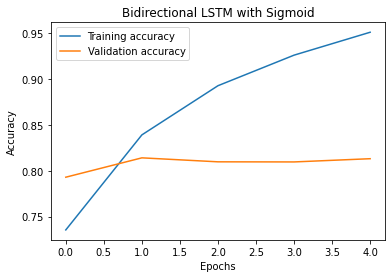

In [168]:
import matplotlib.pyplot as plt
plt.title("Bidirectional LSTM with Sigmoid")
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.legend(['Training accuracy', 'Validation accuracy'])
xlabel = plt.xlabel("Epochs")
ylabel = plt.ylabel("Accuracy")

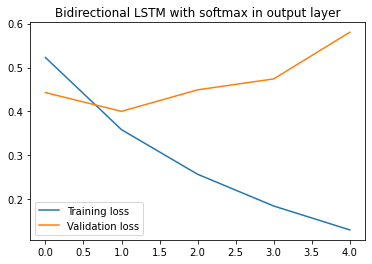

In [169]:
# plot loss
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.legend(['Training loss', 'Validation loss'])
plt.title("Bidirectional LSTM with softmax in output layer")
plt.legend(['Training loss', 'Validation loss'])
plt.show()

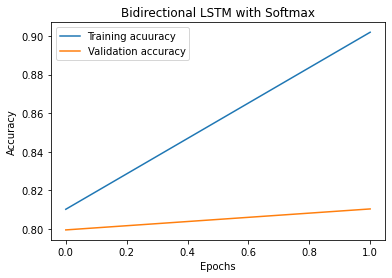

In [170]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
title = plt.title("History")
xlabel = plt.xlabel("Epochs")
ylabel = plt.ylabel("Accuracy")
plt.legend(['Training acuuracy', 'Validation accuracy'])
plt.title("Bidirectional LSTM with Softmax")
plt.show()

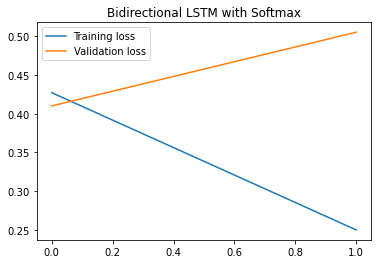

In [171]:
# plot loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training loss', 'Validation loss'])
plt.title("Bidirectional LSTM with Softmax")
plt.legend(['Training loss', 'Validation loss'])
plt.show()